# Music Genre Classification 

In this notebook I will implement and compare various classification algorithms, in order to classify music songs into music genres. 

I use the **GTZAN genre collection** dataset which contains 1000 songs (audio) and 10 different genres:

- blues
- classical
- country
- disco
- hip hop
- jazz
- metal
- pop
- reggae
- rock

## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

import os
import librosa
import pathlib
import csv
import itertools

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA

from keras import models
from keras import layers
from keras.wrappers.scikit_learn import KerasClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix

from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectFromModel

## Spectral features extraction

Spectral features extraction from audio files using librosa library and writing the data in a csv file.
Most functions of librosa return arrays containing values for each frame of the audio file, so in the csv file I write the mean and standard deviation of the arrays.

(This kernel needs to run only once, so as to create the data.csv.
**If data.csv already exists then skip this kernel**)

In [ ]:
#The column names of the csv file
header = 'file chroma_stft_mean chroma_stft_std chroma_cqt_mean chroma_cqt_std chroma_cens_mean chroma_cens_std rmse_mean rmse_std'
header += f' spectral_centroid_mean spectral_centroid_std spectral_contrast_mean spectral_contrast_std'
header += f' spectral_bandwidth_mean spectral_bandwidth_std spectral_flatness_mean spectral_flatness_std'
header += f' rolloff_mean roll_off_std zero_crossing_rate_mean  zero_crossing_rate_std tonnetz_mean tonnetz_std'
header += f' melspectrogram_mean melspectrogram_std tempo'

for i in range(1, 21):
    header += f' mfcc{i}_mean mfcc{i}_std'
header += ' genre'
header = header.split()

#write the header in csv file
data_file = open("data.csv", 'w', newline = '')
write = csv.writer(data_file)
write.writerow(header)
    
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

for genre in genres:
    path = f'./Data/genres_original/{genre}'; #getting the path for each genre
    
    for file in os.listdir(path):
        song = f'./Data/genres_original/{genre}/{file}'
        
        y,sr = librosa.load(song, mono = True, duration = 30)
        
        #extraction of features
        chroma_stft = librosa.feature.chroma_stft(y, sr)
        rms = librosa.feature.rms(y)
        spectral_centroid = librosa.feature.spectral_centroid(y, sr)
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y, sr)
        spectral_rolloff = librosa.feature.spectral_rolloff(y, sr)
        zero_cross_rate = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y, sr)
        mel = librosa.feature.melspectrogram(y, sr)
        tempo, beats = librosa.beat.beat_track(y, sr)
        cqt = librosa.feature.chroma_cqt(y, sr)
        cens = librosa.feature.chroma_cens(y, sr)
        contrast = librosa.feature.spectral_contrast(y, sr)
        flatness = librosa.feature.spectral_flatness(y)
        tonnetz = librosa.feature.tonnetz(y, sr)
        
        #all the above functions of librosa return arrays, so I'm going to use the mean of each array
        chroma_stft_mean = np.mean(chroma_stft)
        chroma_stft_std = np.std(chroma_stft)
        
        cqt_mean = np.mean(cqt)
        cqt_std = np.std(cqt)
        
        cens_mean = np.mean(cens)
        cens_std = np.std(cens)
        
        contrast_mean = np.mean(contrast)
        contrast_std = np.std(contrast)
        
        flatness_mean = np.mean(flatness)
        flatness_std = np.mean(flatness)
        
        tonnetz_mean =  np.mean(tonnetz)
        tonnetz_std = np.std(tonnetz)
        
        rms_mean = np.mean(rms)
        rms_std = np.std(rms)
        
        spectral_centroid_mean = np.mean(spectral_centroid)
        centroid_std = np.std(spectral_centroid)
        
        spectral_bandwidth_mean = np.mean(spectral_bandwidth)
        bandwidth_std = np.std(spectral_bandwidth)
        
        spectral_rolloff_mean = np.mean(spectral_rolloff)
        rolloff_std = np.std(spectral_rolloff)
        
        zero_cross_rate_mean = np.mean(zero_cross_rate)
        rate_std = np.std(zero_cross_rate)
        
        mel_mean = np.mean(mel)
        mel_std = np.std(mel)
        
        #begining of row for each song in data csv
        row = f'{file} {chroma_stft_mean} {chroma_stft_std} {cqt_mean} {cqt_std} {cens_mean} {cens_std} {rms_mean} {rms_std}'
        row += f' {spectral_centroid_mean} {centroid_std} {contrast_mean} {contrast_std} {spectral_bandwidth_mean} {bandwidth_std}'
        row += f' {flatness_mean} {flatness_std} {spectral_rolloff_mean} {rolloff_std} {zero_cross_rate_mean} {rate_std}'
        row += f' {tonnetz_mean} {tonnetz_std} {mel_mean} {mel_std} {tempo}'
        
        for i in mfcc: 
            row += f' {np.mean(i)} {np.std(i)}'
        
        row += f' {genre}' #end of row
        
        #write row in data_file
        write.writerow(row.split())

# Data

The first columns of the dataframe contain the features of each song and the last one contains its genre.

## The entire dataset

In [2]:
data = pd.read_csv('data.csv')
data.head()

,file,chroma_stft_mean,chroma_stft_std,chroma_cqt_mean,chroma_cqt_std,chroma_cens_mean,chroma_cens_std,rmse_mean,rmse_std,spectral_centroid_mean,spectral_centroid_std,spectral_contrast_mean,spectral_contrast_std,spectral_bandwidth_mean,spectral_bandwidth_std,spectral_flatness_mean,spectral_flatness_std,rolloff_mean,roll_off_std,zero_crossing_rate_mean,zero_crossing_rate_std,tonnetz_mean,tonnetz_std,melspectrogram_mean,melspectrogram_std,tempo,mfcc1_mean,mfcc1_std,mfcc2_mean,mfcc2_std,mfcc3_mean,mfcc3_std,mfcc4_mean,mfcc4_std,mfcc5_mean,mfcc5_std,mfcc6_mean,mfcc6_std,mfcc7_mean,mfcc7_std,mfcc8_mean,mfcc8_std,mfcc9_mean,mfcc9_std,mfcc10_mean,mfcc10_std,mfcc11_mean,mfcc11_std,mfcc12_mean,mfcc12_std,mfcc13_mean,mfcc13_std,mfcc14_mean,mfcc14_std,mfcc15_mean,mfcc15_std,mfcc16_mean,mfcc16_std,mfcc17_mean,mfcc17_std,mfcc18_mean,mfcc18_std,mfcc19_mean,mfcc19_std,mfcc20_mean,mfcc20_std,genre
0,blues.00000.wav,0.349943,0.297926,0.549554,0.249445,0.273436,0.092554,0.130225,0.053187,1784.420446,360.263361,20.530733,8.761009,2002.650192,293.081963,0.004499,0.005515,3806.485316,949.558806,0.083066,0.027690,0.001620,0.052834,4.425312,27.208088,123.046875,-113.596748,50.648819,121.557297,17.200907,-19.158825,15.350781,42.351032,12.284883,-6.376458,12.957100,18.618876,9.445806,-13.697911,8.225036,15.344631,8.305549,-12.285267,9.061618,10.980492,7.963517,-8.324325,7.862141,8.810669,7.157400,-3.667368,6.422199,5.751691,6.369078,-5.162763,7.057898,0.750948,7.242872,-1.691938,6.045715,-0.409953,6.453122,-2.300209,7.422605,1.219929,6.853561,blues
1,blues.00001.wav,0.340983,0.308190,0.503215,0.275228,0.261366,0.122560,0.095918,0.048718,1529.835316,613.175361,20.676334,8.239387,2038.617579,462.379133,0.002294,0.004852,3548.820207,1725.249654,0.056044,0.038059,0.014103,0.060666,2.653045,17.325918,67.999589,-207.556793,88.128441,124.006721,23.673832,8.930560,23.929262,35.874687,16.269915,2.916037,16.735912,21.523726,12.507801,-8.554704,14.177411,23.358671,11.936523,-10.103617,12.894725,11.903744,10.219956,-5.560388,10.262492,5.376803,9.812361,-2.239120,8.055376,4.216963,8.554978,-6.012273,7.243463,0.936109,7.440762,-0.716537,7.752874,0.293876,6.939540,-0.287431,7.150418,0.531573,6.769421,blues
2,blues.00002.wav,0.363603,0.292039,0.515355,0.254191,0.267732,0.107949,0.175573,0.052423,1552.481958,395.634070,22.197265,8.727204,1747.165985,275.765675,0.002628,0.003344,3040.514948,884.938380,0.076301,0.031738,0.015280,0.062711,7.256842,29.526804,161.499023,-90.754387,57.625790,140.459900,22.560396,-29.109964,20.292446,31.689013,12.007209,-13.987036,12.476018,25.754759,8.631958,-13.649587,10.334653,11.629272,10.323798,-11.780589,8.098292,9.706442,8.235600,-13.123111,7.596487,5.789265,8.033045,-8.905224,7.774160,-1.083720,7.597540,-9.218358,6.040387,2.455806,6.372683,-7.726901,6.904747,-1.815723,7.240519,-3.433434,6.828190,-2.226821,5.529573,blues
3,blues.00003.wav,0.404779,0.306609,0.400808,0.298868,0.238640,0.162432,0.141191,0.079617,1070.119953,429.532791,21.428764,7.962859,1596.333948,408.119547,0.000953,0.001632,2185.028454,1222.395194,0.033309,0.020569,0.006361,0.084797,6.214398,68.663216,63.024009,-199.431152,74.130104,150.099213,21.372362,5.647593,16.033262,26.871927,12.576813,1.754461,16.366770,14.238345,11.263586,-4.830883,12.491242,9.297966,9.008868,-0.757742,9.601002,8.149013,8.438341,-3.196314,10.502338,6.087676,6.942457,-2.476421,7.538023,-1.073890,7.893013,-2.874778,7.188340,0.780977,6.667844,-3.316932,7.087621,0.637982,6.111055,-0.619690,6.107267,-3.408233,5.654808,blues
4,blues.00004.wav,0.308590,0.296395,0.521289,0.253760,0.266510,0.110932,0.091563,0.047996,1835.494603,585.961468,21.467739,7.938795,1748.362448,297.432368,0.003239,0.004358,3580.945013,1253.915665,0.101500,0.044199,-0.036906,0.069321,2.107707,12.870579,135.999178,-160.266037,72.061447,126.198807,29.221142,-35.605450,18.266085,22.153301,13.912118,-32.489269,18.341211,10.864513,11.607741,-23.357929,9.658837,0.503118,11.168602,-11.805832,11.400601,1.206805,9.987700,-13.083821,8.962

In [3]:
data = data.drop(columns = ['file'])
data.head()

,chroma_stft_mean,chroma_stft_std,chroma_cqt_mean,chroma_cqt_std,chroma_cens_mean,chroma_cens_std,rmse_mean,rmse_std,spectral_centroid_mean,spectral_centroid_std,spectral_contrast_mean,spectral_contrast_std,spectral_bandwidth_mean,spectral_bandwidth_std,spectral_flatness_mean,spectral_flatness_std,rolloff_mean,roll_off_std,zero_crossing_rate_mean,zero_crossing_rate_std,tonnetz_mean,tonnetz_std,melspectrogram_mean,melspectrogram_std,tempo,mfcc1_mean,mfcc1_std,mfcc2_mean,mfcc2_std,mfcc3_mean,mfcc3_std,mfcc4_mean,mfcc4_std,mfcc5_mean,mfcc5_std,mfcc6_mean,mfcc6_std,mfcc7_mean,mfcc7_std,mfcc8_mean,mfcc8_std,mfcc9_mean,mfcc9_std,mfcc10_mean,mfcc10_std,mfcc11_mean,mfcc11_std,mfcc12_mean,mfcc12_std,mfcc13_mean,mfcc13_std,mfcc14_mean,mfcc14_std,mfcc15_mean,mfcc15_std,mfcc16_mean,mfcc16_std,mfcc17_mean,mfcc17_std,mfcc18_mean,mfcc18_std,mfcc19_mean,mfcc19_std,mfcc20_mean,mfcc20_std,genre
0,0.349943,0.297926,0.549554,0.249445,0.273436,0.092554,0.130225,0.053187,1784.420446,360.263361,20.530733,8.761009,2002.650192,293.081963,0.004499,0.005515,3806.485316,949.558806,0.083066,0.027690,0.001620,0.052834,4.425312,27.208088,123.046875,-113.596748,50.648819,121.557297,17.200907,-19.158825,15.350781,42.351032,12.284883,-6.376458,12.957100,18.618876,9.445806,-13.697911,8.225036,15.344631,8.305549,-12.285267,9.061618,10.980492,7.963517,-8.324325,7.862141,8.810669,7.157400,-3.667368,6.422199,5.751691,6.369078,-5.162763,7.057898,0.750948,7.242872,-1.691938,6.045715,-0.409953,6.453122,-2.300209,7.422605,1.219929,6.853561,blues
1,0.340983,0.308190,0.503215,0.275228,0.261366,0.122560,0.095918,0.048718,1529.835316,613.175361,20.676334,8.239387,2038.617579,462.379133,0.002294,0.004852,3548.820207,1725.249654,0.056044,0.038059,0.014103,0.060666,2.653045,17.325918,67.999589,-207.556793,88.128441,124.006721,23.673832,8.930560,23.929262,35.874687,16.269915,2.916037,16.735912,21.523726,12.507801,-8.554704,14.177411,23.358671,11.936523,-10.103617,12.894725,11.903744,10.219956,-5.560388,10.262492,5.376803,9.812361,-2.239120,8.055376,4.216963,8.554978,-6.012273,7.243463,0.936109,7.440762,-0.716537,7.752874,0.293876,6.939540,-0.287431,7.150418,0.531573,6.769421,blues
2,0.363603,0.292039,0.515355,0.254191,0.267732,0.107949,0.175573,0.052423,1552.481958,395.634070,22.197265,8.727204,1747.165985,275.765675,0.002628,0.003344,3040.514948,884.938380,0.076301,0.031738,0.015280,0.062711,7.256842,29.526804,161.499023,-90.754387,57.625790,140.459900,22.560396,-29.109964,20.292446,31.689013,12.007209,-13.987036,12.476018,25.754759,8.631958,-13.649587,10.334653,11.629272,10.323798,-11.780589,8.098292,9.706442,8.235600,-13.123111,7.596487,5.789265,8.033045,-8.905224,7.774160,-1.083720,7.597540,-9.218358,6.040387,2.455806,6.372683,-7.726901,6.904747,-1.815723,7.240519,-3.433434,6.828190,-2.226821,5.529573,blues
3,0.404779,0.306609,0.400808,0.298868,0.238640,0.162432,0.141191,0.079617,1070.119953,429.532791,21.428764,7.962859,1596.333948,408.119547,0.000953,0.001632,2185.028454,1222.395194,0.033309,0.020569,0.006361,0.084797,6.214398,68.663216,63.024009,-199.431152,74.130104,150.099213,21.372362,5.647593,16.033262,26.871927,12.576813,1.754461,16.366770,14.238345,11.263586,-4.830883,12.491242,9.297966,9.008868,-0.757742,9.601002,8.149013,8.438341,-3.196314,10.502338,6.087676,6.942457,-2.476421,7.538023,-1.073890,7.893013,-2.874778,7.188340,0.780977,6.667844,-3.316932,7.087621,0.637982,6.111055,-0.619690,6.107267,-3.408233,5.654808,blues
4,0.308590,0.296395,0.521289,0.253760,0.266510,0.110932,0.091563,0.047996,1835.494603,585.961468,21.467739,7.938795,1748.362448,297.432368,0.003239,0.004358,3580.945013,1253.915665,0.101500,0.044199,-0.036906,0.069321,2.107707,12.870579,135.999178,-160.266037,72.061447,126.198807,29.221142,-35.605450,18.266085,22.153301,13.912118,-32.489269,18.341211,10.864513,11.607741,-23.357929,9.658837,0.503118,11.168602,-11.805832,11.400601,1.206805,9.987700,-13.083821,8.962363,-2.806383,9.298362,-6.934123,9.466887,-7.558618,8.423469,-9.173553,8.702869,-4.51

In [4]:
data.shape

(999, 66)

In order to perform classification, the column "genre" (label) must be transformed into numeric.

In [5]:
label_encoder = LabelEncoder()

genres = data.iloc[:, -1] #last column

label_encoder.fit(genres)

#transform genres into numeric values and add them in the dataframe
numeric_genres = label_encoder.transform(genres) 
data['numeric_genres'] = numeric_genres

data.head()

,chroma_stft_mean,chroma_stft_std,chroma_cqt_mean,chroma_cqt_std,chroma_cens_mean,chroma_cens_std,rmse_mean,rmse_std,spectral_centroid_mean,spectral_centroid_std,spectral_contrast_mean,spectral_contrast_std,spectral_bandwidth_mean,spectral_bandwidth_std,spectral_flatness_mean,spectral_flatness_std,rolloff_mean,roll_off_std,zero_crossing_rate_mean,zero_crossing_rate_std,tonnetz_mean,tonnetz_std,melspectrogram_mean,melspectrogram_std,tempo,mfcc1_mean,mfcc1_std,mfcc2_mean,mfcc2_std,mfcc3_mean,mfcc3_std,mfcc4_mean,mfcc4_std,mfcc5_mean,mfcc5_std,mfcc6_mean,mfcc6_std,mfcc7_mean,mfcc7_std,mfcc8_mean,mfcc8_std,mfcc9_mean,mfcc9_std,mfcc10_mean,mfcc10_std,mfcc11_mean,mfcc11_std,mfcc12_mean,mfcc12_std,mfcc13_mean,mfcc13_std,mfcc14_mean,mfcc14_std,mfcc15_mean,mfcc15_std,mfcc16_mean,mfcc16_std,mfcc17_mean,mfcc17_std,mfcc18_mean,mfcc18_std,mfcc19_mean,mfcc19_std,mfcc20_mean,mfcc20_std,genre,numeric_genres
0,0.349943,0.297926,0.549554,0.249445,0.273436,0.092554,0.130225,0.053187,1784.420446,360.263361,20.530733,8.761009,2002.650192,293.081963,0.004499,0.005515,3806.485316,949.558806,0.083066,0.027690,0.001620,0.052834,4.425312,27.208088,123.046875,-113.596748,50.648819,121.557297,17.200907,-19.158825,15.350781,42.351032,12.284883,-6.376458,12.957100,18.618876,9.445806,-13.697911,8.225036,15.344631,8.305549,-12.285267,9.061618,10.980492,7.963517,-8.324325,7.862141,8.810669,7.157400,-3.667368,6.422199,5.751691,6.369078,-5.162763,7.057898,0.750948,7.242872,-1.691938,6.045715,-0.409953,6.453122,-2.300209,7.422605,1.219929,6.853561,blues,0
1,0.340983,0.308190,0.503215,0.275228,0.261366,0.122560,0.095918,0.048718,1529.835316,613.175361,20.676334,8.239387,2038.617579,462.379133,0.002294,0.004852,3548.820207,1725.249654,0.056044,0.038059,0.014103,0.060666,2.653045,17.325918,67.999589,-207.556793,88.128441,124.006721,23.673832,8.930560,23.929262,35.874687,16.269915,2.916037,16.735912,21.523726,12.507801,-8.554704,14.177411,23.358671,11.936523,-10.103617,12.894725,11.903744,10.219956,-5.560388,10.262492,5.376803,9.812361,-2.239120,8.055376,4.216963,8.554978,-6.012273,7.243463,0.936109,7.440762,-0.716537,7.752874,0.293876,6.939540,-0.287431,7.150418,0.531573,6.769421,blues,0
2,0.363603,0.292039,0.515355,0.254191,0.267732,0.107949,0.175573,0.052423,1552.481958,395.634070,22.197265,8.727204,1747.165985,275.765675,0.002628,0.003344,3040.514948,884.938380,0.076301,0.031738,0.015280,0.062711,7.256842,29.526804,161.499023,-90.754387,57.625790,140.459900,22.560396,-29.109964,20.292446,31.689013,12.007209,-13.987036,12.476018,25.754759,8.631958,-13.649587,10.334653,11.629272,10.323798,-11.780589,8.098292,9.706442,8.235600,-13.123111,7.596487,5.789265,8.033045,-8.905224,7.774160,-1.083720,7.597540,-9.218358,6.040387,2.455806,6.372683,-7.726901,6.904747,-1.815723,7.240519,-3.433434,6.828190,-2.226821,5.529573,blues,0
3,0.404779,0.306609,0.400808,0.298868,0.238640,0.162432,0.141191,0.079617,1070.119953,429.532791,21.428764,7.962859,1596.333948,408.119547,0.000953,0.001632,2185.028454,1222.395194,0.033309,0.020569,0.006361,0.084797,6.214398,68.663216,63.024009,-199.431152,74.130104,150.099213,21.372362,5.647593,16.033262,26.871927,12.576813,1.754461,16.366770,14.238345,11.263586,-4.830883,12.491242,9.297966,9.008868,-0.757742,9.601002,8.149013,8.438341,-3.196314,10.502338,6.087676,6.942457,-2.476421,7.538023,-1.073890,7.893013,-2.874778,7.188340,0.780977,6.667844,-3.316932,7.087621,0.637982,6.111055,-0.619690,6.107267,-3.408233,5.654808,blues,0
4,0.308590,0.296395,0.521289,0.253760,0.266510,0.110932,0.091563,0.047996,1835.494603,585.961468,21.467739,7.938795,1748.362448,297.432368,0.003239,0.004358,3580.945013,1253.915665,0.101500,0.044199,-0.036906,0.069321,2.107707,12.870579,135.999178,-160.266037,72.061447,126.198807,29.221142,-35.605450,18.266085,22.153301,13.912118,-32.489269,18.341211,10.864513,11.607741,-23.357929,9.658837,0.503118,11.168602,-11.805832,11.400601,1.206805,9.987700,-13.083821,8.962363,-2.806383,9.298362,-6.934123,9.466887,-7.558618,8.423469,-

Scaling the data and splitting them into training and test sets

In [6]:
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
train_set, test_set = pd.DataFrame(), pd.DataFrame()

for genre in genres:
    train_set_genre, test_set_genre =  train_test_split(data.loc[data['genre'] == genre], test_size = 0.1)
    train_set = train_set.append(train_set_genre)
    test_set = test_set.append(test_set_genre)

In [7]:
scaler = StandardScaler()
x_train = scaler.fit_transform(np.array(train_set.iloc[:, :-2], dtype = float))
x_test = scaler.fit_transform(np.array(test_set.iloc[:, :-2], dtype = float))

y_train = train_set['numeric_genres']
y_test = test_set['numeric_genres']

## Remove features that are highly correlated to other features
Correlation between features

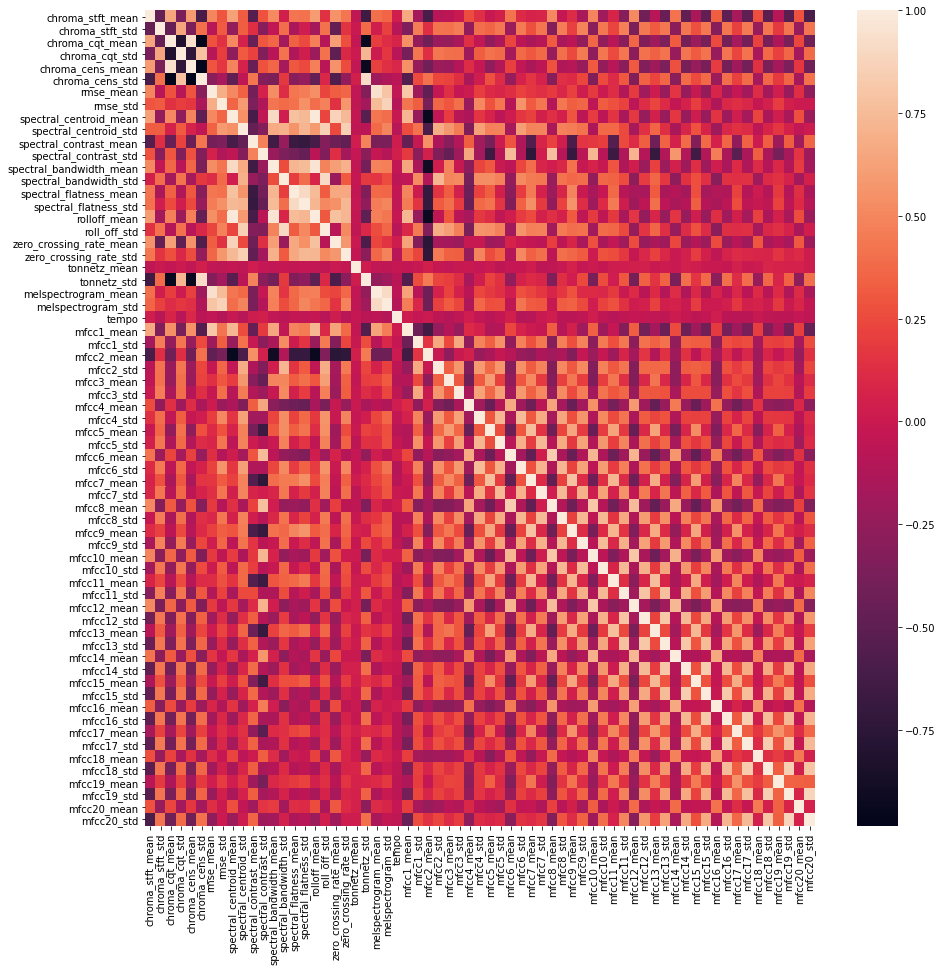

In [ ]:
features = data.iloc[:, :-2]
corr_matrix = features = features.corr()

fig, ax = plt.subplots(figsize=(15,15))  
sn.heatmap(corr_matrix, ax =  ax)

Find highly correlated features

In [ ]:
correlated_features = []

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i,j]) >= 0.85:
            col_name = corr_matrix.columns[i]
            
            if col_name not in correlated_features:
                correlated_features.append(col_name)
correlated_features

['chroma_cens_mean',
 'chroma_cens_std',
 'spectral_bandwidth_mean',
 'spectral_flatness_std',
 'rolloff_mean',
 'roll_off_std',
 'zero_crossing_rate_mean',
 'tonnetz_std',
 'melspectrogram_mean',
 'melspectrogram_std',
 'mfcc2_mean',
 'mfcc20_std']

In [ ]:
data_without_corr = data.drop(columns = correlated_features)
data_without_corr.head()

,chroma_stft_mean,chroma_stft_std,chroma_cqt_mean,chroma_cqt_std,rmse_mean,rmse_std,spectral_centroid_mean,spectral_centroid_std,spectral_contrast_mean,spectral_contrast_std,spectral_bandwidth_std,spectral_flatness_mean,zero_crossing_rate_std,tonnetz_mean,tempo,mfcc1_mean,mfcc1_std,mfcc2_std,mfcc3_mean,mfcc3_std,mfcc4_mean,mfcc4_std,mfcc5_mean,mfcc5_std,mfcc6_mean,mfcc6_std,mfcc7_mean,mfcc7_std,mfcc8_mean,mfcc8_std,mfcc9_mean,mfcc9_std,mfcc10_mean,mfcc10_std,mfcc11_mean,mfcc11_std,mfcc12_mean,mfcc12_std,mfcc13_mean,mfcc13_std,mfcc14_mean,mfcc14_std,mfcc15_mean,mfcc15_std,mfcc16_mean,mfcc16_std,mfcc17_mean,mfcc17_std,mfcc18_mean,mfcc18_std,mfcc19_mean,mfcc19_std,mfcc20_mean,genre,numeric_genres
0,0.349943,0.297926,0.549554,0.249445,0.130225,0.053187,1784.420446,360.263361,20.530733,8.761009,293.081963,0.004499,0.027690,0.001620,123.046875,-113.596748,50.648819,17.200907,-19.158825,15.350781,42.351032,12.284883,-6.376458,12.957100,18.618876,9.445806,-13.697911,8.225036,15.344631,8.305549,-12.285267,9.061618,10.980492,7.963517,-8.324325,7.862141,8.810669,7.157400,-3.667368,6.422199,5.751691,6.369078,-5.162763,7.057898,0.750948,7.242872,-1.691938,6.045715,-0.409953,6.453122,-2.300209,7.422605,1.219929,blues,0
1,0.340983,0.308190,0.503215,0.275228,0.095918,0.048718,1529.835316,613.175361,20.676334,8.239387,462.379133,0.002294,0.038059,0.014103,67.999589,-207.556793,88.128441,23.673832,8.930560,23.929262,35.874687,16.269915,2.916037,16.735912,21.523726,12.507801,-8.554704,14.177411,23.358671,11.936523,-10.103617,12.894725,11.903744,10.219956,-5.560388,10.262492,5.376803,9.812361,-2.239120,8.055376,4.216963,8.554978,-6.012273,7.243463,0.936109,7.440762,-0.716537,7.752874,0.293876,6.939540,-0.287431,7.150418,0.531573,blues,0
2,0.363603,0.292039,0.515355,0.254191,0.175573,0.052423,1552.481958,395.634070,22.197265,8.727204,275.765675,0.002628,0.031738,0.015280,161.499023,-90.754387,57.625790,22.560396,-29.109964,20.292446,31.689013,12.007209,-13.987036,12.476018,25.754759,8.631958,-13.649587,10.334653,11.629272,10.323798,-11.780589,8.098292,9.706442,8.235600,-13.123111,7.596487,5.789265,8.033045,-8.905224,7.774160,-1.083720,7.597540,-9.218358,6.040387,2.455806,6.372683,-7.726901,6.904747,-1.815723,7.240519,-3.433434,6.828190,-2.226821,blues,0
3,0.404779,0.306609,0.400808,0.298868,0.141191,0.079617,1070.119953,429.532791,21.428764,7.962859,408.119547,0.000953,0.020569,0.006361,63.024009,-199.431152,74.130104,21.372362,5.647593,16.033262,26.871927,12.576813,1.754461,16.366770,14.238345,11.263586,-4.830883,12.491242,9.297966,9.008868,-0.757742,9.601002,8.149013,8.438341,-3.196314,10.502338,6.087676,6.942457,-2.476421,7.538023,-1.073890,7.893013,-2.874778,7.188340,0.780977,6.667844,-3.316932,7.087621,0.637982,6.111055,-0.619690,6.107267,-3.408233,blues,0
4,0.308590,0.296395,0.521289,0.253760,0.091563,0.047996,1835.494603,585.961468,21.467739,7.938795,297.432368,0.003239,0.044199,-0.036906,135.999178,-160.266037,72.061447,29.221142,-35.605450,18.266085,22.153301,13.912118,-32.489269,18.341211,10.864513,11.607741,-23.357929,9.658837,0.503118,11.168602,-11.805832,11.400601,1.206805,9.987700,-13.083821,8.962363,-2.806383,9.298362,-6.934123,9.466887,-7.558618,8.423469,-9.173553,8.702869,-4.512165,9.275314,-5.453538,8.679119,-0.924161,7.320083,-4.409332,7.932865,-11.703781,blues,0


In [ ]:
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
train_set, test_set = pd.DataFrame(), pd.DataFrame()

for genre in genres:
    train_set_genre, test_set_genre =  train_test_split(data_without_corr.loc[data['genre'] == genre], test_size = 0.1)
    train_set = train_set.append(train_set_genre)
    test_set = test_set.append(test_set_genre)

In [ ]:
scaler = StandardScaler()
scaler.fit(np.array(train_set.iloc[:, :-2], dtype = float))
scaler.fit(np.array(test_set.iloc[:, :-2], dtype = float))

x_train_wcorr = scaler.transform(np.array(train_set.iloc[:, :-2], dtype = float))
x_test_wcorr = scaler.transform(np.array(test_set.iloc[:, :-2], dtype = float))
y_train_wcorr = train_set['numeric_genres']
y_test_wcorr = test_set['numeric_genres']

## Principal Component Analysis (PCA)

In [8]:
pca = PCA(n_components = 'mle', svd_solver = 'full')
pca.fit(x_train)
pca.fit(x_test)

x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)
x_train_pca.shape

(899, 20)

## Linear Discriminant Analysis (LDA)

In [9]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train, y_train)
lda.fit(x_test, y_test)

x_train_lda = lda.transform(x_train)
x_test_lda = lda.transform(x_test)
x_train_lda.shape

(899, 9)


# Classification Algorithms

Functions to visualize the results, by plotting confusion matrixes and printing the classification reports.

In [13]:
class_names = ['Blues', 'Classical', 'Country', 'Disco', 'Hiphop', 'Jazz', 'Metal', 'Pop', 'Reggae', 'Rock']

def print_results(classifier,x_test, y_test, predictions):
    titles = [('Confusion matrix', None), ('Normalized confusion matrix', 'true')]
    
    for title, norm in titles:
        fig, ax = plt.subplots(figsize=(9, 9))
        disp = plot_confusion_matrix(classifier, x_test, y_test, display_labels = class_names,
                                   cmap = plt.cm.Blues, normalize = norm, ax = ax)
        
        disp.ax_.set_title(title)
        plt.show()
    
    score = accuracy_score(y_test, predictions)
    print(f"Accuracy score: {score} \n")
    
    report = classification_report(y_test, predictions)
    print("Classification Report")
    print(report)

In [14]:
class_names = ['Blues', 'Classical', 'Country', 'Disco', 'Hiphop', 'Jazz', 'Metal', 'Pop', 'Reggae', 'Rock']

def print_results_NN(y_test, y_pred):
    
    cm = confusion_matrix(y_test, y_pred)
    
    for norm in [False, True] :
        if norm:
            plt.figure(figsize=(8,8))
            plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
            plt.title("Normalized confusion matrix")
            plt.colorbar()
            tick_marks = np.arange(len(class_names))
            plt.xticks(tick_marks, class_names, rotation=0)
            plt.yticks(tick_marks, class_names)
            
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            
            thresh = cm.max() / 2.
            for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
                plt.text(j, i, round(cm[i, j], 3),
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")

            plt.tight_layout()
            plt.ylabel('True label')
            plt.xlabel('Predicted label')
            plt.show()
            
        else: 
            plt.figure(figsize=(8,8))
            plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
            plt.title('Confusion matrix')
            plt.colorbar()
            tick_marks = np.arange(len(class_names))
            plt.xticks(tick_marks, class_names, rotation=0)
            plt.yticks(tick_marks, class_names)
            
            thresh = cm.max() / 2.
            for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
                plt.text(j, i, cm[i, j],
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")

            plt.tight_layout()
            plt.ylabel('True label')
            plt.xlabel('Predicted label')
            plt.show()
            
    score = accuracy_score(y_test, predictions)
    print(f"Accuracy score: {score} \n")
    
    report = classification_report(y_test, predictions)
    print("Classification Report")
    print(report)

## Naive Bayes

### All features

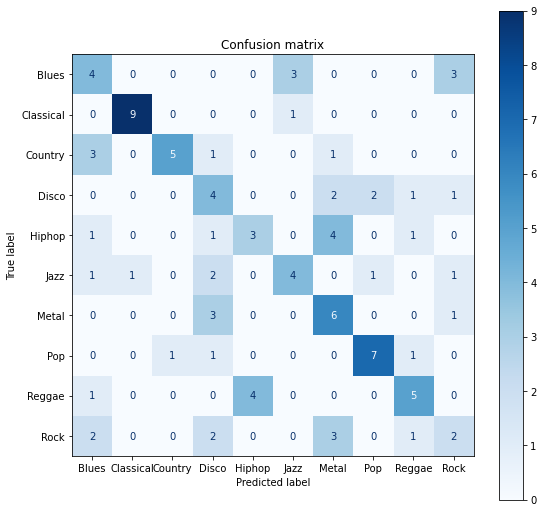

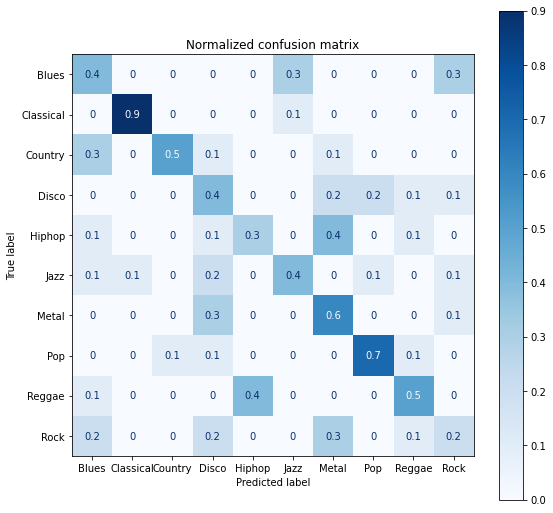

Accuracy score: 0.49 

Classification Report
              precision    recall  f1-score   support

           0       0.33      0.40      0.36        10
           1       0.90      0.90      0.90        10
           2       0.83      0.50      0.62        10
           3       0.29      0.40      0.33        10
           4       0.43      0.30      0.35        10
           5       0.50      0.40      0.44        10
           6       0.38      0.60      0.46        10
           7       0.70      0.70      0.70        10
           8       0.56      0.50      0.53        10
           9       0.25      0.20      0.22        10

    accuracy                           0.49       100
   macro avg       0.52      0.49      0.49       100
weighted avg       0.52      0.49      0.49       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train, y_train)

y_pred = nb.predict(x_test)

print_results(nb,x_test, y_test , y_pred)

### Without highly correlated features

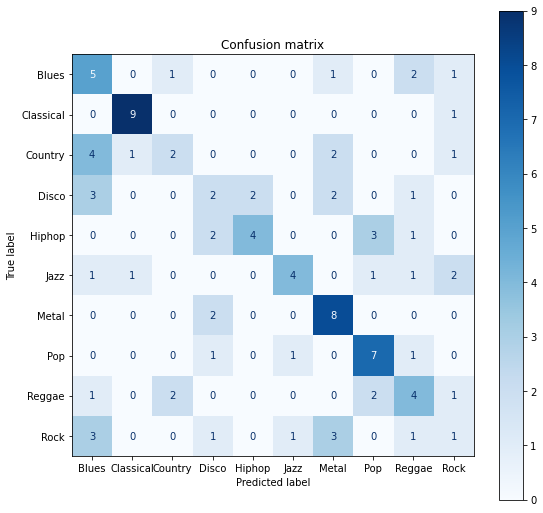

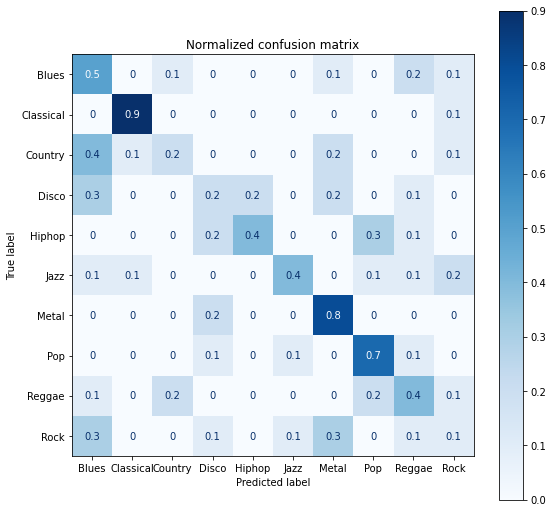

Accuracy score: 0.46 

Classification Report
              precision    recall  f1-score   support

           0       0.29      0.50      0.37        10
           1       0.82      0.90      0.86        10
           2       0.40      0.20      0.27        10
           3       0.25      0.20      0.22        10
           4       0.67      0.40      0.50        10
           5       0.67      0.40      0.50        10
           6       0.50      0.80      0.62        10
           7       0.54      0.70      0.61        10
           8       0.36      0.40      0.38        10
           9       0.14      0.10      0.12        10

    accuracy                           0.46       100
   macro avg       0.46      0.46      0.44       100
weighted avg       0.46      0.46      0.44       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_wcorr, y_train_wcorr)

y_pred = nb.predict(x_test_wcorr)

print_results(nb,x_test_wcorr, y_test_wcorr , y_pred)

### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

Number of features is now reduced to 30 from 65.

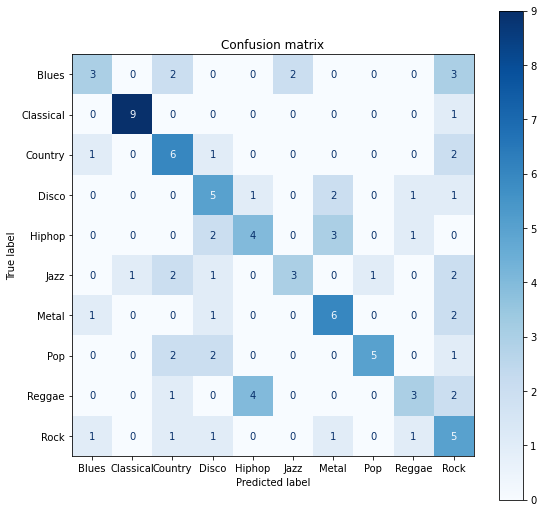

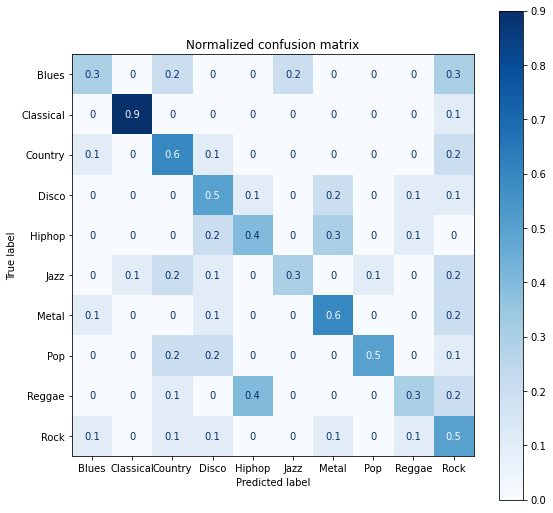

Accuracy score: 0.49 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.30      0.37        10
           1       0.90      0.90      0.90        10
           2       0.43      0.60      0.50        10
           3       0.38      0.50      0.43        10
           4       0.44      0.40      0.42        10
           5       0.60      0.30      0.40        10
           6       0.50      0.60      0.55        10
           7       0.83      0.50      0.62        10
           8       0.50      0.30      0.37        10
           9       0.26      0.50      0.34        10

    accuracy                           0.49       100
   macro avg       0.54      0.49      0.49       100
weighted avg       0.54      0.49      0.49       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_sel, y_train)

y_pred = nb.predict(x_test_sel)

print_results(nb,x_test_sel, y_test , y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

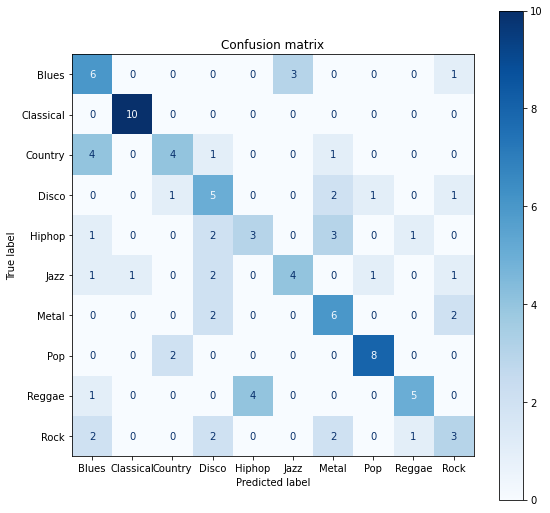

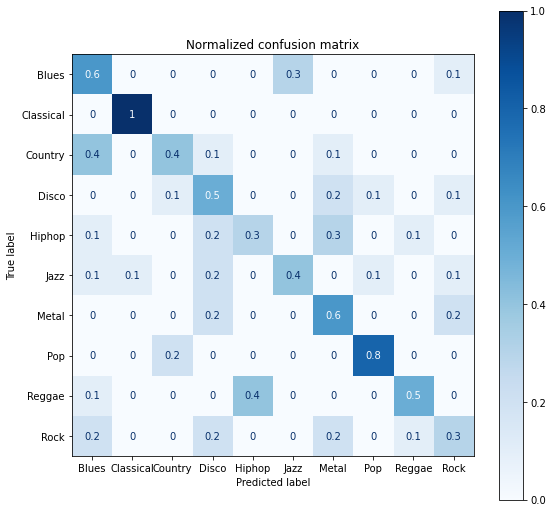

Accuracy score: 0.54 

Classification Report
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        10
           1       0.91      1.00      0.95        10
           2       0.57      0.40      0.47        10
           3       0.36      0.50      0.42        10
           4       0.43      0.30      0.35        10
           5       0.57      0.40      0.47        10
           6       0.43      0.60      0.50        10
           7       0.80      0.80      0.80        10
           8       0.71      0.50      0.59        10
           9       0.38      0.30      0.33        10

    accuracy                           0.54       100
   macro avg       0.56      0.54      0.54       100
weighted avg       0.56      0.54      0.54       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

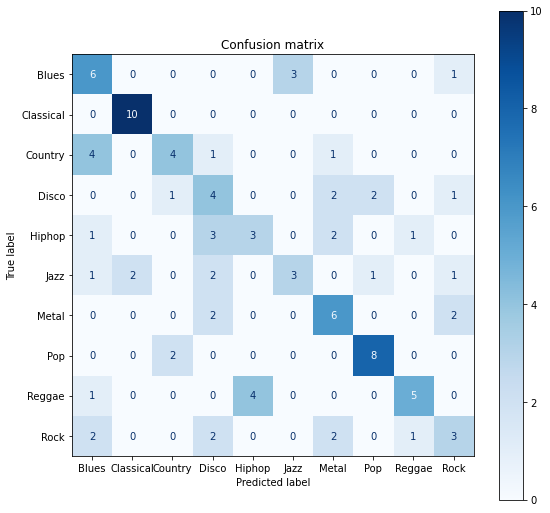

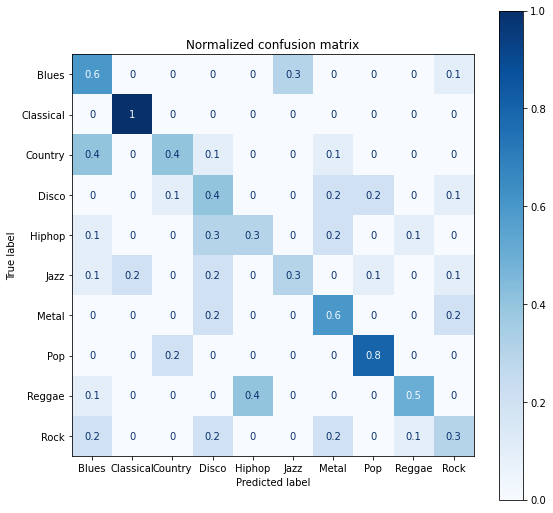

Accuracy score: 0.52 

Classification Report
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        10
           1       0.83      1.00      0.91        10
           2       0.57      0.40      0.47        10
           3       0.29      0.40      0.33        10
           4       0.43      0.30      0.35        10
           5       0.50      0.30      0.37        10
           6       0.46      0.60      0.52        10
           7       0.73      0.80      0.76        10
           8       0.71      0.50      0.59        10
           9       0.38      0.30      0.33        10

    accuracy                           0.52       100
   macro avg       0.53      0.52      0.51       100
weighted avg       0.53      0.52      0.51       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

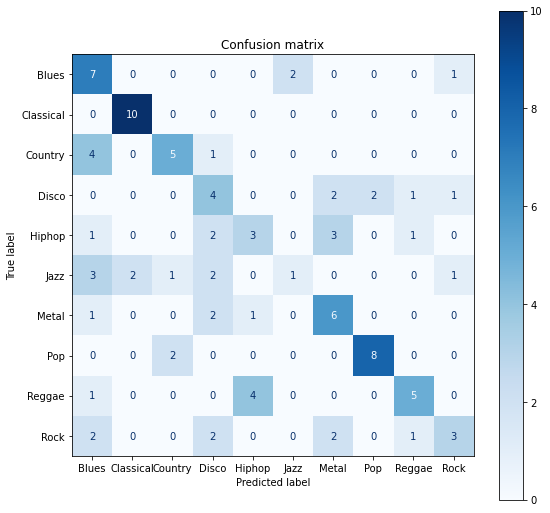

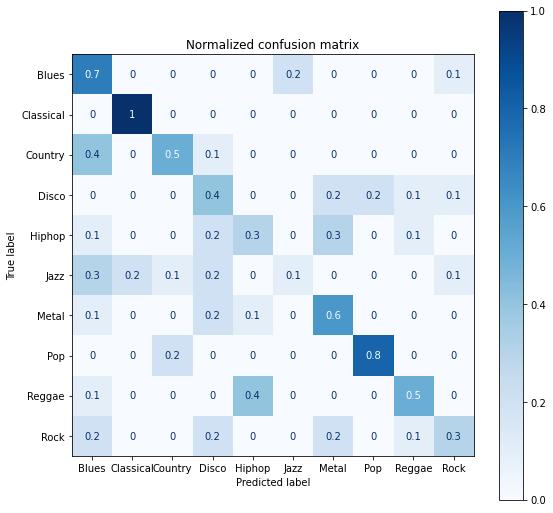

Accuracy score: 0.52 

Classification Report
              precision    recall  f1-score   support

           0       0.37      0.70      0.48        10
           1       0.83      1.00      0.91        10
           2       0.62      0.50      0.56        10
           3       0.31      0.40      0.35        10
           4       0.38      0.30      0.33        10
           5       0.33      0.10      0.15        10
           6       0.46      0.60      0.52        10
           7       0.80      0.80      0.80        10
           8       0.62      0.50      0.56        10
           9       0.50      0.30      0.37        10

    accuracy                           0.52       100
   macro avg       0.52      0.52      0.50       100
weighted avg       0.52      0.52      0.50       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

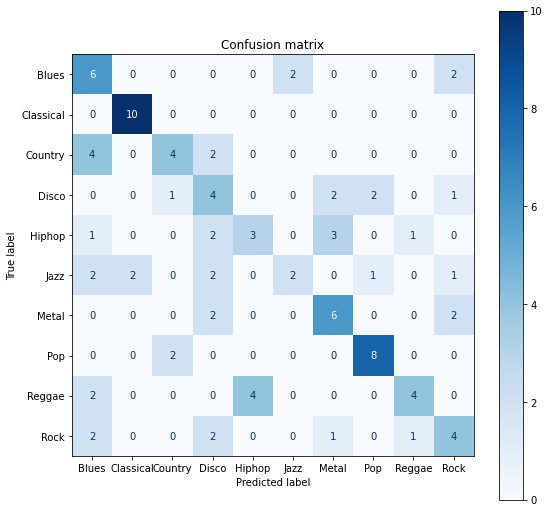

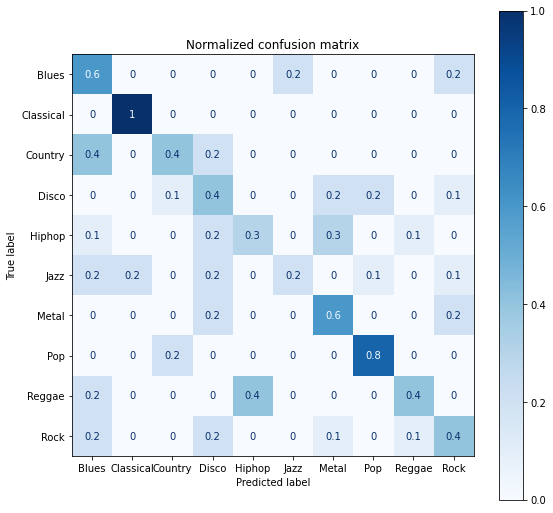

Accuracy score: 0.51 

Classification Report
              precision    recall  f1-score   support

           0       0.35      0.60      0.44        10
           1       0.83      1.00      0.91        10
           2       0.57      0.40      0.47        10
           3       0.29      0.40      0.33        10
           4       0.43      0.30      0.35        10
           5       0.50      0.20      0.29        10
           6       0.50      0.60      0.55        10
           7       0.73      0.80      0.76        10
           8       0.67      0.40      0.50        10
           9       0.40      0.40      0.40        10

    accuracy                           0.51       100
   macro avg       0.53      0.51      0.50       100
weighted avg       0.53      0.51      0.50       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

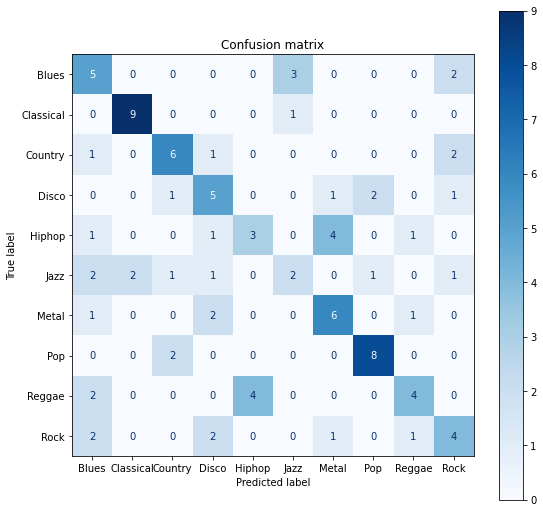

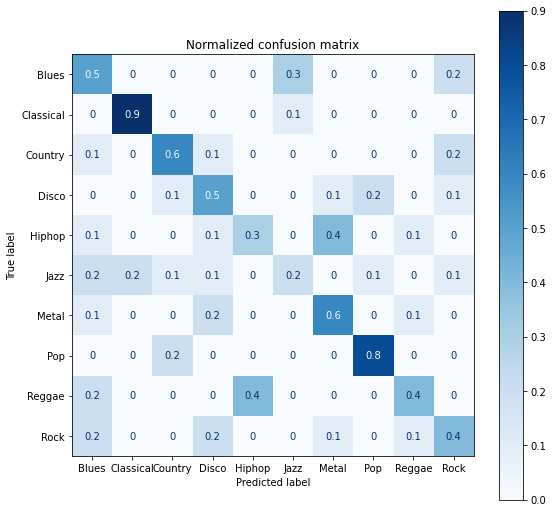

Accuracy score: 0.52 

Classification Report
              precision    recall  f1-score   support

           0       0.36      0.50      0.42        10
           1       0.82      0.90      0.86        10
           2       0.60      0.60      0.60        10
           3       0.42      0.50      0.45        10
           4       0.43      0.30      0.35        10
           5       0.33      0.20      0.25        10
           6       0.50      0.60      0.55        10
           7       0.73      0.80      0.76        10
           8       0.57      0.40      0.47        10
           9       0.40      0.40      0.40        10

    accuracy                           0.52       100
   macro avg       0.52      0.52      0.51       100
weighted avg       0.52      0.52      0.51       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

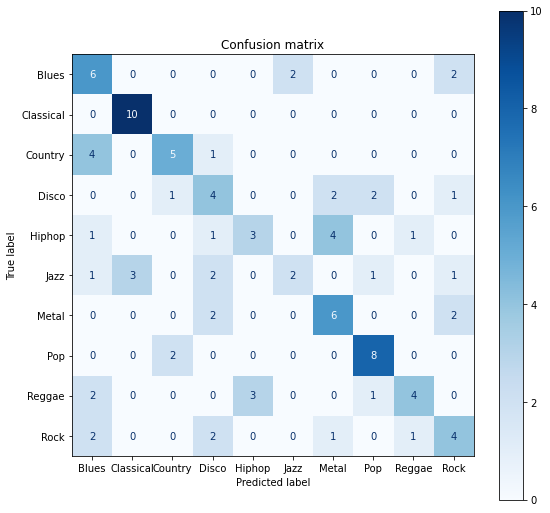

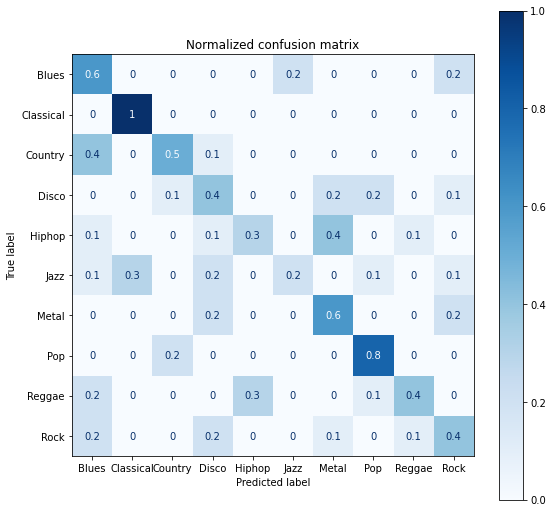

Accuracy score: 0.52 

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.60      0.46        10
           1       0.77      1.00      0.87        10
           2       0.62      0.50      0.56        10
           3       0.33      0.40      0.36        10
           4       0.50      0.30      0.37        10
           5       0.50      0.20      0.29        10
           6       0.46      0.60      0.52        10
           7       0.67      0.80      0.73        10
           8       0.67      0.40      0.50        10
           9       0.40      0.40      0.40        10

    accuracy                           0.52       100
   macro avg       0.53      0.52      0.51       100
weighted avg       0.53      0.52      0.51       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

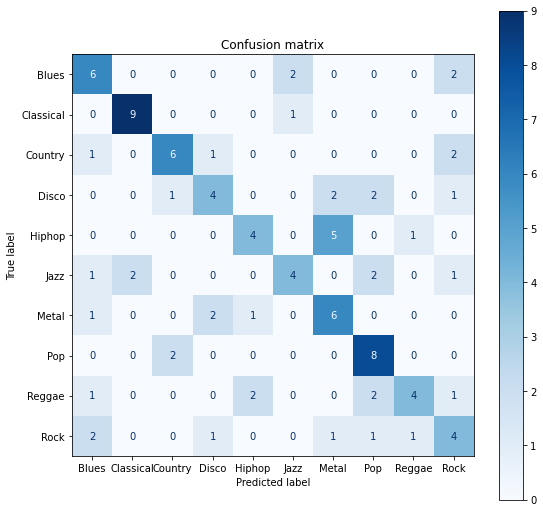

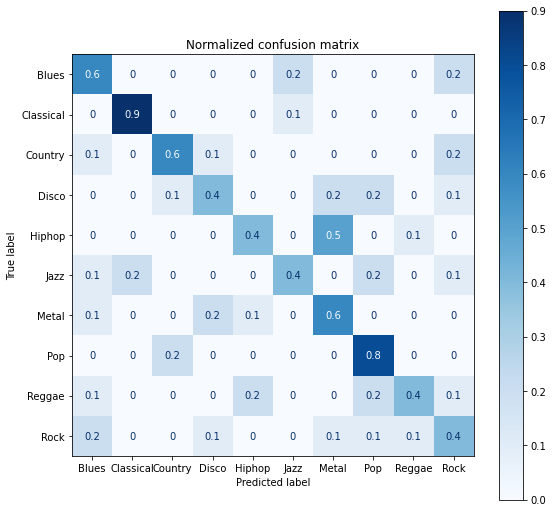

Accuracy score: 0.55 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.60      0.55        10
           1       0.82      0.90      0.86        10
           2       0.67      0.60      0.63        10
           3       0.50      0.40      0.44        10
           4       0.57      0.40      0.47        10
           5       0.57      0.40      0.47        10
           6       0.43      0.60      0.50        10
           7       0.53      0.80      0.64        10
           8       0.67      0.40      0.50        10
           9       0.36      0.40      0.38        10

    accuracy                           0.55       100
   macro avg       0.56      0.55      0.54       100
weighted avg       0.56      0.55      0.54       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

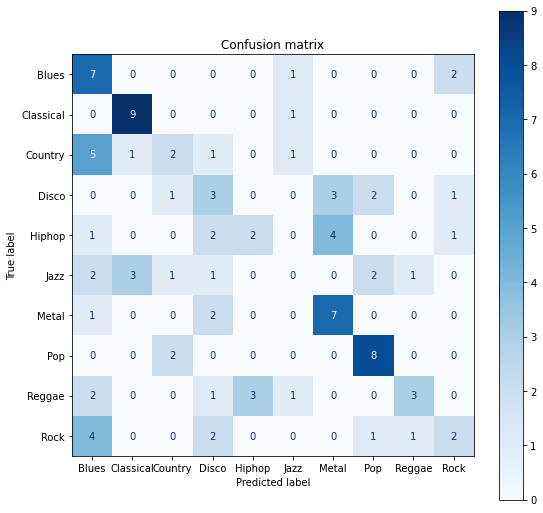

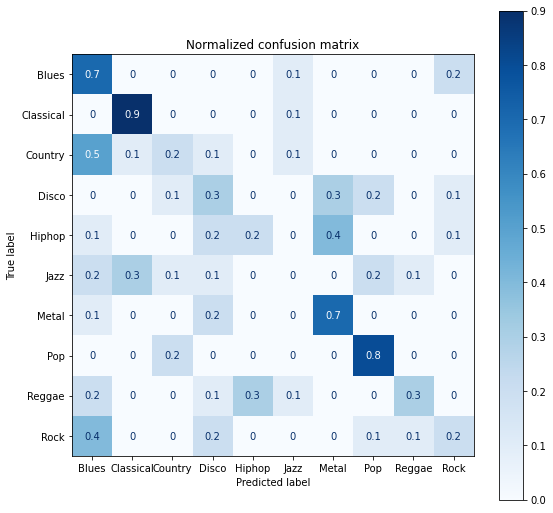

Accuracy score: 0.43 

Classification Report
              precision    recall  f1-score   support

           0       0.32      0.70      0.44        10
           1       0.69      0.90      0.78        10
           2       0.33      0.20      0.25        10
           3       0.25      0.30      0.27        10
           4       0.40      0.20      0.27        10
           5       0.00      0.00      0.00        10
           6       0.50      0.70      0.58        10
           7       0.62      0.80      0.70        10
           8       0.60      0.30      0.40        10
           9       0.33      0.20      0.25        10

    accuracy                           0.43       100
   macro avg       0.40      0.43      0.39       100
weighted avg       0.40      0.43      0.39       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

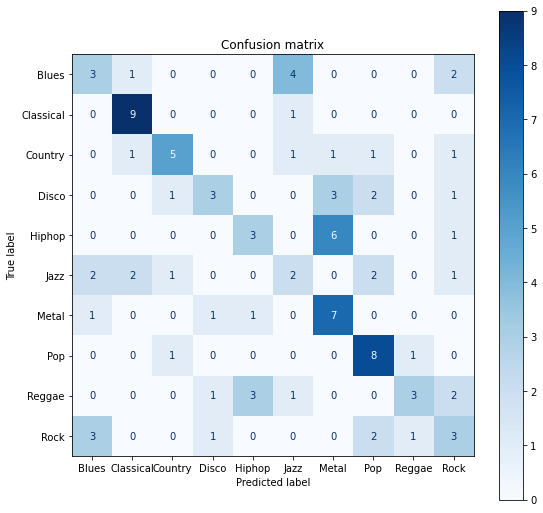

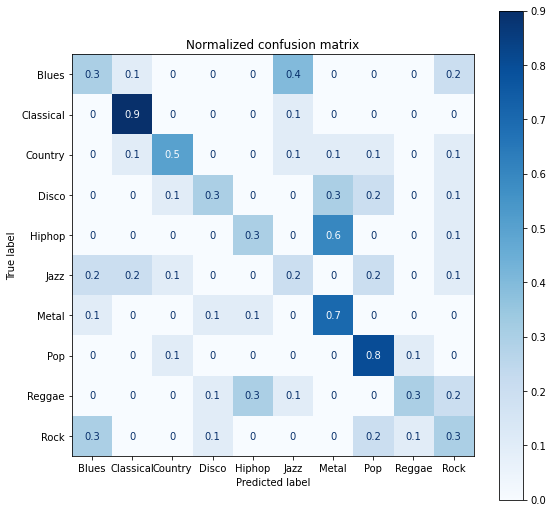

Accuracy score: 0.46 

Classification Report
              precision    recall  f1-score   support

           0       0.33      0.30      0.32        10
           1       0.69      0.90      0.78        10
           2       0.62      0.50      0.56        10
           3       0.50      0.30      0.37        10
           4       0.43      0.30      0.35        10
           5       0.22      0.20      0.21        10
           6       0.41      0.70      0.52        10
           7       0.53      0.80      0.64        10
           8       0.60      0.30      0.40        10
           9       0.27      0.30      0.29        10

    accuracy                           0.46       100
   macro avg       0.46      0.46      0.44       100
weighted avg       0.46      0.46      0.44       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

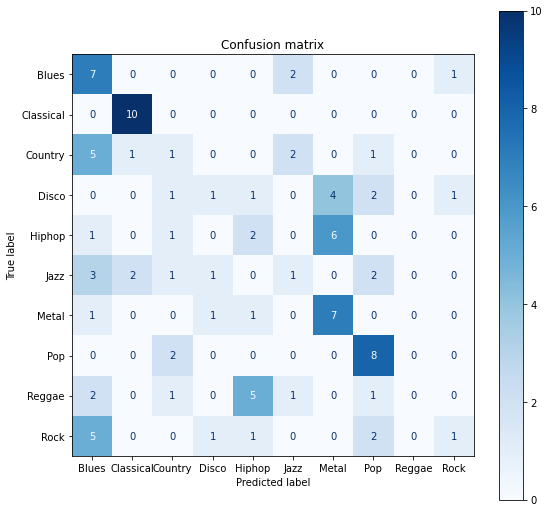

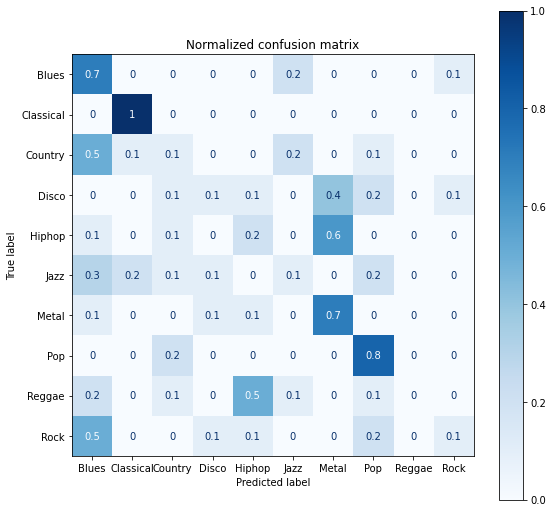

Accuracy score: 0.38 

Classification Report
              precision    recall  f1-score   support

           0       0.29      0.70      0.41        10
           1       0.77      1.00      0.87        10
           2       0.14      0.10      0.12        10
           3       0.25      0.10      0.14        10
           4       0.20      0.20      0.20        10
           5       0.17      0.10      0.12        10
           6       0.41      0.70      0.52        10
           7       0.50      0.80      0.62        10
           8       0.00      0.00      0.00        10
           9       0.33      0.10      0.15        10

    accuracy                           0.38       100
   macro avg       0.31      0.38      0.32       100
weighted avg       0.31      0.38      0.32       100



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
nb = GaussianNB()
nb.fit(x_train_ksel, y_train)

y_pred = nb.predict(x_test_ksel)

print_results(nb, x_test_ksel, y_test , y_pred)

### PCA

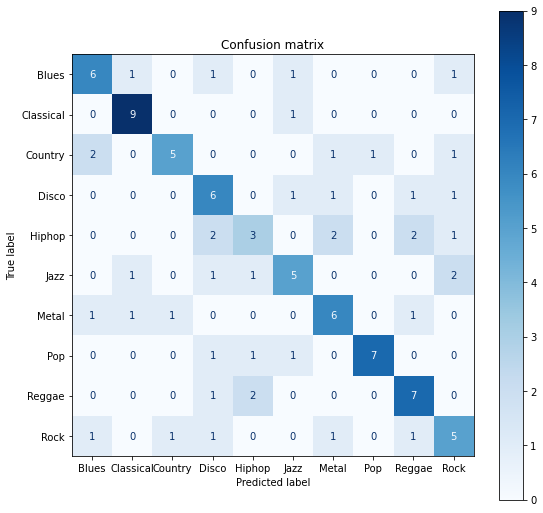

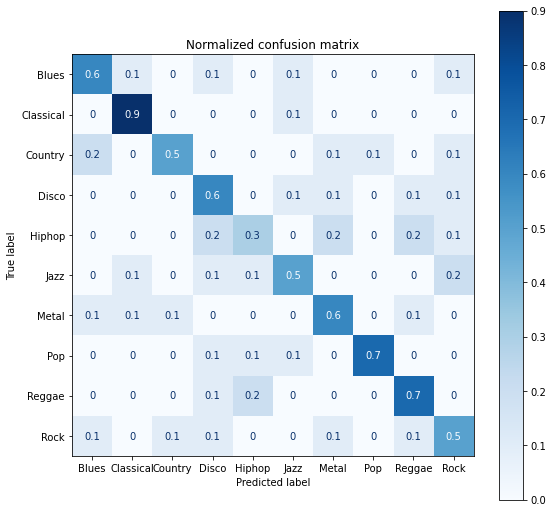

Accuracy score: 0.59 

Classification Report
              precision    recall  f1-score   support

           0       0.60      0.60      0.60        10
           1       0.75      0.90      0.82        10
           2       0.71      0.50      0.59        10
           3       0.46      0.60      0.52        10
           4       0.43      0.30      0.35        10
           5       0.56      0.50      0.53        10
           6       0.55      0.60      0.57        10
           7       0.88      0.70      0.78        10
           8       0.58      0.70      0.64        10
           9       0.45      0.50      0.48        10

    accuracy                           0.59       100
   macro avg       0.60      0.59      0.59       100
weighted avg       0.60      0.59      0.59       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_pca, y_train)

y_pred = nb.predict(x_test_pca)

print_results(nb, x_test_pca, y_test , y_pred)

### LDA

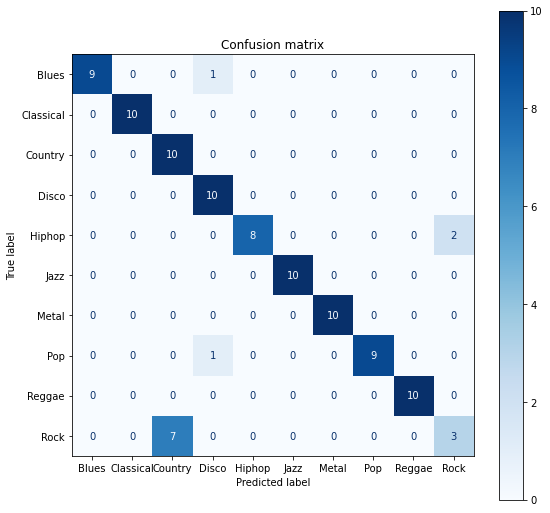

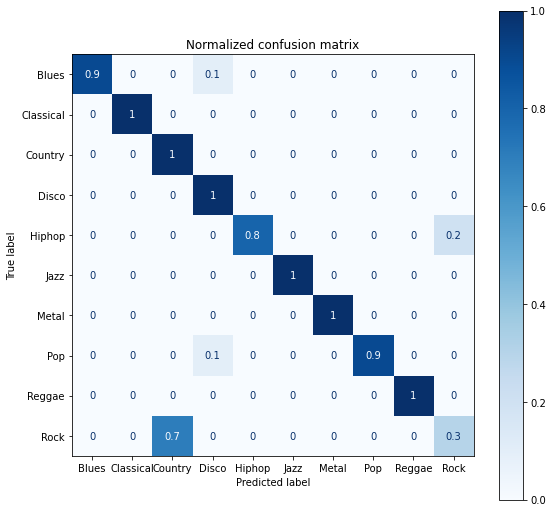

Accuracy score: 0.89 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       0.59      1.00      0.74        10
           3       0.83      1.00      0.91        10
           4       1.00      0.80      0.89        10
           5       1.00      1.00      1.00        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      1.00      1.00        10
           9       0.60      0.30      0.40        10

    accuracy                           0.89       100
   macro avg       0.90      0.89      0.88       100
weighted avg       0.90      0.89      0.88       100



In [ ]:
nb = GaussianNB()
nb.fit(x_train_lda, y_train)

y_pred = nb.predict(x_test_lda)

print_results(nb, x_test_lda, y_test , y_pred)

## Stochastic Gradient Descent (SGD)

### All features

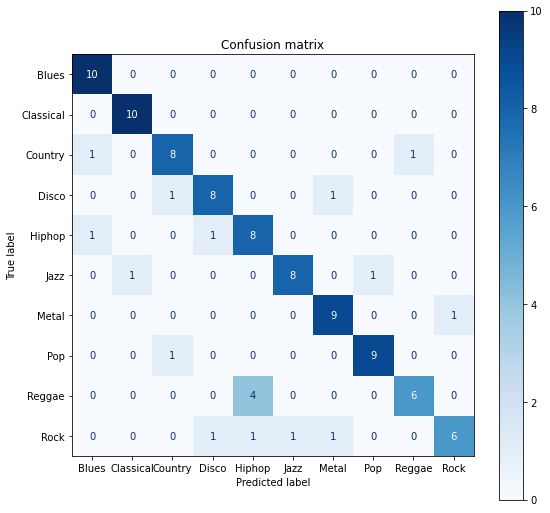

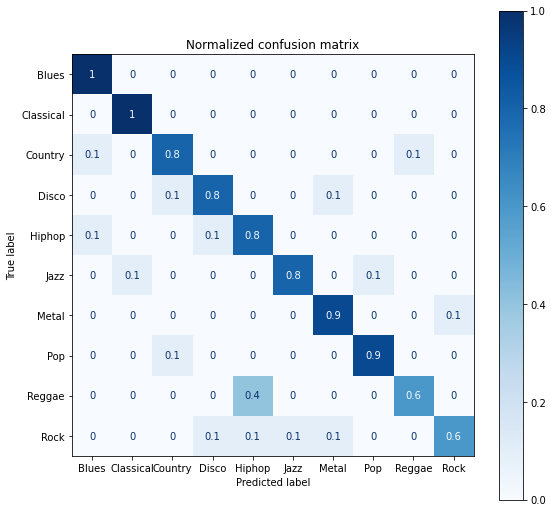

Accuracy score: 0.82 

Classification Report
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.80      0.80      0.80        10
           4       0.62      0.80      0.70        10
           5       0.89      0.80      0.84        10
           6       0.82      0.90      0.86        10
           7       0.90      0.90      0.90        10
           8       0.86      0.60      0.71        10
           9       0.86      0.60      0.71        10

    accuracy                           0.82       100
   macro avg       0.83      0.82      0.82       100
weighted avg       0.83      0.82      0.82       100



In [ ]:
loss = ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_loss', 'huber', 'epsilon_insensitive',
       'squared_epsilon_insensitive']
penalty = ['l2', 'l1', 'elasticnet']
learning_rate = ['optimal', 'invscaling', 'adaptive']

parameters = [{'loss': loss, 'penalty': penalty, 'learning_rate': learning_rate}]

#using GrisSearch to find the best model
_sgd = GridSearchCV(SGDClassifier(eta0=0.001, max_iter = 10_000), parameters) 
_sgd.fit(x_train, y_train)

y_pred = _sgd.predict(x_test)

print_results(_sgd, x_test, y_test, y_pred)

In [ ]:
_sgd.best_estimator_

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='adaptive', loss='modified_huber',
              max_iter=10000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

### Without highly correlated features

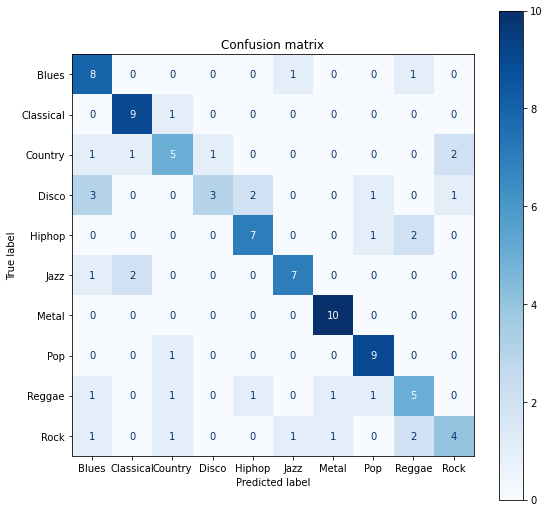

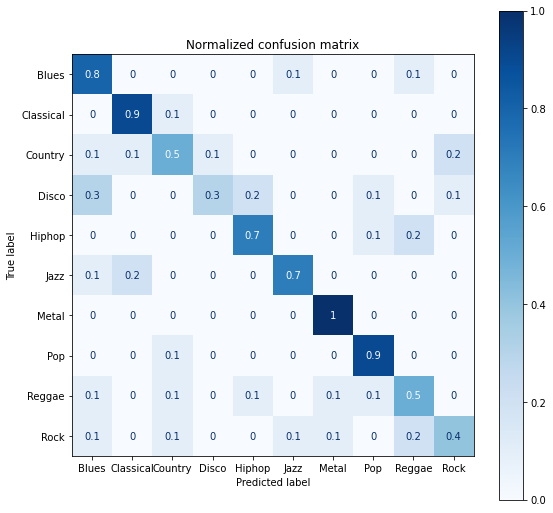

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.53      0.80      0.64        10
           1       0.75      0.90      0.82        10
           2       0.56      0.50      0.53        10
           3       0.75      0.30      0.43        10
           4       0.70      0.70      0.70        10
           5       0.78      0.70      0.74        10
           6       0.83      1.00      0.91        10
           7       0.75      0.90      0.82        10
           8       0.50      0.50      0.50        10
           9       0.57      0.40      0.47        10

    accuracy                           0.67       100
   macro avg       0.67      0.67      0.65       100
weighted avg       0.67      0.67      0.65       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_wcorr, y_train_wcorr)

y_pred = sgd.predict(x_test_wcorr)

print_results(sgd, x_test_wcorr, y_test_wcorr, y_pred)

### Without low - variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

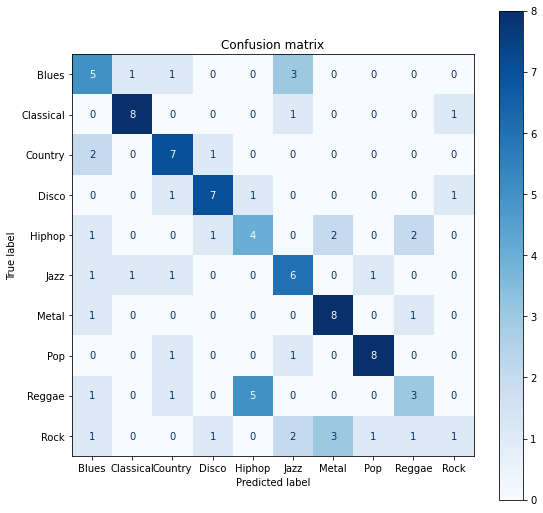

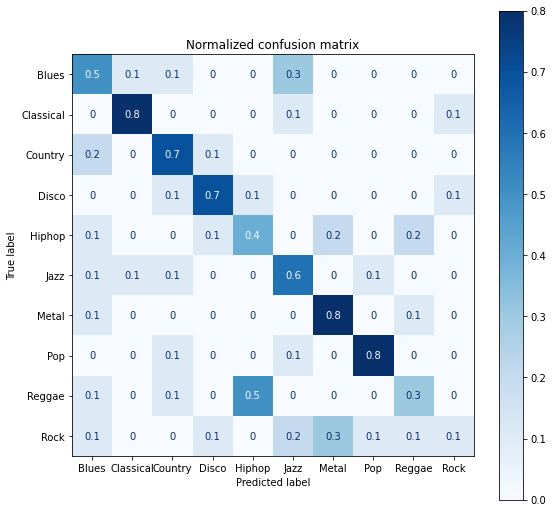

Accuracy score: 0.57 

Classification Report
              precision    recall  f1-score   support

           0       0.42      0.50      0.45        10
           1       0.80      0.80      0.80        10
           2       0.58      0.70      0.64        10
           3       0.70      0.70      0.70        10
           4       0.40      0.40      0.40        10
           5       0.46      0.60      0.52        10
           6       0.62      0.80      0.70        10
           7       0.80      0.80      0.80        10
           8       0.43      0.30      0.35        10
           9       0.33      0.10      0.15        10

    accuracy                           0.57       100
   macro avg       0.55      0.57      0.55       100
weighted avg       0.55      0.57      0.55       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_sel, y_train)

y_pred = sgd.predict(x_test_sel)

print_results(sgd, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

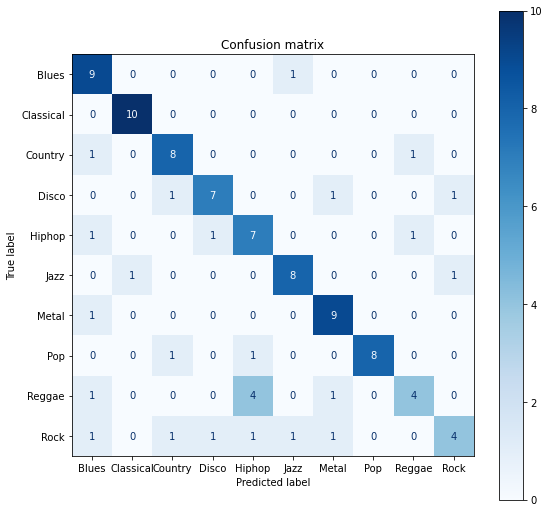

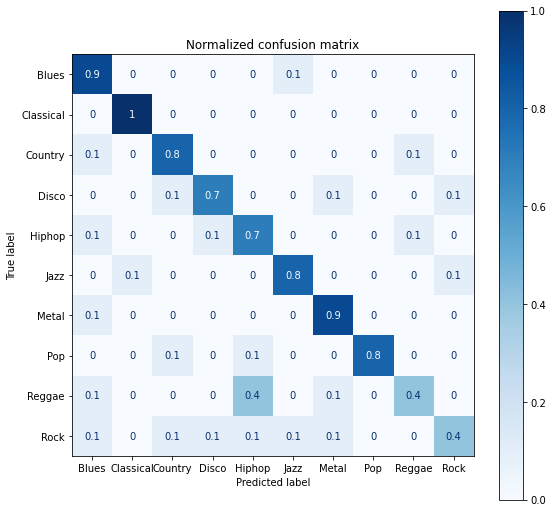

Accuracy score: 0.74 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.90      0.75        10
           1       0.91      1.00      0.95        10
           2       0.73      0.80      0.76        10
           3       0.78      0.70      0.74        10
           4       0.54      0.70      0.61        10
           5       0.80      0.80      0.80        10
           6       0.75      0.90      0.82        10
           7       1.00      0.80      0.89        10
           8       0.67      0.40      0.50        10
           9       0.67      0.40      0.50        10

    accuracy                           0.74       100
   macro avg       0.75      0.74      0.73       100
weighted avg       0.75      0.74      0.73       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

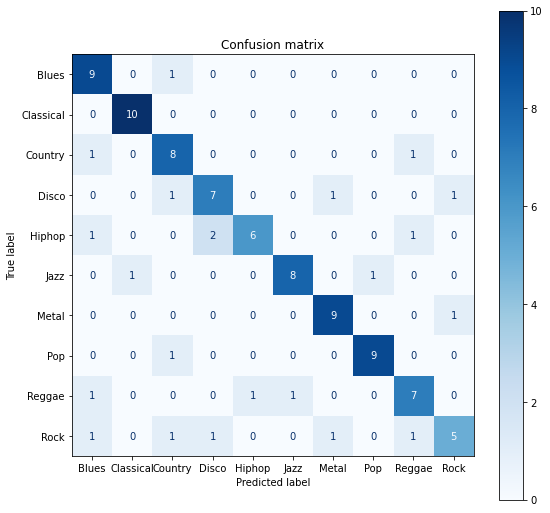

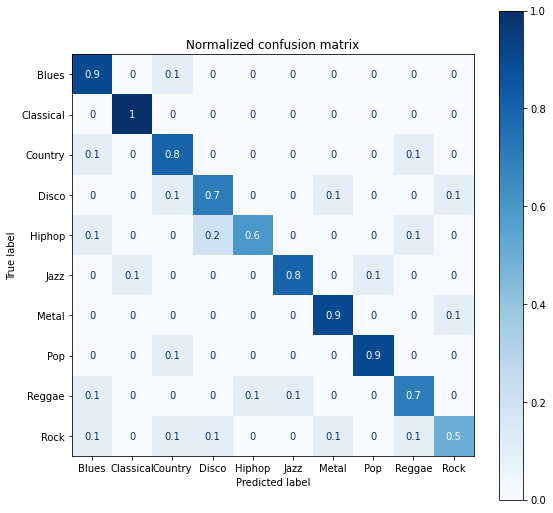

Accuracy score: 0.78 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.70      0.70      0.70        10
           4       0.86      0.60      0.71        10
           5       0.89      0.80      0.84        10
           6       0.82      0.90      0.86        10
           7       0.90      0.90      0.90        10
           8       0.70      0.70      0.70        10
           9       0.71      0.50      0.59        10

    accuracy                           0.78       100
   macro avg       0.78      0.78      0.78       100
weighted avg       0.78      0.78      0.78       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

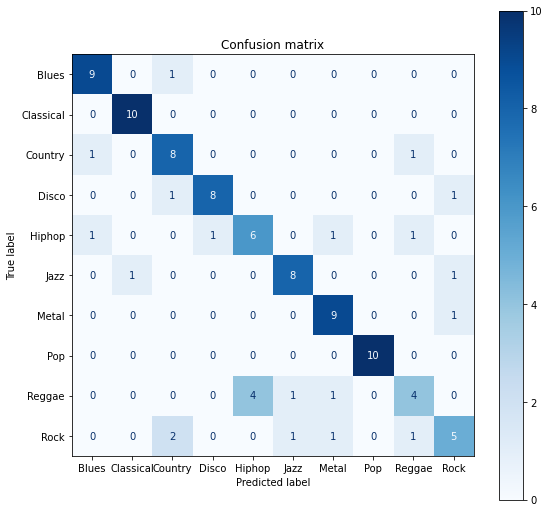

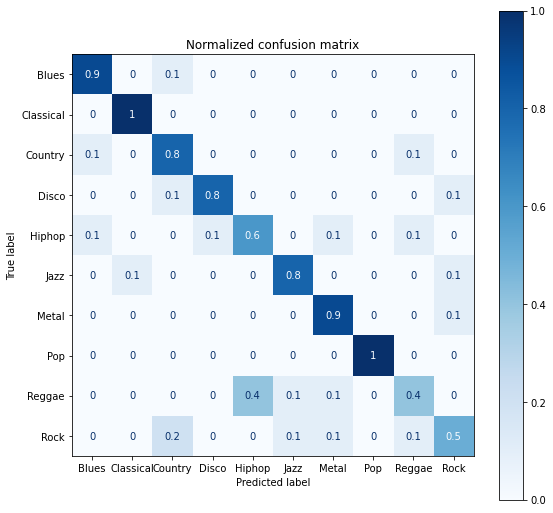

Accuracy score: 0.77 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.89      0.80      0.84        10
           4       0.60      0.60      0.60        10
           5       0.80      0.80      0.80        10
           6       0.75      0.90      0.82        10
           7       1.00      1.00      1.00        10
           8       0.57      0.40      0.47        10
           9       0.62      0.50      0.56        10

    accuracy                           0.77       100
   macro avg       0.76      0.77      0.76       100
weighted avg       0.76      0.77      0.76       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

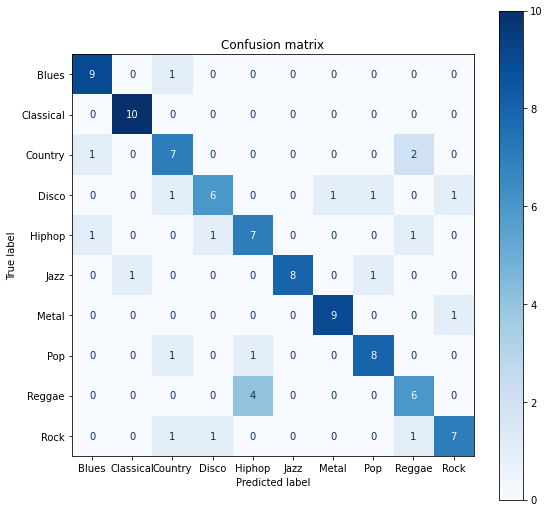

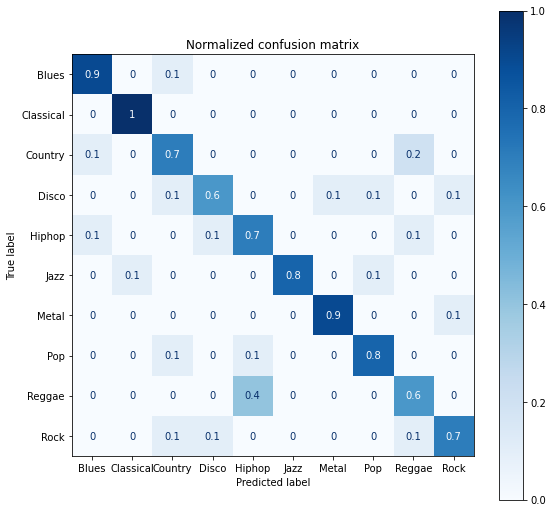

Accuracy score: 0.77 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.64      0.70      0.67        10
           3       0.75      0.60      0.67        10
           4       0.58      0.70      0.64        10
           5       1.00      0.80      0.89        10
           6       0.90      0.90      0.90        10
           7       0.80      0.80      0.80        10
           8       0.60      0.60      0.60        10
           9       0.78      0.70      0.74        10

    accuracy                           0.77       100
   macro avg       0.78      0.77      0.77       100
weighted avg       0.78      0.77      0.77       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

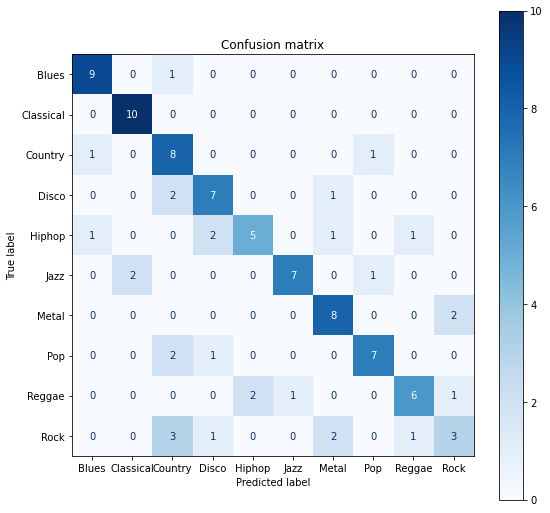

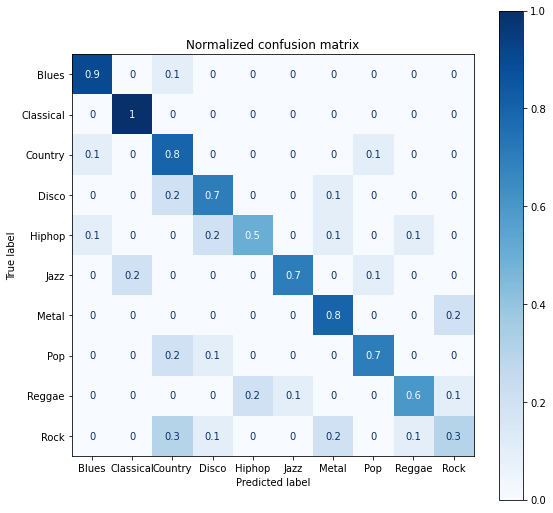

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.83      1.00      0.91        10
           2       0.50      0.80      0.62        10
           3       0.64      0.70      0.67        10
           4       0.71      0.50      0.59        10
           5       0.88      0.70      0.78        10
           6       0.67      0.80      0.73        10
           7       0.78      0.70      0.74        10
           8       0.75      0.60      0.67        10
           9       0.50      0.30      0.37        10

    accuracy                           0.70       100
   macro avg       0.71      0.70      0.69       100
weighted avg       0.71      0.70      0.69       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

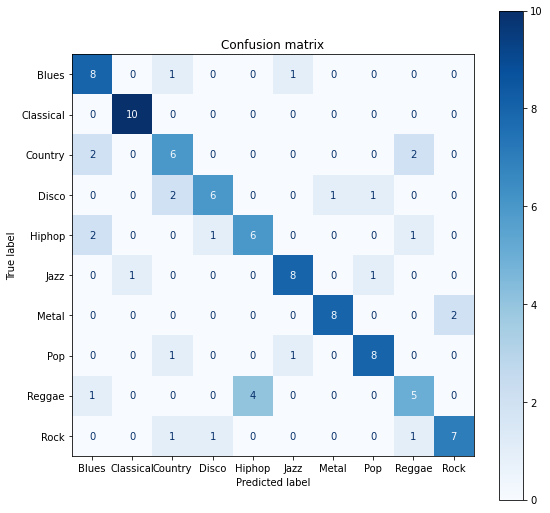

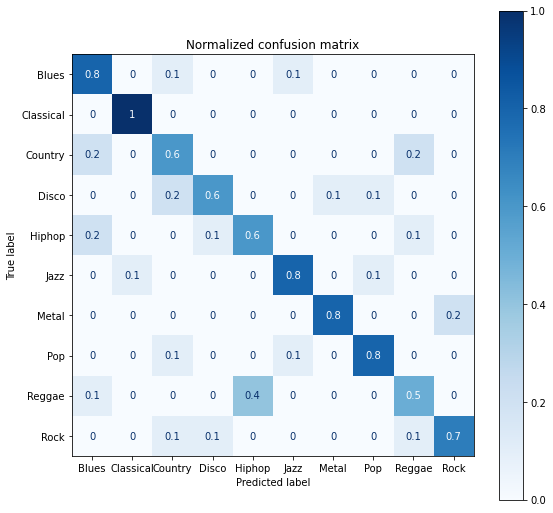

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.91      1.00      0.95        10
           2       0.55      0.60      0.57        10
           3       0.75      0.60      0.67        10
           4       0.60      0.60      0.60        10
           5       0.80      0.80      0.80        10
           6       0.89      0.80      0.84        10
           7       0.80      0.80      0.80        10
           8       0.56      0.50      0.53        10
           9       0.78      0.70      0.74        10

    accuracy                           0.72       100
   macro avg       0.72      0.72      0.72       100
weighted avg       0.72      0.72      0.72       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

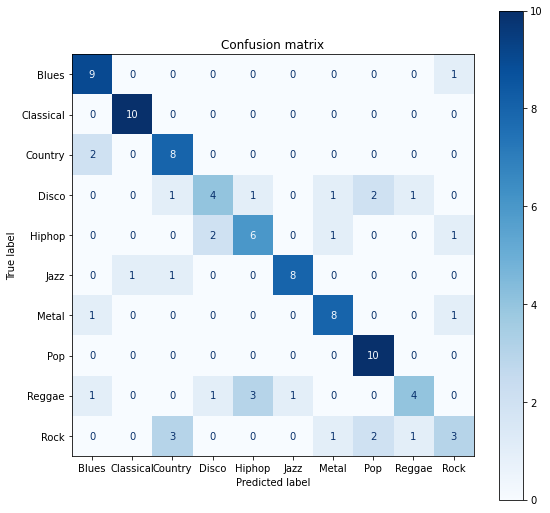

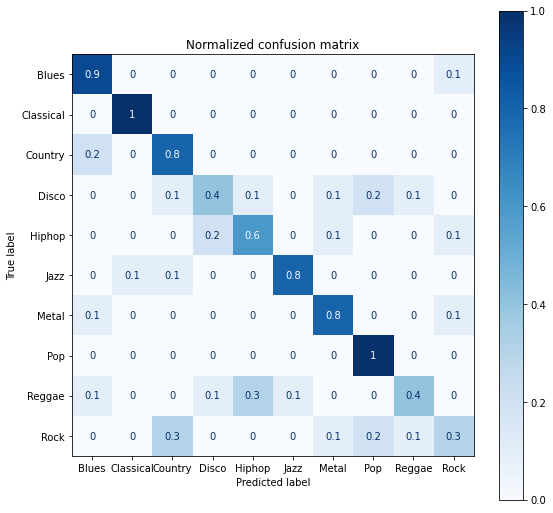

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.57      0.40      0.47        10
           4       0.60      0.60      0.60        10
           5       0.89      0.80      0.84        10
           6       0.73      0.80      0.76        10
           7       0.71      1.00      0.83        10
           8       0.67      0.40      0.50        10
           9       0.50      0.30      0.37        10

    accuracy                           0.70       100
   macro avg       0.69      0.70      0.68       100
weighted avg       0.69      0.70      0.68       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

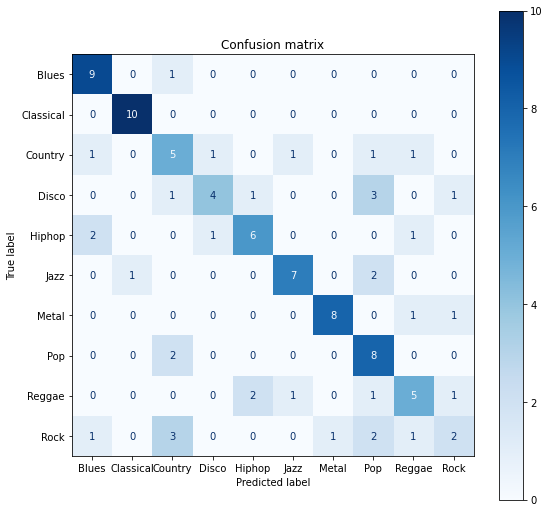

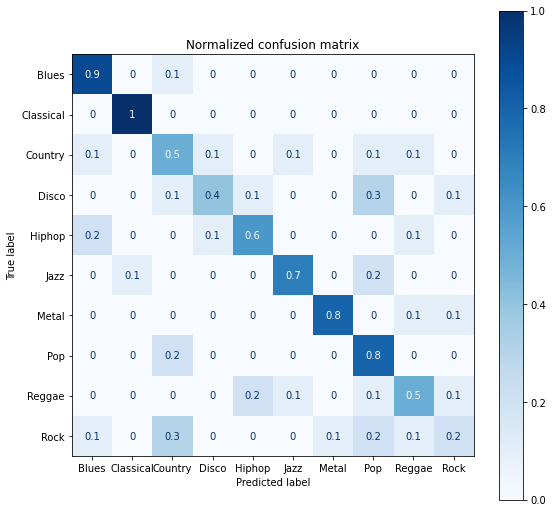

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.91      1.00      0.95        10
           2       0.42      0.50      0.45        10
           3       0.67      0.40      0.50        10
           4       0.67      0.60      0.63        10
           5       0.78      0.70      0.74        10
           6       0.89      0.80      0.84        10
           7       0.47      0.80      0.59        10
           8       0.56      0.50      0.53        10
           9       0.40      0.20      0.27        10

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.63       100
weighted avg       0.64      0.64      0.63       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

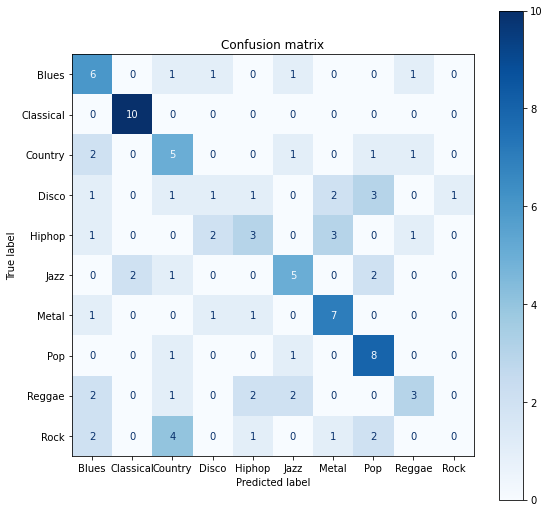

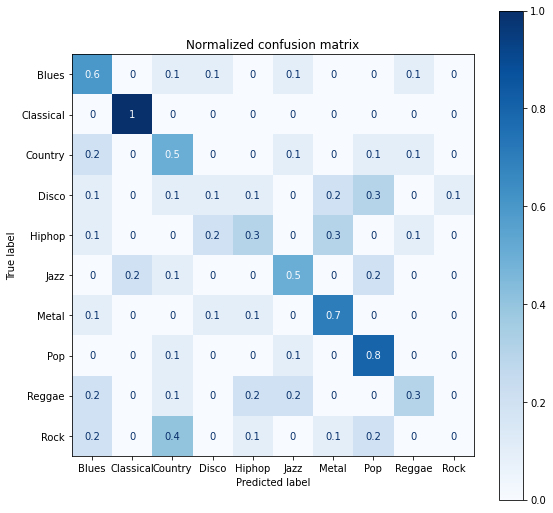

Accuracy score: 0.48 

Classification Report
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        10
           1       0.83      1.00      0.91        10
           2       0.36      0.50      0.42        10
           3       0.20      0.10      0.13        10
           4       0.38      0.30      0.33        10
           5       0.50      0.50      0.50        10
           6       0.54      0.70      0.61        10
           7       0.50      0.80      0.62        10
           8       0.50      0.30      0.37        10
           9       0.00      0.00      0.00        10

    accuracy                           0.48       100
   macro avg       0.42      0.48      0.44       100
weighted avg       0.42      0.48      0.44       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

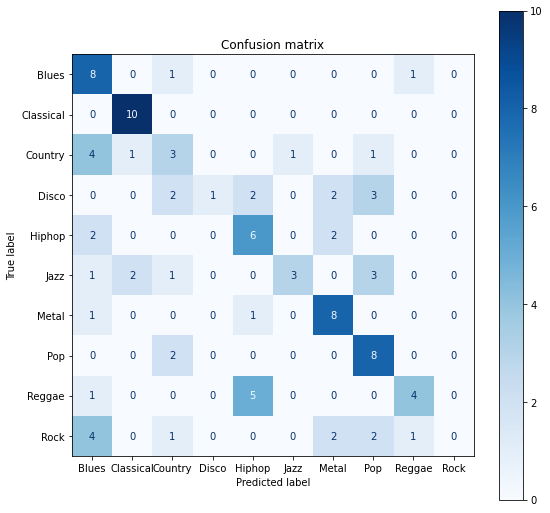

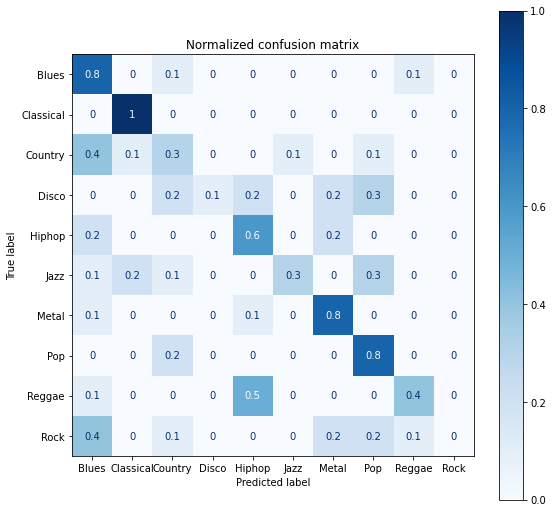

Accuracy score: 0.51 

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.80      0.52        10
           1       0.77      1.00      0.87        10
           2       0.30      0.30      0.30        10
           3       1.00      0.10      0.18        10
           4       0.43      0.60      0.50        10
           5       0.75      0.30      0.43        10
           6       0.57      0.80      0.67        10
           7       0.47      0.80      0.59        10
           8       0.67      0.40      0.50        10
           9       0.00      0.00      0.00        10

    accuracy                           0.51       100
   macro avg       0.53      0.51      0.46       100
weighted avg       0.53      0.51      0.46       100



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_ksel, y_train)

y_pred = sgd.predict(x_test_ksel)

print_results(sgd, x_test_ksel, y_test, y_pred)

### Recursive Feature Elimination (RFE)

**n_features_to_select = 50**

In [ ]:
rfe = RFE(estimator = _sgd.best_estimator_, n_features_to_select = 50)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

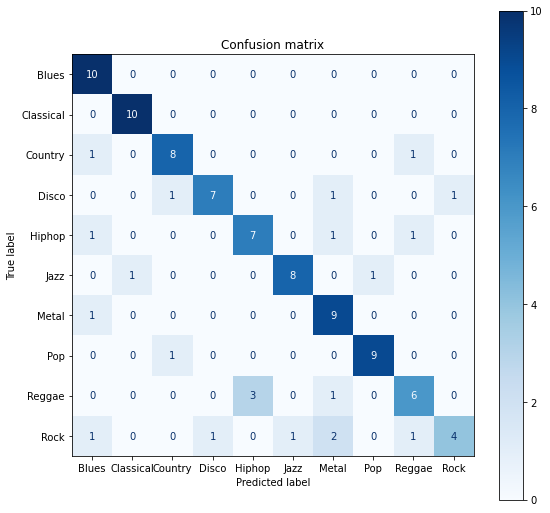

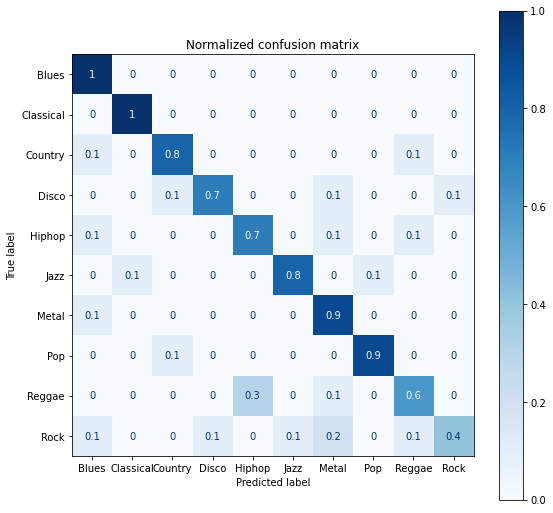

Accuracy score: 0.78 

Classification Report
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.88      0.70      0.78        10
           4       0.70      0.70      0.70        10
           5       0.89      0.80      0.84        10
           6       0.64      0.90      0.75        10
           7       0.90      0.90      0.90        10
           8       0.67      0.60      0.63        10
           9       0.80      0.40      0.53        10

    accuracy                           0.78       100
   macro avg       0.79      0.78      0.77       100
weighted avg       0.79      0.78      0.77       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_rfe, y_train)

y_pred = sgd.predict(x_test_rfe)

print_results(sgd, x_test_rfe, y_test, y_pred)

**n_features_to_select = 40**

In [ ]:
rfe = RFE(estimator = _sgd.best_estimator_, n_features_to_select = 40)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

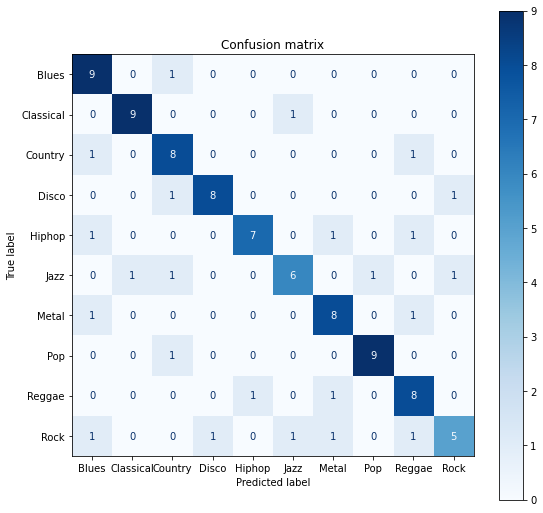

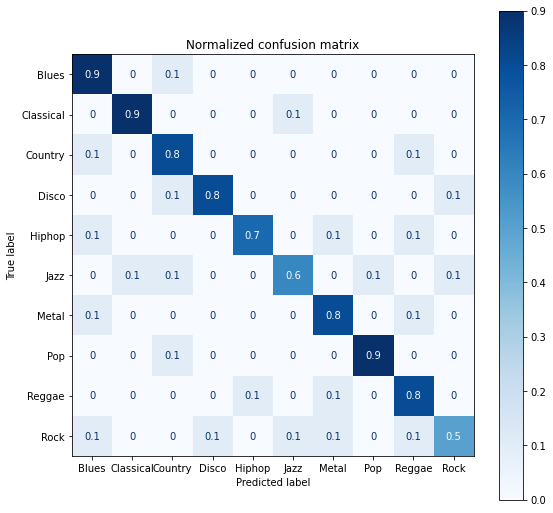

Accuracy score: 0.77 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.90      0.90      0.90        10
           2       0.67      0.80      0.73        10
           3       0.89      0.80      0.84        10
           4       0.88      0.70      0.78        10
           5       0.75      0.60      0.67        10
           6       0.73      0.80      0.76        10
           7       0.90      0.90      0.90        10
           8       0.67      0.80      0.73        10
           9       0.71      0.50      0.59        10

    accuracy                           0.77       100
   macro avg       0.78      0.77      0.77       100
weighted avg       0.78      0.77      0.77       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_rfe, y_train)

y_pred = sgd.predict(x_test_rfe)

print_results(sgd, x_test_rfe, y_test, y_pred)

**n_features_to_select = 30**

In [ ]:
rfe = RFE(estimator = _sgd.best_estimator_, n_features_to_select = 30)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

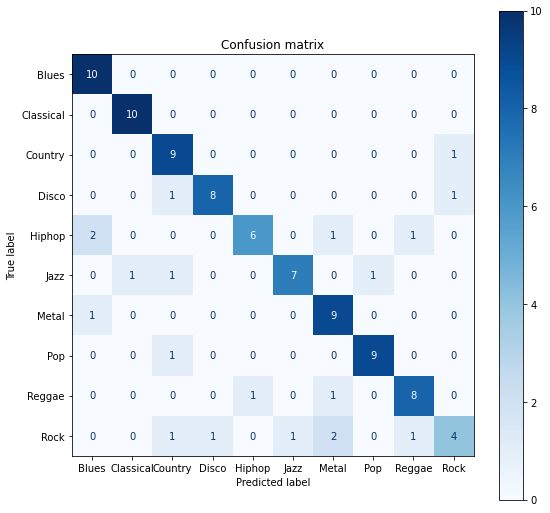

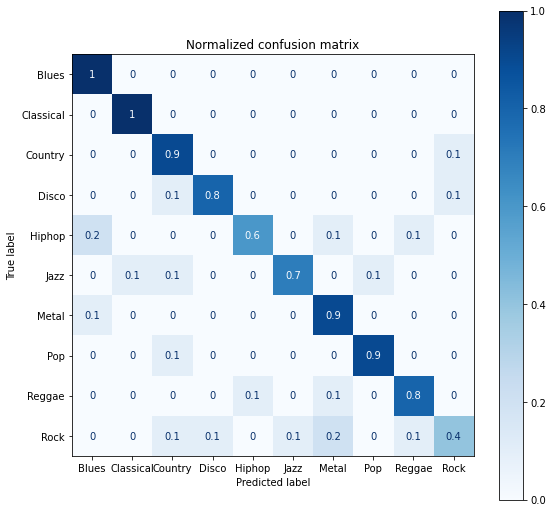

Accuracy score: 0.8 

Classification Report
              precision    recall  f1-score   support

           0       0.77      1.00      0.87        10
           1       0.91      1.00      0.95        10
           2       0.69      0.90      0.78        10
           3       0.89      0.80      0.84        10
           4       0.86      0.60      0.71        10
           5       0.88      0.70      0.78        10
           6       0.69      0.90      0.78        10
           7       0.90      0.90      0.90        10
           8       0.80      0.80      0.80        10
           9       0.67      0.40      0.50        10

    accuracy                           0.80       100
   macro avg       0.81      0.80      0.79       100
weighted avg       0.81      0.80      0.79       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_rfe, y_train)

y_pred = sgd.predict(x_test_rfe)

print_results(sgd, x_test_rfe, y_test, y_pred)

**n_features_to_select = 20**

In [ ]:
rfe = RFE(estimator = _sgd.best_estimator_, n_features_to_select = 20)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

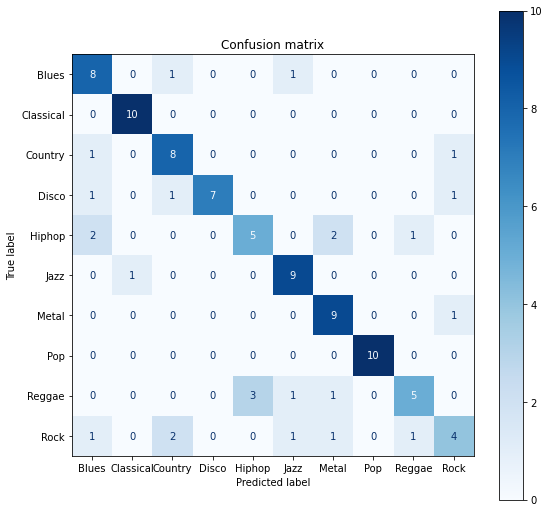

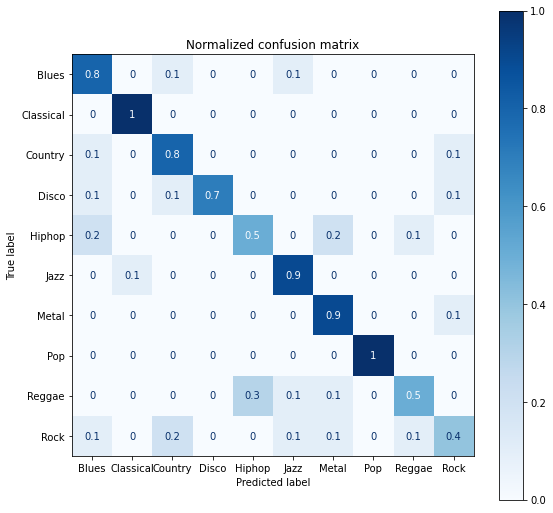

Accuracy score: 0.75 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       1.00      0.70      0.82        10
           4       0.62      0.50      0.56        10
           5       0.75      0.90      0.82        10
           6       0.69      0.90      0.78        10
           7       1.00      1.00      1.00        10
           8       0.71      0.50      0.59        10
           9       0.57      0.40      0.47        10

    accuracy                           0.75       100
   macro avg       0.75      0.75      0.74       100
weighted avg       0.75      0.75      0.74       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_rfe, y_train)

y_pred = sgd.predict(x_test_rfe)

print_results(sgd, x_test_rfe, y_test, y_pred)

**n_features_to_select = 10**

In [ ]:
rfe = RFE(estimator = _sgd.best_estimator_, n_features_to_select = 10)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

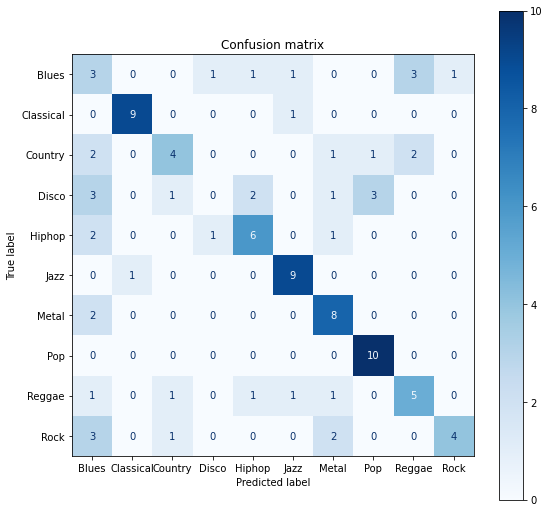

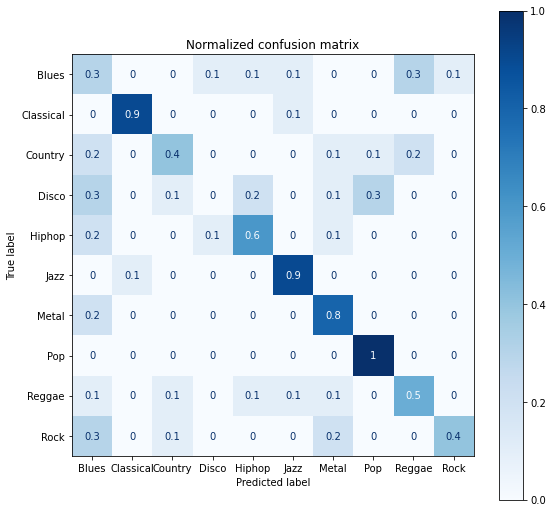

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.19      0.30      0.23        10
           1       0.90      0.90      0.90        10
           2       0.57      0.40      0.47        10
           3       0.00      0.00      0.00        10
           4       0.60      0.60      0.60        10
           5       0.75      0.90      0.82        10
           6       0.57      0.80      0.67        10
           7       0.71      1.00      0.83        10
           8       0.50      0.50      0.50        10
           9       0.80      0.40      0.53        10

    accuracy                           0.58       100
   macro avg       0.56      0.58      0.56       100
weighted avg       0.56      0.58      0.56       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_rfe, y_train)

y_pred = sgd.predict(x_test_rfe)

print_results(sgd, x_test_rfe, y_test, y_pred)

### Select features based on importance weights

In [ ]:
selector = SelectFromModel(estimator = _sgd.best_estimator_)
selector.fit(x_train, y_train)
selector.fit(x_test, y_test)

x_train_sfm = selector.transform(x_train)
x_test_sfm = selector.transform(x_test)

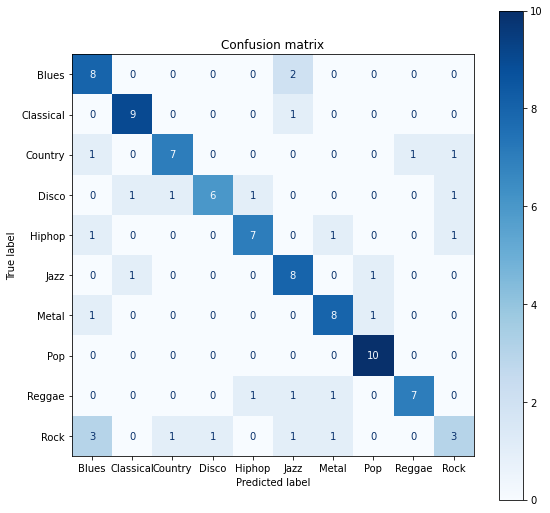

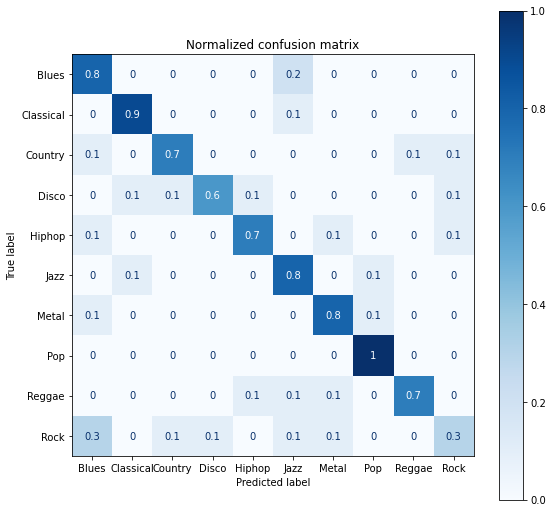

Accuracy score: 0.73 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.82      0.90      0.86        10
           2       0.78      0.70      0.74        10
           3       0.86      0.60      0.71        10
           4       0.78      0.70      0.74        10
           5       0.62      0.80      0.70        10
           6       0.73      0.80      0.76        10
           7       0.83      1.00      0.91        10
           8       0.88      0.70      0.78        10
           9       0.50      0.30      0.37        10

    accuracy                           0.73       100
   macro avg       0.74      0.73      0.72       100
weighted avg       0.74      0.73      0.72       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_sfm, y_train)

y_pred = sgd.predict(x_test_sfm)

print_results(sgd, x_test_sfm, y_test, y_pred)

### PCA

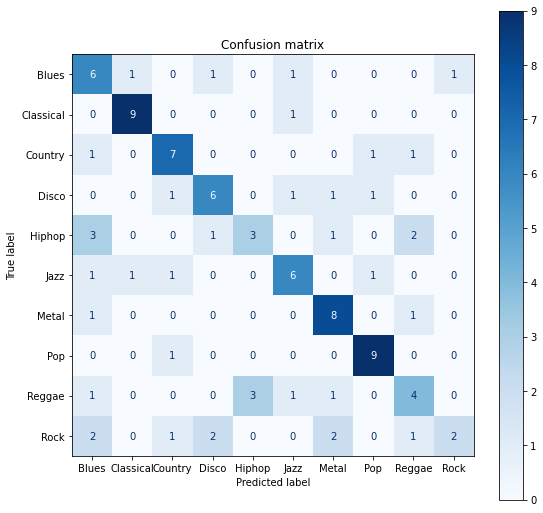

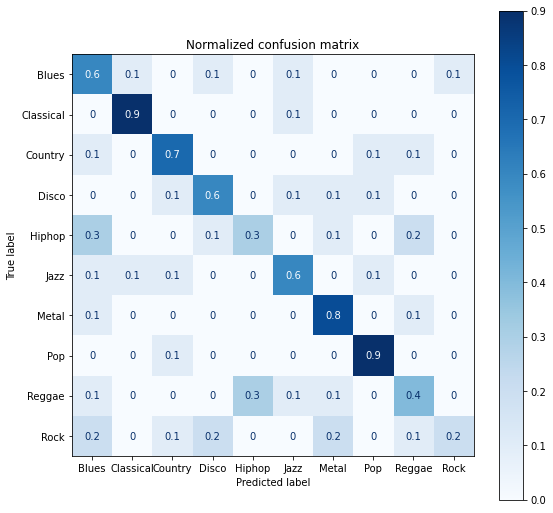

Accuracy score: 0.6 

Classification Report
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        10
           1       0.82      0.90      0.86        10
           2       0.64      0.70      0.67        10
           3       0.60      0.60      0.60        10
           4       0.50      0.30      0.37        10
           5       0.60      0.60      0.60        10
           6       0.62      0.80      0.70        10
           7       0.75      0.90      0.82        10
           8       0.44      0.40      0.42        10
           9       0.67      0.20      0.31        10

    accuracy                           0.60       100
   macro avg       0.60      0.60      0.58       100
weighted avg       0.60      0.60      0.58       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_pca, y_train)

y_pred = sgd.predict(x_test_pca)

print_results(sgd, x_test_pca, y_test, y_pred)

### LDA

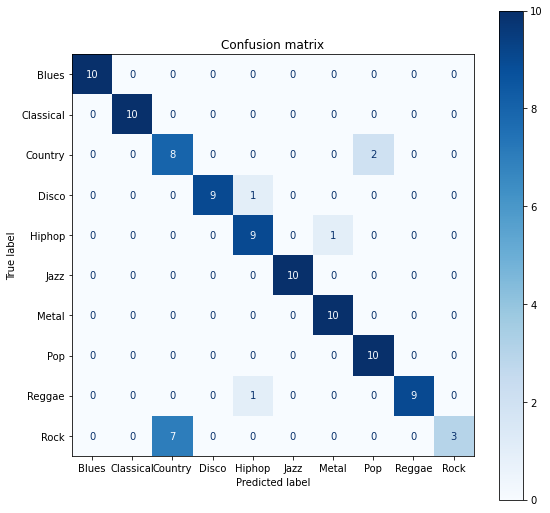

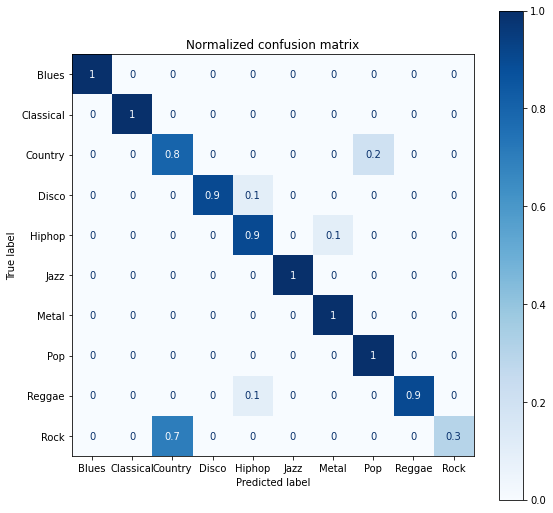

Accuracy score: 0.88 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       0.53      0.80      0.64        10
           3       1.00      0.90      0.95        10
           4       0.82      0.90      0.86        10
           5       1.00      1.00      1.00        10
           6       0.91      1.00      0.95        10
           7       0.83      1.00      0.91        10
           8       1.00      0.90      0.95        10
           9       1.00      0.30      0.46        10

    accuracy                           0.88       100
   macro avg       0.91      0.88      0.87       100
weighted avg       0.91      0.88      0.87       100



In [ ]:
sgd = _sgd.best_estimator_
sgd.fit(x_train_lda, y_train)

y_pred = sgd.predict(x_test_lda)

print_results(sgd, x_test_lda, y_test, y_pred)

## K-Nearest Neighbors (K-NN)
### All features

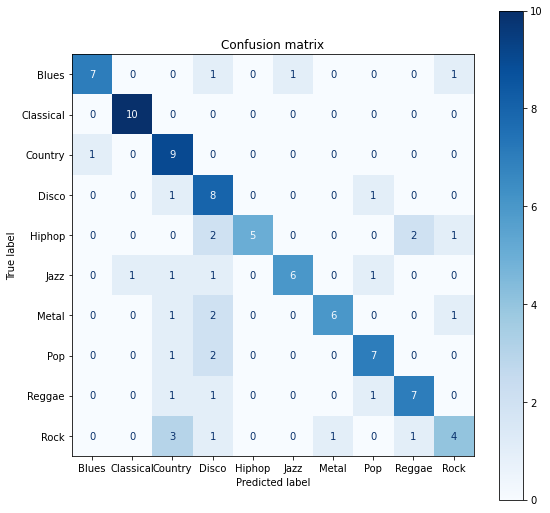

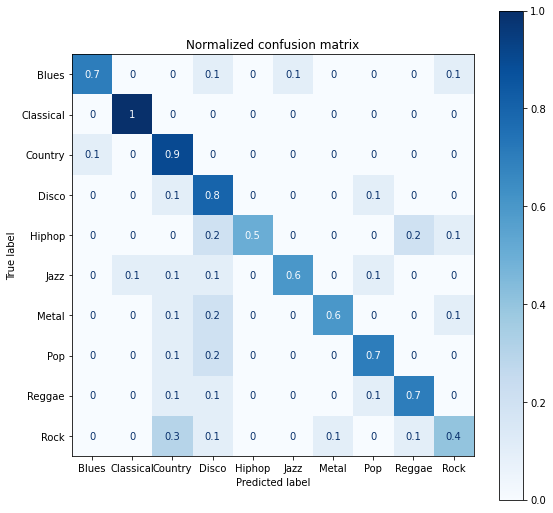

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.91      1.00      0.95        10
           2       0.53      0.90      0.67        10
           3       0.44      0.80      0.57        10
           4       1.00      0.50      0.67        10
           5       0.86      0.60      0.71        10
           6       0.86      0.60      0.71        10
           7       0.70      0.70      0.70        10
           8       0.70      0.70      0.70        10
           9       0.57      0.40      0.47        10

    accuracy                           0.69       100
   macro avg       0.74      0.69      0.69       100
weighted avg       0.74      0.69      0.69       100



In [ ]:
weights = ['uniform', 'distance']
algorithm = ['auto', 'ball_tree', 'kd_tree', 'brute']

parameters = [{'weights': weights, 'algorithm': algorithm}]

_knn = GridSearchCV( KNeighborsClassifier(n_neighbors = 10), parameters)
_knn.fit(x_train, y_train)

y_pred = _knn.predict(x_test)

print_results(_knn, x_test, y_test, y_pred)

In [ ]:
_knn.best_estimator_

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='distance')

### Without highly correlated features

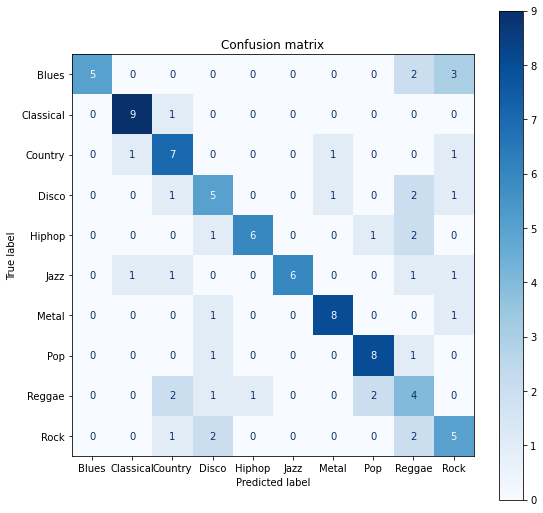

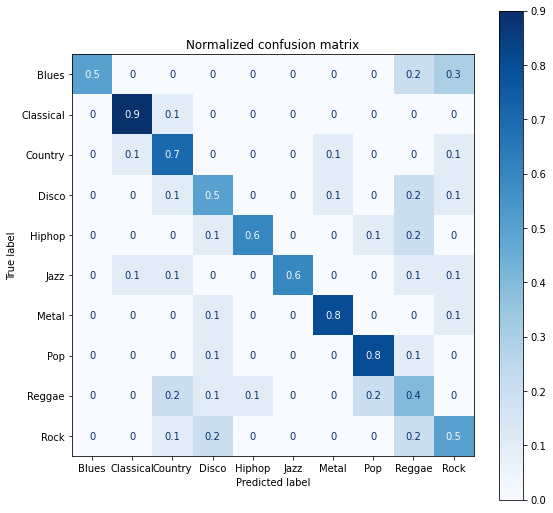

Accuracy score: 0.63 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67        10
           1       0.82      0.90      0.86        10
           2       0.54      0.70      0.61        10
           3       0.45      0.50      0.48        10
           4       0.86      0.60      0.71        10
           5       1.00      0.60      0.75        10
           6       0.80      0.80      0.80        10
           7       0.73      0.80      0.76        10
           8       0.29      0.40      0.33        10
           9       0.42      0.50      0.45        10

    accuracy                           0.63       100
   macro avg       0.69      0.63      0.64       100
weighted avg       0.69      0.63      0.64       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_wcorr, y_train_wcorr)

y_pred = knn.predict(x_test_wcorr)

print_results(knn, x_test_wcorr, y_test_wcorr, y_pred)

### Without low - variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

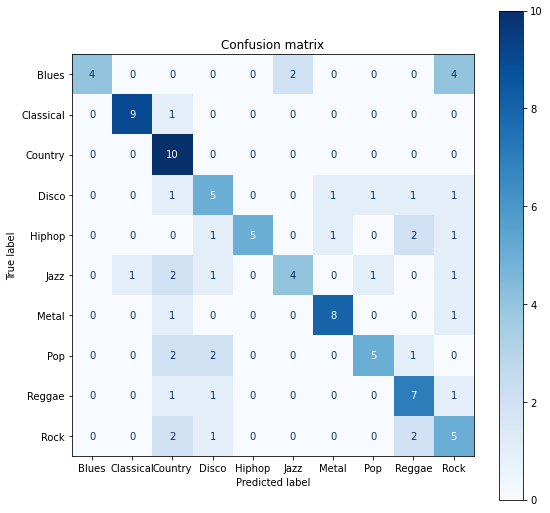

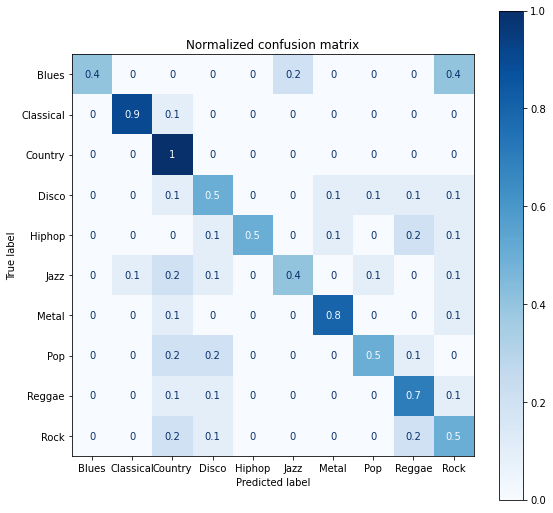

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.40      0.57        10
           1       0.90      0.90      0.90        10
           2       0.50      1.00      0.67        10
           3       0.45      0.50      0.48        10
           4       1.00      0.50      0.67        10
           5       0.67      0.40      0.50        10
           6       0.80      0.80      0.80        10
           7       0.71      0.50      0.59        10
           8       0.54      0.70      0.61        10
           9       0.36      0.50      0.42        10

    accuracy                           0.62       100
   macro avg       0.69      0.62      0.62       100
weighted avg       0.69      0.62      0.62       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_sel, y_train)

y_pred = knn.predict(x_test_sel)

print_results(knn, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

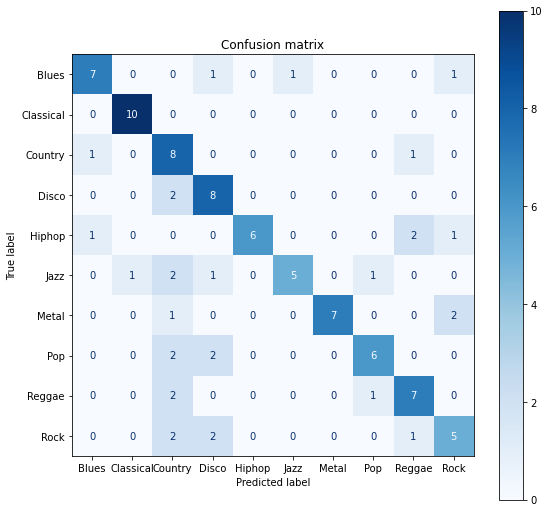

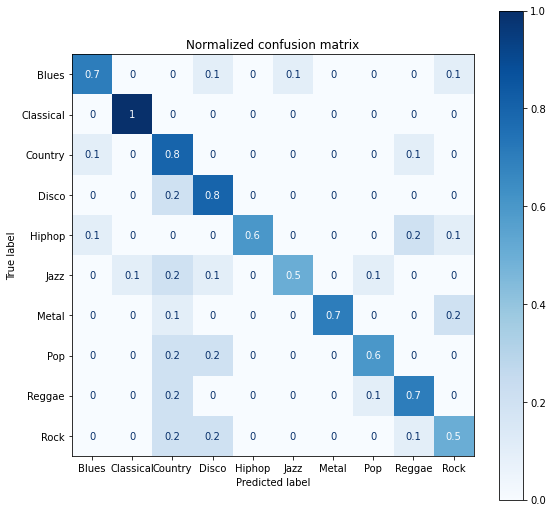

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.70      0.74        10
           1       0.91      1.00      0.95        10
           2       0.42      0.80      0.55        10
           3       0.57      0.80      0.67        10
           4       1.00      0.60      0.75        10
           5       0.83      0.50      0.62        10
           6       1.00      0.70      0.82        10
           7       0.75      0.60      0.67        10
           8       0.64      0.70      0.67        10
           9       0.56      0.50      0.53        10

    accuracy                           0.69       100
   macro avg       0.75      0.69      0.70       100
weighted avg       0.75      0.69      0.70       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

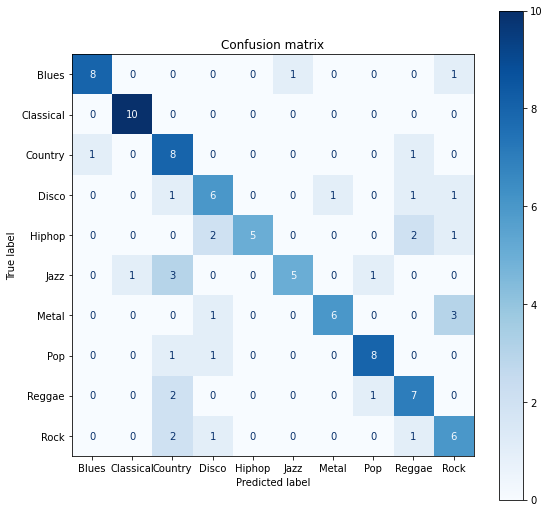

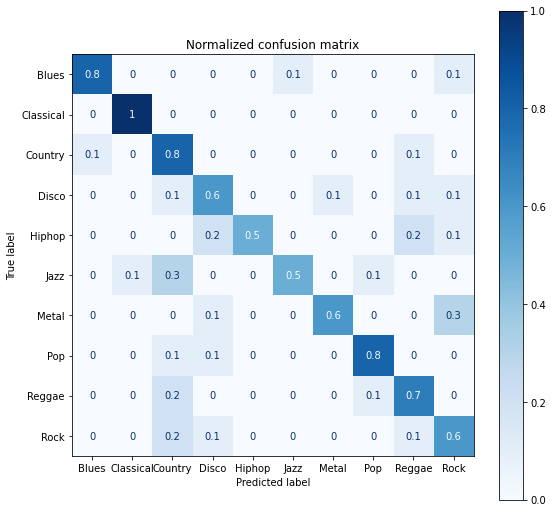

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        10
           1       0.91      1.00      0.95        10
           2       0.47      0.80      0.59        10
           3       0.55      0.60      0.57        10
           4       1.00      0.50      0.67        10
           5       0.83      0.50      0.62        10
           6       0.86      0.60      0.71        10
           7       0.80      0.80      0.80        10
           8       0.58      0.70      0.64        10
           9       0.50      0.60      0.55        10

    accuracy                           0.69       100
   macro avg       0.74      0.69      0.69       100
weighted avg       0.74      0.69      0.69       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

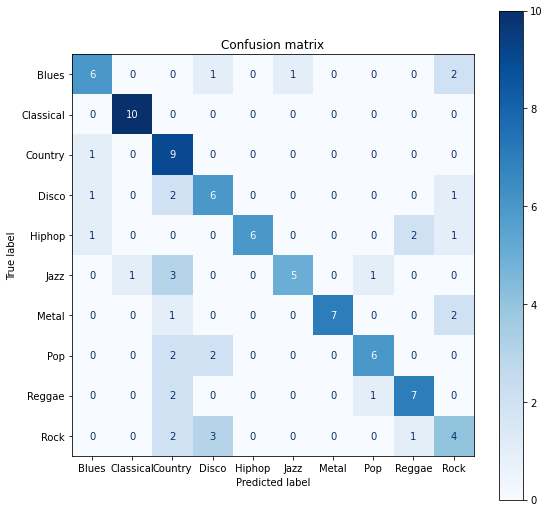

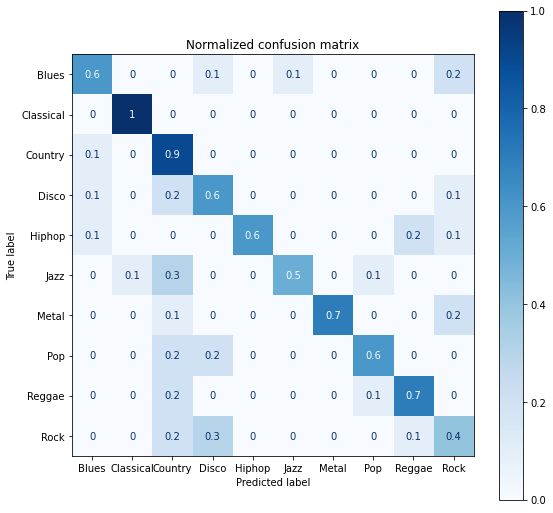

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.91      1.00      0.95        10
           2       0.43      0.90      0.58        10
           3       0.50      0.60      0.55        10
           4       1.00      0.60      0.75        10
           5       0.83      0.50      0.62        10
           6       1.00      0.70      0.82        10
           7       0.75      0.60      0.67        10
           8       0.70      0.70      0.70        10
           9       0.40      0.40      0.40        10

    accuracy                           0.66       100
   macro avg       0.72      0.66      0.67       100
weighted avg       0.72      0.66      0.67       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

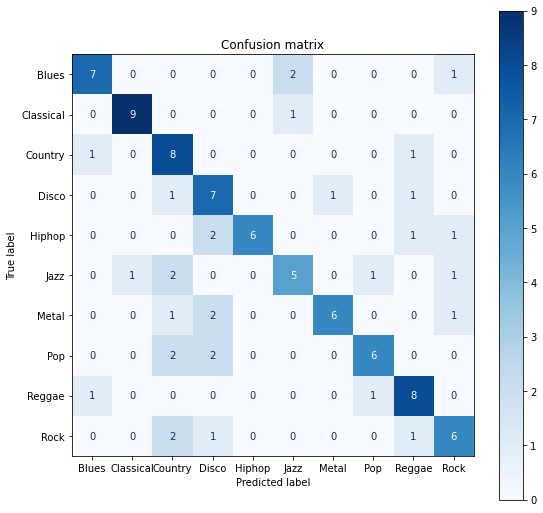

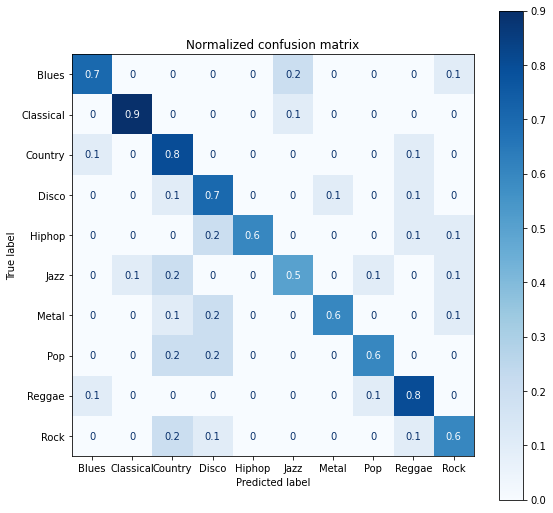

Accuracy score: 0.68 

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.70      0.74        10
           1       0.90      0.90      0.90        10
           2       0.50      0.80      0.62        10
           3       0.50      0.70      0.58        10
           4       1.00      0.60      0.75        10
           5       0.62      0.50      0.56        10
           6       0.86      0.60      0.71        10
           7       0.75      0.60      0.67        10
           8       0.67      0.80      0.73        10
           9       0.60      0.60      0.60        10

    accuracy                           0.68       100
   macro avg       0.72      0.68      0.68       100
weighted avg       0.72      0.68      0.68       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

**k = 30**


In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

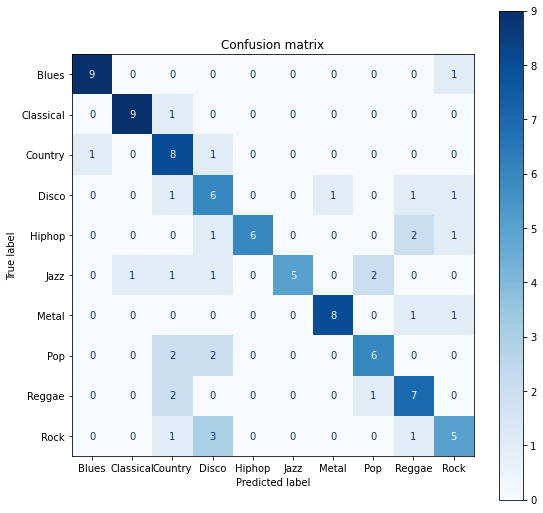

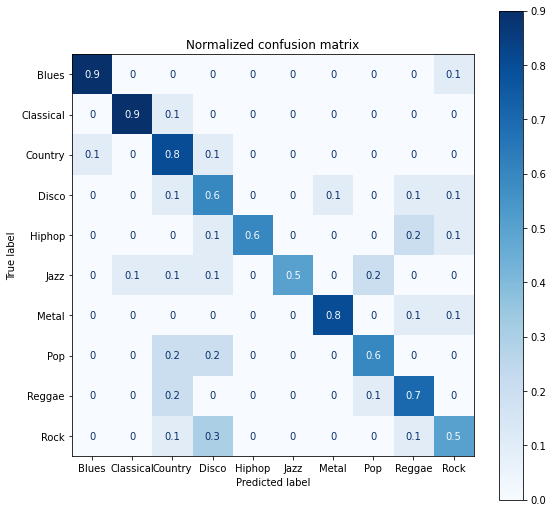

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.90      0.90      0.90        10
           2       0.50      0.80      0.62        10
           3       0.43      0.60      0.50        10
           4       1.00      0.60      0.75        10
           5       1.00      0.50      0.67        10
           6       0.89      0.80      0.84        10
           7       0.67      0.60      0.63        10
           8       0.58      0.70      0.64        10
           9       0.56      0.50      0.53        10

    accuracy                           0.69       100
   macro avg       0.74      0.69      0.70       100
weighted avg       0.74      0.69      0.70       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

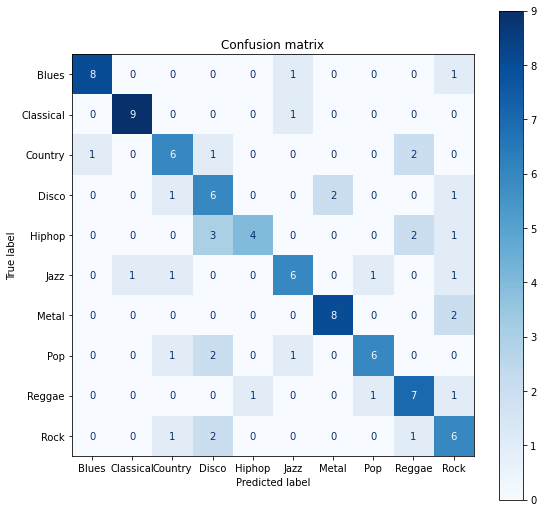

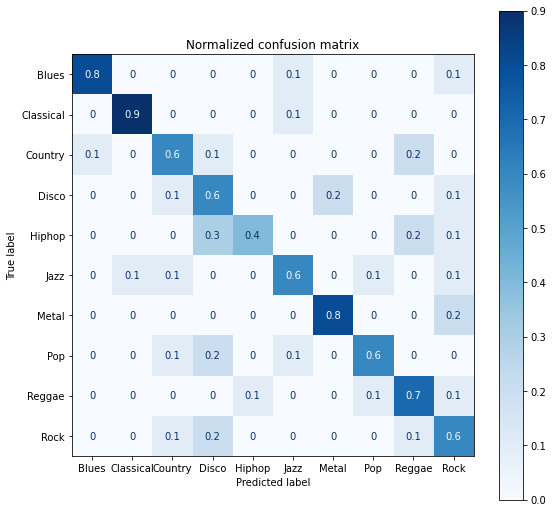

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        10
           1       0.90      0.90      0.90        10
           2       0.60      0.60      0.60        10
           3       0.43      0.60      0.50        10
           4       0.80      0.40      0.53        10
           5       0.67      0.60      0.63        10
           6       0.80      0.80      0.80        10
           7       0.75      0.60      0.67        10
           8       0.58      0.70      0.64        10
           9       0.46      0.60      0.52        10

    accuracy                           0.66       100
   macro avg       0.69      0.66      0.66       100
weighted avg       0.69      0.66      0.66       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

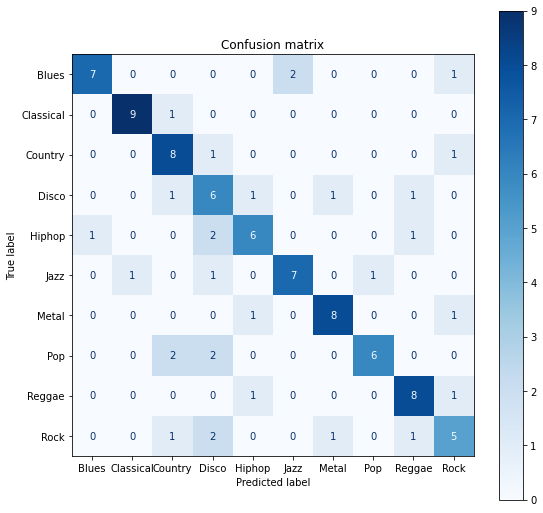

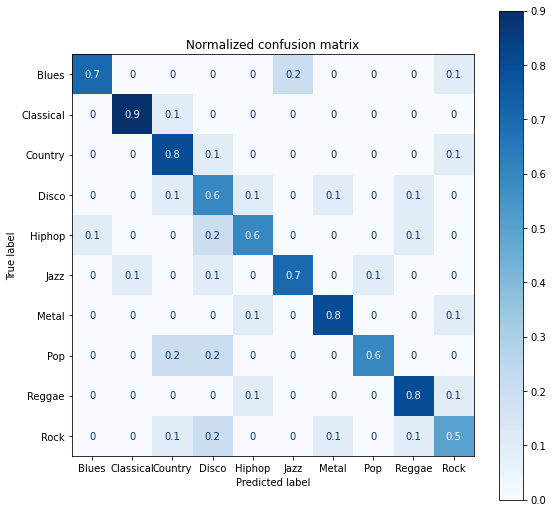

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.90      0.90      0.90        10
           2       0.62      0.80      0.70        10
           3       0.43      0.60      0.50        10
           4       0.67      0.60      0.63        10
           5       0.78      0.70      0.74        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.73      0.80      0.76        10
           9       0.56      0.50      0.53        10

    accuracy                           0.70       100
   macro avg       0.72      0.70      0.70       100
weighted avg       0.72      0.70      0.70       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

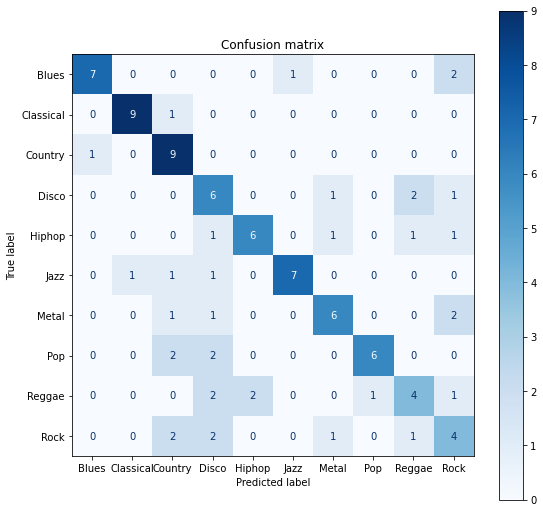

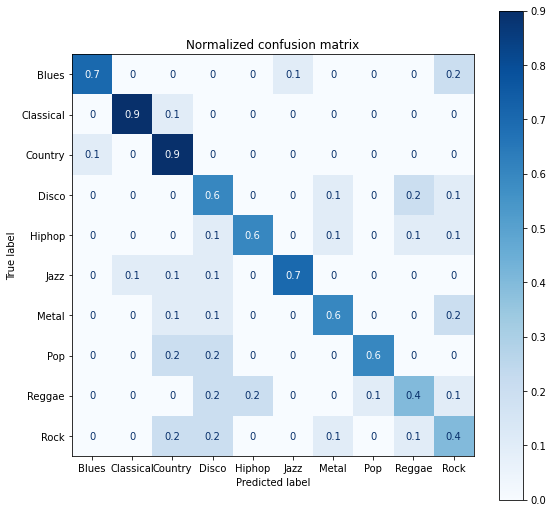

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.90      0.90      0.90        10
           2       0.56      0.90      0.69        10
           3       0.40      0.60      0.48        10
           4       0.75      0.60      0.67        10
           5       0.88      0.70      0.78        10
           6       0.67      0.60      0.63        10
           7       0.86      0.60      0.71        10
           8       0.50      0.40      0.44        10
           9       0.36      0.40      0.38        10

    accuracy                           0.64       100
   macro avg       0.67      0.64      0.65       100
weighted avg       0.67      0.64      0.65       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

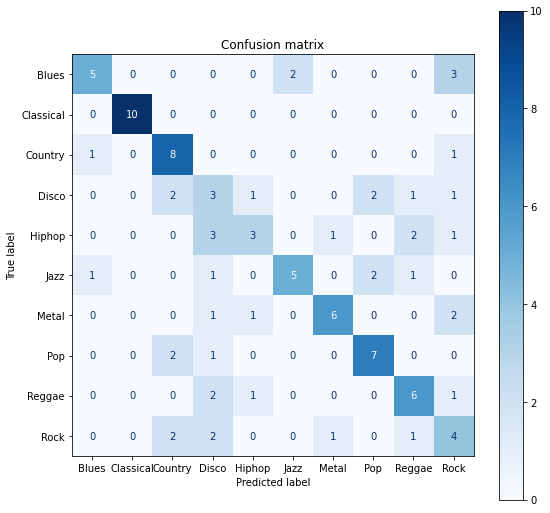

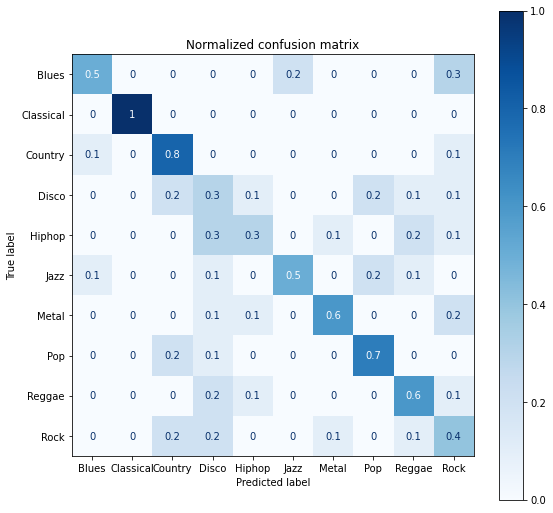

Accuracy score: 0.57 

Classification Report
              precision    recall  f1-score   support

           0       0.71      0.50      0.59        10
           1       1.00      1.00      1.00        10
           2       0.57      0.80      0.67        10
           3       0.23      0.30      0.26        10
           4       0.50      0.30      0.37        10
           5       0.71      0.50      0.59        10
           6       0.75      0.60      0.67        10
           7       0.64      0.70      0.67        10
           8       0.55      0.60      0.57        10
           9       0.31      0.40      0.35        10

    accuracy                           0.57       100
   macro avg       0.60      0.57      0.57       100
weighted avg       0.60      0.57      0.57       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

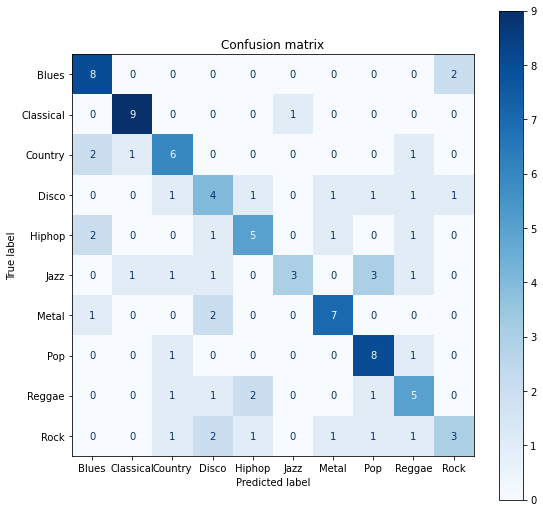

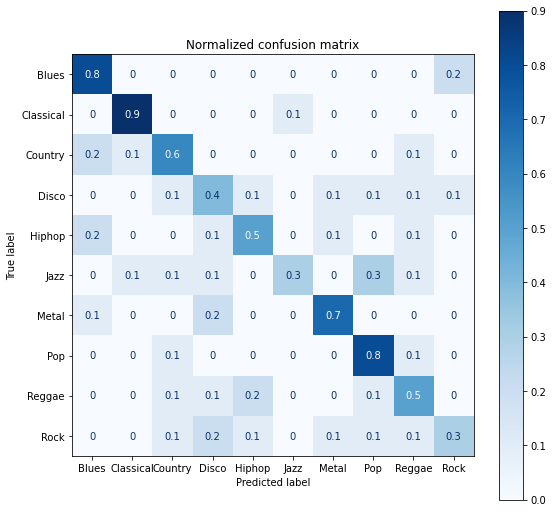

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.82      0.90      0.86        10
           2       0.55      0.60      0.57        10
           3       0.36      0.40      0.38        10
           4       0.56      0.50      0.53        10
           5       0.75      0.30      0.43        10
           6       0.70      0.70      0.70        10
           7       0.57      0.80      0.67        10
           8       0.45      0.50      0.48        10
           9       0.50      0.30      0.37        10

    accuracy                           0.58       100
   macro avg       0.59      0.58      0.57       100
weighted avg       0.59      0.58      0.57       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_ksel, y_train)

y_pred = knn.predict(x_test_ksel)

print_results(knn, x_test_ksel, y_test, y_pred)

### PCA

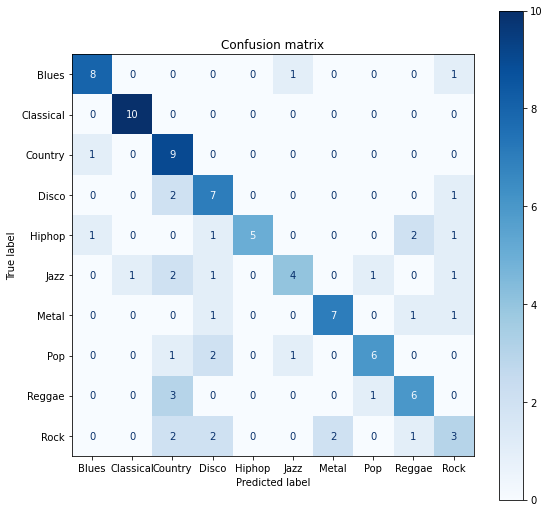

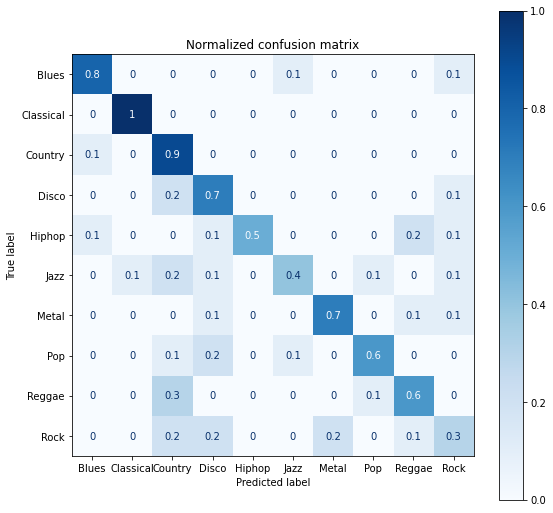

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.91      1.00      0.95        10
           2       0.47      0.90      0.62        10
           3       0.50      0.70      0.58        10
           4       1.00      0.50      0.67        10
           5       0.67      0.40      0.50        10
           6       0.78      0.70      0.74        10
           7       0.75      0.60      0.67        10
           8       0.60      0.60      0.60        10
           9       0.38      0.30      0.33        10

    accuracy                           0.65       100
   macro avg       0.69      0.65      0.65       100
weighted avg       0.69      0.65      0.65       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_pca, y_train)

y_pred = knn.predict(x_test_pca)

print_results(knn, x_test_pca, y_test, y_pred)

### LDA

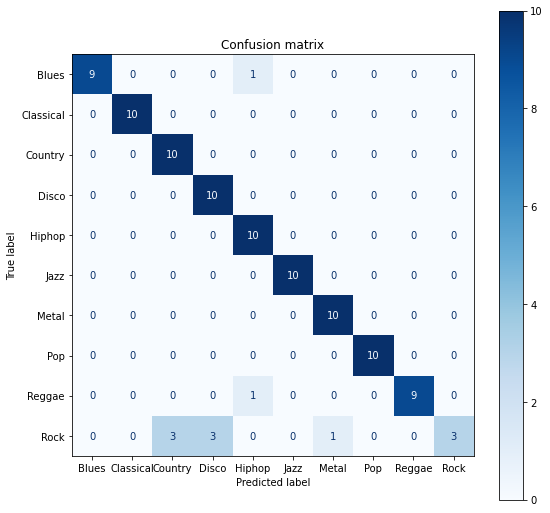

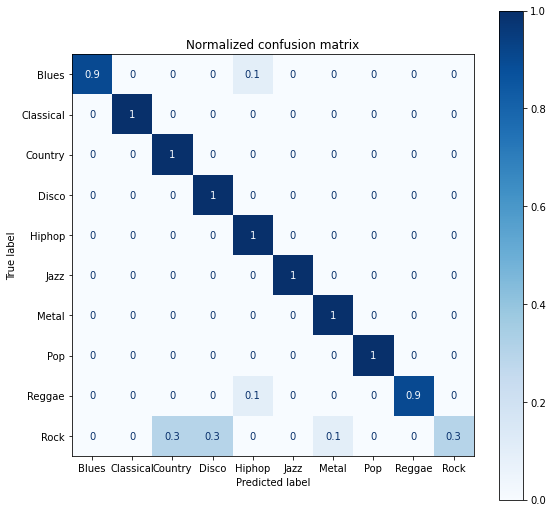

Accuracy score: 0.91 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       0.77      1.00      0.87        10
           3       0.77      1.00      0.87        10
           4       0.83      1.00      0.91        10
           5       1.00      1.00      1.00        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       1.00      0.90      0.95        10
           9       1.00      0.30      0.46        10

    accuracy                           0.91       100
   macro avg       0.93      0.91      0.90       100
weighted avg       0.93      0.91      0.90       100



In [ ]:
knn = _knn.best_estimator_
knn.fit(x_train_lda, y_train)

y_pred = knn.predict(x_test_lda)

print_results(knn, x_test_lda, y_test, y_pred)

## Decision Tree

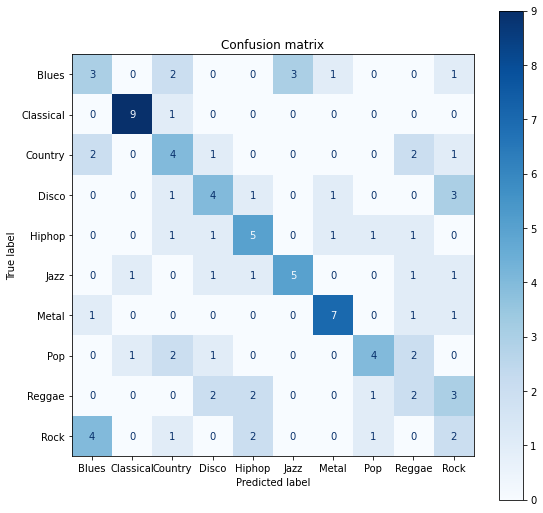

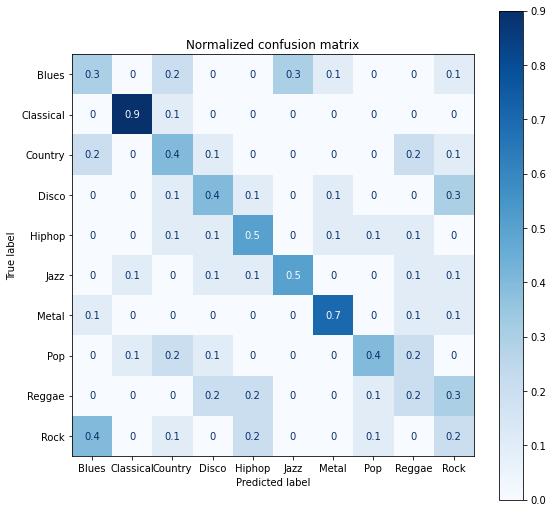

Accuracy score: 0.45 

Classification Report
              precision    recall  f1-score   support

           0       0.30      0.30      0.30        10
           1       0.82      0.90      0.86        10
           2       0.33      0.40      0.36        10
           3       0.40      0.40      0.40        10
           4       0.45      0.50      0.48        10
           5       0.62      0.50      0.56        10
           6       0.70      0.70      0.70        10
           7       0.57      0.40      0.47        10
           8       0.22      0.20      0.21        10
           9       0.17      0.20      0.18        10

    accuracy                           0.45       100
   macro avg       0.46      0.45      0.45       100
weighted avg       0.46      0.45      0.45       100



In [ ]:
criterion = ['gini', 'entropy']
splitter = ['best', 'random']
max_features = ['auto', 'sqrt', 'log2']

parameters = [{'criterion': criterion, 'splitter': splitter, 'max_features': max_features}]

_dt = GridSearchCV( DecisionTreeClassifier(), parameters)
_dt.fit(x_train, y_train)

y_pred = _dt.predict(x_test)

print_results(_dt, x_test, y_test, y_pred)

In [ ]:
_dt.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### Without highly correlated features

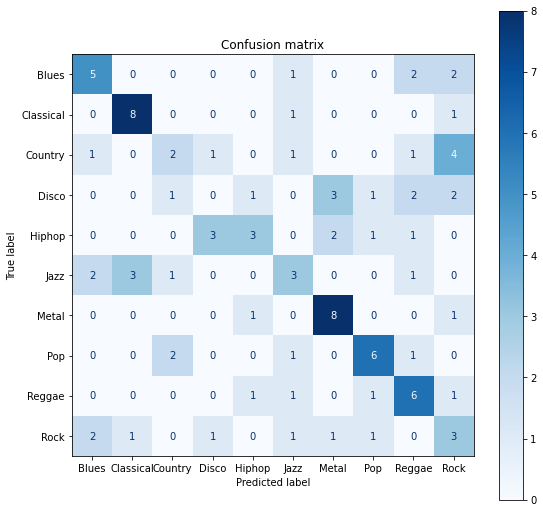

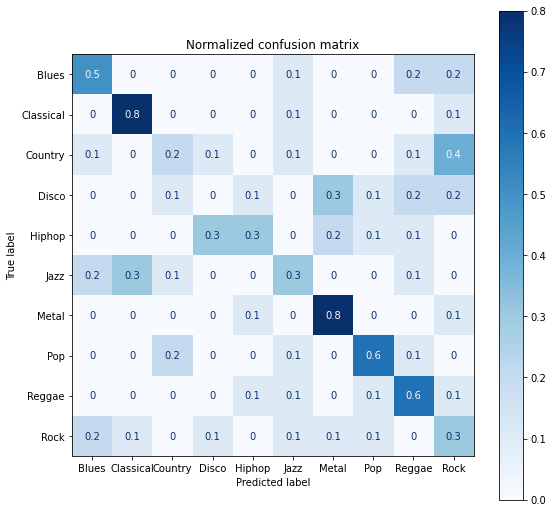

Accuracy score: 0.44 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.50      0.50        10
           1       0.67      0.80      0.73        10
           2       0.33      0.20      0.25        10
           3       0.00      0.00      0.00        10
           4       0.50      0.30      0.37        10
           5       0.33      0.30      0.32        10
           6       0.57      0.80      0.67        10
           7       0.60      0.60      0.60        10
           8       0.43      0.60      0.50        10
           9       0.21      0.30      0.25        10

    accuracy                           0.44       100
   macro avg       0.41      0.44      0.42       100
weighted avg       0.41      0.44      0.42       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_wcorr, y_train_wcorr)

y_pred = dt.predict(x_test_wcorr)

print_results(dt, x_test_wcorr, y_test_wcorr, y_pred)

### Without low - variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

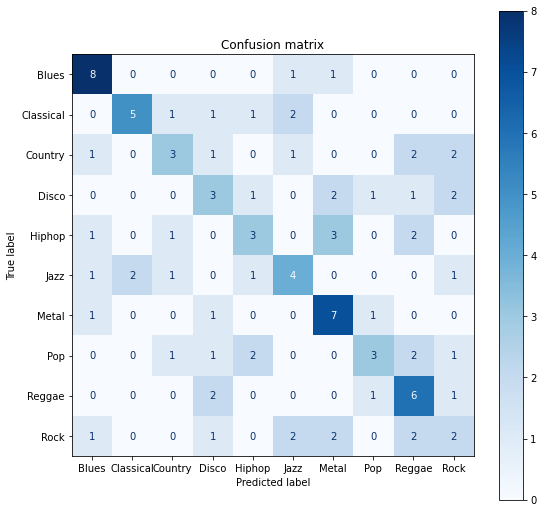

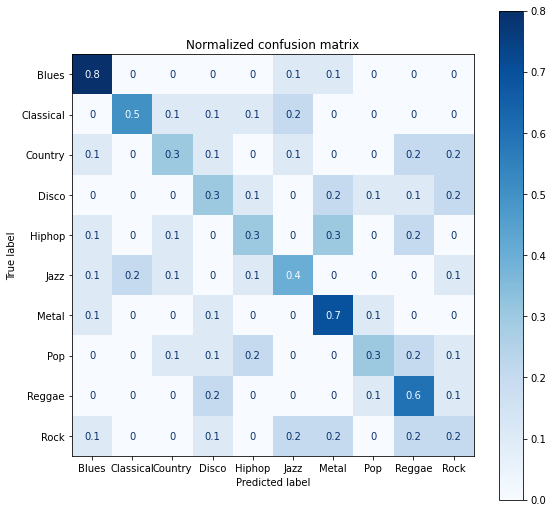

Accuracy score: 0.44 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.71      0.50      0.59        10
           2       0.43      0.30      0.35        10
           3       0.30      0.30      0.30        10
           4       0.38      0.30      0.33        10
           5       0.40      0.40      0.40        10
           6       0.47      0.70      0.56        10
           7       0.50      0.30      0.37        10
           8       0.40      0.60      0.48        10
           9       0.22      0.20      0.21        10

    accuracy                           0.44       100
   macro avg       0.44      0.44      0.43       100
weighted avg       0.44      0.44      0.43       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_sel, y_train)

y_pred = dt.predict(x_test_sel)

print_results(dt, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

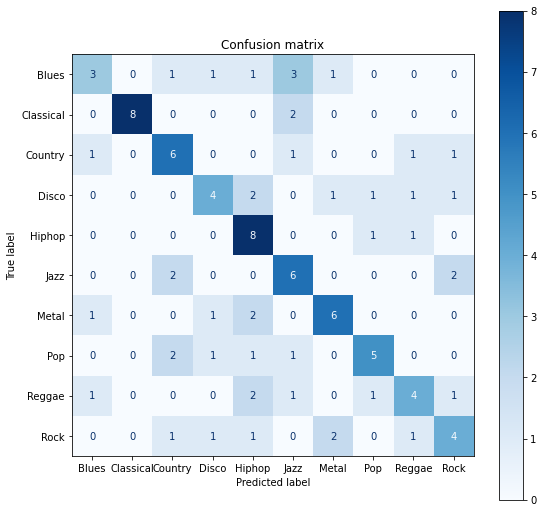

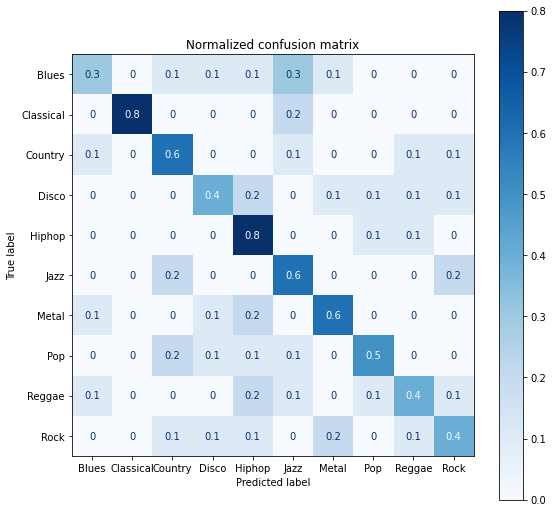

Accuracy score: 0.54 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.30      0.37        10
           1       1.00      0.80      0.89        10
           2       0.50      0.60      0.55        10
           3       0.50      0.40      0.44        10
           4       0.47      0.80      0.59        10
           5       0.43      0.60      0.50        10
           6       0.60      0.60      0.60        10
           7       0.62      0.50      0.56        10
           8       0.50      0.40      0.44        10
           9       0.44      0.40      0.42        10

    accuracy                           0.54       100
   macro avg       0.56      0.54      0.54       100
weighted avg       0.56      0.54      0.54       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

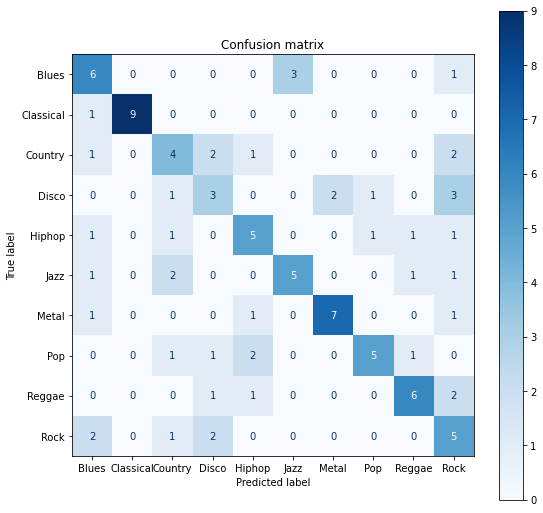

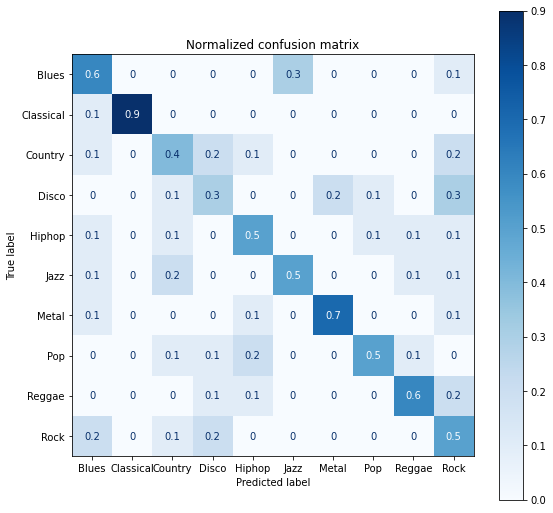

Accuracy score: 0.55 

Classification Report
              precision    recall  f1-score   support

           0       0.46      0.60      0.52        10
           1       1.00      0.90      0.95        10
           2       0.40      0.40      0.40        10
           3       0.33      0.30      0.32        10
           4       0.50      0.50      0.50        10
           5       0.62      0.50      0.56        10
           6       0.78      0.70      0.74        10
           7       0.71      0.50      0.59        10
           8       0.67      0.60      0.63        10
           9       0.31      0.50      0.38        10

    accuracy                           0.55       100
   macro avg       0.58      0.55      0.56       100
weighted avg       0.58      0.55      0.56       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

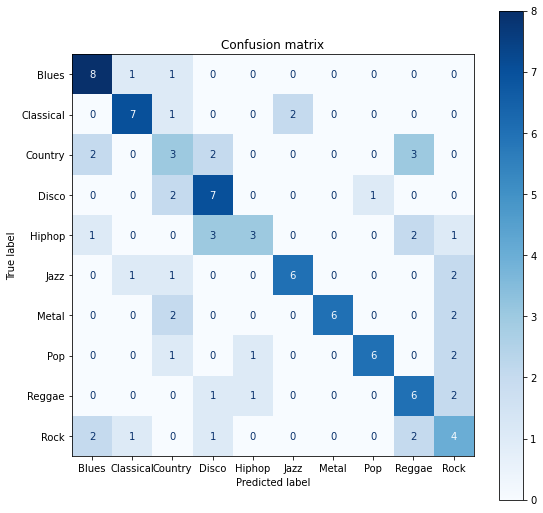

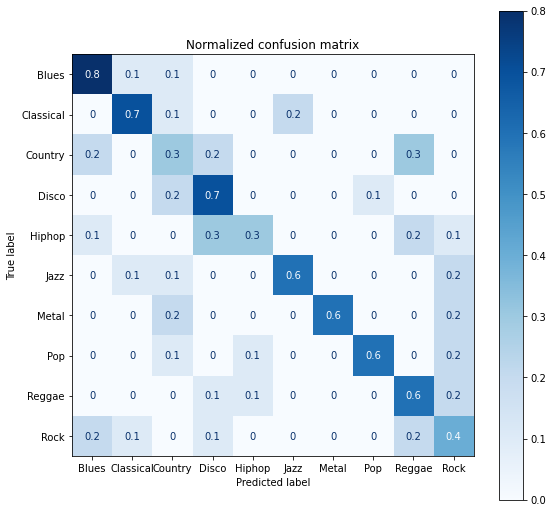

Accuracy score: 0.56 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.70      0.70      0.70        10
           2       0.27      0.30      0.29        10
           3       0.50      0.70      0.58        10
           4       0.60      0.30      0.40        10
           5       0.75      0.60      0.67        10
           6       1.00      0.60      0.75        10
           7       0.86      0.60      0.71        10
           8       0.46      0.60      0.52        10
           9       0.31      0.40      0.35        10

    accuracy                           0.56       100
   macro avg       0.61      0.56      0.57       100
weighted avg       0.61      0.56      0.57       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

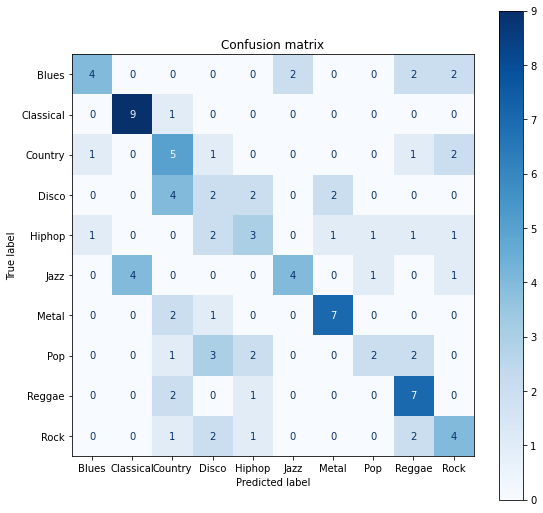

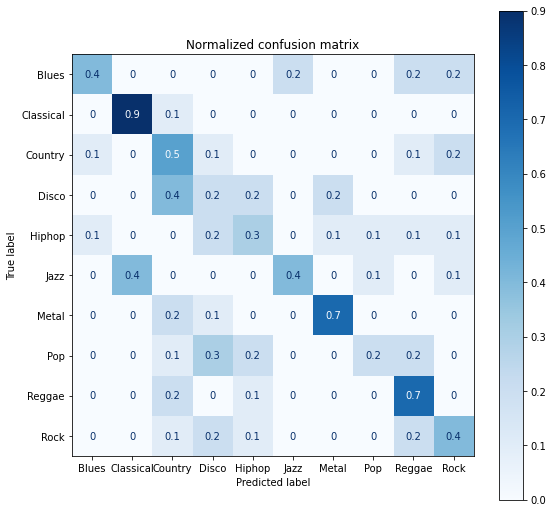

Accuracy score: 0.47 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.40      0.50        10
           1       0.69      0.90      0.78        10
           2       0.31      0.50      0.38        10
           3       0.18      0.20      0.19        10
           4       0.33      0.30      0.32        10
           5       0.67      0.40      0.50        10
           6       0.70      0.70      0.70        10
           7       0.50      0.20      0.29        10
           8       0.47      0.70      0.56        10
           9       0.40      0.40      0.40        10

    accuracy                           0.47       100
   macro avg       0.49      0.47      0.46       100
weighted avg       0.49      0.47      0.46       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

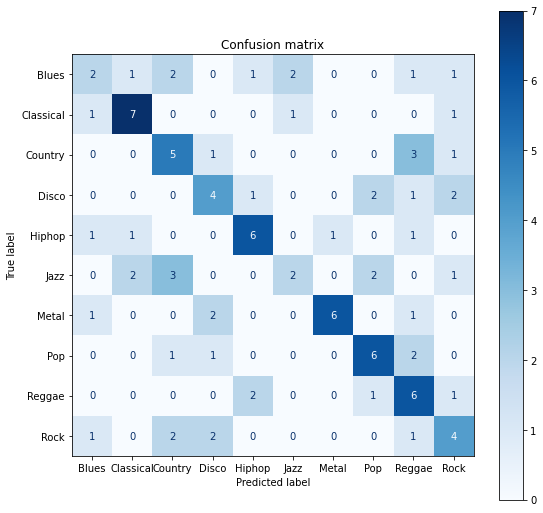

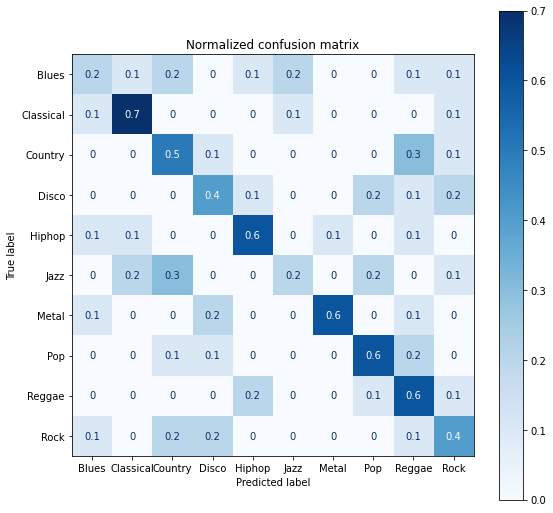

Accuracy score: 0.48 

Classification Report
              precision    recall  f1-score   support

           0       0.33      0.20      0.25        10
           1       0.64      0.70      0.67        10
           2       0.38      0.50      0.43        10
           3       0.40      0.40      0.40        10
           4       0.60      0.60      0.60        10
           5       0.40      0.20      0.27        10
           6       0.86      0.60      0.71        10
           7       0.55      0.60      0.57        10
           8       0.38      0.60      0.46        10
           9       0.36      0.40      0.38        10

    accuracy                           0.48       100
   macro avg       0.49      0.48      0.47       100
weighted avg       0.49      0.48      0.47       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

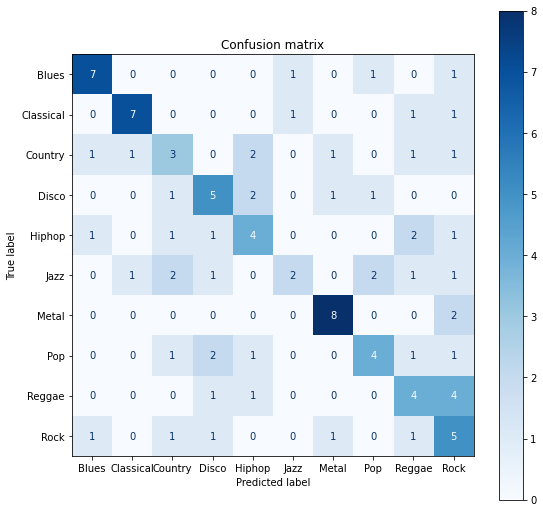

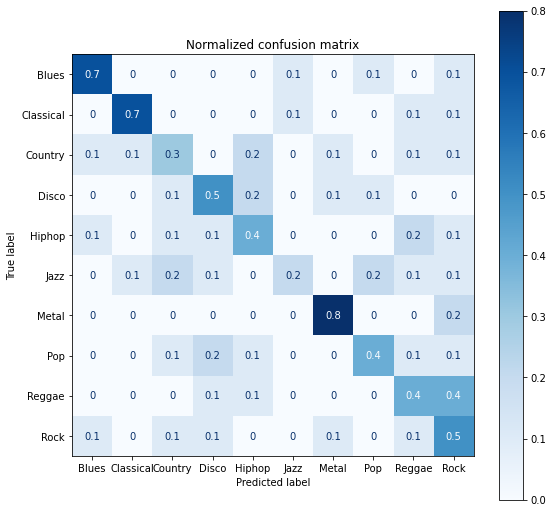

Accuracy score: 0.49 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.78      0.70      0.74        10
           2       0.33      0.30      0.32        10
           3       0.45      0.50      0.48        10
           4       0.40      0.40      0.40        10
           5       0.50      0.20      0.29        10
           6       0.73      0.80      0.76        10
           7       0.50      0.40      0.44        10
           8       0.36      0.40      0.38        10
           9       0.29      0.50      0.37        10

    accuracy                           0.49       100
   macro avg       0.51      0.49      0.49       100
weighted avg       0.51      0.49      0.49       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

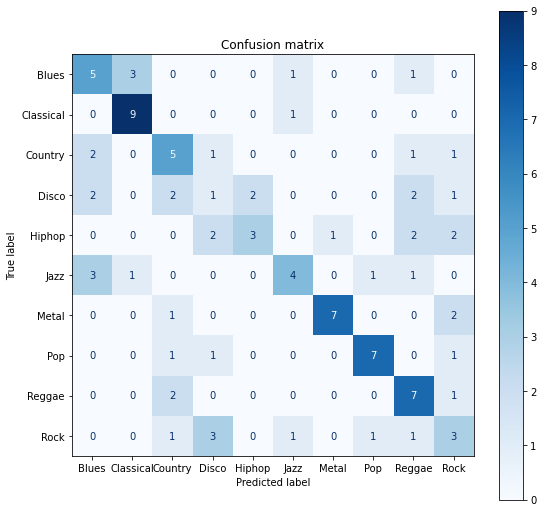

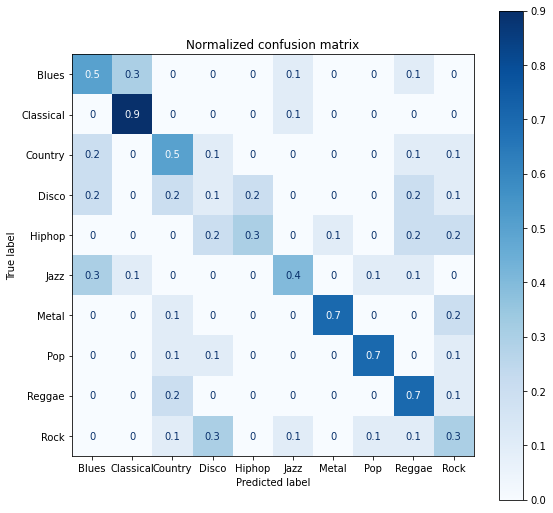

Accuracy score: 0.51 

Classification Report
              precision    recall  f1-score   support

           0       0.42      0.50      0.45        10
           1       0.69      0.90      0.78        10
           2       0.42      0.50      0.45        10
           3       0.12      0.10      0.11        10
           4       0.60      0.30      0.40        10
           5       0.57      0.40      0.47        10
           6       0.88      0.70      0.78        10
           7       0.78      0.70      0.74        10
           8       0.47      0.70      0.56        10
           9       0.27      0.30      0.29        10

    accuracy                           0.51       100
   macro avg       0.52      0.51      0.50       100
weighted avg       0.52      0.51      0.50       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

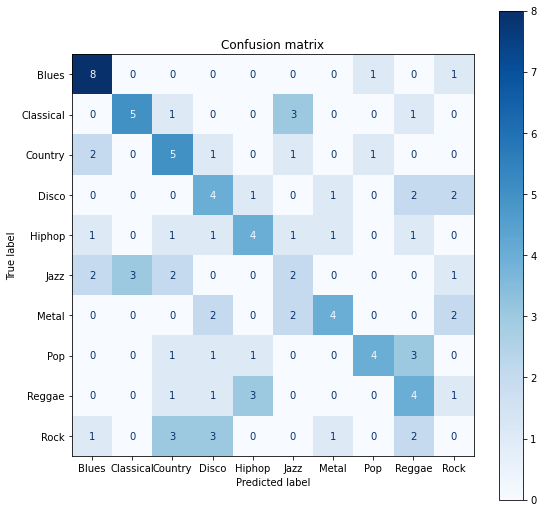

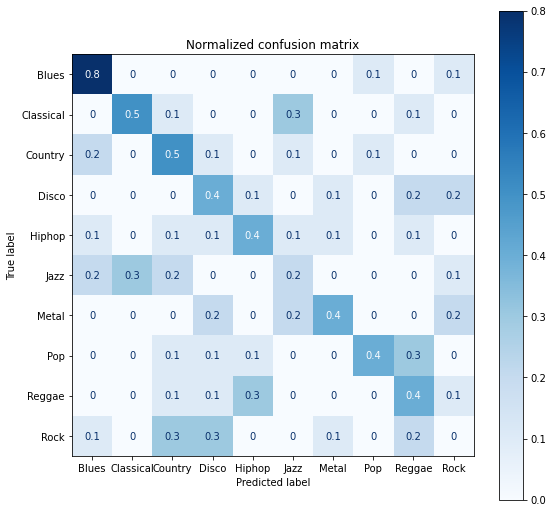

Accuracy score: 0.4 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.62      0.50      0.56        10
           2       0.36      0.50      0.42        10
           3       0.31      0.40      0.35        10
           4       0.44      0.40      0.42        10
           5       0.22      0.20      0.21        10
           6       0.57      0.40      0.47        10
           7       0.67      0.40      0.50        10
           8       0.31      0.40      0.35        10
           9       0.00      0.00      0.00        10

    accuracy                           0.40       100
   macro avg       0.41      0.40      0.39       100
weighted avg       0.41      0.40      0.39       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

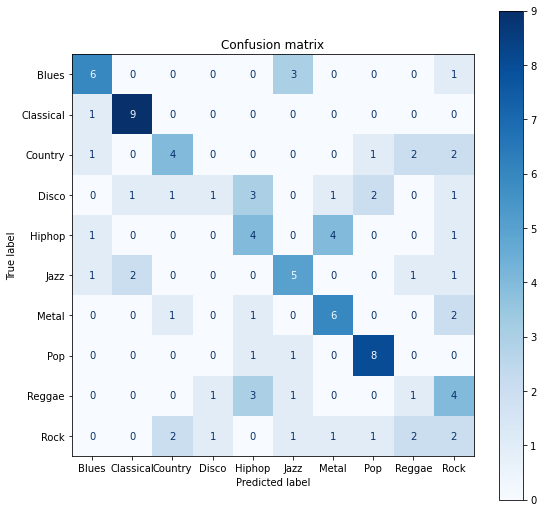

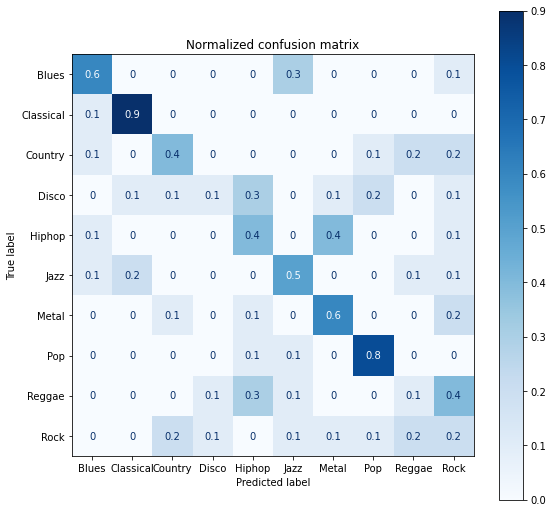

Accuracy score: 0.46 

Classification Report
              precision    recall  f1-score   support

           0       0.60      0.60      0.60        10
           1       0.75      0.90      0.82        10
           2       0.50      0.40      0.44        10
           3       0.33      0.10      0.15        10
           4       0.33      0.40      0.36        10
           5       0.45      0.50      0.48        10
           6       0.50      0.60      0.55        10
           7       0.67      0.80      0.73        10
           8       0.17      0.10      0.12        10
           9       0.14      0.20      0.17        10

    accuracy                           0.46       100
   macro avg       0.44      0.46      0.44       100
weighted avg       0.44      0.46      0.44       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

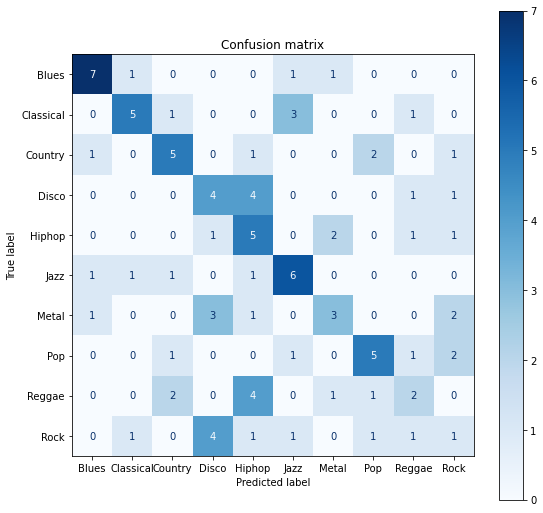

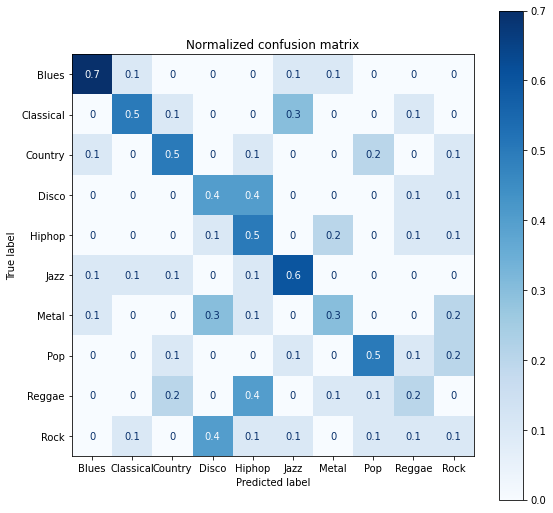

Accuracy score: 0.43 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.62      0.50      0.56        10
           2       0.50      0.50      0.50        10
           3       0.33      0.40      0.36        10
           4       0.29      0.50      0.37        10
           5       0.50      0.60      0.55        10
           6       0.43      0.30      0.35        10
           7       0.56      0.50      0.53        10
           8       0.29      0.20      0.24        10
           9       0.12      0.10      0.11        10

    accuracy                           0.43       100
   macro avg       0.43      0.43      0.43       100
weighted avg       0.43      0.43      0.43       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_ksel, y_train)

y_pred = dt.predict(x_test_ksel)

print_results(dt, x_test_ksel, y_test, y_pred)

### Recursive Feature Elimination (RFE)
**n_features_to_select = 50**

In [ ]:
rfe = RFE(estimator = _dt.best_estimator_, n_features_to_select = 50)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

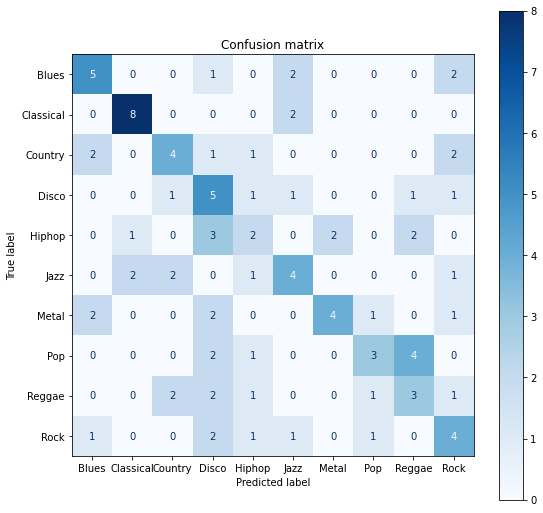

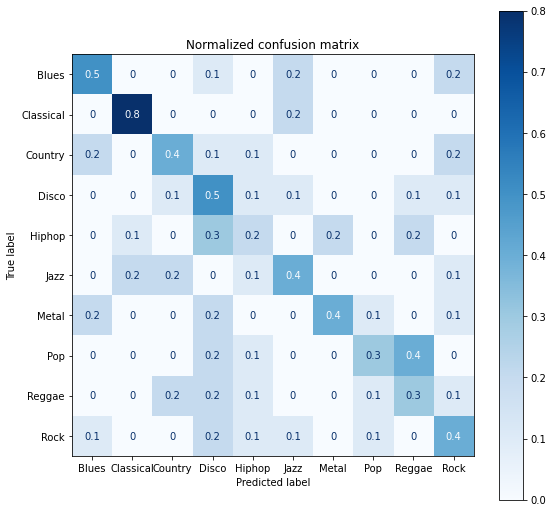

Accuracy score: 0.42 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.50      0.50        10
           1       0.73      0.80      0.76        10
           2       0.44      0.40      0.42        10
           3       0.28      0.50      0.36        10
           4       0.25      0.20      0.22        10
           5       0.40      0.40      0.40        10
           6       0.67      0.40      0.50        10
           7       0.50      0.30      0.37        10
           8       0.30      0.30      0.30        10
           9       0.33      0.40      0.36        10

    accuracy                           0.42       100
   macro avg       0.44      0.42      0.42       100
weighted avg       0.44      0.42      0.42       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_rfe, y_train)

y_pred = dt.predict(x_test_rfe)

print_results(dt, x_test_rfe, y_test, y_pred)

**n_features_to_select = 40**

In [ ]:
rfe = RFE(estimator = _dt.best_estimator_, n_features_to_select = 40)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

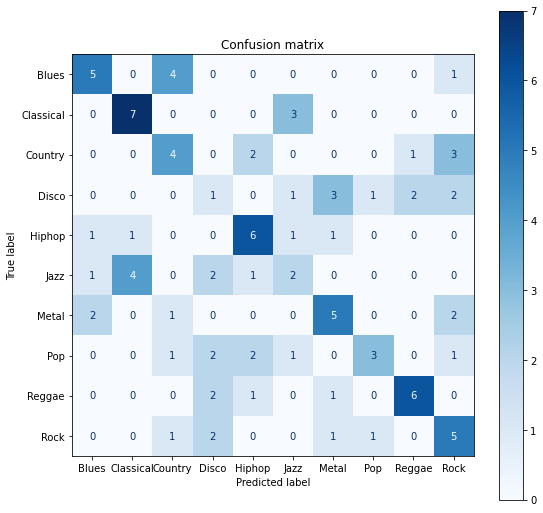

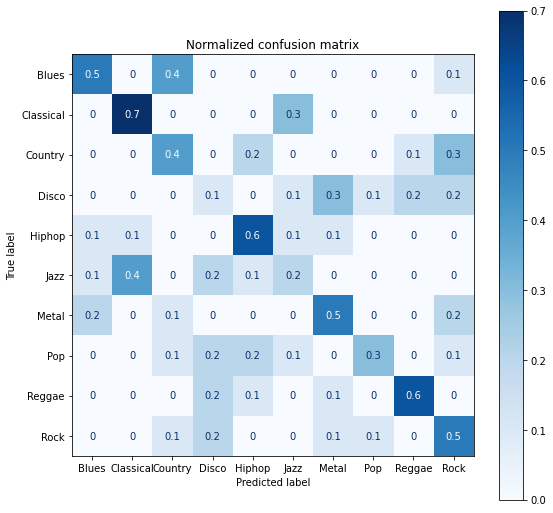

Accuracy score: 0.44 

Classification Report
              precision    recall  f1-score   support

           0       0.56      0.50      0.53        10
           1       0.58      0.70      0.64        10
           2       0.36      0.40      0.38        10
           3       0.11      0.10      0.11        10
           4       0.50      0.60      0.55        10
           5       0.25      0.20      0.22        10
           6       0.45      0.50      0.48        10
           7       0.60      0.30      0.40        10
           8       0.67      0.60      0.63        10
           9       0.36      0.50      0.42        10

    accuracy                           0.44       100
   macro avg       0.44      0.44      0.43       100
weighted avg       0.44      0.44      0.43       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_rfe, y_train)

y_pred = dt.predict(x_test_rfe)

print_results(dt, x_test_rfe, y_test, y_pred)

**n_features_to_select = 30**

In [ ]:
rfe = RFE(estimator = _dt.best_estimator_, n_features_to_select = 30)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

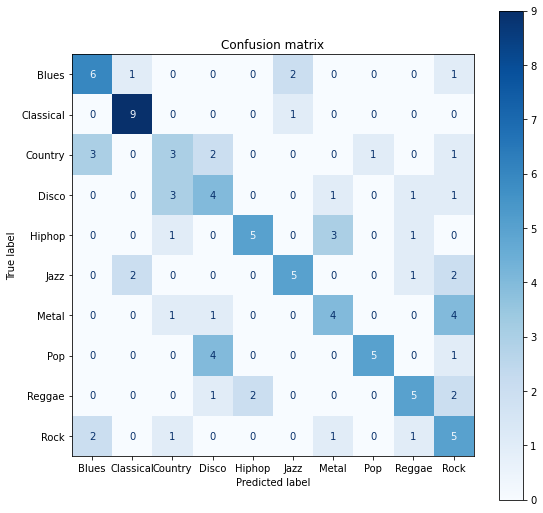

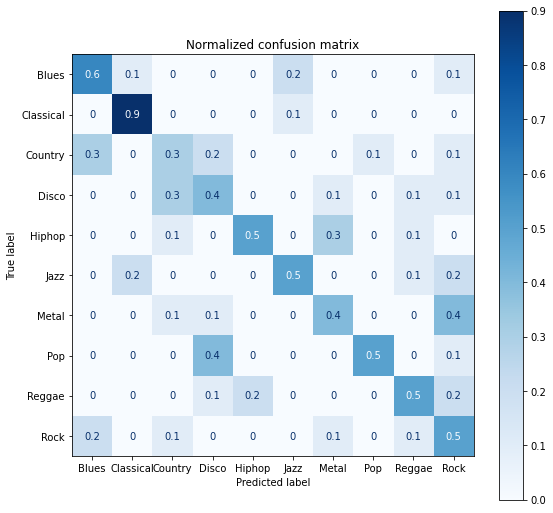

Accuracy score: 0.51 

Classification Report
              precision    recall  f1-score   support

           0       0.55      0.60      0.57        10
           1       0.75      0.90      0.82        10
           2       0.33      0.30      0.32        10
           3       0.33      0.40      0.36        10
           4       0.71      0.50      0.59        10
           5       0.62      0.50      0.56        10
           6       0.44      0.40      0.42        10
           7       0.83      0.50      0.62        10
           8       0.56      0.50      0.53        10
           9       0.29      0.50      0.37        10

    accuracy                           0.51       100
   macro avg       0.54      0.51      0.52       100
weighted avg       0.54      0.51      0.52       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_rfe, y_train)

y_pred = dt.predict(x_test_rfe)

print_results(dt, x_test_rfe, y_test, y_pred)

**n_features_to_select = 20**

In [ ]:
rfe = RFE(estimator = _dt.best_estimator_, n_features_to_select = 20)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)


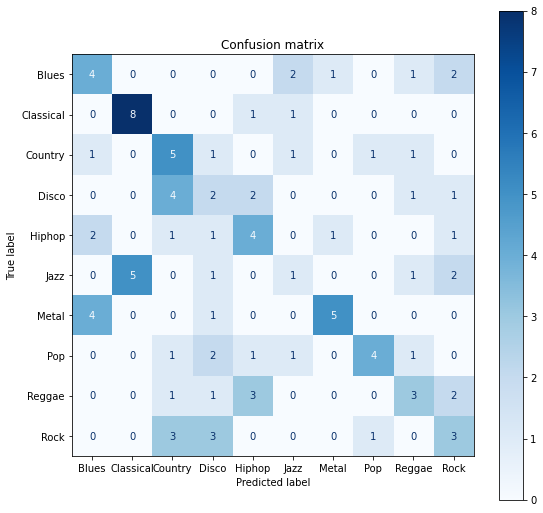

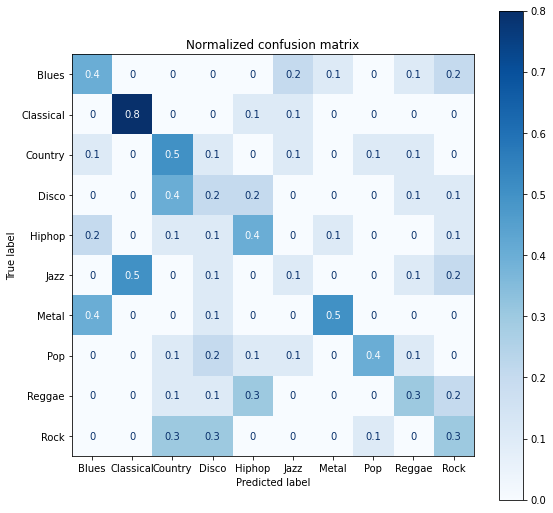

Accuracy score: 0.39 

Classification Report
              precision    recall  f1-score   support

           0       0.36      0.40      0.38        10
           1       0.62      0.80      0.70        10
           2       0.33      0.50      0.40        10
           3       0.17      0.20      0.18        10
           4       0.36      0.40      0.38        10
           5       0.17      0.10      0.12        10
           6       0.71      0.50      0.59        10
           7       0.67      0.40      0.50        10
           8       0.38      0.30      0.33        10
           9       0.27      0.30      0.29        10

    accuracy                           0.39       100
   macro avg       0.40      0.39      0.39       100
weighted avg       0.40      0.39      0.39       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_rfe, y_train)

y_pred = dt.predict(x_test_rfe)

print_results(dt, x_test_rfe, y_test, y_pred)

**n_features_to_select = 10**

In [ ]:
rfe = RFE(estimator = _dt.best_estimator_, n_features_to_select = 10)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

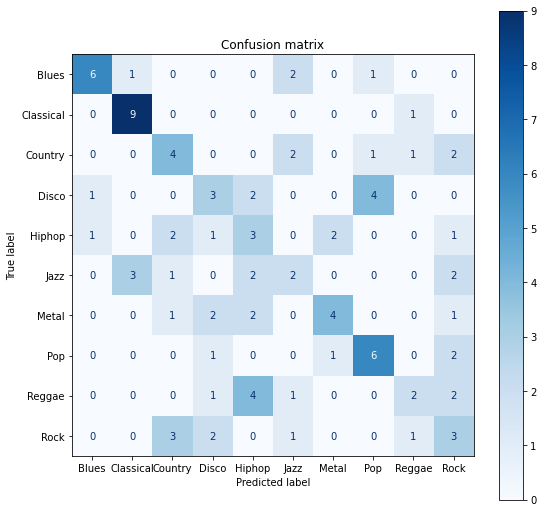

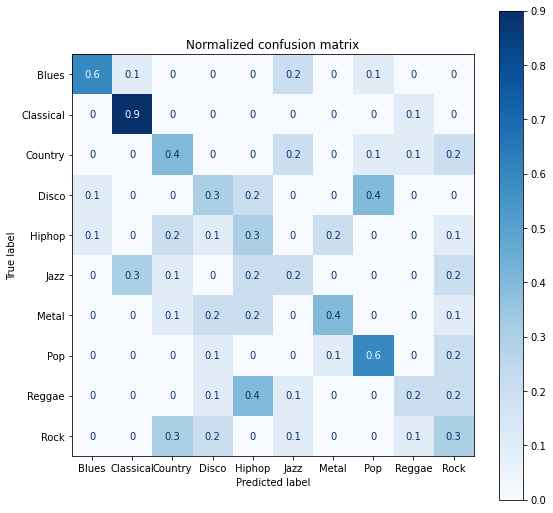

Accuracy score: 0.42 

Classification Report
              precision    recall  f1-score   support

           0       0.75      0.60      0.67        10
           1       0.69      0.90      0.78        10
           2       0.36      0.40      0.38        10
           3       0.30      0.30      0.30        10
           4       0.23      0.30      0.26        10
           5       0.25      0.20      0.22        10
           6       0.57      0.40      0.47        10
           7       0.50      0.60      0.55        10
           8       0.40      0.20      0.27        10
           9       0.23      0.30      0.26        10

    accuracy                           0.42       100
   macro avg       0.43      0.42      0.42       100
weighted avg       0.43      0.42      0.42       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_rfe, y_train)

y_pred = dt.predict(x_test_rfe)

print_results(dt, x_test_rfe, y_test, y_pred)

### Select features based on importance weights

In [ ]:
selector = SelectFromModel(estimator = _dt.best_estimator_)
selector.fit(x_train, y_train)
selector.fit(x_test, y_test)

x_train_sfm = selector.transform(x_train)
x_test_sfm = selector.transform(x_test)

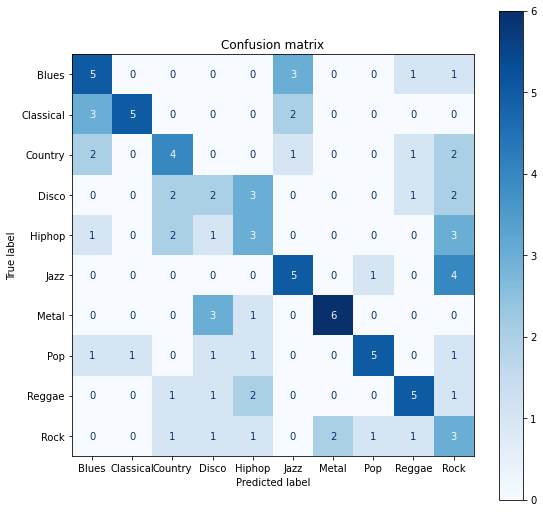

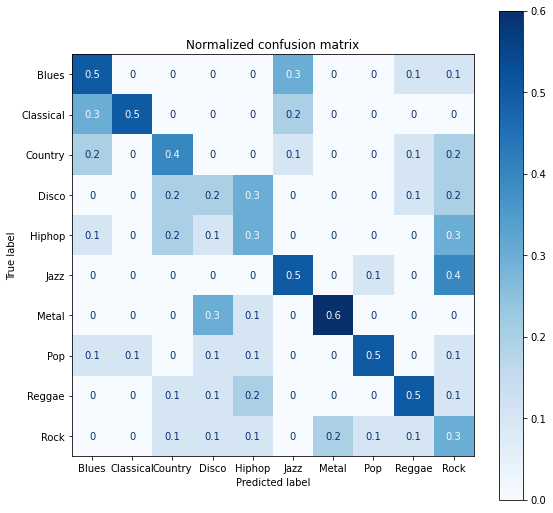

Accuracy score: 0.43 

Classification Report
              precision    recall  f1-score   support

           0       0.42      0.50      0.45        10
           1       0.83      0.50      0.62        10
           2       0.40      0.40      0.40        10
           3       0.22      0.20      0.21        10
           4       0.27      0.30      0.29        10
           5       0.45      0.50      0.48        10
           6       0.75      0.60      0.67        10
           7       0.71      0.50      0.59        10
           8       0.56      0.50      0.53        10
           9       0.18      0.30      0.22        10

    accuracy                           0.43       100
   macro avg       0.48      0.43      0.45       100
weighted avg       0.48      0.43      0.45       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_sfm, y_train)

y_pred = dt.predict(x_test_sfm)

print_results(dt, x_test_sfm, y_test, y_pred)

### PCA

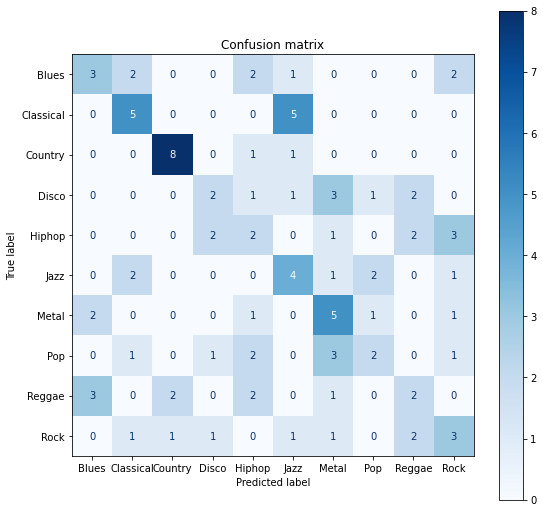

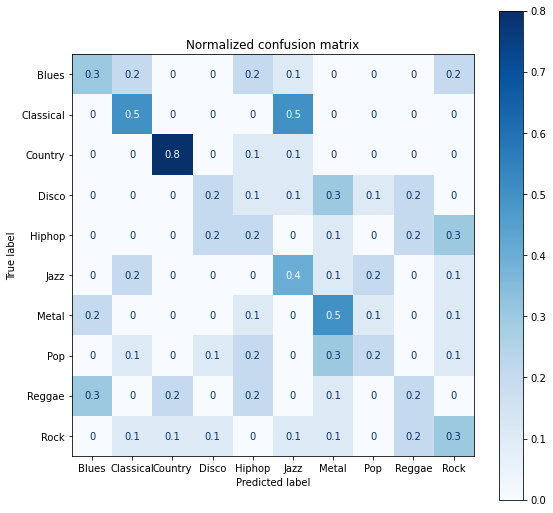

Accuracy score: 0.36 

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.30      0.33        10
           1       0.45      0.50      0.48        10
           2       0.73      0.80      0.76        10
           3       0.33      0.20      0.25        10
           4       0.18      0.20      0.19        10
           5       0.31      0.40      0.35        10
           6       0.33      0.50      0.40        10
           7       0.33      0.20      0.25        10
           8       0.25      0.20      0.22        10
           9       0.27      0.30      0.29        10

    accuracy                           0.36       100
   macro avg       0.36      0.36      0.35       100
weighted avg       0.36      0.36      0.35       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_pca, y_train)

y_pred = dt.predict(x_test_pca)

print_results(dt, x_test_pca, y_test, y_pred)

### LDA

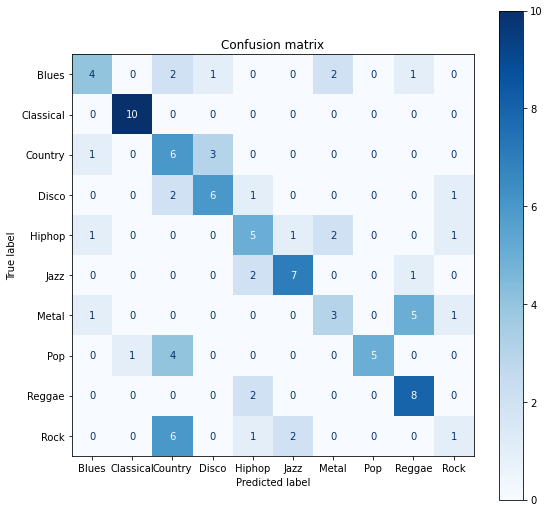

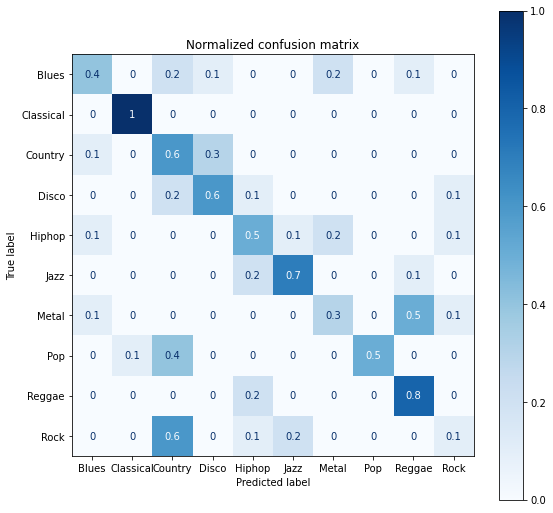

Accuracy score: 0.55 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.40      0.47        10
           1       0.91      1.00      0.95        10
           2       0.30      0.60      0.40        10
           3       0.60      0.60      0.60        10
           4       0.45      0.50      0.48        10
           5       0.70      0.70      0.70        10
           6       0.43      0.30      0.35        10
           7       1.00      0.50      0.67        10
           8       0.53      0.80      0.64        10
           9       0.25      0.10      0.14        10

    accuracy                           0.55       100
   macro avg       0.57      0.55      0.54       100
weighted avg       0.57      0.55      0.54       100



In [ ]:
dt = _dt.best_estimator_
dt.fit(x_train_lda, y_train)

y_pred = dt.predict(x_test_lda)

print_results(dt, x_test_lda, y_test, y_pred)

## Random Forest

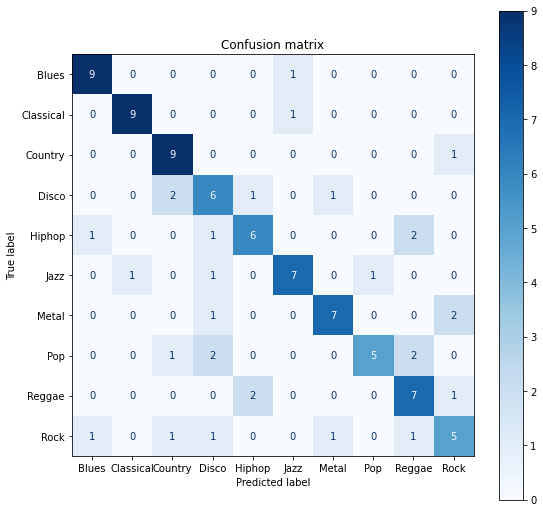

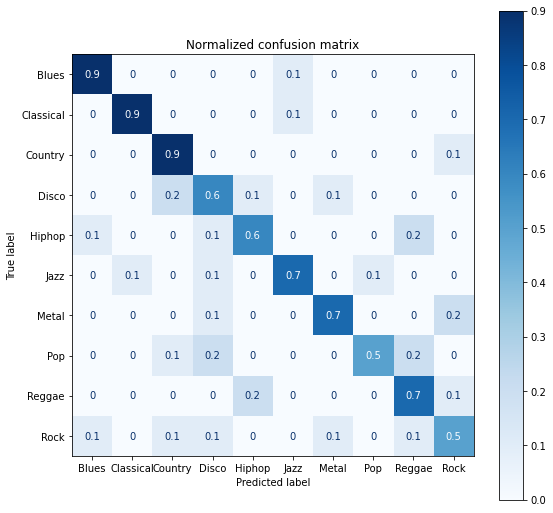

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.90      0.90      0.90        10
           2       0.69      0.90      0.78        10
           3       0.50      0.60      0.55        10
           4       0.67      0.60      0.63        10
           5       0.78      0.70      0.74        10
           6       0.78      0.70      0.74        10
           7       0.83      0.50      0.62        10
           8       0.58      0.70      0.64        10
           9       0.56      0.50      0.53        10

    accuracy                           0.70       100
   macro avg       0.71      0.70      0.70       100
weighted avg       0.71      0.70      0.70       100



In [ ]:
criterion = ['gini', 'entropy']
max_features = ['auto', 'sqrt', 'log2']

parameters = [{'criterion': criterion, 'max_features': max_features}]

_rf = GridSearchCV(RandomForestClassifier(n_estimators = 10_000), parameters)
_rf.fit(x_train, y_train)

y_pred = _rf.predict(x_test)

print_results(_rf, x_test, y_test, y_pred)

In [ ]:
_rf.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

### Without higly correlated features

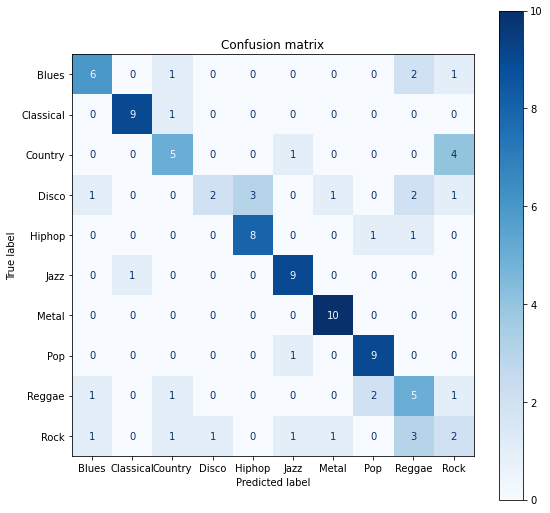

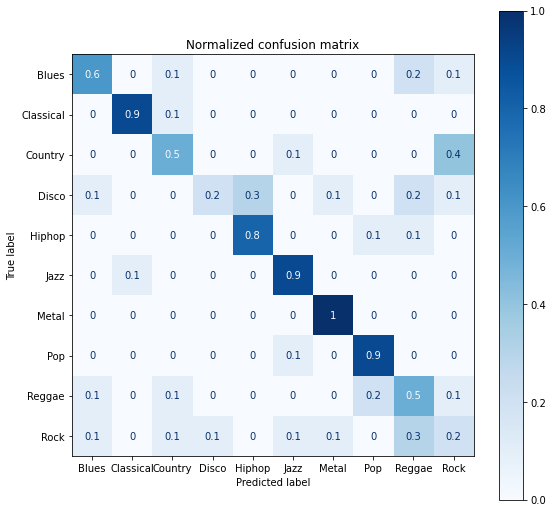

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.90      0.90      0.90        10
           2       0.56      0.50      0.53        10
           3       0.67      0.20      0.31        10
           4       0.73      0.80      0.76        10
           5       0.75      0.90      0.82        10
           6       0.83      1.00      0.91        10
           7       0.75      0.90      0.82        10
           8       0.38      0.50      0.43        10
           9       0.22      0.20      0.21        10

    accuracy                           0.65       100
   macro avg       0.65      0.65      0.63       100
weighted avg       0.65      0.65      0.63       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_wcorr, y_train_wcorr)

y_pred = rf.predict(x_test_wcorr)

print_results(rf, x_test_wcorr, y_test_wcorr, y_pred)

### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

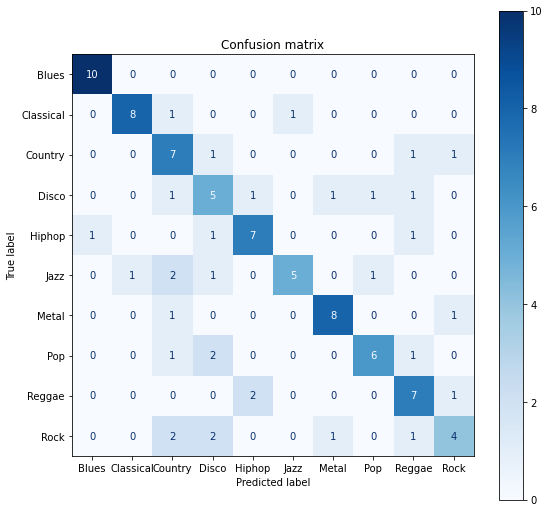

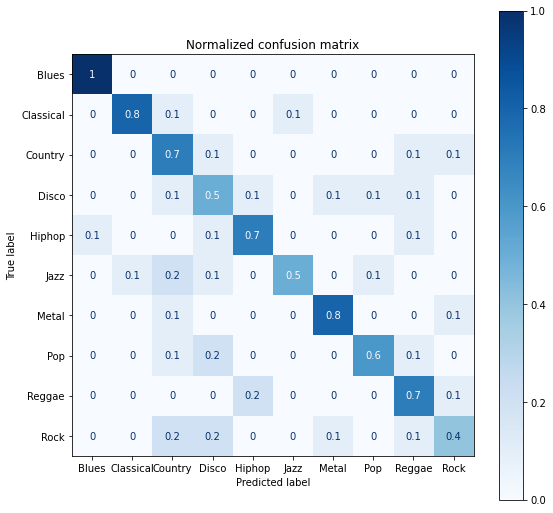

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       0.89      0.80      0.84        10
           2       0.47      0.70      0.56        10
           3       0.42      0.50      0.45        10
           4       0.70      0.70      0.70        10
           5       0.83      0.50      0.62        10
           6       0.80      0.80      0.80        10
           7       0.75      0.60      0.67        10
           8       0.58      0.70      0.64        10
           9       0.57      0.40      0.47        10

    accuracy                           0.67       100
   macro avg       0.69      0.67      0.67       100
weighted avg       0.69      0.67      0.67       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_sel, y_train)

y_pred = rf.predict(x_test_sel)

print_results(rf, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

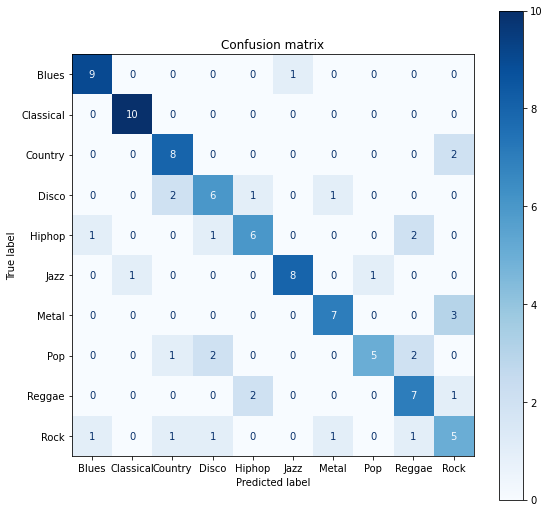

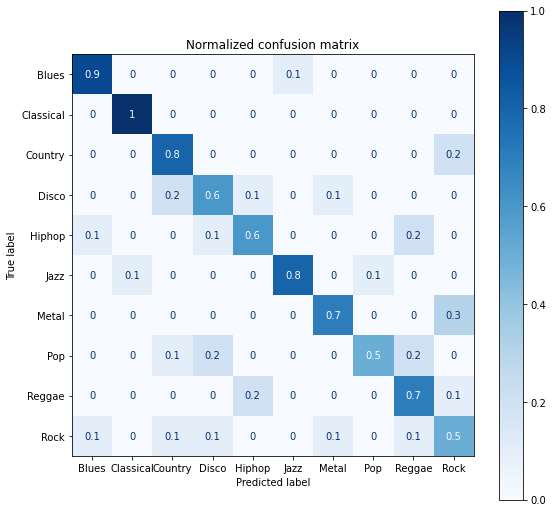

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.89      0.80      0.84        10
           6       0.78      0.70      0.74        10
           7       0.83      0.50      0.62        10
           8       0.58      0.70      0.64        10
           9       0.45      0.50      0.48        10

    accuracy                           0.71       100
   macro avg       0.72      0.71      0.71       100
weighted avg       0.72      0.71      0.71       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

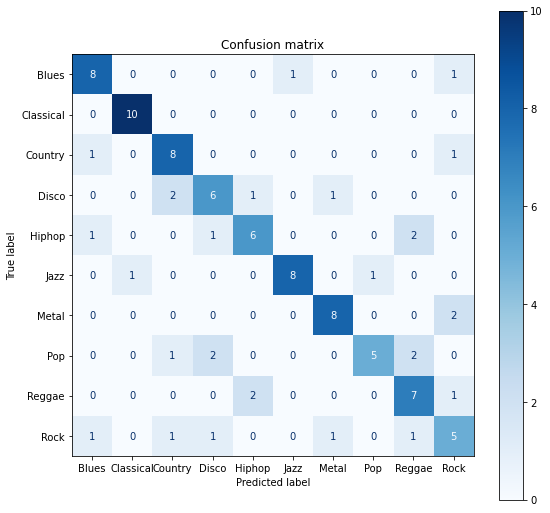

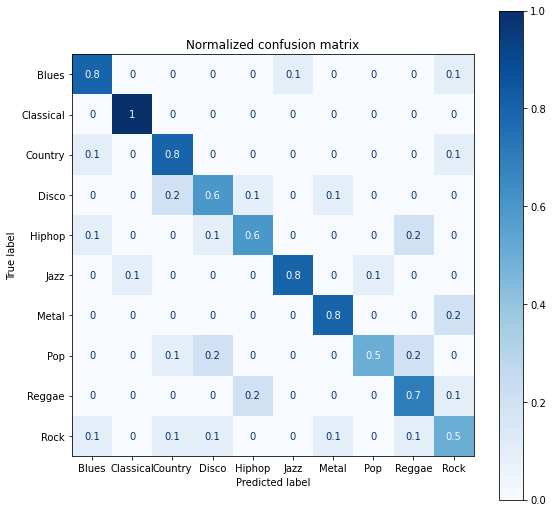

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.89      0.80      0.84        10
           6       0.80      0.80      0.80        10
           7       0.83      0.50      0.62        10
           8       0.58      0.70      0.64        10
           9       0.50      0.50      0.50        10

    accuracy                           0.71       100
   macro avg       0.72      0.71      0.71       100
weighted avg       0.72      0.71      0.71       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

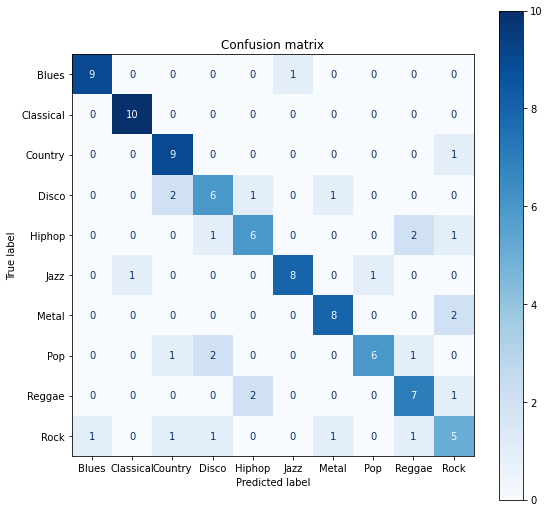

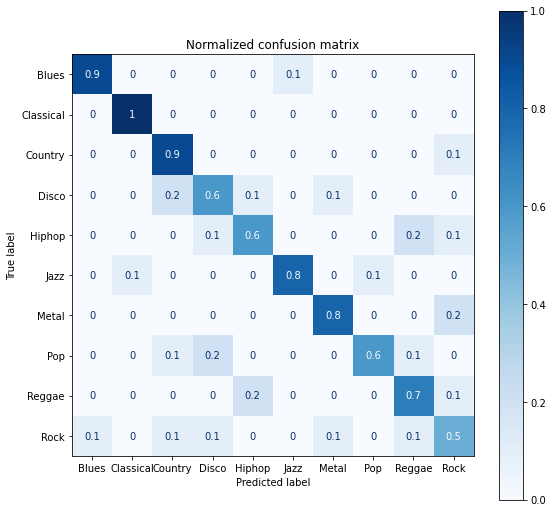

Accuracy score: 0.74 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.91      1.00      0.95        10
           2       0.69      0.90      0.78        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.89      0.80      0.84        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.64      0.70      0.67        10
           9       0.50      0.50      0.50        10

    accuracy                           0.74       100
   macro avg       0.75      0.74      0.74       100
weighted avg       0.75      0.74      0.74       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

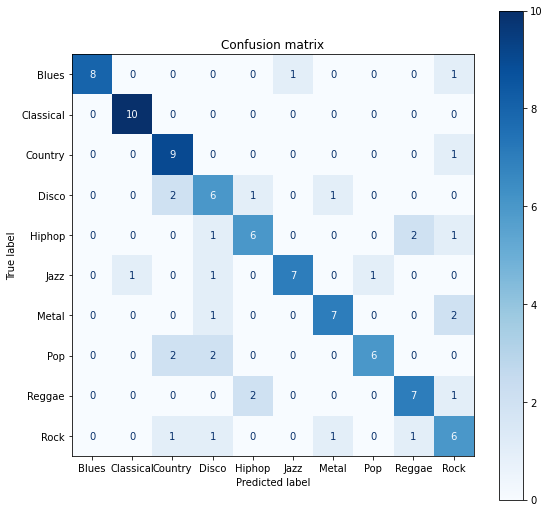

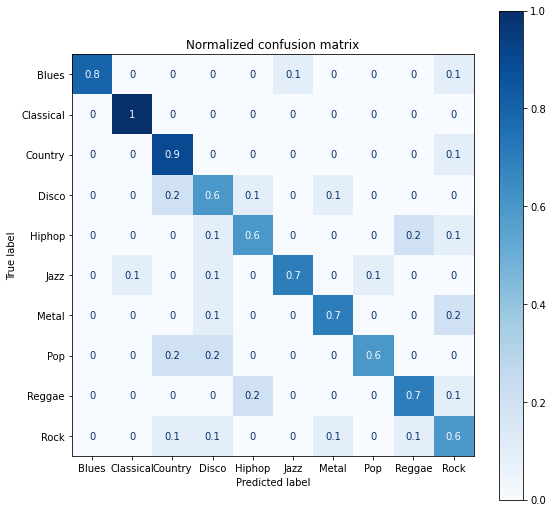

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.91      1.00      0.95        10
           2       0.64      0.90      0.75        10
           3       0.50      0.60      0.55        10
           4       0.67      0.60      0.63        10
           5       0.88      0.70      0.78        10
           6       0.78      0.70      0.74        10
           7       0.86      0.60      0.71        10
           8       0.70      0.70      0.70        10
           9       0.50      0.60      0.55        10

    accuracy                           0.72       100
   macro avg       0.74      0.72      0.72       100
weighted avg       0.74      0.72      0.72       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

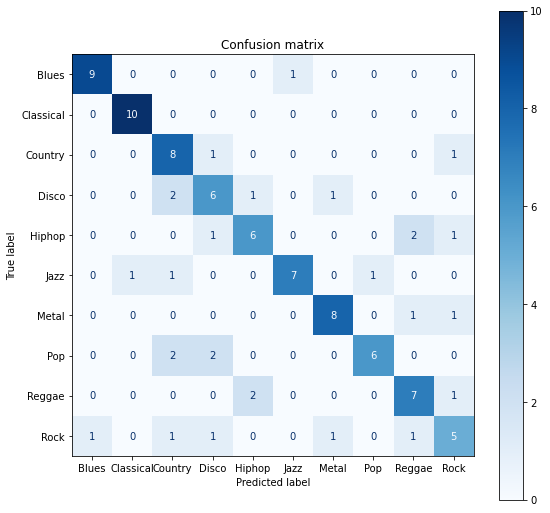

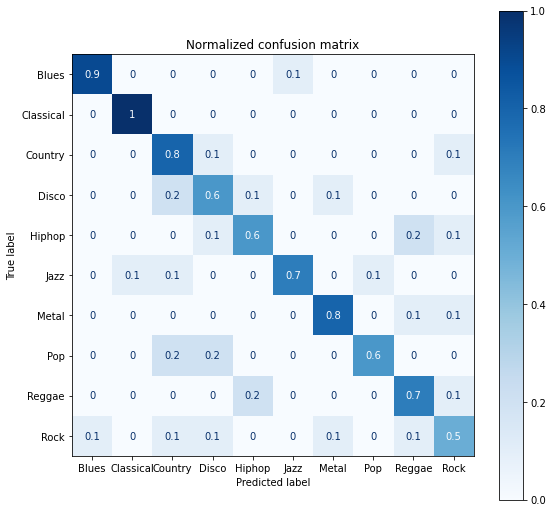

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.91      1.00      0.95        10
           2       0.57      0.80      0.67        10
           3       0.55      0.60      0.57        10
           4       0.67      0.60      0.63        10
           5       0.88      0.70      0.78        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.64      0.70      0.67        10
           9       0.56      0.50      0.53        10

    accuracy                           0.72       100
   macro avg       0.73      0.72      0.72       100
weighted avg       0.73      0.72      0.72       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

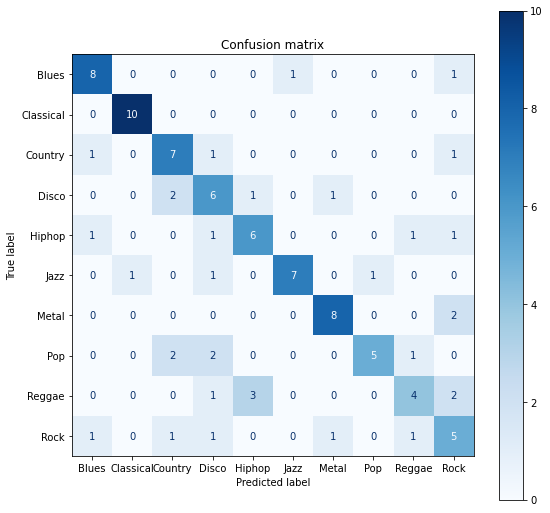

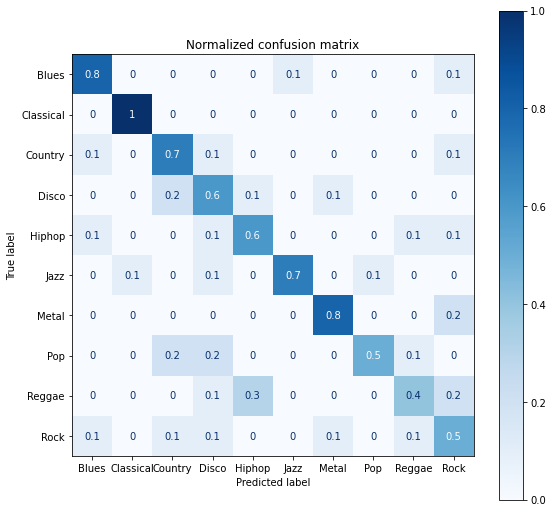

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.91      1.00      0.95        10
           2       0.58      0.70      0.64        10
           3       0.46      0.60      0.52        10
           4       0.60      0.60      0.60        10
           5       0.88      0.70      0.78        10
           6       0.80      0.80      0.80        10
           7       0.83      0.50      0.62        10
           8       0.57      0.40      0.47        10
           9       0.42      0.50      0.45        10

    accuracy                           0.66       100
   macro avg       0.68      0.66      0.66       100
weighted avg       0.68      0.66      0.66       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

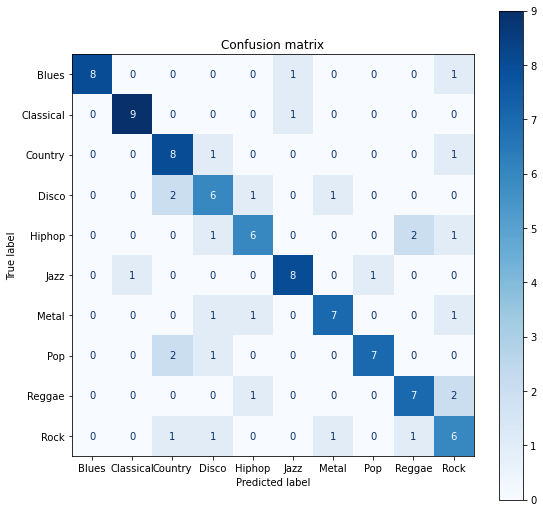

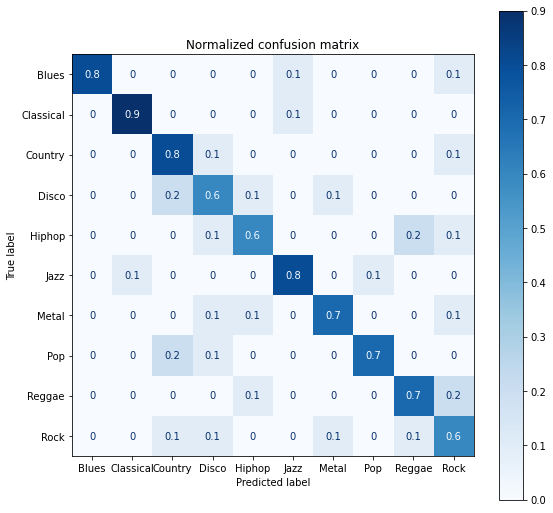

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.90      0.90      0.90        10
           2       0.62      0.80      0.70        10
           3       0.55      0.60      0.57        10
           4       0.67      0.60      0.63        10
           5       0.80      0.80      0.80        10
           6       0.78      0.70      0.74        10
           7       0.88      0.70      0.78        10
           8       0.70      0.70      0.70        10
           9       0.50      0.60      0.55        10

    accuracy                           0.72       100
   macro avg       0.74      0.72      0.72       100
weighted avg       0.74      0.72      0.72       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

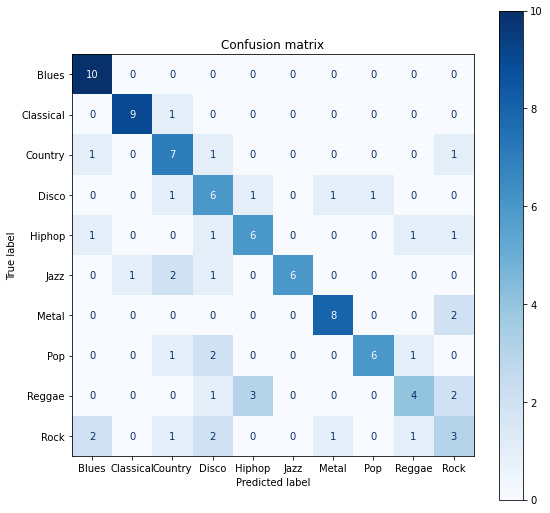

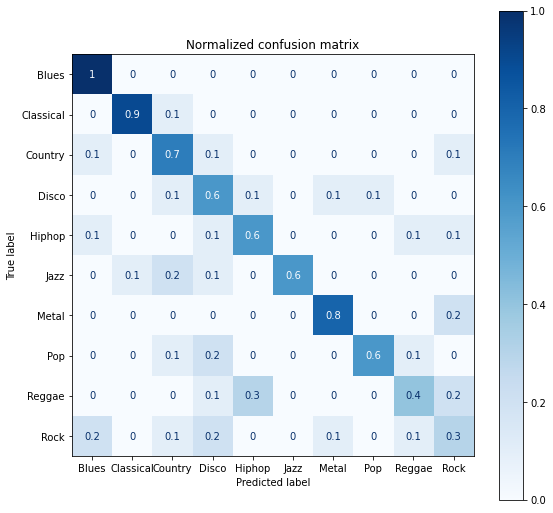

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        10
           1       0.90      0.90      0.90        10
           2       0.54      0.70      0.61        10
           3       0.43      0.60      0.50        10
           4       0.60      0.60      0.60        10
           5       1.00      0.60      0.75        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.57      0.40      0.47        10
           9       0.33      0.30      0.32        10

    accuracy                           0.65       100
   macro avg       0.67      0.65      0.65       100
weighted avg       0.67      0.65      0.65       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

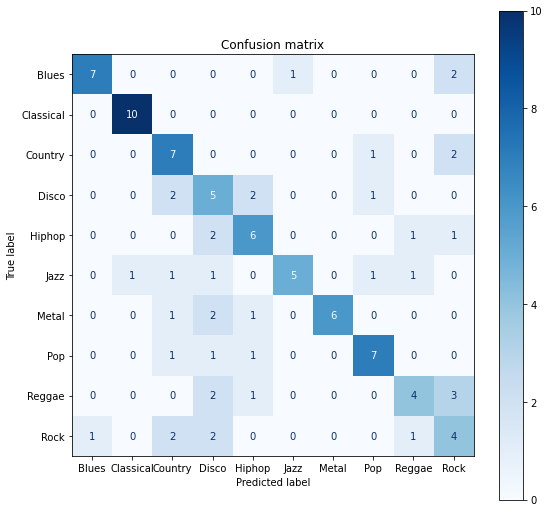

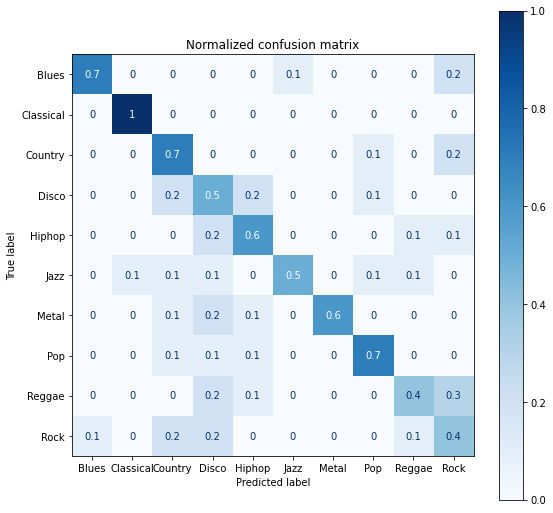

Accuracy score: 0.61 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.91      1.00      0.95        10
           2       0.50      0.70      0.58        10
           3       0.33      0.50      0.40        10
           4       0.55      0.60      0.57        10
           5       0.83      0.50      0.62        10
           6       1.00      0.60      0.75        10
           7       0.70      0.70      0.70        10
           8       0.57      0.40      0.47        10
           9       0.33      0.40      0.36        10

    accuracy                           0.61       100
   macro avg       0.66      0.61      0.62       100
weighted avg       0.66      0.61      0.62       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

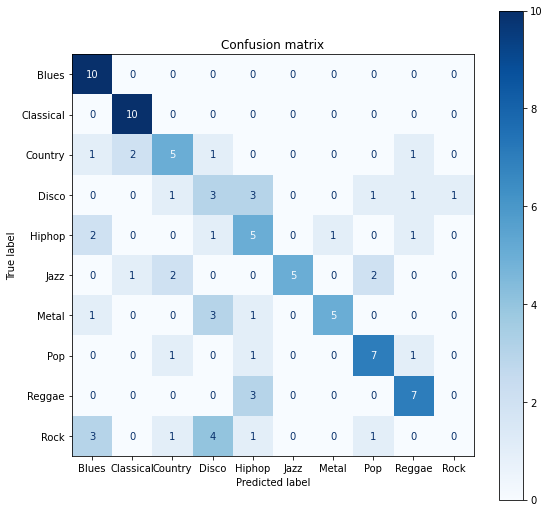

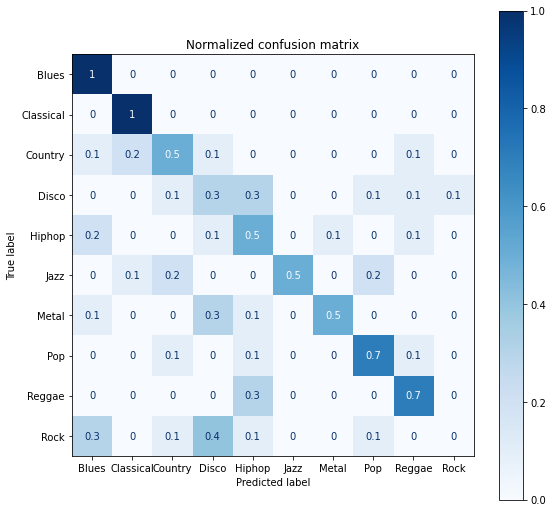

Accuracy score: 0.57 

Classification Report
              precision    recall  f1-score   support

           0       0.59      1.00      0.74        10
           1       0.77      1.00      0.87        10
           2       0.50      0.50      0.50        10
           3       0.25      0.30      0.27        10
           4       0.36      0.50      0.42        10
           5       1.00      0.50      0.67        10
           6       0.83      0.50      0.62        10
           7       0.64      0.70      0.67        10
           8       0.64      0.70      0.67        10
           9       0.00      0.00      0.00        10

    accuracy                           0.57       100
   macro avg       0.56      0.57      0.54       100
weighted avg       0.56      0.57      0.54       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_ksel, y_train)

y_pred = rf.predict(x_test_ksel)

print_results(rf, x_test_ksel, y_test, y_pred)

### Recursive Feature Elimination (RFE)
**n_features_to_select = 50**

In [ ]:
rfe = RFE(estimator = _rf.best_estimator_, n_features_to_select = 50)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

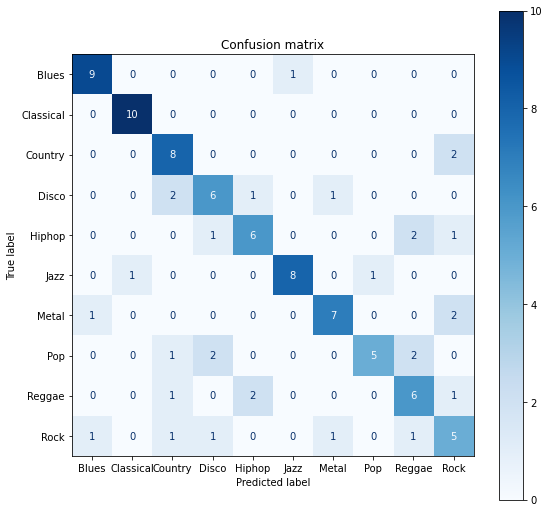

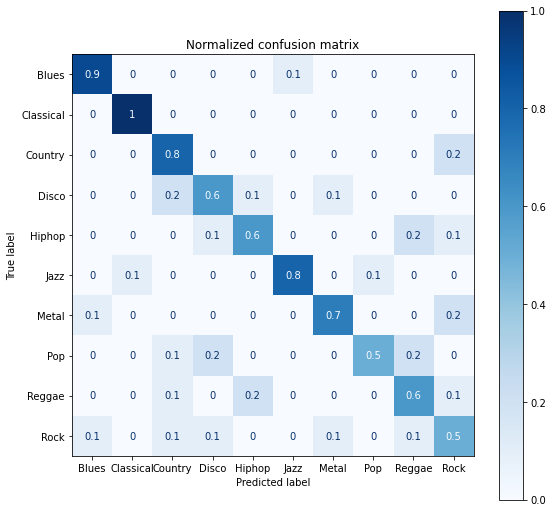

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.89      0.80      0.84        10
           6       0.78      0.70      0.74        10
           7       0.83      0.50      0.62        10
           8       0.55      0.60      0.57        10
           9       0.45      0.50      0.48        10

    accuracy                           0.70       100
   macro avg       0.71      0.70      0.70       100
weighted avg       0.71      0.70      0.70       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_rfe, y_train)

y_pred = rf.predict(x_test_rfe)

print_results(rf, x_test_rfe, y_test, y_pred)

**n_features_to_select = 40**

In [ ]:
rfe = RFE(estimator = _rf.best_estimator_, n_features_to_select = 40)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

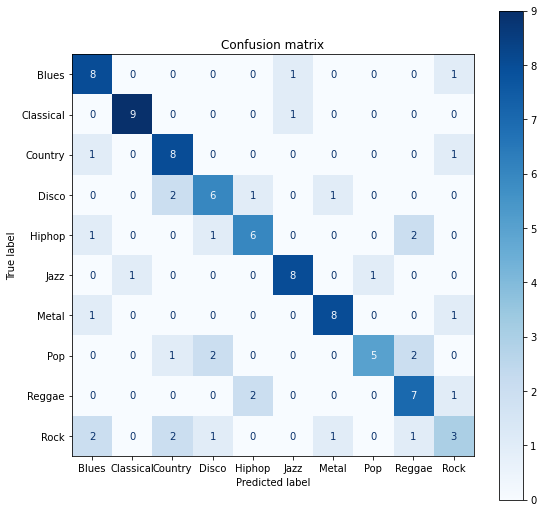

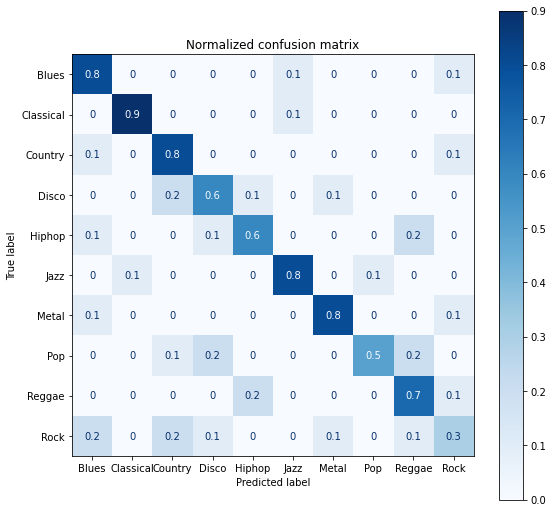

Accuracy score: 0.68 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.90      0.90      0.90        10
           2       0.62      0.80      0.70        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.80      0.80      0.80        10
           6       0.80      0.80      0.80        10
           7       0.83      0.50      0.62        10
           8       0.58      0.70      0.64        10
           9       0.43      0.30      0.35        10

    accuracy                           0.68       100
   macro avg       0.68      0.68      0.67       100
weighted avg       0.68      0.68      0.67       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_rfe, y_train)

y_pred = rf.predict(x_test_rfe)

print_results(rf, x_test_rfe, y_test, y_pred)

**n_features_to_select = 30**

In [ ]:
rfe = RFE(estimator = _rf.best_estimator_, n_features_to_select = 30)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

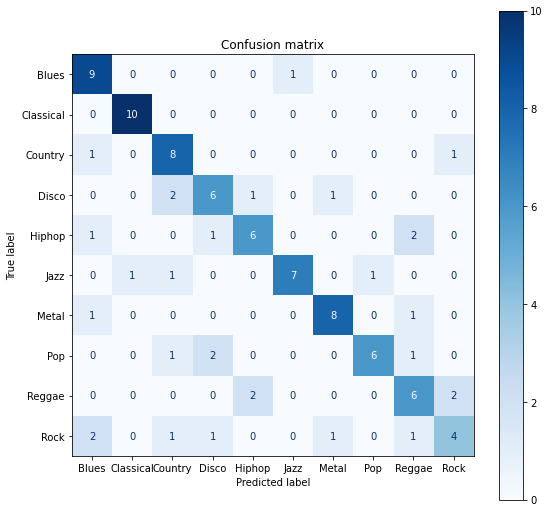

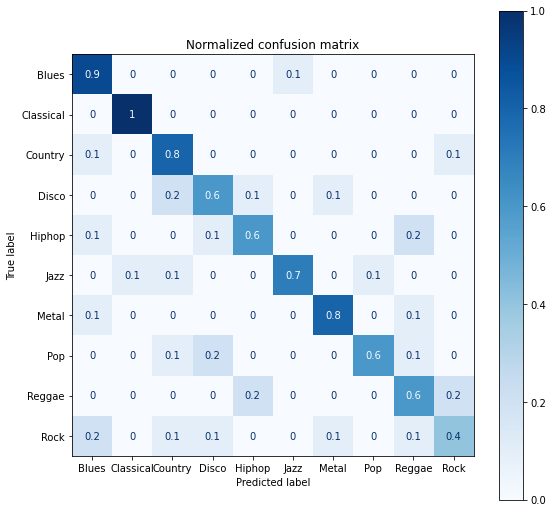

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.90      0.75        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.60      0.60      0.60        10
           4       0.67      0.60      0.63        10
           5       0.88      0.70      0.78        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.55      0.60      0.57        10
           9       0.57      0.40      0.47        10

    accuracy                           0.70       100
   macro avg       0.71      0.70      0.70       100
weighted avg       0.71      0.70      0.70       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_rfe, y_train)

y_pred = rf.predict(x_test_rfe)

print_results(rf, x_test_rfe, y_test, y_pred)

**n_features_to_select = 20**

In [ ]:
rfe = RFE(estimator = _rf.best_estimator_, n_features_to_select = 20)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

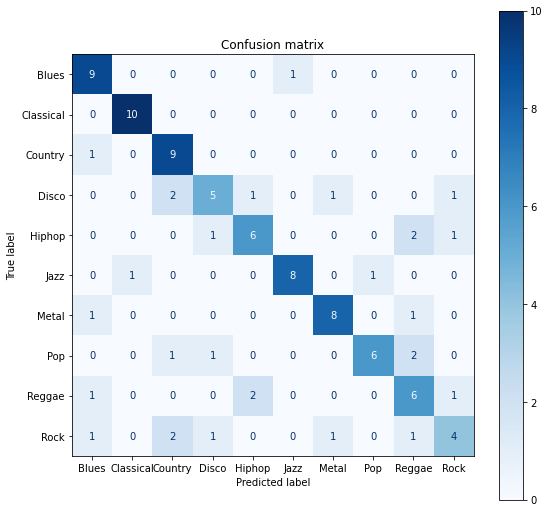

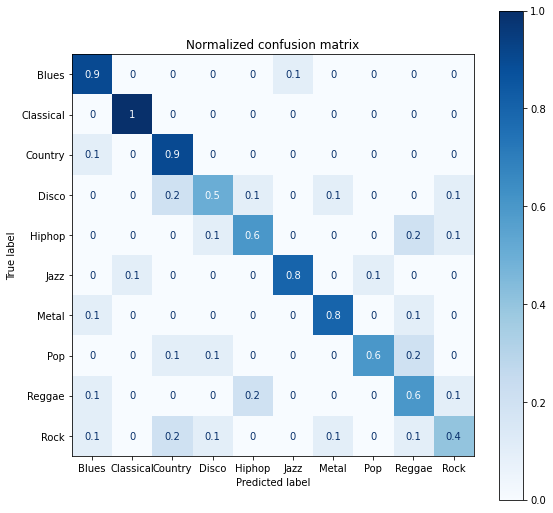

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.91      1.00      0.95        10
           2       0.64      0.90      0.75        10
           3       0.62      0.50      0.56        10
           4       0.67      0.60      0.63        10
           5       0.89      0.80      0.84        10
           6       0.80      0.80      0.80        10
           7       0.86      0.60      0.71        10
           8       0.50      0.60      0.55        10
           9       0.57      0.40      0.47        10

    accuracy                           0.71       100
   macro avg       0.72      0.71      0.70       100
weighted avg       0.72      0.71      0.70       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_rfe, y_train)

y_pred = rf.predict(x_test_rfe)

print_results(rf, x_test_rfe, y_test, y_pred)

**n_features_to_select = 10**

In [ ]:
rfe = RFE(estimator = _rf.best_estimator_, n_features_to_select = 10)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)


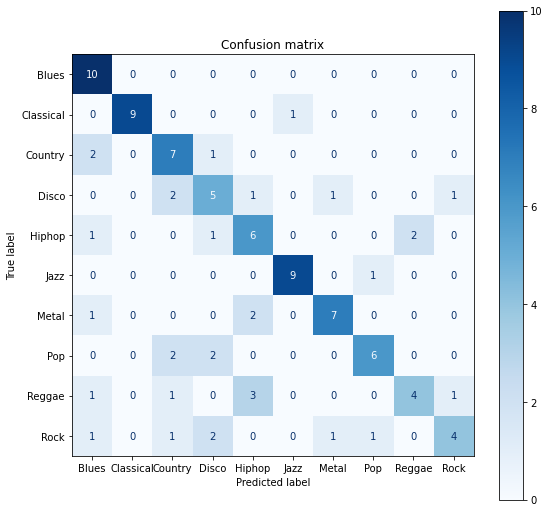

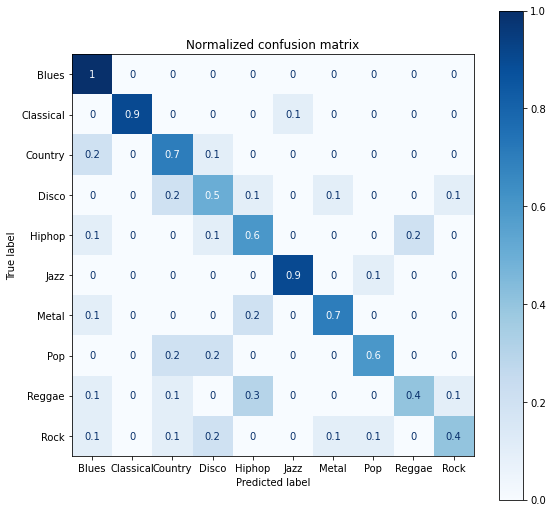

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.62      1.00      0.77        10
           1       1.00      0.90      0.95        10
           2       0.54      0.70      0.61        10
           3       0.45      0.50      0.48        10
           4       0.50      0.60      0.55        10
           5       0.90      0.90      0.90        10
           6       0.78      0.70      0.74        10
           7       0.75      0.60      0.67        10
           8       0.67      0.40      0.50        10
           9       0.67      0.40      0.50        10

    accuracy                           0.67       100
   macro avg       0.69      0.67      0.67       100
weighted avg       0.69      0.67      0.67       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_rfe, y_train)

y_pred = rf.predict(x_test_rfe)

print_results(rf, x_test_rfe, y_test, y_pred)

### Select features based on importance weights

In [ ]:
selector = SelectFromModel(estimator = _rf.best_estimator_)
selector.fit(x_train, y_train)
selector.fit(x_test, y_test)

x_train_sfm = selector.transform(x_train)
x_test_sfm = selector.transform(x_test)

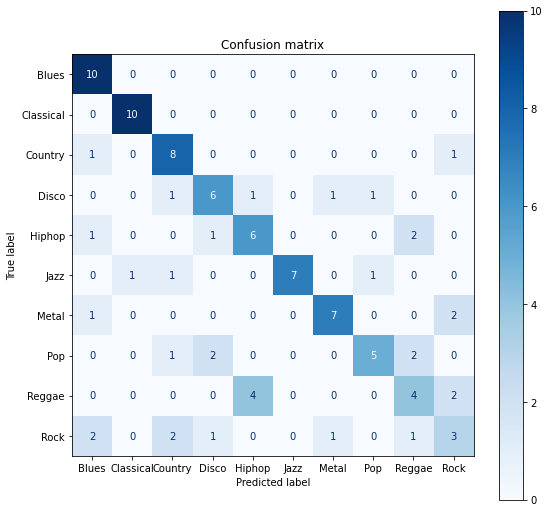

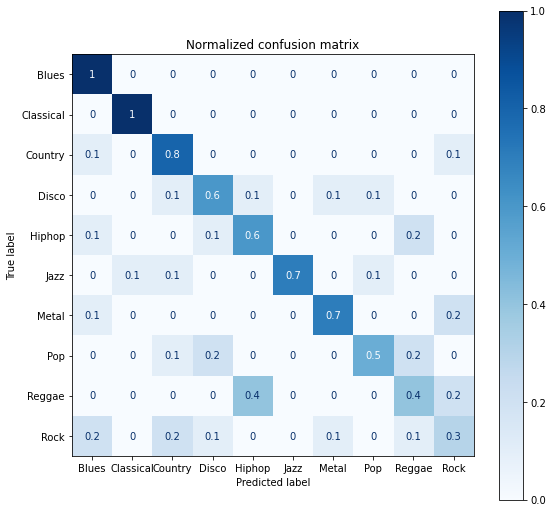

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.67      1.00      0.80        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.60      0.60      0.60        10
           4       0.55      0.60      0.57        10
           5       1.00      0.70      0.82        10
           6       0.78      0.70      0.74        10
           7       0.71      0.50      0.59        10
           8       0.44      0.40      0.42        10
           9       0.38      0.30      0.33        10

    accuracy                           0.66       100
   macro avg       0.66      0.66      0.65       100
weighted avg       0.66      0.66      0.65       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_sfm, y_train)

y_pred = rf.predict(x_test_sfm)

print_results(rf, x_test_sfm, y_test, y_pred)

### PCA

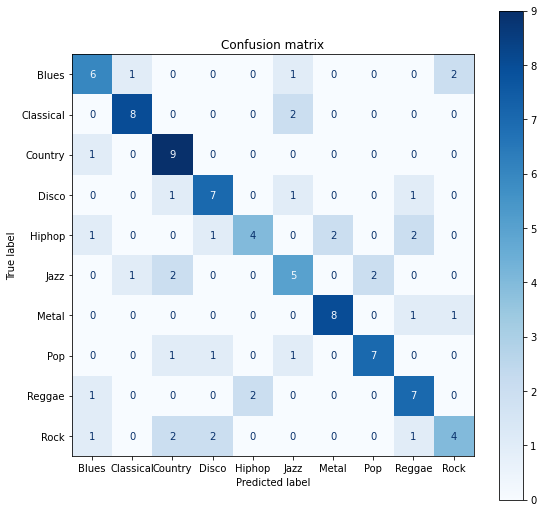

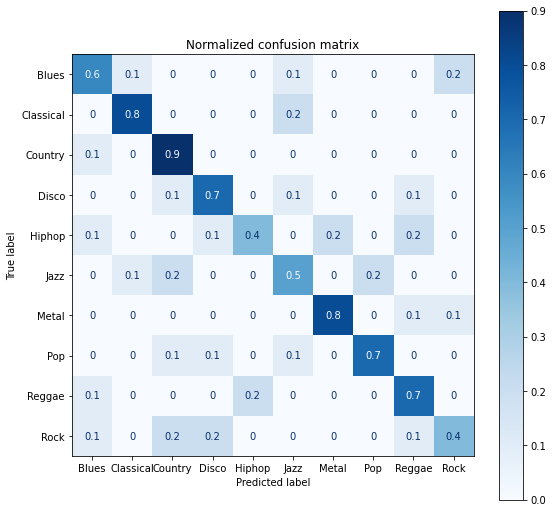

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.60      0.60      0.60        10
           1       0.80      0.80      0.80        10
           2       0.60      0.90      0.72        10
           3       0.64      0.70      0.67        10
           4       0.67      0.40      0.50        10
           5       0.50      0.50      0.50        10
           6       0.80      0.80      0.80        10
           7       0.78      0.70      0.74        10
           8       0.58      0.70      0.64        10
           9       0.57      0.40      0.47        10

    accuracy                           0.65       100
   macro avg       0.65      0.65      0.64       100
weighted avg       0.65      0.65      0.64       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_pca, y_train)

y_pred = rf.predict(x_test_pca)

print_results(rf, x_test_pca, y_test, y_pred)

### LDA

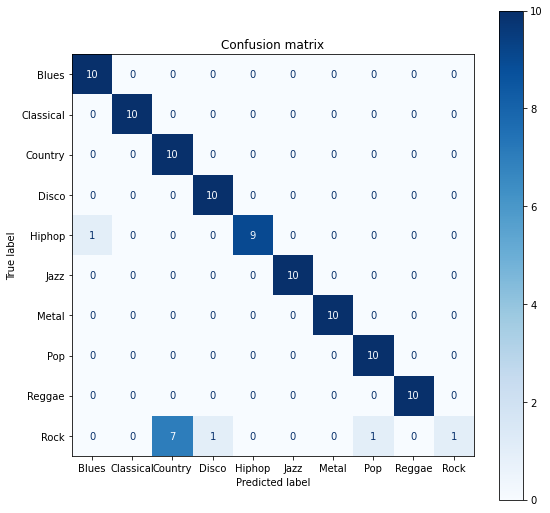

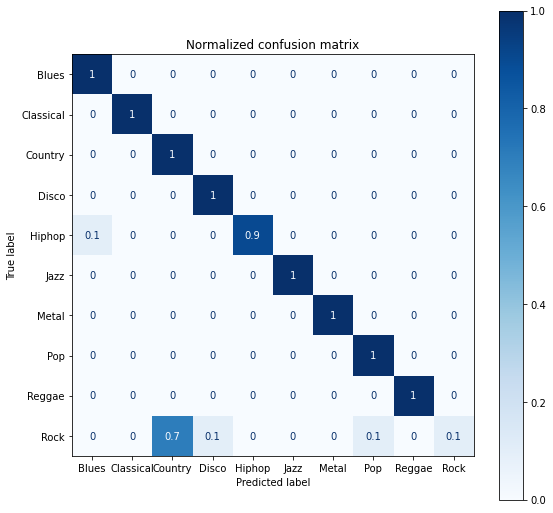

Accuracy score: 0.9 

Classification Report
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.59      1.00      0.74        10
           3       0.91      1.00      0.95        10
           4       1.00      0.90      0.95        10
           5       1.00      1.00      1.00        10
           6       1.00      1.00      1.00        10
           7       0.91      1.00      0.95        10
           8       1.00      1.00      1.00        10
           9       1.00      0.10      0.18        10

    accuracy                           0.90       100
   macro avg       0.93      0.90      0.87       100
weighted avg       0.93      0.90      0.87       100



In [ ]:
rf = _rf.best_estimator_
rf.fit(x_train_lda, y_train)

y_pred = rf.predict(x_test_lda)

print_results(rf, x_test_lda, y_test, y_pred)

## Support Vector Machines (SVM)

### All features

In [ ]:
kernel= ['linear', 'poly', 'rbf', 'sigmoid']
degree = [3, 4, 5]
gamma = ['scale', 'auto']

parameters = [{'kernel': kernel, 'degree': degree, 'gamma': gamma}]

_svm = GridSearchCV(SVC(), parameters)

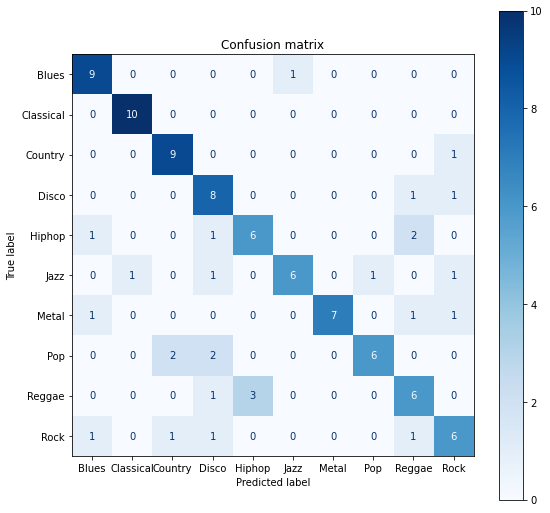

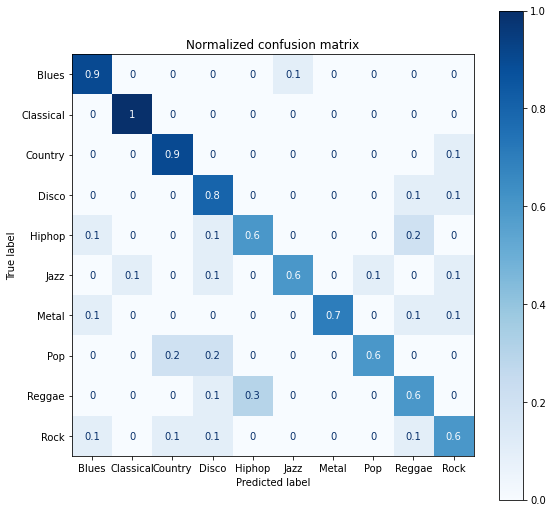

Accuracy score: 0.73 

Classification Report
              precision    recall  f1-score   support

           0       0.75      0.90      0.82        10
           1       0.91      1.00      0.95        10
           2       0.75      0.90      0.82        10
           3       0.57      0.80      0.67        10
           4       0.67      0.60      0.63        10
           5       0.86      0.60      0.71        10
           6       1.00      0.70      0.82        10
           7       0.86      0.60      0.71        10
           8       0.55      0.60      0.57        10
           9       0.60      0.60      0.60        10

    accuracy                           0.73       100
   macro avg       0.75      0.73      0.73       100
weighted avg       0.75      0.73      0.73       100



In [ ]:
_svm.fit(x_train, y_train)

y_pred = _svm.predict(x_test)

print_results(_svm, x_test, y_test, y_pred)

In [ ]:
_svm.best_estimator_

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

### Without highly correlated features.

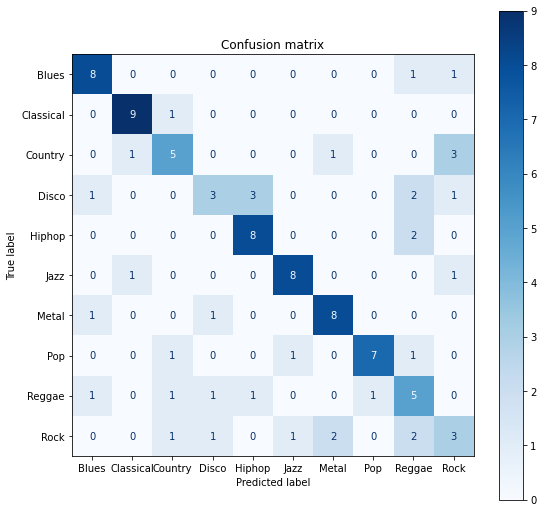

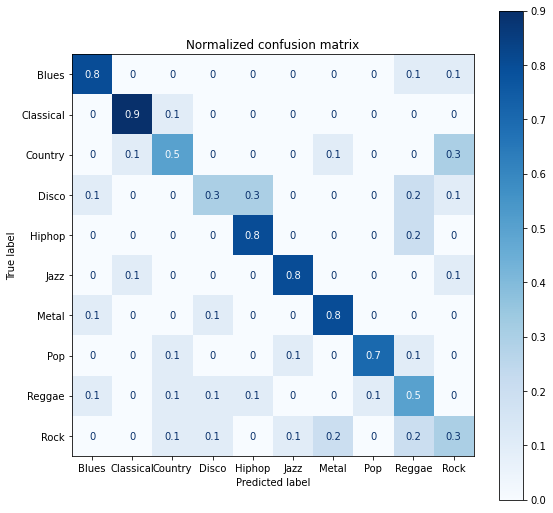

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.82      0.90      0.86        10
           2       0.56      0.50      0.53        10
           3       0.50      0.30      0.37        10
           4       0.67      0.80      0.73        10
           5       0.80      0.80      0.80        10
           6       0.73      0.80      0.76        10
           7       0.88      0.70      0.78        10
           8       0.38      0.50      0.43        10
           9       0.33      0.30      0.32        10

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.63       100
weighted avg       0.64      0.64      0.63       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_wcorr, y_train_wcorr)

y_pred = svm.predict(x_test_wcorr)

print_results(svm, x_test_wcorr, y_test_wcorr, y_pred)

### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

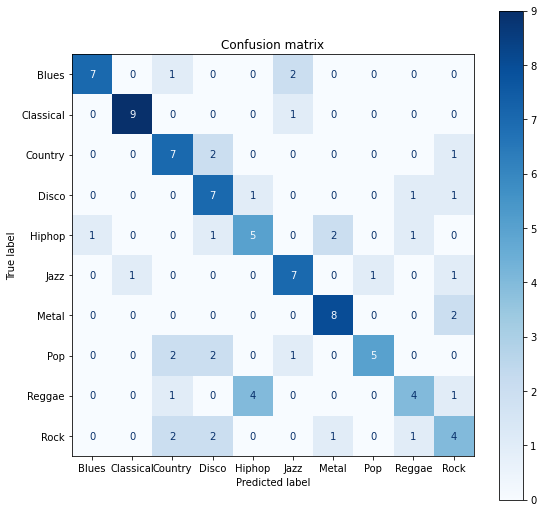

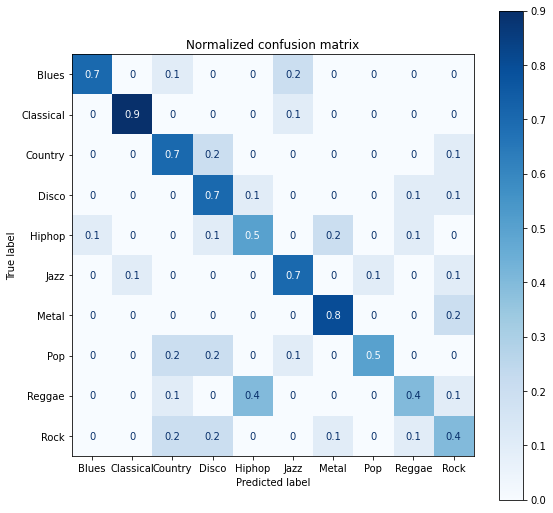

Accuracy score: 0.63 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.90      0.90      0.90        10
           2       0.54      0.70      0.61        10
           3       0.50      0.70      0.58        10
           4       0.50      0.50      0.50        10
           5       0.64      0.70      0.67        10
           6       0.73      0.80      0.76        10
           7       0.83      0.50      0.62        10
           8       0.57      0.40      0.47        10
           9       0.40      0.40      0.40        10

    accuracy                           0.63       100
   macro avg       0.65      0.63      0.63       100
weighted avg       0.65      0.63      0.63       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_sel, y_train)

y_pred = svm.predict(x_test_sel)

print_results(svm, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

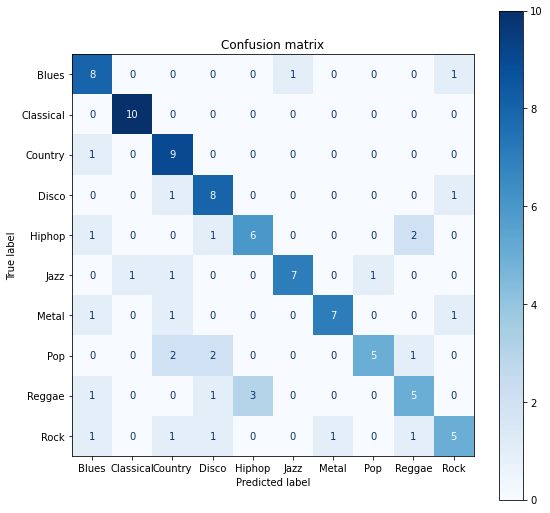

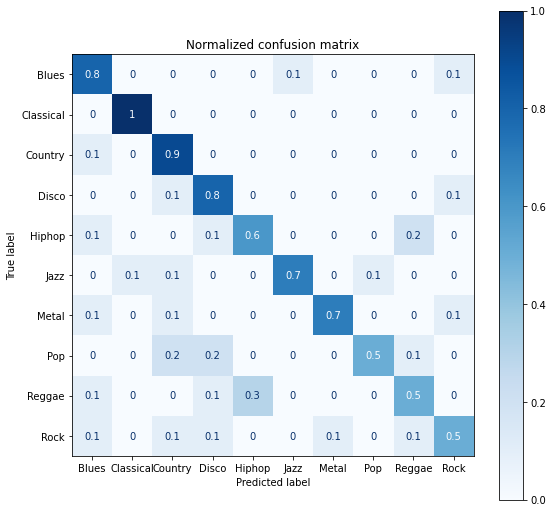

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.91      1.00      0.95        10
           2       0.60      0.90      0.72        10
           3       0.62      0.80      0.70        10
           4       0.67      0.60      0.63        10
           5       0.88      0.70      0.78        10
           6       0.88      0.70      0.78        10
           7       0.83      0.50      0.62        10
           8       0.56      0.50      0.53        10
           9       0.62      0.50      0.56        10

    accuracy                           0.70       100
   macro avg       0.72      0.70      0.70       100
weighted avg       0.72      0.70      0.70       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

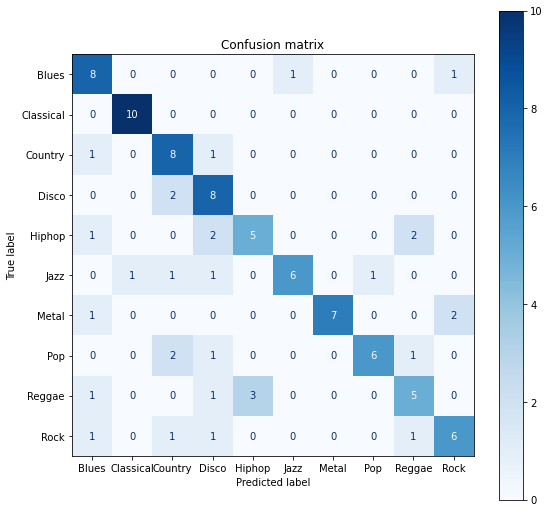

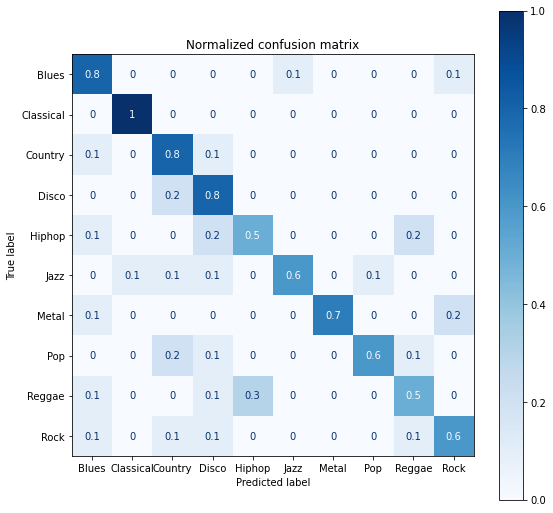

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.91      1.00      0.95        10
           2       0.57      0.80      0.67        10
           3       0.53      0.80      0.64        10
           4       0.62      0.50      0.56        10
           5       0.86      0.60      0.71        10
           6       1.00      0.70      0.82        10
           7       0.86      0.60      0.71        10
           8       0.56      0.50      0.53        10
           9       0.67      0.60      0.63        10

    accuracy                           0.69       100
   macro avg       0.72      0.69      0.69       100
weighted avg       0.72      0.69      0.69       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

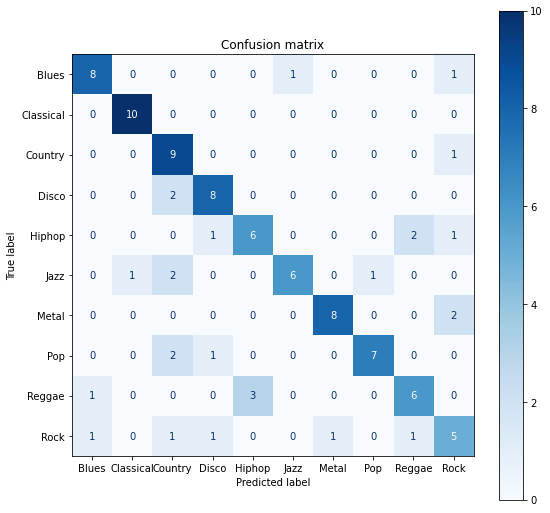

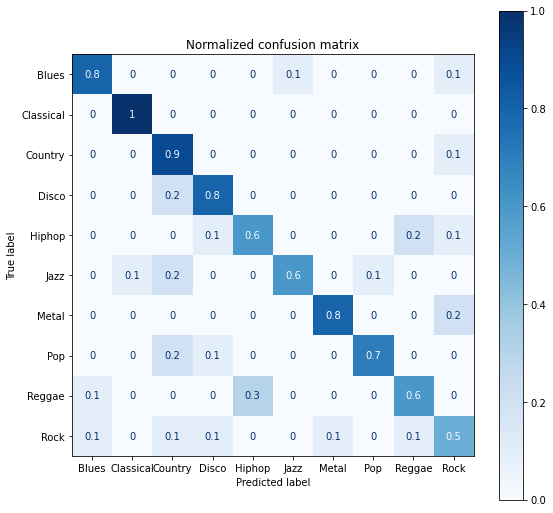

Accuracy score: 0.73 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.91      1.00      0.95        10
           2       0.56      0.90      0.69        10
           3       0.73      0.80      0.76        10
           4       0.67      0.60      0.63        10
           5       0.86      0.60      0.71        10
           6       0.89      0.80      0.84        10
           7       0.88      0.70      0.78        10
           8       0.67      0.60      0.63        10
           9       0.50      0.50      0.50        10

    accuracy                           0.73       100
   macro avg       0.75      0.73      0.73       100
weighted avg       0.75      0.73      0.73       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

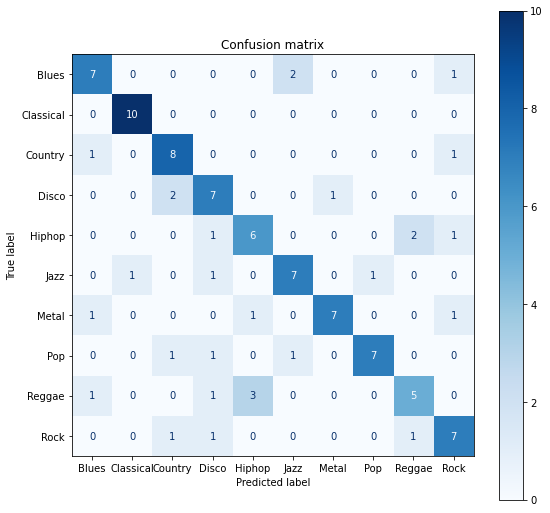

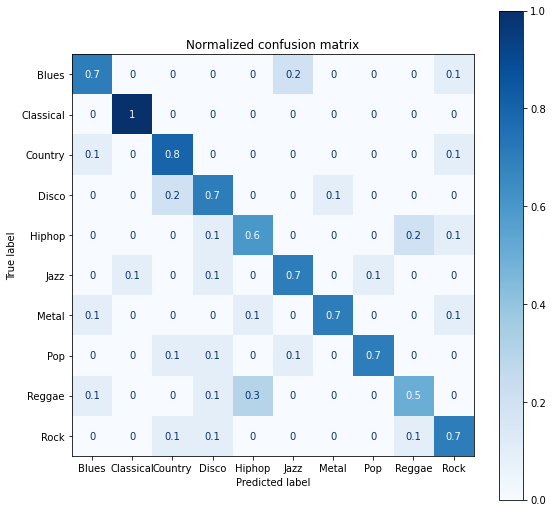

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.58      0.70      0.64        10
           4       0.60      0.60      0.60        10
           5       0.70      0.70      0.70        10
           6       0.88      0.70      0.78        10
           7       0.88      0.70      0.78        10
           8       0.62      0.50      0.56        10
           9       0.64      0.70      0.67        10

    accuracy                           0.71       100
   macro avg       0.72      0.71      0.71       100
weighted avg       0.72      0.71      0.71       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

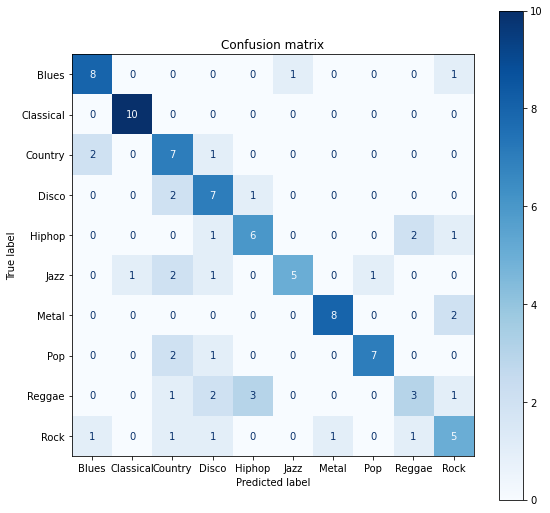

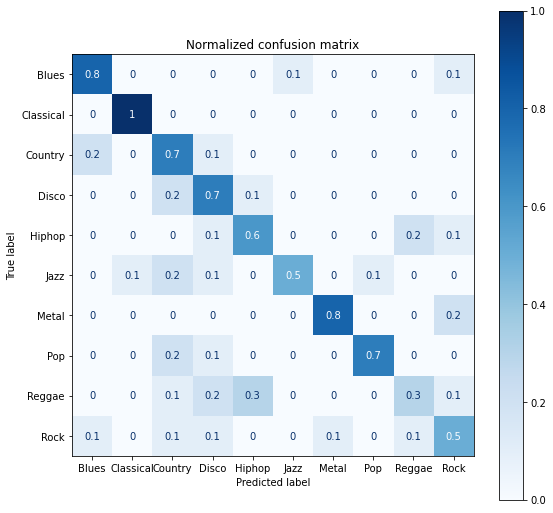

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.91      1.00      0.95        10
           2       0.47      0.70      0.56        10
           3       0.50      0.70      0.58        10
           4       0.60      0.60      0.60        10
           5       0.83      0.50      0.62        10
           6       0.89      0.80      0.84        10
           7       0.88      0.70      0.78        10
           8       0.50      0.30      0.37        10
           9       0.50      0.50      0.50        10

    accuracy                           0.66       100
   macro avg       0.68      0.66      0.66       100
weighted avg       0.68      0.66      0.66       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)


In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

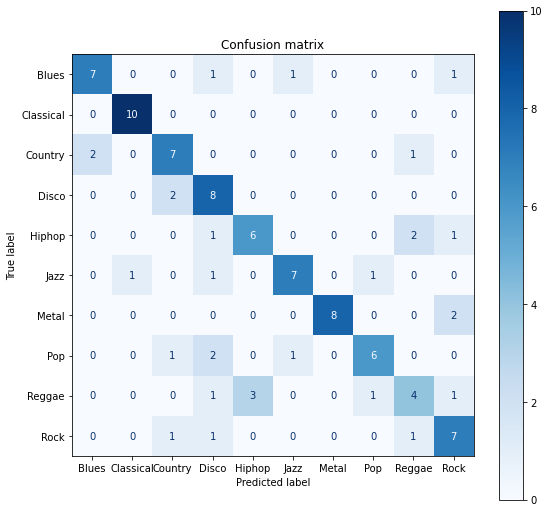

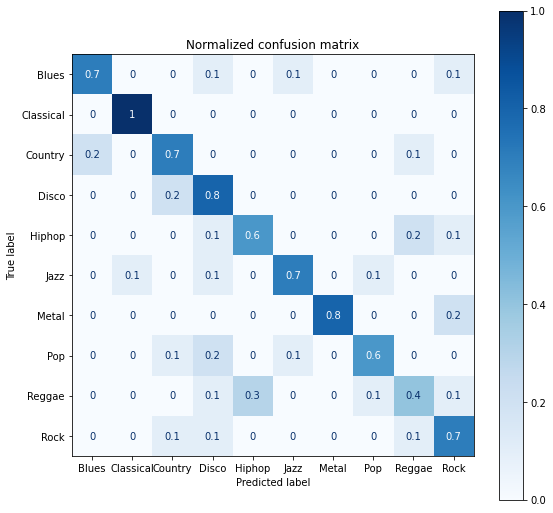

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.70      0.74        10
           1       0.91      1.00      0.95        10
           2       0.64      0.70      0.67        10
           3       0.53      0.80      0.64        10
           4       0.67      0.60      0.63        10
           5       0.78      0.70      0.74        10
           6       1.00      0.80      0.89        10
           7       0.75      0.60      0.67        10
           8       0.50      0.40      0.44        10
           9       0.58      0.70      0.64        10

    accuracy                           0.70       100
   macro avg       0.71      0.70      0.70       100
weighted avg       0.71      0.70      0.70       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

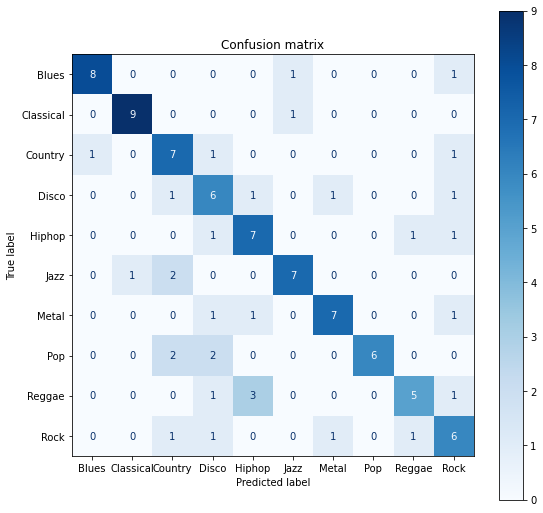

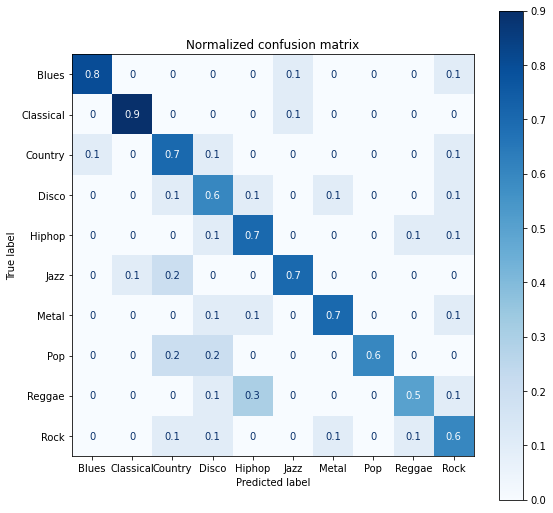

Accuracy score: 0.68 

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        10
           1       0.90      0.90      0.90        10
           2       0.54      0.70      0.61        10
           3       0.46      0.60      0.52        10
           4       0.58      0.70      0.64        10
           5       0.78      0.70      0.74        10
           6       0.78      0.70      0.74        10
           7       1.00      0.60      0.75        10
           8       0.71      0.50      0.59        10
           9       0.50      0.60      0.55        10

    accuracy                           0.68       100
   macro avg       0.71      0.68      0.69       100
weighted avg       0.71      0.68      0.69       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

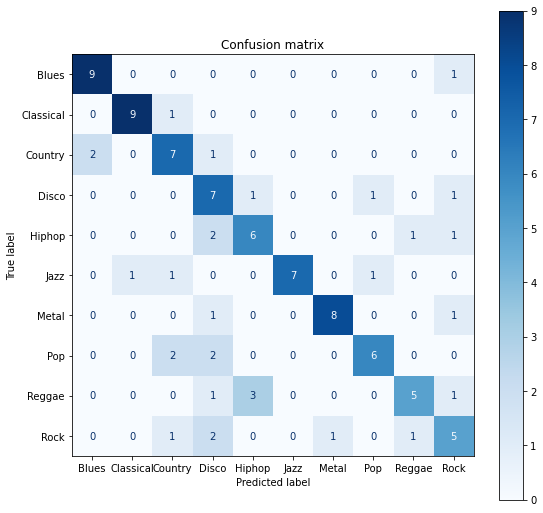

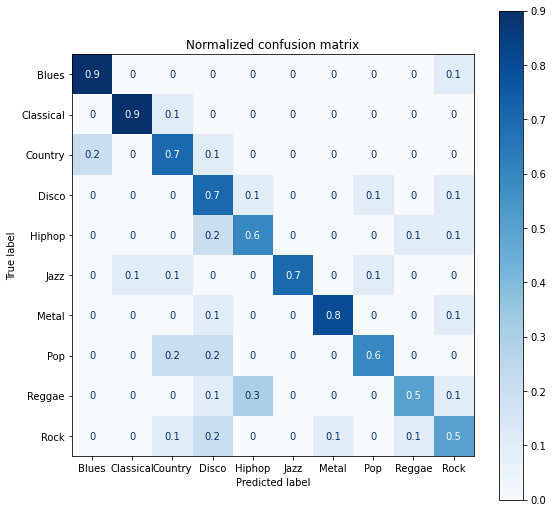

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.90      0.90      0.90        10
           2       0.58      0.70      0.64        10
           3       0.44      0.70      0.54        10
           4       0.60      0.60      0.60        10
           5       1.00      0.70      0.82        10
           6       0.89      0.80      0.84        10
           7       0.75      0.60      0.67        10
           8       0.71      0.50      0.59        10
           9       0.50      0.50      0.50        10

    accuracy                           0.69       100
   macro avg       0.72      0.69      0.70       100
weighted avg       0.72      0.69      0.70       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

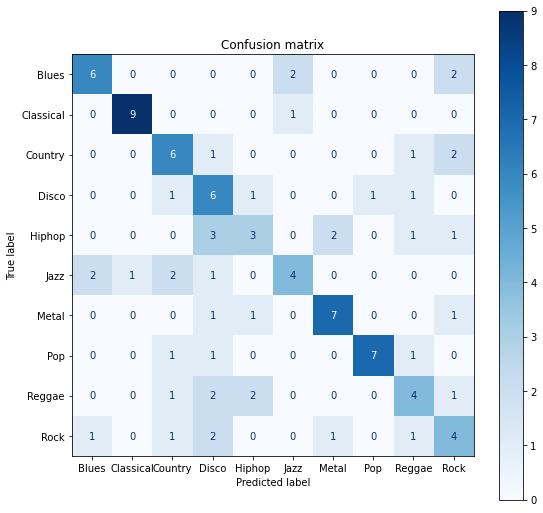

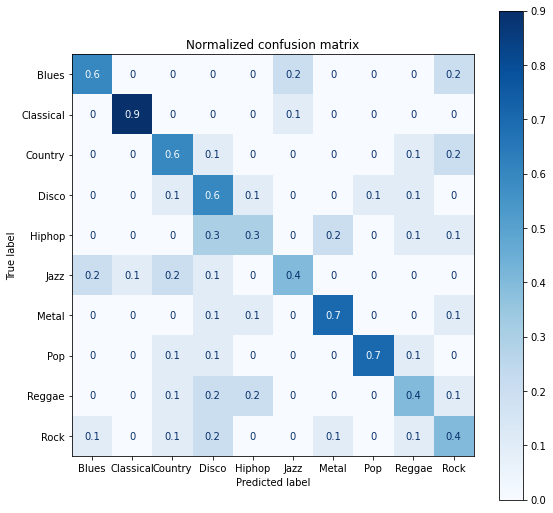

Accuracy score: 0.56 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       0.90      0.90      0.90        10
           2       0.50      0.60      0.55        10
           3       0.35      0.60      0.44        10
           4       0.43      0.30      0.35        10
           5       0.57      0.40      0.47        10
           6       0.70      0.70      0.70        10
           7       0.88      0.70      0.78        10
           8       0.44      0.40      0.42        10
           9       0.36      0.40      0.38        10

    accuracy                           0.56       100
   macro avg       0.58      0.56      0.56       100
weighted avg       0.58      0.56      0.56       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

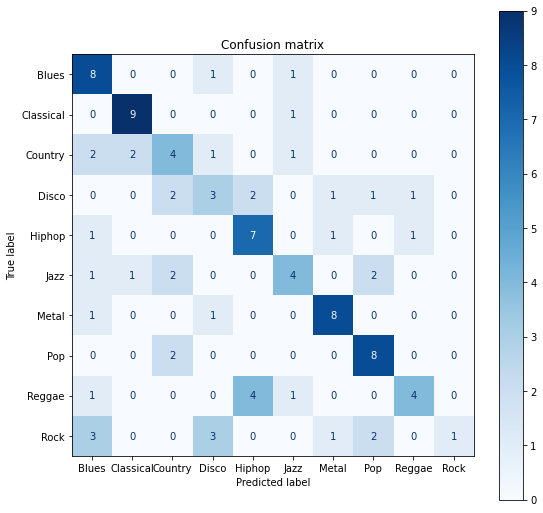

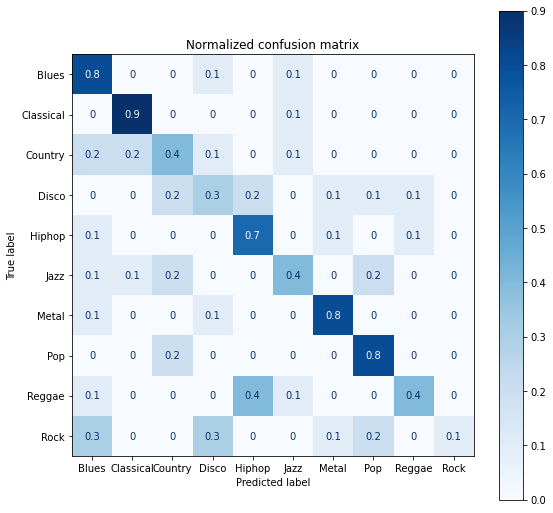

Accuracy score: 0.56 

Classification Report
              precision    recall  f1-score   support

           0       0.47      0.80      0.59        10
           1       0.75      0.90      0.82        10
           2       0.40      0.40      0.40        10
           3       0.33      0.30      0.32        10
           4       0.54      0.70      0.61        10
           5       0.50      0.40      0.44        10
           6       0.73      0.80      0.76        10
           7       0.62      0.80      0.70        10
           8       0.67      0.40      0.50        10
           9       1.00      0.10      0.18        10

    accuracy                           0.56       100
   macro avg       0.60      0.56      0.53       100
weighted avg       0.60      0.56      0.53       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_ksel, y_train)

y_pred = svm.predict(x_test_ksel)

print_results(svm, x_test_ksel, y_test, y_pred)

### PCA

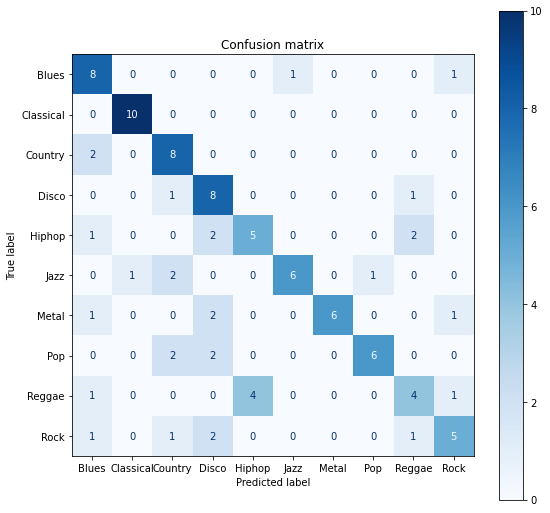

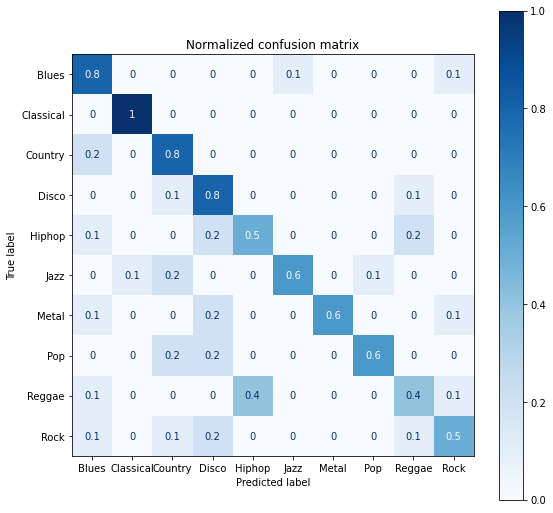

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.91      1.00      0.95        10
           2       0.57      0.80      0.67        10
           3       0.50      0.80      0.62        10
           4       0.56      0.50      0.53        10
           5       0.86      0.60      0.71        10
           6       1.00      0.60      0.75        10
           7       0.86      0.60      0.71        10
           8       0.50      0.40      0.44        10
           9       0.62      0.50      0.56        10

    accuracy                           0.66       100
   macro avg       0.69      0.66      0.66       100
weighted avg       0.69      0.66      0.66       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_pca, y_train)

y_pred = svm.predict(x_test_pca)

print_results(svm, x_test_pca, y_test, y_pred)

### LDA

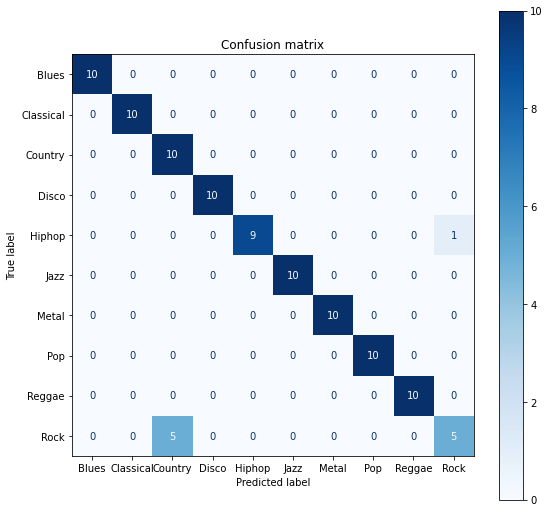

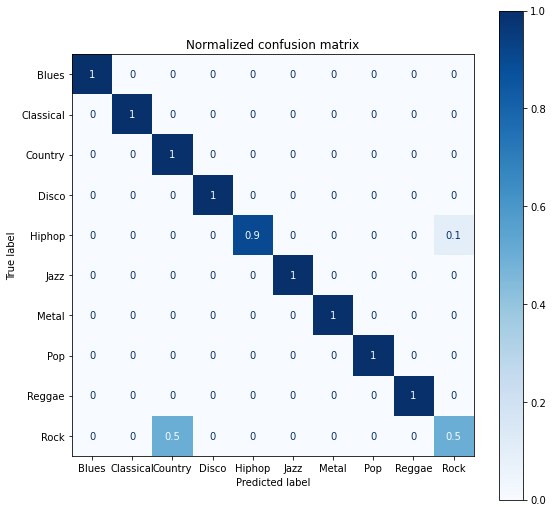

Accuracy score: 0.94 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       0.67      1.00      0.80        10
           3       1.00      1.00      1.00        10
           4       1.00      0.90      0.95        10
           5       1.00      1.00      1.00        10
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        10
           8       1.00      1.00      1.00        10
           9       0.83      0.50      0.62        10

    accuracy                           0.94       100
   macro avg       0.95      0.94      0.94       100
weighted avg       0.95      0.94      0.94       100



In [ ]:
svm = _svm.best_estimator_
svm.fit(x_train_lda, y_train)

y_pred = svm.predict(x_test_lda)

print_results(svm, x_test_lda, y_test, y_pred)

## Neural Networks

### Keras Implementation

#### All features

In [10]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test)


Epoch 1/100
29/29 [==============================] - 1s 5ms/step - loss: 1.9379 - accuracy: 0.3205
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 0.9894 - accuracy: 0.6280
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7460 - accuracy: 0.7582
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6324 - accuracy: 0.7878
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.4592 - accuracy: 0.8416
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3388 - accuracy: 0.8899
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.2824 - accuracy: 0.9110
Epoch 8/100
29/29 [==============================] - 0s 5ms/step - loss: 0.2638 - accuracy: 0.9243
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.1670 - accuracy: 0.9482
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss: 0.1266 - accuracy: 0.9750
Epoch 11/

In [15]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)

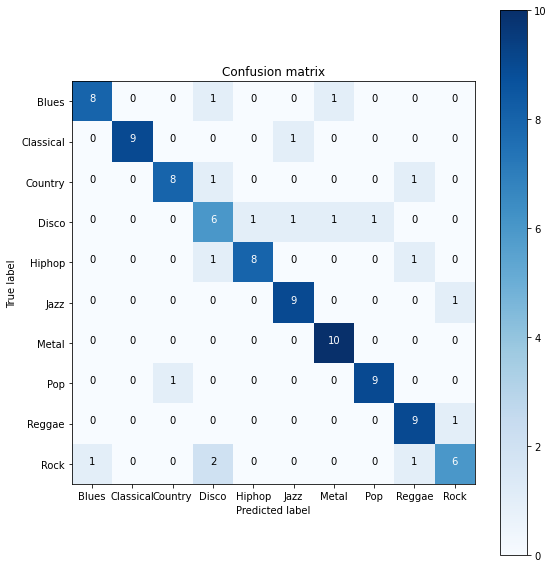

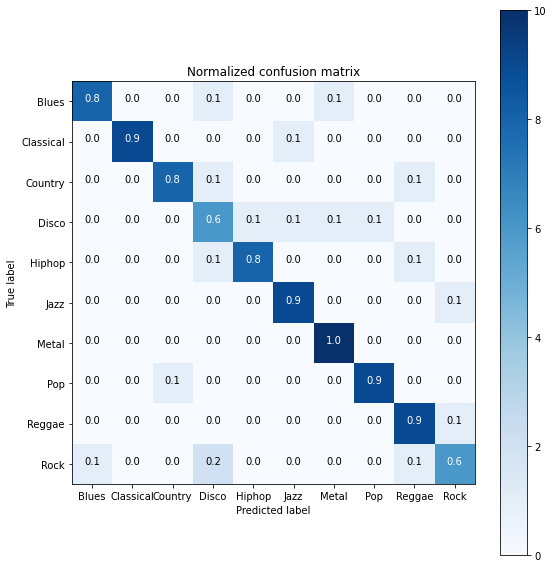

Accuracy score: 0.82 

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        10
           1       1.00      0.90      0.95        10
           2       0.89      0.80      0.84        10
           3       0.55      0.60      0.57        10
           4       0.89      0.80      0.84        10
           5       0.82      0.90      0.86        10
           6       0.83      1.00      0.91        10
           7       0.90      0.90      0.90        10
           8       0.75      0.90      0.82        10
           9       0.75      0.60      0.67        10

    accuracy                           0.82       100
   macro avg       0.83      0.82      0.82       100
weighted avg       0.83      0.82      0.82       100



In [16]:
print_results_NN(y_test, preds.astype(int))

#### K features with highest scores
**k = 50**

In [17]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [18]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_ksel.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_ksel, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_ksel)

Epoch 1/100
29/29 [==============================] - 1s 4ms/step - loss: 1.9360 - accuracy: 0.3106
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 1.0412 - accuracy: 0.6397
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 0.7894 - accuracy: 0.7416
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6112 - accuracy: 0.7907
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.5306 - accuracy: 0.8013
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 0.4300 - accuracy: 0.8494
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 0.4235 - accuracy: 0.8225
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 0.3008 - accuracy: 0.9084
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.2287 - accuracy: 0.9295
Epoch 10/100
29/29 [==============================] - 0s 4ms/step - loss: 0.1961 - accuracy: 0.9260
Epoch 11/

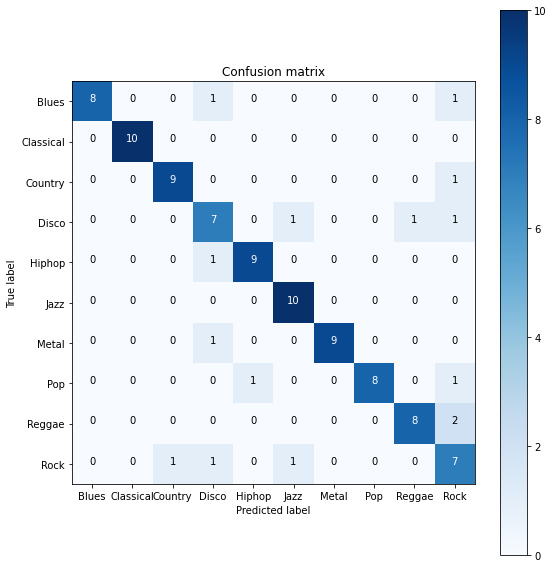

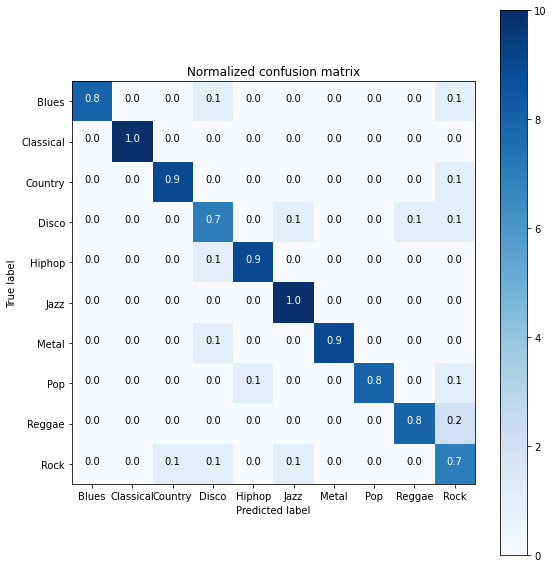

Accuracy score: 0.85 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       1.00      1.00      1.00        10
           2       0.90      0.90      0.90        10
           3       0.64      0.70      0.67        10
           4       0.90      0.90      0.90        10
           5       0.83      1.00      0.91        10
           6       1.00      0.90      0.95        10
           7       1.00      0.80      0.89        10
           8       0.89      0.80      0.84        10
           9       0.54      0.70      0.61        10

    accuracy                           0.85       100
   macro avg       0.87      0.85      0.86       100
weighted avg       0.87      0.85      0.86       100



In [19]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 40**

In [20]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [21]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_ksel.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_ksel, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_ksel)

Epoch 1/100
29/29 [==============================] - 1s 5ms/step - loss: 1.9075 - accuracy: 0.3516
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 1.0847 - accuracy: 0.6312
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8663 - accuracy: 0.6971
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6878 - accuracy: 0.7668
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.7316 - accuracy: 0.7451
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 0.5609 - accuracy: 0.8004
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.4578 - accuracy: 0.8417
Epoch 8/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3969 - accuracy: 0.8728
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3966 - accuracy: 0.8713
Epoch 10/100
29/29 [==============================] - 0s 4ms/step - loss: 0.3294 - accuracy: 0.9041
Epoch 11/

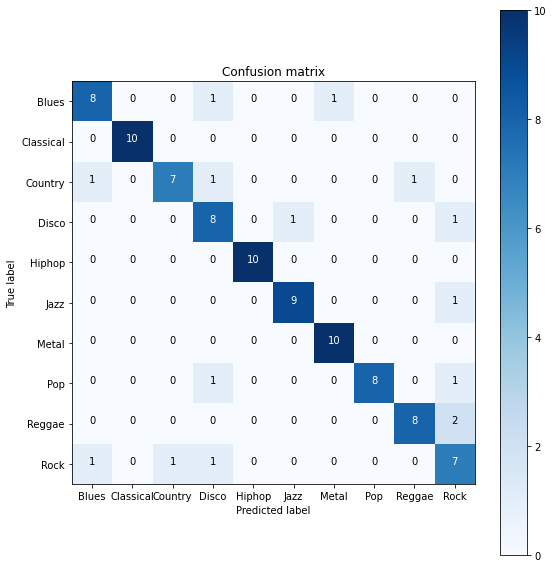

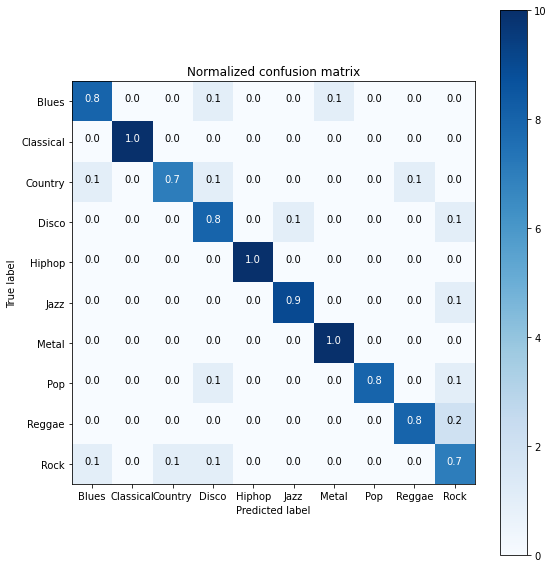

Accuracy score: 0.85 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       1.00      1.00      1.00        10
           2       0.88      0.70      0.78        10
           3       0.67      0.80      0.73        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       0.91      1.00      0.95        10
           7       1.00      0.80      0.89        10
           8       0.89      0.80      0.84        10
           9       0.58      0.70      0.64        10

    accuracy                           0.85       100
   macro avg       0.86      0.85      0.85       100
weighted avg       0.86      0.85      0.85       100



In [22]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 30**

In [23]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [24]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_ksel.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_ksel, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_ksel)


Epoch 1/100
29/29 [==============================] - 1s 5ms/step - loss: 1.9799 - accuracy: 0.3376
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 1.1406 - accuracy: 0.6156
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 0.9130 - accuracy: 0.6745
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.8266 - accuracy: 0.7333
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 0.6240 - accuracy: 0.7735
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 0.6301 - accuracy: 0.7614
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 0.5569 - accuracy: 0.8194
Epoch 8/100
29/29 [==============================] - 0s 5ms/step - loss: 0.5480 - accuracy: 0.8139
Epoch 9/100
29/29 [==============================] - 0s 6ms/step - loss: 0.4665 - accuracy: 0.8298
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3771 - accuracy: 0.8862
Epoch 11/

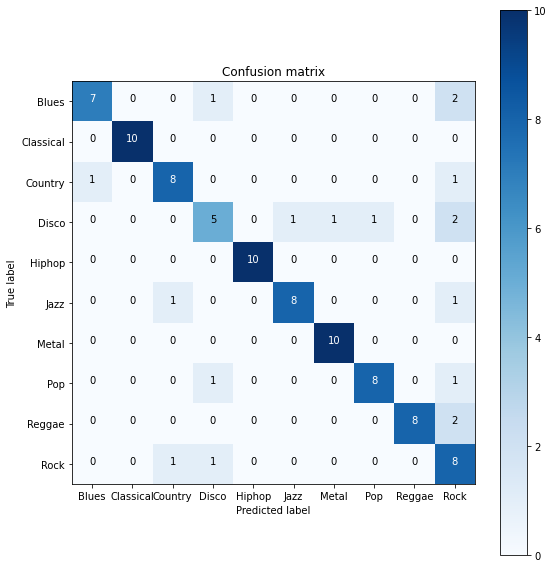

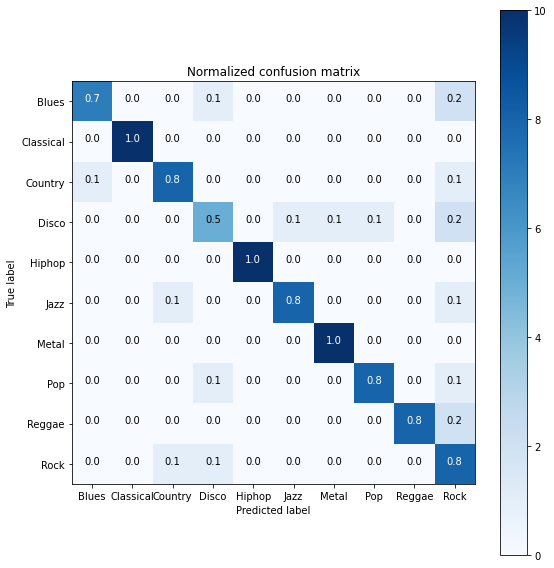

Accuracy score: 0.82 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       1.00      1.00      1.00        10
           2       0.80      0.80      0.80        10
           3       0.62      0.50      0.56        10
           4       1.00      1.00      1.00        10
           5       0.89      0.80      0.84        10
           6       0.91      1.00      0.95        10
           7       0.89      0.80      0.84        10
           8       1.00      0.80      0.89        10
           9       0.47      0.80      0.59        10

    accuracy                           0.82       100
   macro avg       0.85      0.82      0.83       100
weighted avg       0.85      0.82      0.83       100



In [25]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 20**

In [26]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [27]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_ksel.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_ksel, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_ksel)

Epoch 1/100
29/29 [==============================] - 1s 4ms/step - loss: 1.9437 - accuracy: 0.3071
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 1.1873 - accuracy: 0.5549
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 1.0253 - accuracy: 0.6380
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.8986 - accuracy: 0.6534
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8413 - accuracy: 0.6811
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7592 - accuracy: 0.7209
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7100 - accuracy: 0.7300
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7071 - accuracy: 0.7428
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6887 - accuracy: 0.7330
Epoch 10/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7079 - accuracy: 0.7322
Epoch 11/

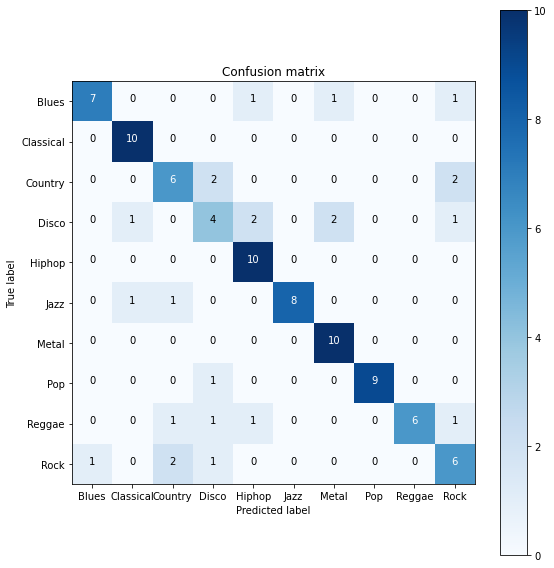

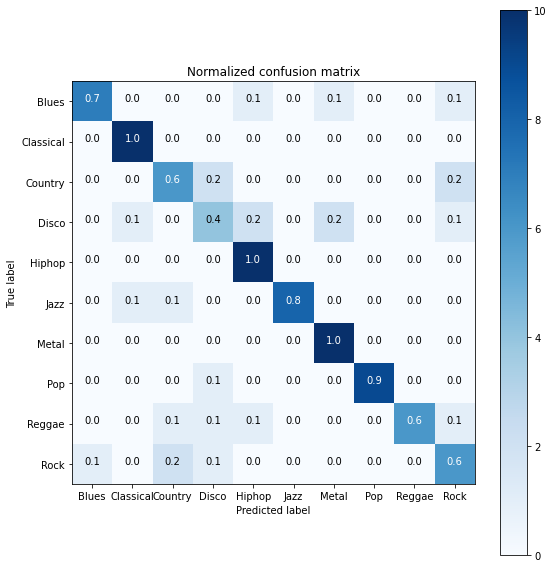

Accuracy score: 0.76 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.83      1.00      0.91        10
           2       0.60      0.60      0.60        10
           3       0.44      0.40      0.42        10
           4       0.71      1.00      0.83        10
           5       1.00      0.80      0.89        10
           6       0.77      1.00      0.87        10
           7       1.00      0.90      0.95        10
           8       1.00      0.60      0.75        10
           9       0.55      0.60      0.57        10

    accuracy                           0.76       100
   macro avg       0.78      0.76      0.76       100
weighted avg       0.78      0.76      0.76       100



In [28]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 10**

In [29]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [30]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_ksel.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_ksel, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_ksel)


Epoch 1/100
29/29 [==============================] - 1s 4ms/step - loss: 2.0615 - accuracy: 0.2686
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 1.4245 - accuracy: 0.4881
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 1.2408 - accuracy: 0.5398
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 1.1544 - accuracy: 0.5786
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 1.0733 - accuracy: 0.6043
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 1.0307 - accuracy: 0.6205
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 1.0120 - accuracy: 0.6335
Epoch 8/100
29/29 [==============================] - 0s 6ms/step - loss: 0.9929 - accuracy: 0.6464
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.9031 - accuracy: 0.6654
Epoch 10/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8393 - accuracy: 0.6871
Epoch 11/

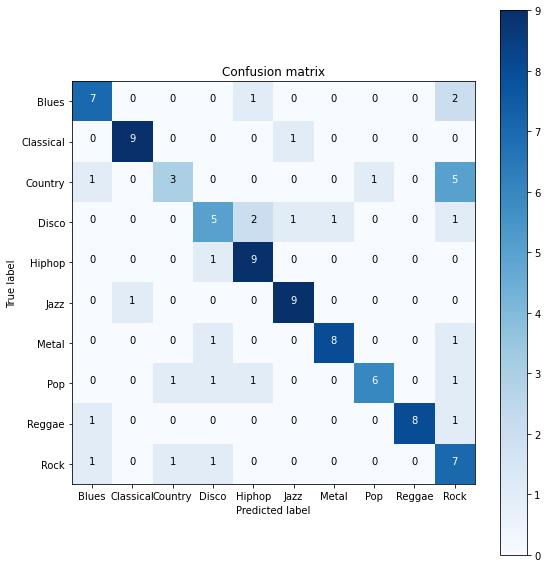

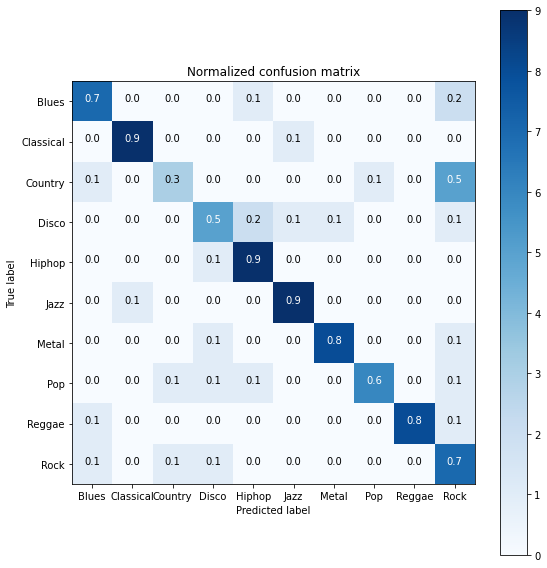

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.90      0.90      0.90        10
           2       0.60      0.30      0.40        10
           3       0.56      0.50      0.53        10
           4       0.69      0.90      0.78        10
           5       0.82      0.90      0.86        10
           6       0.89      0.80      0.84        10
           7       0.86      0.60      0.71        10
           8       1.00      0.80      0.89        10
           9       0.39      0.70      0.50        10

    accuracy                           0.71       100
   macro avg       0.74      0.71      0.71       100
weighted avg       0.74      0.71      0.71       100



In [31]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### PCA

In [36]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_pca.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_pca, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_pca)

Epoch 1/100
29/29 [==============================] - 1s 4ms/step - loss: 1.9112 - accuracy: 0.3605
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 1.1070 - accuracy: 0.6329
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8626 - accuracy: 0.6948
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 0.7477 - accuracy: 0.7217
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6115 - accuracy: 0.7945
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 0.6077 - accuracy: 0.7764
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 0.4741 - accuracy: 0.8326
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 0.4258 - accuracy: 0.8385
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3449 - accuracy: 0.8978
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss: 0.3408 - accuracy: 0.8952
Epoch 11/

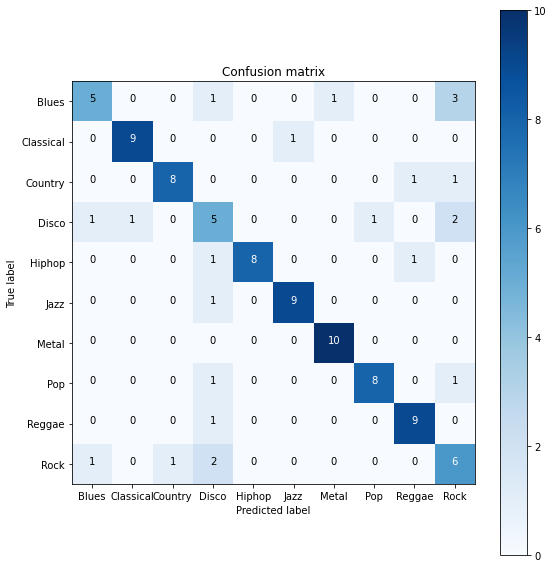

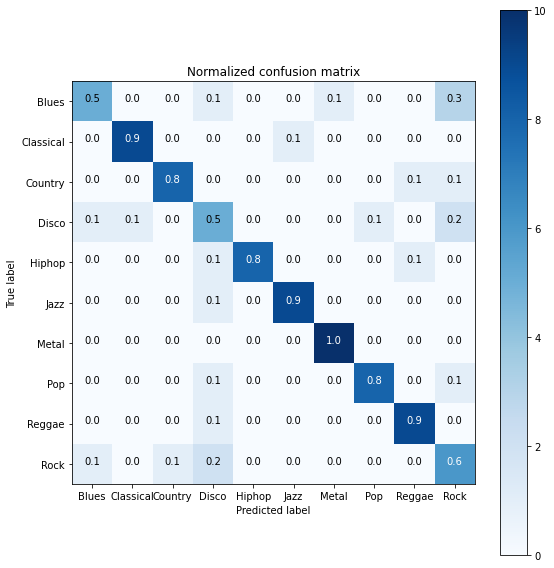

Accuracy score: 0.77 

Classification Report
              precision    recall  f1-score   support

           0       0.71      0.50      0.59        10
           1       0.90      0.90      0.90        10
           2       0.89      0.80      0.84        10
           3       0.42      0.50      0.45        10
           4       1.00      0.80      0.89        10
           5       0.90      0.90      0.90        10
           6       0.91      1.00      0.95        10
           7       0.89      0.80      0.84        10
           8       0.82      0.90      0.86        10
           9       0.46      0.60      0.52        10

    accuracy                           0.77       100
   macro avg       0.79      0.77      0.77       100
weighted avg       0.79      0.77      0.77       100



In [37]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### LDA

In [38]:
model = models.Sequential()

model.add(layers.Dense(512, activation= 'relu', input_shape= (x_train_lda.shape[1],)))

model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(128, activation='relu'))

model.add(layers.Dense(64, activation='relu'))

model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

clf = model.fit(x_train_lda, y_train, epochs = 100, batch_size = 32)
y_pred = model.predict(x_test_lda)

Epoch 1/100
29/29 [==============================] - 1s 4ms/step - loss: 2.0901 - accuracy: 0.2940
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 1.4341 - accuracy: 0.5125
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 1.3060 - accuracy: 0.5354
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 1.1409 - accuracy: 0.6103
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 1.0754 - accuracy: 0.6436
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 1.0117 - accuracy: 0.6389
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.9884 - accuracy: 0.6532
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8834 - accuracy: 0.7246
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 0.8659 - accuracy: 0.6989
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss: 0.6879 - accuracy: 0.7687
Epoch 11/

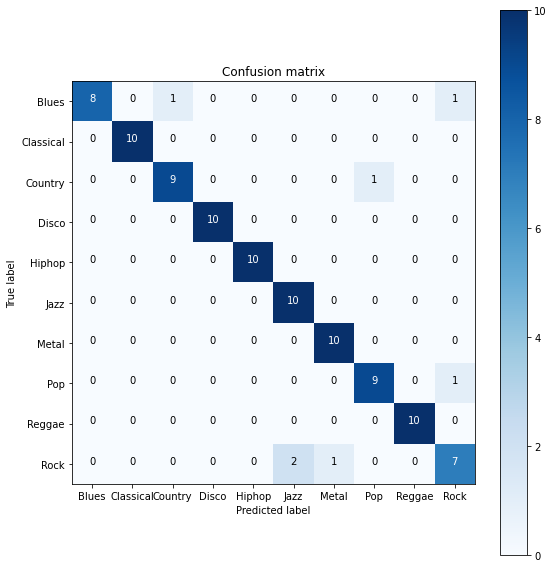

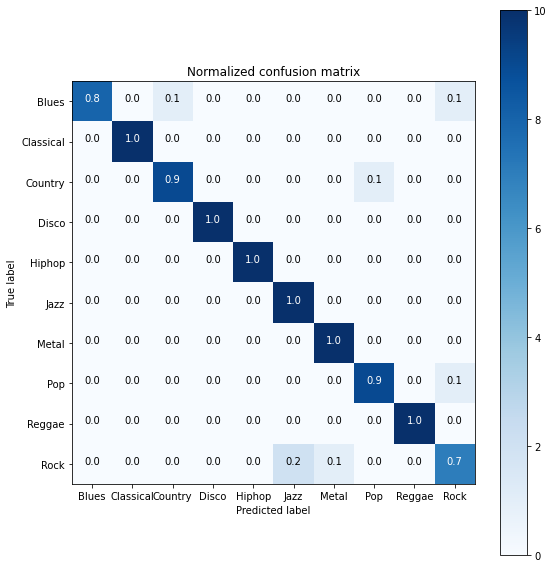

Accuracy score: 0.93 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       1.00      1.00      1.00        10
           2       0.90      0.90      0.90        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.83      1.00      0.91        10
           6       0.91      1.00      0.95        10
           7       0.90      0.90      0.90        10
           8       1.00      1.00      1.00        10
           9       0.78      0.70      0.74        10

    accuracy                           0.93       100
   macro avg       0.93      0.93      0.93       100
weighted avg       0.93      0.93      0.93       100



In [39]:
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

### Keras Implementation 
#### All features

In [ ]:
x_tr = x_train.reshape(-1,x_train.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)
#y_pred = model.predict(x_test)

Epoch 1/300
75/75 [==============================] - 3s 13ms/step - loss: 2.2342 - accuracy: 0.1743
Epoch 2/300
75/75 [==============================] - 1s 13ms/step - loss: 1.8508 - accuracy: 0.2739
Epoch 3/300
75/75 [==============================] - 1s 12ms/step - loss: 1.7272 - accuracy: 0.3559
Epoch 4/300
75/75 [==============================] - 1s 12ms/step - loss: 1.7311 - accuracy: 0.3696
Epoch 5/300
75/75 [==============================] - 1s 13ms/step - loss: 1.6356 - accuracy: 0.3967
Epoch 6/300
75/75 [==============================] - 1s 13ms/step - loss: 1.5720 - accuracy: 0.4124
Epoch 7/300
75/75 [==============================] - 1s 13ms/step - loss: 1.6102 - accuracy: 0.4240
Epoch 8/300
75/75 [==============================] - 1s 12ms/step - loss: 1.5033 - accuracy: 0.4555
Epoch 9/300
75/75 [==============================] - 1s 12ms/step - loss: 1.4943 - accuracy: 0.4506
Epoch 10/300
75/75 [==============================] - 1s 12ms/step - loss: 1.4945 - accuracy: 0.4633

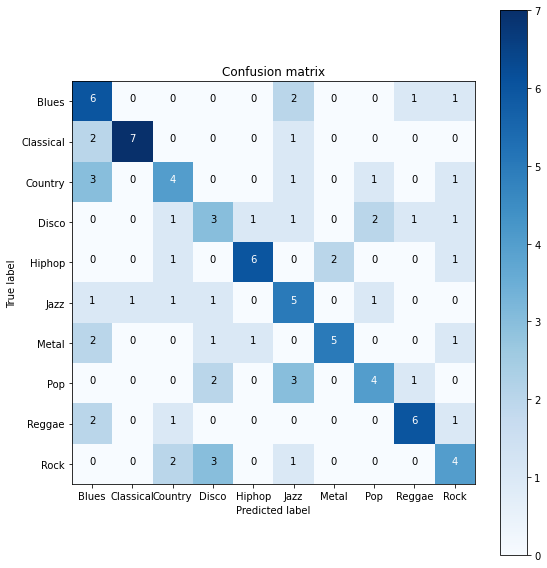

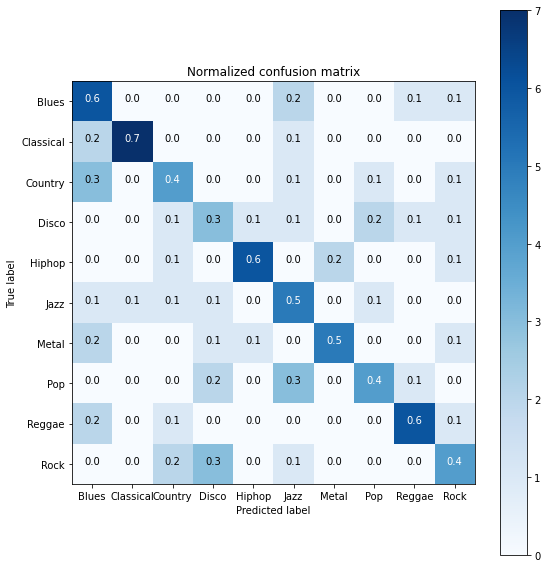

Accuracy score: 0.5 

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.60      0.46        10
           1       0.88      0.70      0.78        10
           2       0.40      0.40      0.40        10
           3       0.30      0.30      0.30        10
           4       0.75      0.60      0.67        10
           5       0.36      0.50      0.42        10
           6       0.71      0.50      0.59        10
           7       0.50      0.40      0.44        10
           8       0.67      0.60      0.63        10
           9       0.40      0.40      0.40        10

    accuracy                           0.50       100
   macro avg       0.53      0.50      0.51       100
weighted avg       0.53      0.50      0.51       100



In [ ]:
y_pred = model.predict(x_test.reshape(-1,x_train.shape[1],1))

predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)

print_results_NN(y_test, preds.astype(int))

#### Without highly correlated features

In [ ]:
x_tr = x_train_wcorr.reshape(-1,x_train_wcorr.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 10ms/step - loss: 2.2675 - accuracy: 0.1035
Epoch 2/300
75/75 [==============================] - 1s 11ms/step - loss: 2.0498 - accuracy: 0.2306
Epoch 3/300
75/75 [==============================] - 1s 10ms/step - loss: 1.9259 - accuracy: 0.2704
Epoch 4/300
75/75 [==============================] - 1s 10ms/step - loss: 1.7712 - accuracy: 0.3306
Epoch 5/300
75/75 [==============================] - 1s 10ms/step - loss: 1.6980 - accuracy: 0.3929
Epoch 6/300
75/75 [==============================] - 1s 10ms/step - loss: 1.5878 - accuracy: 0.4014
Epoch 7/300
75/75 [==============================] - 1s 11ms/step - loss: 1.5829 - accuracy: 0.4325
Epoch 8/300
75/75 [==============================] - 1s 10ms/step - loss: 1.6102 - accuracy: 0.4137
Epoch 9/300
75/75 [==============================] - 1s 11ms/step - loss: 1.5517 - accuracy: 0.4335
Epoch 10/300
75/75 [==============================] - 1s 11ms/step - loss: 1.5276 - accuracy: 0.4572

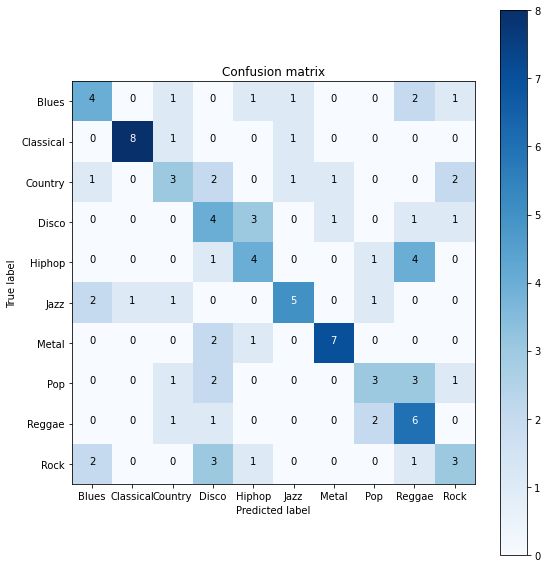

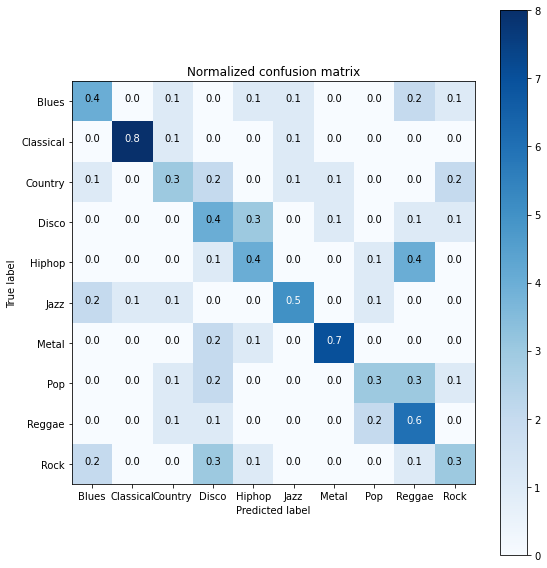

Accuracy score: 0.47 

Classification Report
              precision    recall  f1-score   support

           0       0.44      0.40      0.42        10
           1       0.89      0.80      0.84        10
           2       0.38      0.30      0.33        10
           3       0.27      0.40      0.32        10
           4       0.40      0.40      0.40        10
           5       0.62      0.50      0.56        10
           6       0.78      0.70      0.74        10
           7       0.43      0.30      0.35        10
           8       0.35      0.60      0.44        10
           9       0.38      0.30      0.33        10

    accuracy                           0.47       100
   macro avg       0.49      0.47      0.47       100
weighted avg       0.49      0.47      0.47       100



In [ ]:
y_pred = model.predict(x_test_wcorr.reshape(-1,x_train_wcorr.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_tr = x_train_sel.reshape(-1,x_train_sel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 4ms/step - loss: 2.3078 - accuracy: 0.1159
Epoch 2/300
75/75 [==============================] - 0s 4ms/step - loss: 2.2423 - accuracy: 0.2126
Epoch 3/300
75/75 [==============================] - 0s 5ms/step - loss: 2.0697 - accuracy: 0.2492
Epoch 4/300
75/75 [==============================] - 0s 5ms/step - loss: 1.8613 - accuracy: 0.3396
Epoch 5/300
75/75 [==============================] - 0s 4ms/step - loss: 1.7658 - accuracy: 0.3690
Epoch 6/300
75/75 [==============================] - 0s 5ms/step - loss: 1.6928 - accuracy: 0.4057
Epoch 7/300
75/75 [==============================] - 0s 5ms/step - loss: 1.6534 - accuracy: 0.4388
Epoch 8/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5338 - accuracy: 0.4970
Epoch 9/300
75/75 [==============================] - 0s 5ms/step - loss: 1.4976 - accuracy: 0.5015
Epoch 10/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5190 - accuracy: 0.4840
Epoch 11/

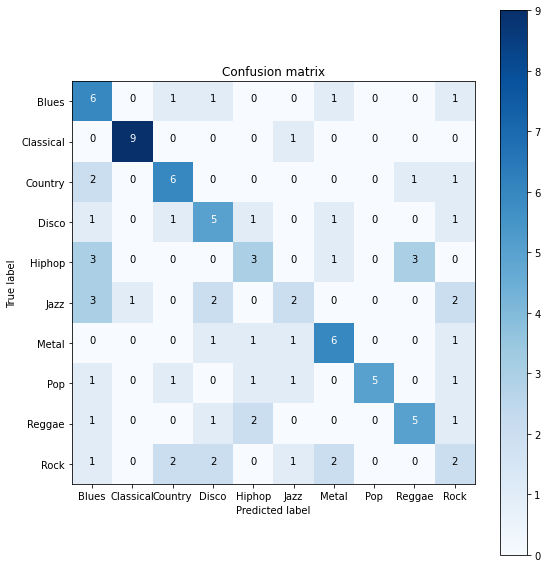

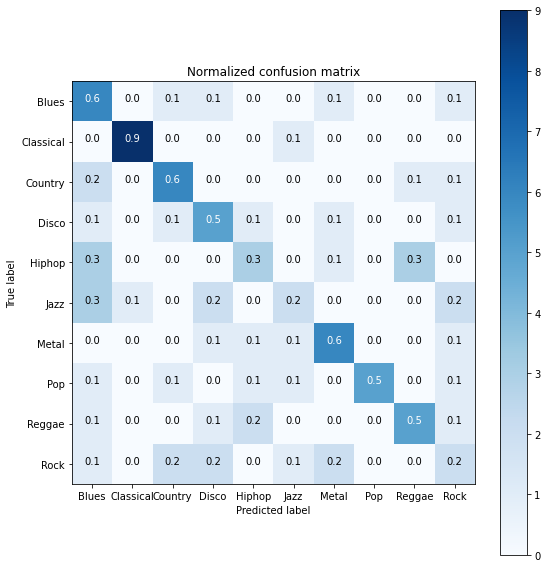

Accuracy score: 0.49 

Classification Report
              precision    recall  f1-score   support

           0       0.33      0.60      0.43        10
           1       0.90      0.90      0.90        10
           2       0.55      0.60      0.57        10
           3       0.42      0.50      0.45        10
           4       0.38      0.30      0.33        10
           5       0.33      0.20      0.25        10
           6       0.55      0.60      0.57        10
           7       1.00      0.50      0.67        10
           8       0.56      0.50      0.53        10
           9       0.20      0.20      0.20        10

    accuracy                           0.49       100
   macro avg       0.52      0.49      0.49       100
weighted avg       0.52      0.49      0.49       100



In [ ]:
y_pred = model.predict(x_test_sel.reshape(-1,x_train_sel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [ ]:
x_tr = x_train_ksel.reshape(-1,x_train_ksel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 10ms/step - loss: 2.2468 - accuracy: 0.1572
Epoch 2/300
75/75 [==============================] - 1s 10ms/step - loss: 2.0098 - accuracy: 0.2644
Epoch 3/300
75/75 [==============================] - 1s 10ms/step - loss: 1.7281 - accuracy: 0.3603
Epoch 4/300
75/75 [==============================] - 1s 10ms/step - loss: 1.5989 - accuracy: 0.4318
Epoch 5/300
75/75 [==============================] - 1s 10ms/step - loss: 1.5709 - accuracy: 0.4481
Epoch 6/300
75/75 [==============================] - 1s 10ms/step - loss: 1.5285 - accuracy: 0.4497
Epoch 7/300
75/75 [==============================] - 1s 10ms/step - loss: 1.5201 - accuracy: 0.4461
Epoch 8/300
75/75 [==============================] - 1s 10ms/step - loss: 1.4631 - accuracy: 0.4712
Epoch 9/300
75/75 [==============================] - 1s 11ms/step - loss: 1.3990 - accuracy: 0.4739
Epoch 10/300
75/75 [==============================] - 1s 10ms/step - loss: 1.4771 - accuracy: 0.4851

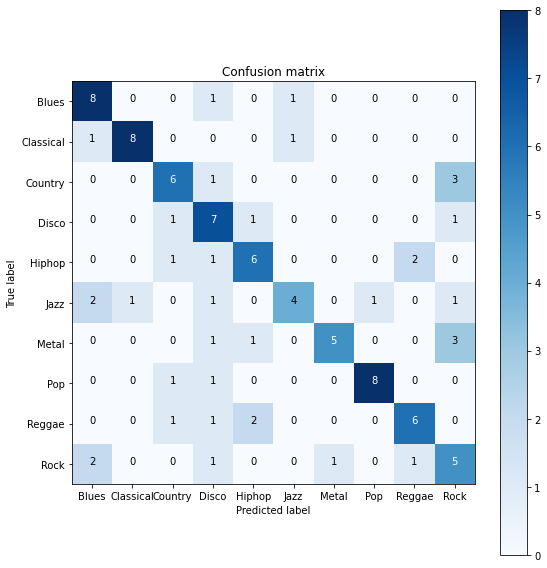

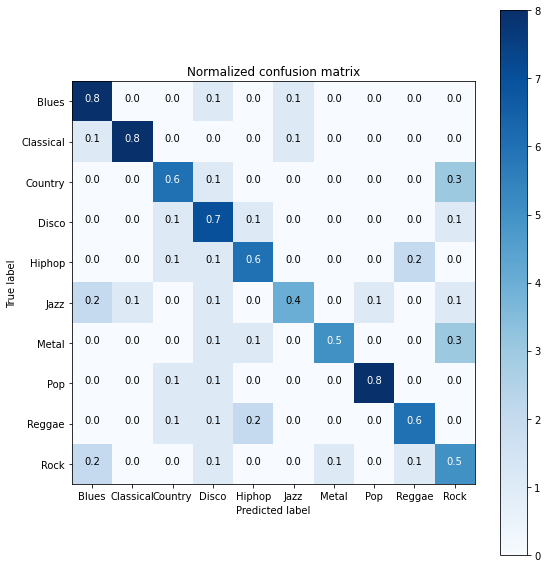

Accuracy score: 0.63 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.89      0.80      0.84        10
           2       0.60      0.60      0.60        10
           3       0.47      0.70      0.56        10
           4       0.60      0.60      0.60        10
           5       0.67      0.40      0.50        10
           6       0.83      0.50      0.62        10
           7       0.89      0.80      0.84        10
           8       0.67      0.60      0.63        10
           9       0.38      0.50      0.43        10

    accuracy                           0.63       100
   macro avg       0.66      0.63      0.63       100
weighted avg       0.66      0.63      0.63       100



In [ ]:
y_pred = model.predict(x_test_ksel.reshape(-1,x_train_ksel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [ ]:
x_tr = x_train_ksel.reshape(-1,x_train_ksel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 8ms/step - loss: 2.2548 - accuracy: 0.1635
Epoch 2/300
75/75 [==============================] - 1s 8ms/step - loss: 1.8683 - accuracy: 0.3284
Epoch 3/300
75/75 [==============================] - 1s 8ms/step - loss: 1.7087 - accuracy: 0.3588
Epoch 4/300
75/75 [==============================] - 1s 8ms/step - loss: 1.6613 - accuracy: 0.3593
Epoch 5/300
75/75 [==============================] - 1s 8ms/step - loss: 1.5664 - accuracy: 0.4079
Epoch 6/300
75/75 [==============================] - 1s 9ms/step - loss: 1.5269 - accuracy: 0.4296
Epoch 7/300
75/75 [==============================] - 1s 9ms/step - loss: 1.4416 - accuracy: 0.4853
Epoch 8/300
75/75 [==============================] - 1s 9ms/step - loss: 1.4151 - accuracy: 0.5168
Epoch 9/300
75/75 [==============================] - 1s 8ms/step - loss: 1.3903 - accuracy: 0.4944
Epoch 10/300
75/75 [==============================] - 1s 8ms/step - loss: 1.4002 - accuracy: 0.5080
Epoch 11/

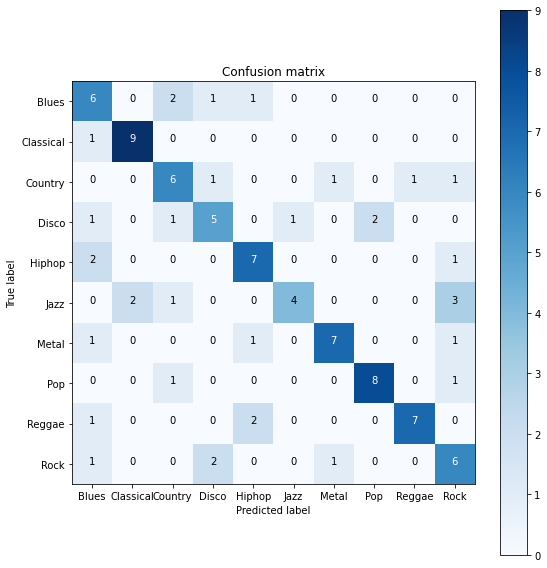

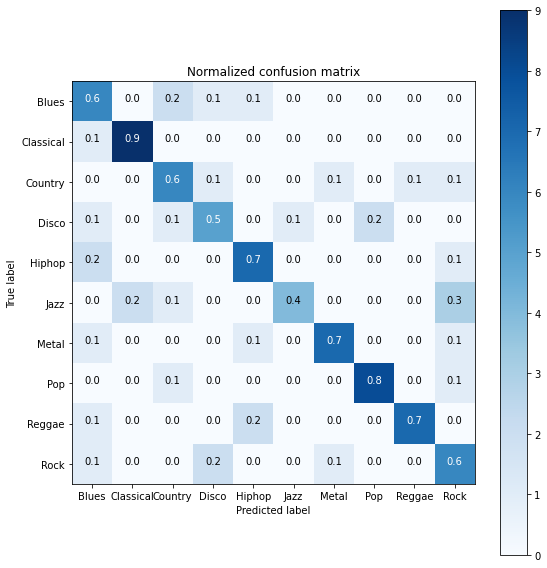

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.46      0.60      0.52        10
           1       0.82      0.90      0.86        10
           2       0.55      0.60      0.57        10
           3       0.56      0.50      0.53        10
           4       0.64      0.70      0.67        10
           5       0.80      0.40      0.53        10
           6       0.78      0.70      0.74        10
           7       0.80      0.80      0.80        10
           8       0.88      0.70      0.78        10
           9       0.46      0.60      0.52        10

    accuracy                           0.65       100
   macro avg       0.67      0.65      0.65       100
weighted avg       0.67      0.65      0.65       100



In [ ]:
y_pred = model.predict(x_test_ksel.reshape(-1,x_train_ksel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [ ]:
x_tr = x_train_ksel.reshape(-1,x_train_ksel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 6ms/step - loss: 2.2683 - accuracy: 0.1584
Epoch 2/300
75/75 [==============================] - 1s 7ms/step - loss: 2.0205 - accuracy: 0.2839
Epoch 3/300
75/75 [==============================] - 0s 6ms/step - loss: 1.7560 - accuracy: 0.3475
Epoch 4/300
75/75 [==============================] - 0s 6ms/step - loss: 1.6337 - accuracy: 0.4268
Epoch 5/300
75/75 [==============================] - 0s 6ms/step - loss: 1.6019 - accuracy: 0.4327
Epoch 6/300
75/75 [==============================] - 0s 6ms/step - loss: 1.5230 - accuracy: 0.4485
Epoch 7/300
75/75 [==============================] - 1s 7ms/step - loss: 1.5510 - accuracy: 0.4074
Epoch 8/300
75/75 [==============================] - 1s 7ms/step - loss: 1.4334 - accuracy: 0.4664
Epoch 9/300
75/75 [==============================] - 1s 7ms/step - loss: 1.3946 - accuracy: 0.4808
Epoch 10/300
75/75 [==============================] - 1s 7ms/step - loss: 1.3832 - accuracy: 0.4936
Epoch 11/

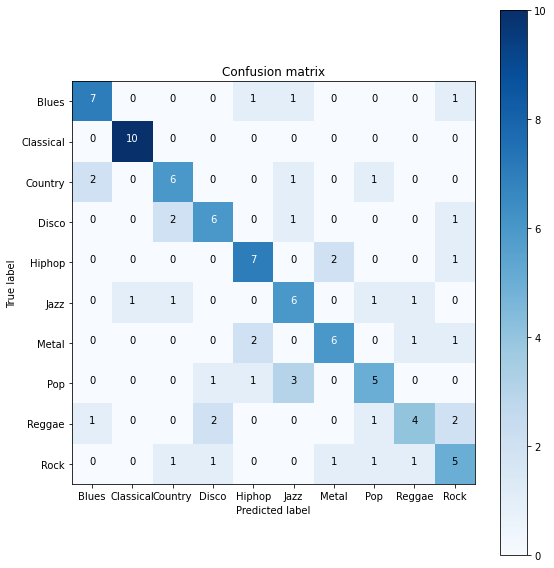

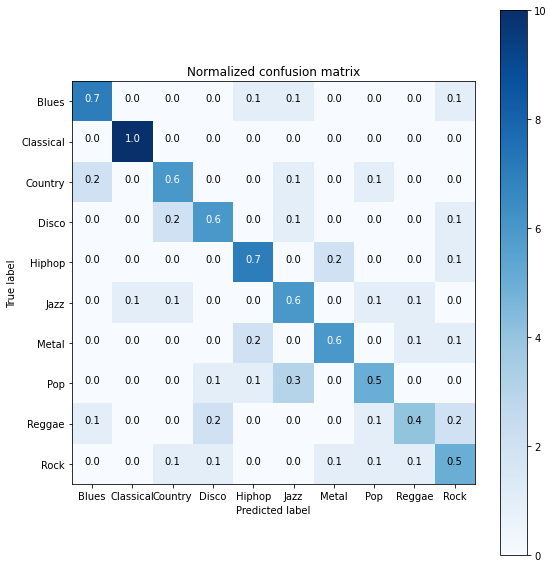

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.91      1.00      0.95        10
           2       0.60      0.60      0.60        10
           3       0.60      0.60      0.60        10
           4       0.64      0.70      0.67        10
           5       0.50      0.60      0.55        10
           6       0.67      0.60      0.63        10
           7       0.56      0.50      0.53        10
           8       0.57      0.40      0.47        10
           9       0.45      0.50      0.48        10

    accuracy                           0.62       100
   macro avg       0.62      0.62      0.62       100
weighted avg       0.62      0.62      0.62       100



In [ ]:
y_pred = model.predict(x_test_ksel.reshape(-1,x_train_ksel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [ ]:
x_tr = x_train_ksel.reshape(-1,x_train_ksel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 4ms/step - loss: 2.2893 - accuracy: 0.1545
Epoch 2/300
75/75 [==============================] - 0s 5ms/step - loss: 2.0784 - accuracy: 0.2539
Epoch 3/300
75/75 [==============================] - 0s 5ms/step - loss: 1.8423 - accuracy: 0.3162
Epoch 4/300
75/75 [==============================] - 0s 4ms/step - loss: 1.7225 - accuracy: 0.3935
Epoch 5/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5967 - accuracy: 0.4245
Epoch 6/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5251 - accuracy: 0.4595
Epoch 7/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5379 - accuracy: 0.4495
Epoch 8/300
75/75 [==============================] - 0s 5ms/step - loss: 1.4615 - accuracy: 0.4559
Epoch 9/300
75/75 [==============================] - 0s 5ms/step - loss: 1.4444 - accuracy: 0.4747
Epoch 10/300
75/75 [==============================] - 0s 5ms/step - loss: 1.3913 - accuracy: 0.4982
Epoch 11/

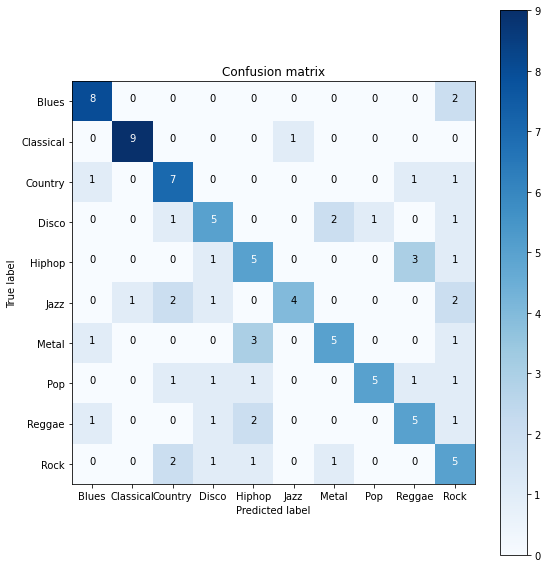

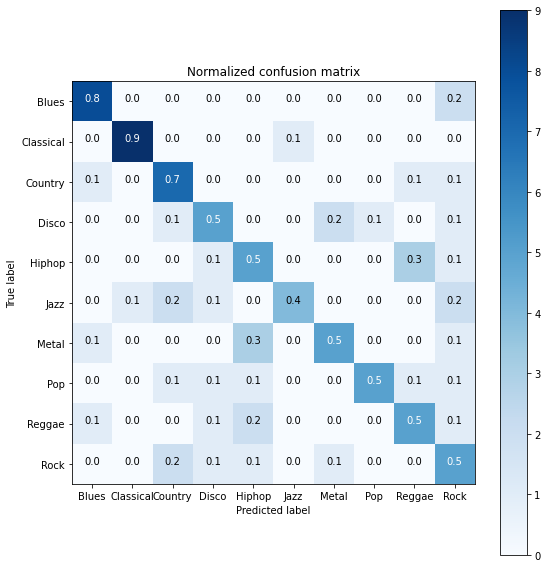

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.90      0.90      0.90        10
           2       0.54      0.70      0.61        10
           3       0.50      0.50      0.50        10
           4       0.42      0.50      0.45        10
           5       0.80      0.40      0.53        10
           6       0.62      0.50      0.56        10
           7       0.83      0.50      0.62        10
           8       0.50      0.50      0.50        10
           9       0.33      0.50      0.40        10

    accuracy                           0.58       100
   macro avg       0.62      0.58      0.58       100
weighted avg       0.62      0.58      0.58       100



In [ ]:
y_pred = model.predict(x_test_ksel.reshape(-1,x_train_ksel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

In [ ]:
x_tr = x_train_ksel.reshape(-1,x_train_ksel.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 3ms/step - loss: 2.2316 - accuracy: 0.1780
Epoch 2/300
75/75 [==============================] - 0s 3ms/step - loss: 1.9826 - accuracy: 0.2295
Epoch 3/300
75/75 [==============================] - 0s 3ms/step - loss: 1.8598 - accuracy: 0.2896
Epoch 4/300
75/75 [==============================] - 0s 4ms/step - loss: 1.8050 - accuracy: 0.3286
Epoch 5/300
75/75 [==============================] - 0s 3ms/step - loss: 1.7196 - accuracy: 0.3561
Epoch 6/300
75/75 [==============================] - 0s 3ms/step - loss: 1.6720 - accuracy: 0.3916
Epoch 7/300
75/75 [==============================] - 0s 3ms/step - loss: 1.6531 - accuracy: 0.3824
Epoch 8/300
75/75 [==============================] - 0s 3ms/step - loss: 1.5814 - accuracy: 0.4137
Epoch 9/300
75/75 [==============================] - 0s 3ms/step - loss: 1.5725 - accuracy: 0.4262
Epoch 10/300
75/75 [==============================] - 0s 4ms/step - loss: 1.5400 - accuracy: 0.4374
Epoch 11/

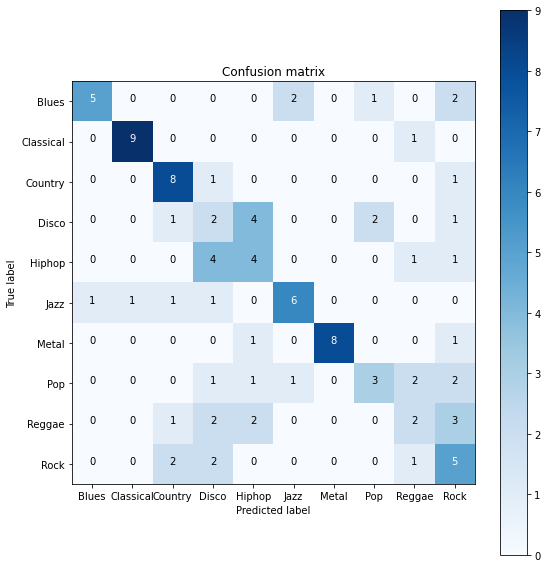

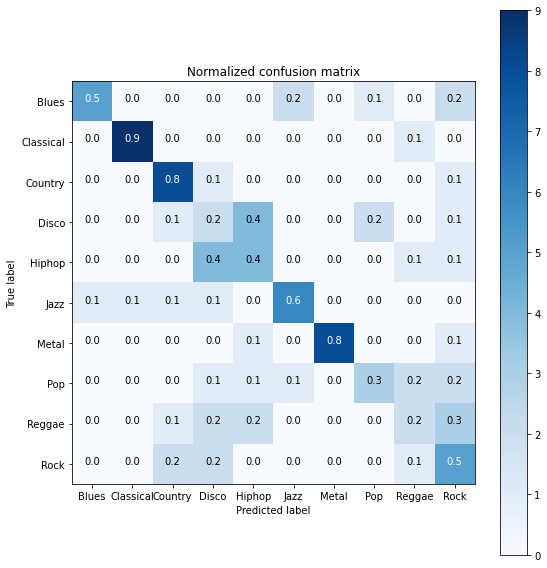

Accuracy score: 0.52 

Classification Report
              precision    recall  f1-score   support

           0       0.83      0.50      0.62        10
           1       0.90      0.90      0.90        10
           2       0.62      0.80      0.70        10
           3       0.15      0.20      0.17        10
           4       0.33      0.40      0.36        10
           5       0.67      0.60      0.63        10
           6       1.00      0.80      0.89        10
           7       0.50      0.30      0.37        10
           8       0.29      0.20      0.24        10
           9       0.31      0.50      0.38        10

    accuracy                           0.52       100
   macro avg       0.56      0.52      0.53       100
weighted avg       0.56      0.52      0.53       100



In [ ]:
y_pred = model.predict(x_test_ksel.reshape(-1,x_train_ksel.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### PCA

In [ ]:
x_tr = x_train_pca.reshape(-1,x_train_pca.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 4ms/step - loss: 2.3032 - accuracy: 0.1047
Epoch 2/300
75/75 [==============================] - 0s 4ms/step - loss: 2.1970 - accuracy: 0.2361
Epoch 3/300
75/75 [==============================] - 0s 5ms/step - loss: 2.0139 - accuracy: 0.3263
Epoch 4/300
75/75 [==============================] - 0s 4ms/step - loss: 1.8579 - accuracy: 0.3359
Epoch 5/300
75/75 [==============================] - 0s 5ms/step - loss: 1.7290 - accuracy: 0.3932
Epoch 6/300
75/75 [==============================] - 0s 4ms/step - loss: 1.7147 - accuracy: 0.3608
Epoch 7/300
75/75 [==============================] - 0s 5ms/step - loss: 1.5741 - accuracy: 0.4092
Epoch 8/300
75/75 [==============================] - 0s 4ms/step - loss: 1.5341 - accuracy: 0.4393
Epoch 9/300
75/75 [==============================] - 0s 4ms/step - loss: 1.4014 - accuracy: 0.4881
Epoch 10/300
75/75 [==============================] - 0s 5ms/step - loss: 1.4072 - accuracy: 0.4964
Epoch 11/

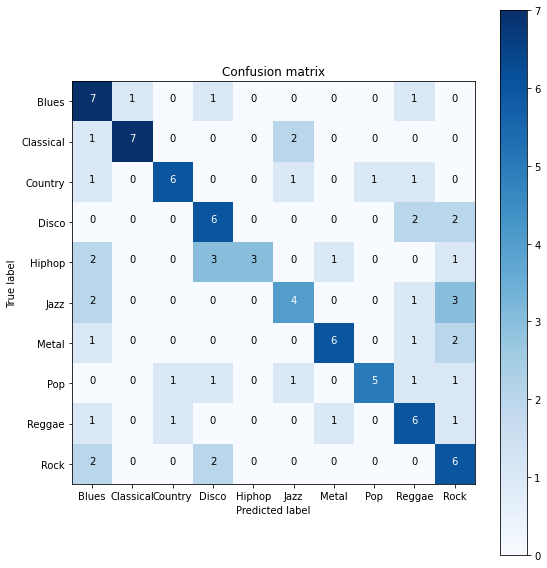

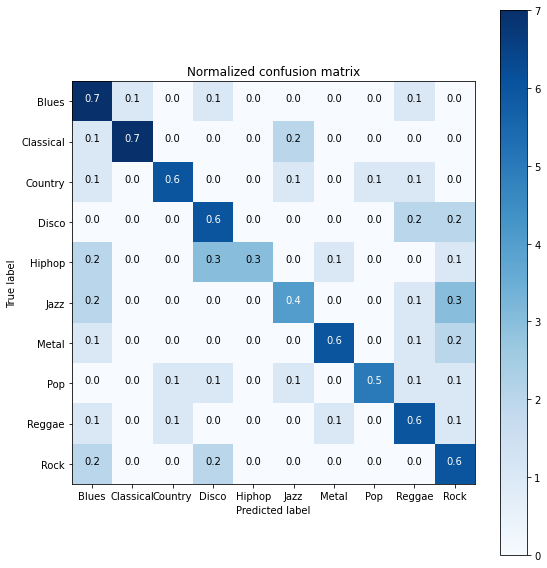

Accuracy score: 0.56 

Classification Report
              precision    recall  f1-score   support

           0       0.41      0.70      0.52        10
           1       0.88      0.70      0.78        10
           2       0.75      0.60      0.67        10
           3       0.46      0.60      0.52        10
           4       1.00      0.30      0.46        10
           5       0.50      0.40      0.44        10
           6       0.75      0.60      0.67        10
           7       0.83      0.50      0.62        10
           8       0.46      0.60      0.52        10
           9       0.38      0.60      0.46        10

    accuracy                           0.56       100
   macro avg       0.64      0.56      0.57       100
weighted avg       0.64      0.56      0.57       100



In [ ]:
y_pred = model.predict(x_test_pca.reshape(-1,x_train_pca.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

#### LDA

In [ ]:
x_tr = x_train_lda.reshape(-1,x_train_lda.shape[1],1)

model = models.Sequential()

#CNN
model.add(layers.Conv1D(32, kernel_size = 3, activation = 'elu', input_shape = (x_tr.shape[1:])))
model.add(layers.MaxPooling1D(pool_size=2))

#LSTM
model.add(layers.LSTM(16, activation = 'elu'))
model.add(layers.Dense(10, activation = 'softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_tr, y_train, epochs = 300, batch_size = 12)

Epoch 1/300
75/75 [==============================] - 2s 3ms/step - loss: 2.3240 - accuracy: 0.1254
Epoch 2/300
75/75 [==============================] - 0s 2ms/step - loss: 2.0547 - accuracy: 0.2389
Epoch 3/300
75/75 [==============================] - 0s 3ms/step - loss: 1.8353 - accuracy: 0.3058
Epoch 4/300
75/75 [==============================] - 0s 3ms/step - loss: 1.7325 - accuracy: 0.3893
Epoch 5/300
75/75 [==============================] - 0s 3ms/step - loss: 1.6493 - accuracy: 0.4370
Epoch 6/300
75/75 [==============================] - 0s 3ms/step - loss: 1.5361 - accuracy: 0.4726
Epoch 7/300
75/75 [==============================] - 0s 3ms/step - loss: 1.5354 - accuracy: 0.4852
Epoch 8/300
75/75 [==============================] - 0s 3ms/step - loss: 1.4542 - accuracy: 0.4953
Epoch 9/300
75/75 [==============================] - 0s 3ms/step - loss: 1.4527 - accuracy: 0.5251
Epoch 10/300
75/75 [==============================] - 0s 3ms/step - loss: 1.3343 - accuracy: 0.5188
Epoch 11/

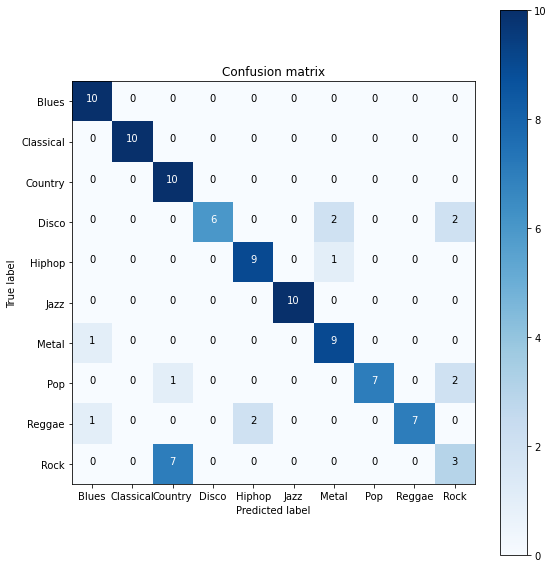

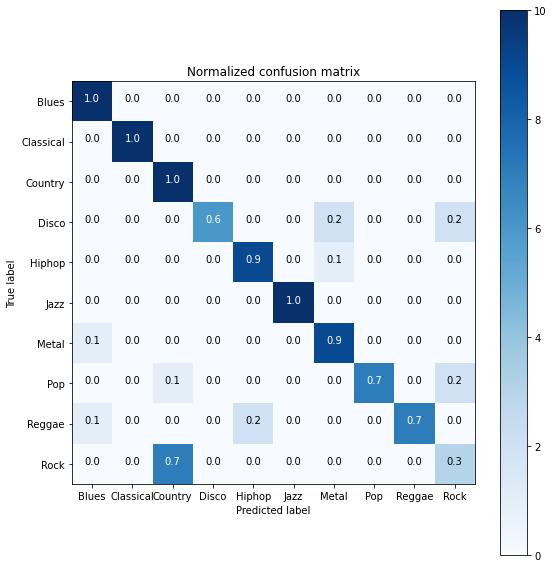

Accuracy score: 0.81 

Classification Report
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       1.00      1.00      1.00        10
           2       0.56      1.00      0.71        10
           3       1.00      0.60      0.75        10
           4       0.82      0.90      0.86        10
           5       1.00      1.00      1.00        10
           6       0.75      0.90      0.82        10
           7       1.00      0.70      0.82        10
           8       1.00      0.70      0.82        10
           9       0.43      0.30      0.35        10

    accuracy                           0.81       100
   macro avg       0.84      0.81      0.80       100
weighted avg       0.84      0.81      0.80       100



In [ ]:
y_pred = model.predict(x_test_lda.reshape(-1,x_train_lda.shape[1],1))
predictions = []
for i in range(len(y_pred)):
    predictions.append(np.argmax(y_pred[i]))
    
preds = np.array(predictions)
print_results_NN(y_test, preds.astype(int))

### Sklearn Implementation

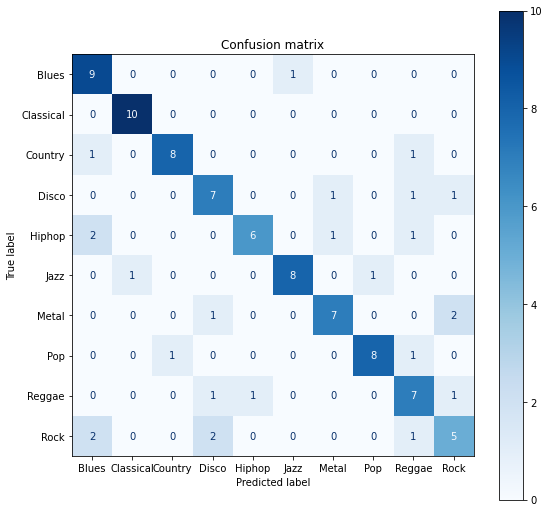

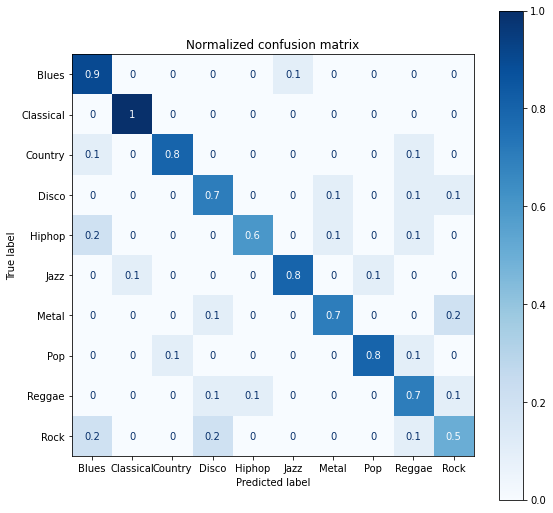

Accuracy score: 0.75 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.90      0.75        10
           1       0.91      1.00      0.95        10
           2       0.89      0.80      0.84        10
           3       0.64      0.70      0.67        10
           4       0.86      0.60      0.71        10
           5       0.89      0.80      0.84        10
           6       0.78      0.70      0.74        10
           7       0.89      0.80      0.84        10
           8       0.58      0.70      0.64        10
           9       0.56      0.50      0.53        10

    accuracy                           0.75       100
   macro avg       0.76      0.75      0.75       100
weighted avg       0.76      0.75      0.75       100



In [ ]:
activation = ['identity', 'logistic', 'tanh', 'relu']
solver = ['lbfgs', 'sgd', 'adam']
learning_rate = ['constant', 'invscaling', 'adaptive']
#max_iter = [1000, 10_000]

parameters = [{'activation': activation, 'solver': solver, 'learning_rate': learning_rate}]

_mlp= GridSearchCV( MLPClassifier(max_iter = 6000), parameters)
#mlp = MLPClassifier()
_mlp.fit(x_train, y_train.values.ravel())

y_pred = _mlp.predict(x_test)
print_results(_mlp,x_test, y_test, y_pred)

In [ ]:
_mlp.best_estimator_

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='adaptive',
              learning_rate_init=0.001, max_fun=15000, max_iter=6000,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

#### Without highly correlated features

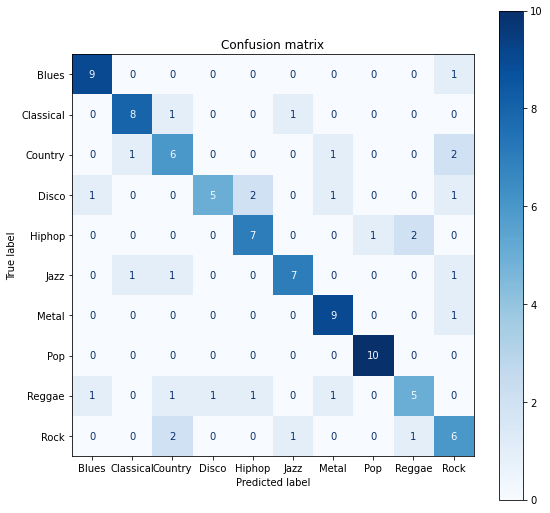

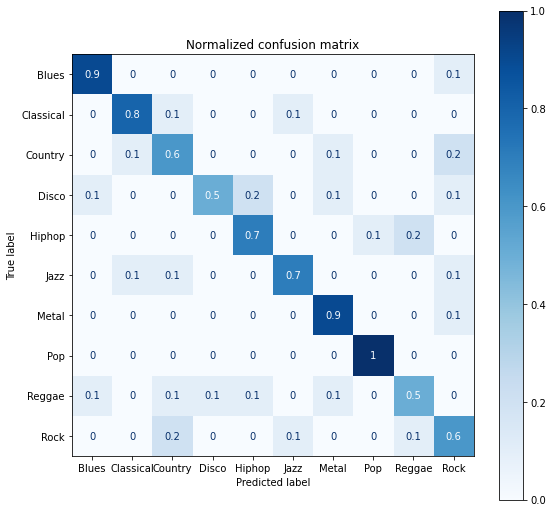

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.80      0.80      0.80        10
           2       0.55      0.60      0.57        10
           3       0.83      0.50      0.62        10
           4       0.70      0.70      0.70        10
           5       0.78      0.70      0.74        10
           6       0.75      0.90      0.82        10
           7       0.91      1.00      0.95        10
           8       0.62      0.50      0.56        10
           9       0.50      0.60      0.55        10

    accuracy                           0.72       100
   macro avg       0.73      0.72      0.72       100
weighted avg       0.73      0.72      0.72       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_wcorr, y_train_wcorr)

y_pred = mlp.predict(x_test_wcorr)

print_results(mlp, x_test_wcorr, y_test_wcorr, y_pred)

#### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

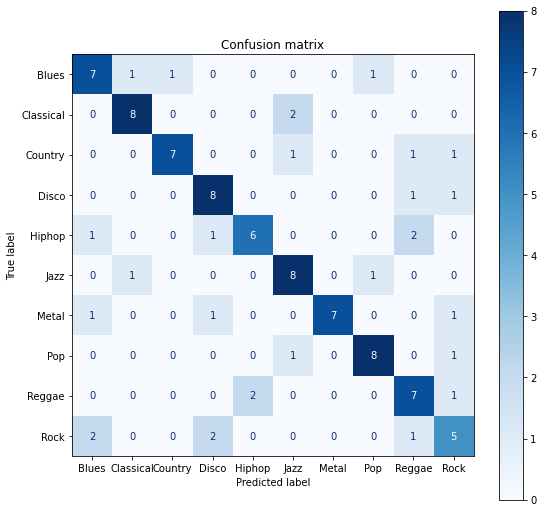

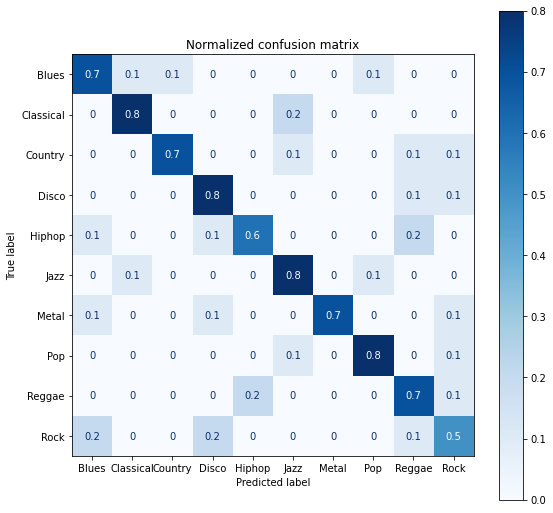

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.70      0.67        10
           1       0.80      0.80      0.80        10
           2       0.88      0.70      0.78        10
           3       0.67      0.80      0.73        10
           4       0.75      0.60      0.67        10
           5       0.67      0.80      0.73        10
           6       1.00      0.70      0.82        10
           7       0.80      0.80      0.80        10
           8       0.58      0.70      0.64        10
           9       0.50      0.50      0.50        10

    accuracy                           0.71       100
   macro avg       0.73      0.71      0.71       100
weighted avg       0.73      0.71      0.71       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_sel, y_train)

y_pred = mlp.predict(x_test_sel)

print_results(mlp, x_test_sel, y_test, y_pred)

#### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

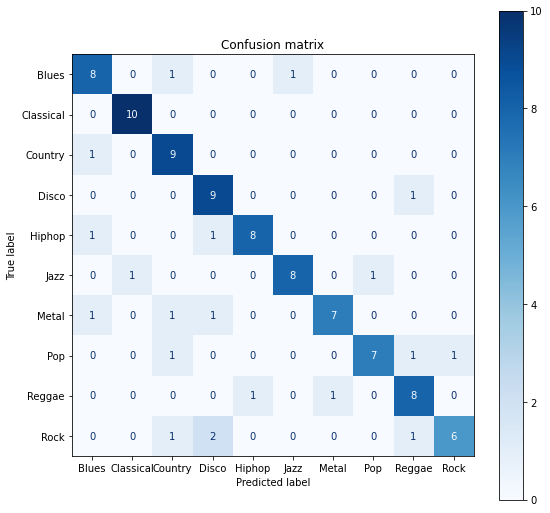

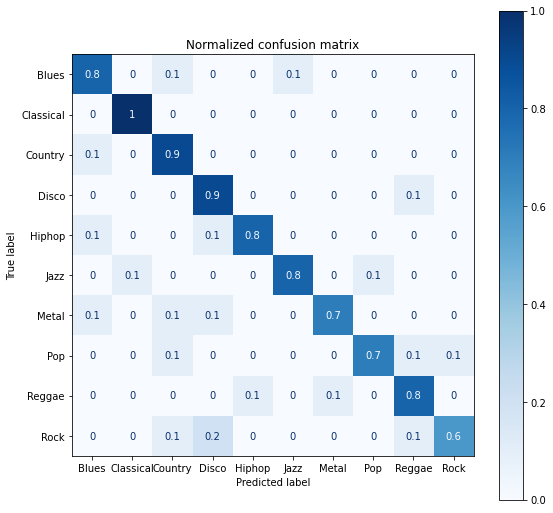

Accuracy score: 0.8 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.91      1.00      0.95        10
           2       0.69      0.90      0.78        10
           3       0.69      0.90      0.78        10
           4       0.89      0.80      0.84        10
           5       0.89      0.80      0.84        10
           6       0.88      0.70      0.78        10
           7       0.88      0.70      0.78        10
           8       0.73      0.80      0.76        10
           9       0.86      0.60      0.71        10

    accuracy                           0.80       100
   macro avg       0.81      0.80      0.80       100
weighted avg       0.81      0.80      0.80       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

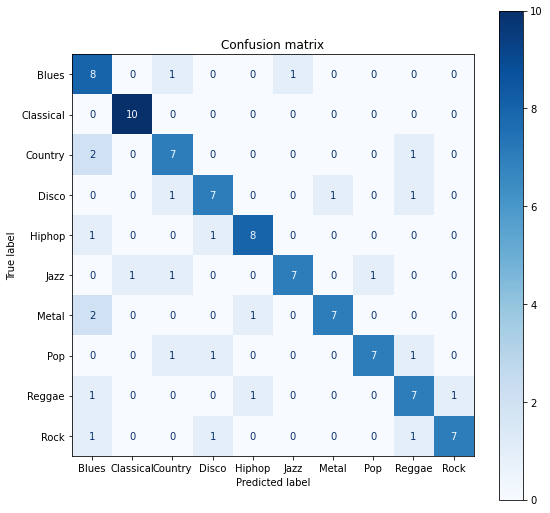

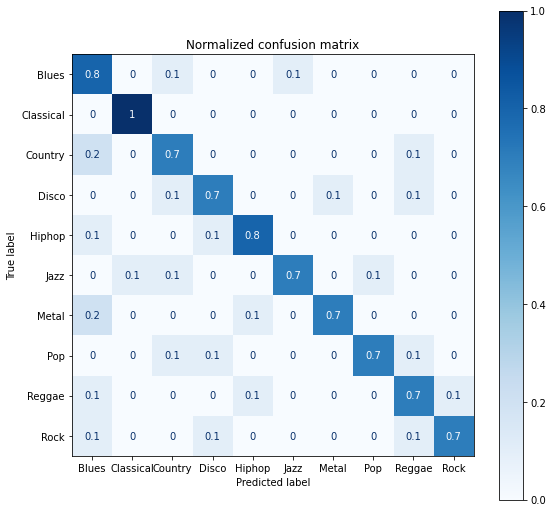

Accuracy score: 0.75 

Classification Report
              precision    recall  f1-score   support

           0       0.53      0.80      0.64        10
           1       0.91      1.00      0.95        10
           2       0.64      0.70      0.67        10
           3       0.70      0.70      0.70        10
           4       0.80      0.80      0.80        10
           5       0.88      0.70      0.78        10
           6       0.88      0.70      0.78        10
           7       0.88      0.70      0.78        10
           8       0.64      0.70      0.67        10
           9       0.88      0.70      0.78        10

    accuracy                           0.75       100
   macro avg       0.77      0.75      0.75       100
weighted avg       0.77      0.75      0.75       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

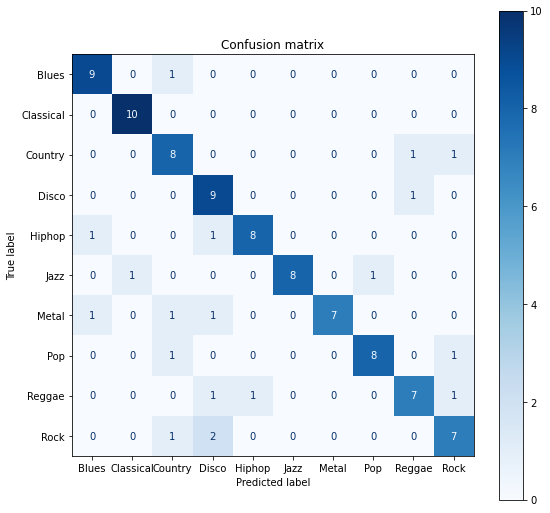

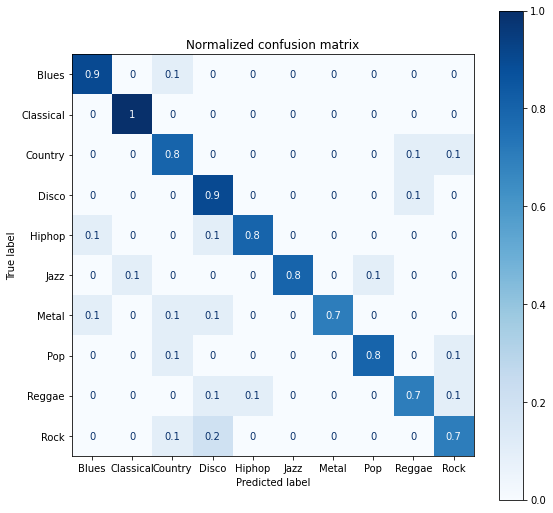

Accuracy score: 0.81 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.64      0.90      0.75        10
           4       0.89      0.80      0.84        10
           5       1.00      0.80      0.89        10
           6       1.00      0.70      0.82        10
           7       0.89      0.80      0.84        10
           8       0.78      0.70      0.74        10
           9       0.70      0.70      0.70        10

    accuracy                           0.81       100
   macro avg       0.83      0.81      0.81       100
weighted avg       0.83      0.81      0.81       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

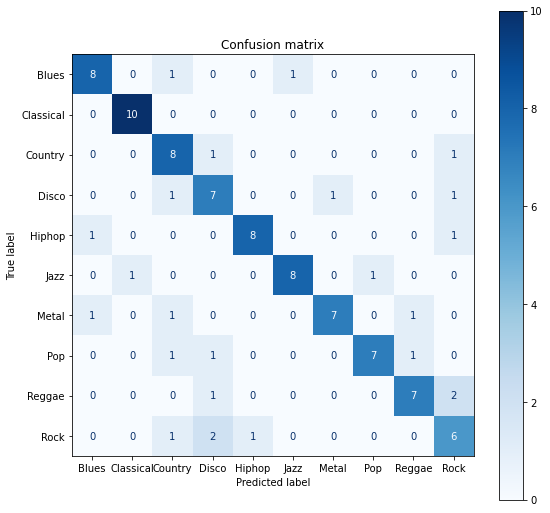

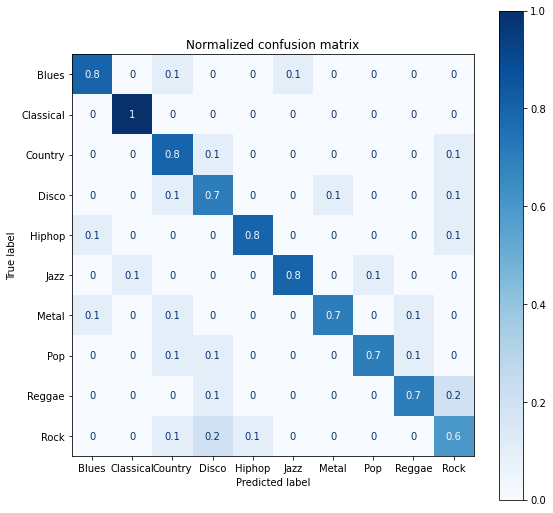

Accuracy score: 0.76 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.58      0.70      0.64        10
           4       0.89      0.80      0.84        10
           5       0.89      0.80      0.84        10
           6       0.88      0.70      0.78        10
           7       0.88      0.70      0.78        10
           8       0.78      0.70      0.74        10
           9       0.55      0.60      0.57        10

    accuracy                           0.76       100
   macro avg       0.78      0.76      0.76       100
weighted avg       0.78      0.76      0.76       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

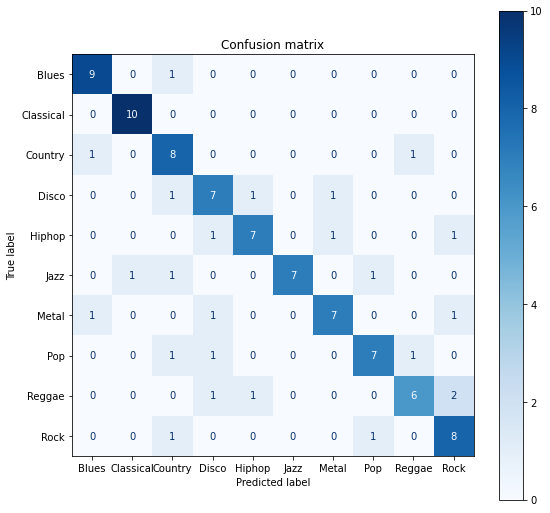

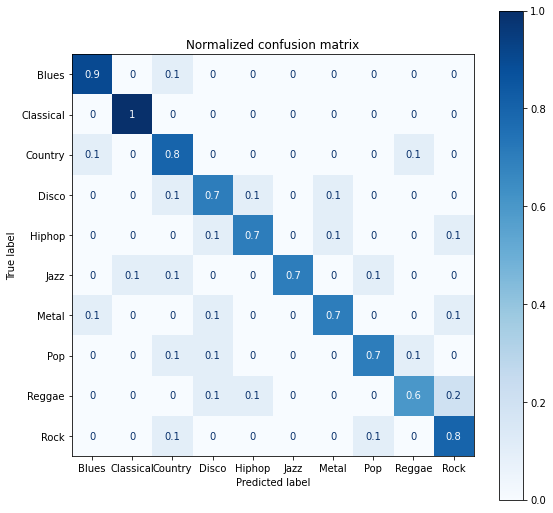

Accuracy score: 0.76 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.62      0.80      0.70        10
           3       0.64      0.70      0.67        10
           4       0.78      0.70      0.74        10
           5       1.00      0.70      0.82        10
           6       0.78      0.70      0.74        10
           7       0.78      0.70      0.74        10
           8       0.75      0.60      0.67        10
           9       0.67      0.80      0.73        10

    accuracy                           0.76       100
   macro avg       0.77      0.76      0.76       100
weighted avg       0.77      0.76      0.76       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

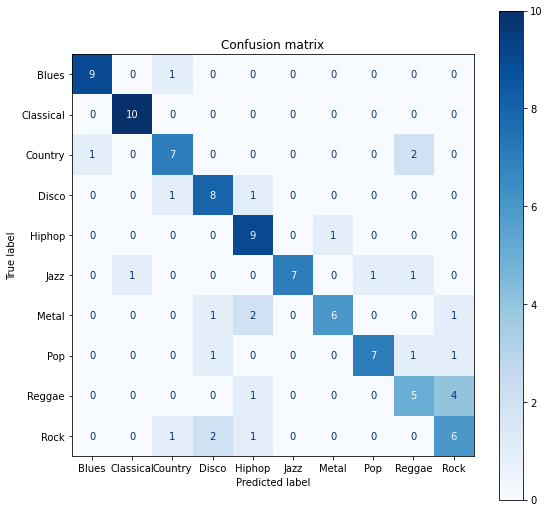

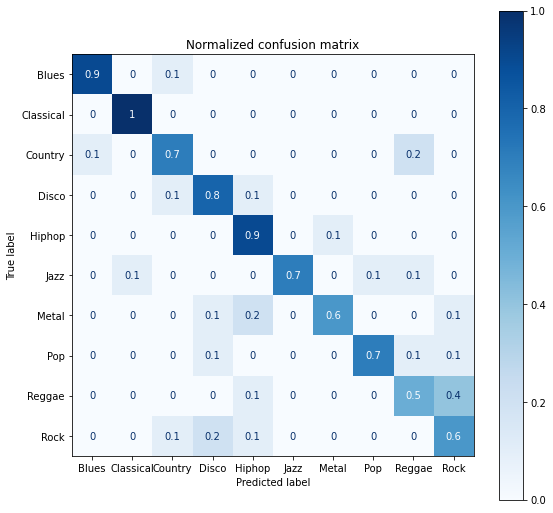

Accuracy score: 0.74 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.91      1.00      0.95        10
           2       0.70      0.70      0.70        10
           3       0.67      0.80      0.73        10
           4       0.64      0.90      0.75        10
           5       1.00      0.70      0.82        10
           6       0.86      0.60      0.71        10
           7       0.88      0.70      0.78        10
           8       0.56      0.50      0.53        10
           9       0.50      0.60      0.55        10

    accuracy                           0.74       100
   macro avg       0.76      0.74      0.74       100
weighted avg       0.76      0.74      0.74       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

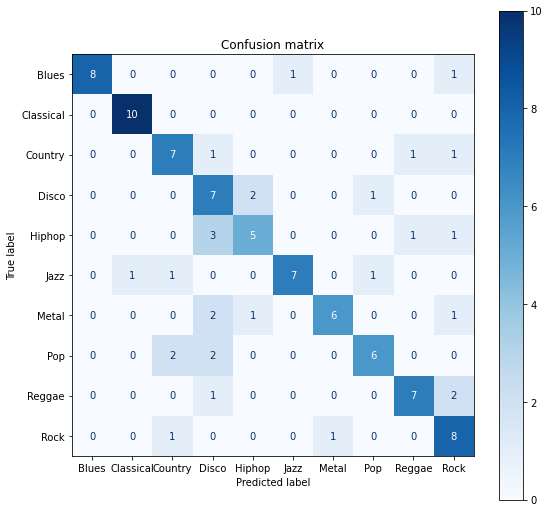

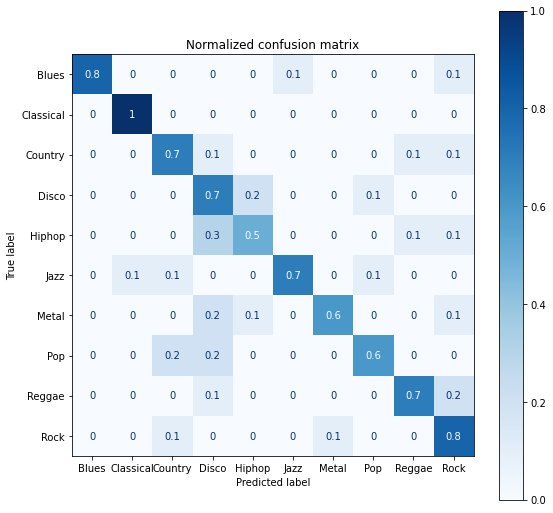

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.91      1.00      0.95        10
           2       0.64      0.70      0.67        10
           3       0.44      0.70      0.54        10
           4       0.62      0.50      0.56        10
           5       0.88      0.70      0.78        10
           6       0.86      0.60      0.71        10
           7       0.75      0.60      0.67        10
           8       0.78      0.70      0.74        10
           9       0.57      0.80      0.67        10

    accuracy                           0.71       100
   macro avg       0.74      0.71      0.72       100
weighted avg       0.74      0.71      0.72       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

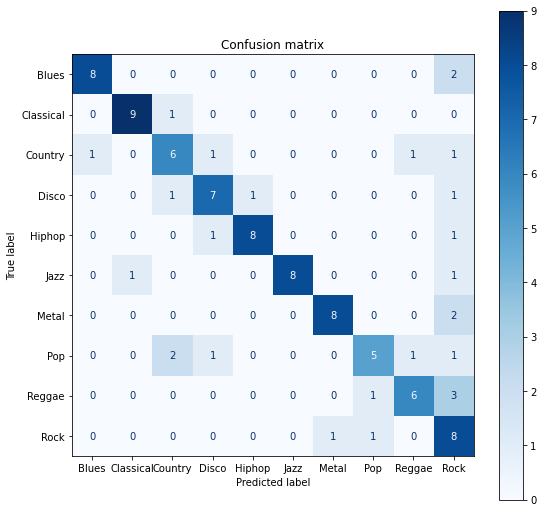

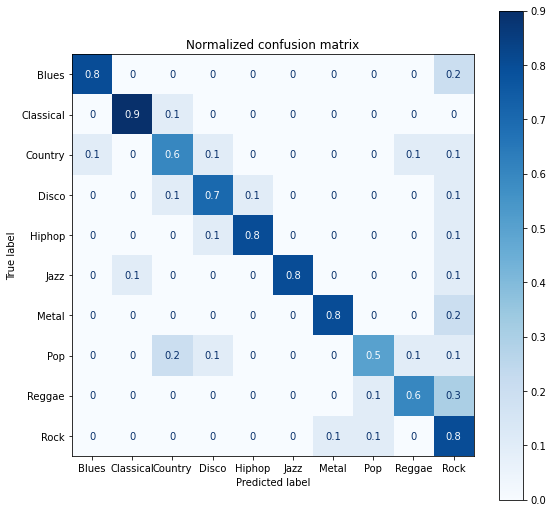

Accuracy score: 0.73 

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        10
           1       0.90      0.90      0.90        10
           2       0.60      0.60      0.60        10
           3       0.70      0.70      0.70        10
           4       0.89      0.80      0.84        10
           5       1.00      0.80      0.89        10
           6       0.89      0.80      0.84        10
           7       0.71      0.50      0.59        10
           8       0.75      0.60      0.67        10
           9       0.40      0.80      0.53        10

    accuracy                           0.73       100
   macro avg       0.77      0.73      0.74       100
weighted avg       0.77      0.73      0.74       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

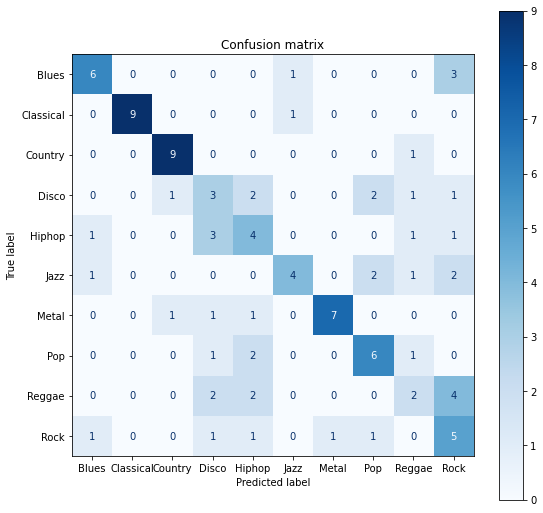

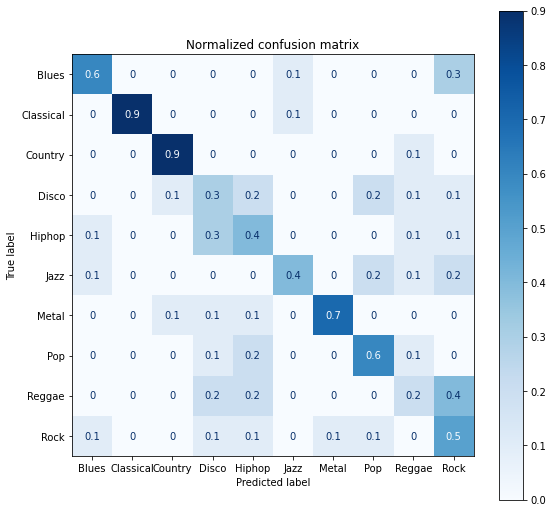

Accuracy score: 0.55 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        10
           1       1.00      0.90      0.95        10
           2       0.82      0.90      0.86        10
           3       0.27      0.30      0.29        10
           4       0.33      0.40      0.36        10
           5       0.67      0.40      0.50        10
           6       0.88      0.70      0.78        10
           7       0.55      0.60      0.57        10
           8       0.29      0.20      0.24        10
           9       0.31      0.50      0.38        10

    accuracy                           0.55       100
   macro avg       0.58      0.55      0.56       100
weighted avg       0.58      0.55      0.56       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

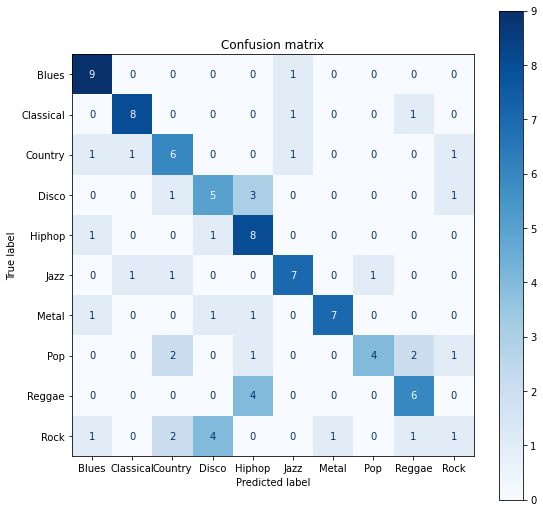

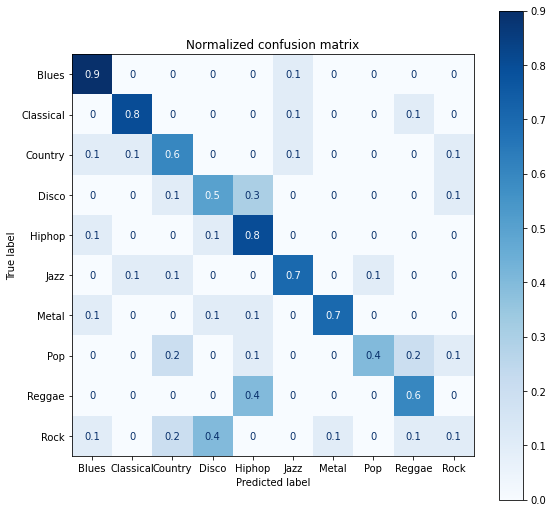

Accuracy score: 0.61 

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.80      0.80      0.80        10
           2       0.50      0.60      0.55        10
           3       0.45      0.50      0.48        10
           4       0.47      0.80      0.59        10
           5       0.70      0.70      0.70        10
           6       0.88      0.70      0.78        10
           7       0.80      0.40      0.53        10
           8       0.60      0.60      0.60        10
           9       0.25      0.10      0.14        10

    accuracy                           0.61       100
   macro avg       0.61      0.61      0.60       100
weighted avg       0.61      0.61      0.60       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_ksel, y_train)

y_pred = mlp.predict(x_test_ksel)

print_results(mlp, x_test_ksel, y_test, y_pred)

#### PCA

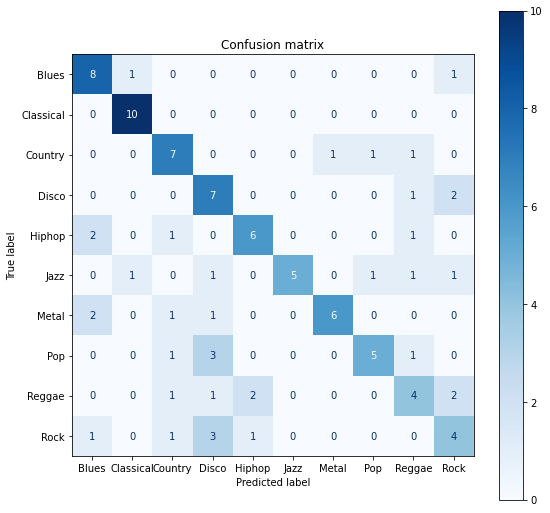

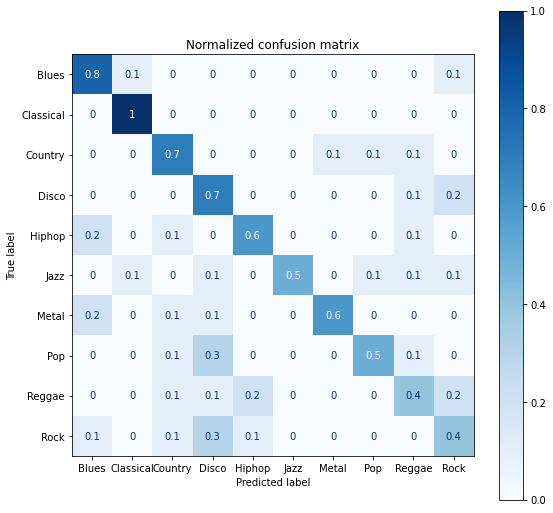

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.83      1.00      0.91        10
           2       0.58      0.70      0.64        10
           3       0.44      0.70      0.54        10
           4       0.67      0.60      0.63        10
           5       1.00      0.50      0.67        10
           6       0.86      0.60      0.71        10
           7       0.71      0.50      0.59        10
           8       0.44      0.40      0.42        10
           9       0.40      0.40      0.40        10

    accuracy                           0.62       100
   macro avg       0.66      0.62      0.62       100
weighted avg       0.66      0.62      0.62       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_pca, y_train)

y_pred = mlp.predict(x_test_pca)

print_results(mlp, x_test_pca, y_test, y_pred)

#### LDA

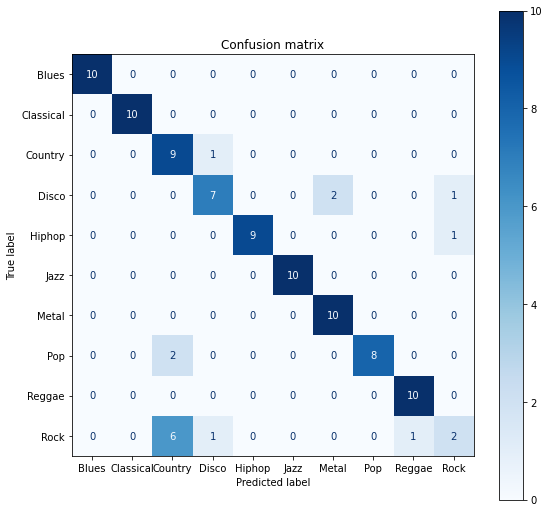

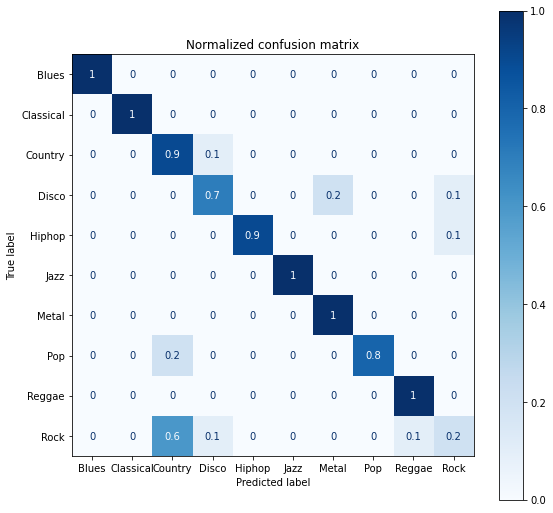

Accuracy score: 0.85 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       0.53      0.90      0.67        10
           3       0.78      0.70      0.74        10
           4       1.00      0.90      0.95        10
           5       1.00      1.00      1.00        10
           6       0.83      1.00      0.91        10
           7       1.00      0.80      0.89        10
           8       0.91      1.00      0.95        10
           9       0.50      0.20      0.29        10

    accuracy                           0.85       100
   macro avg       0.85      0.85      0.84       100
weighted avg       0.85      0.85      0.84       100



In [ ]:
mlp = _mlp.best_estimator_
mlp.fit(x_train_lda, y_train)

y_pred = mlp.predict(x_test_lda)

print_results(mlp, x_test_lda, y_test, y_pred)

## XGBoost
### All features

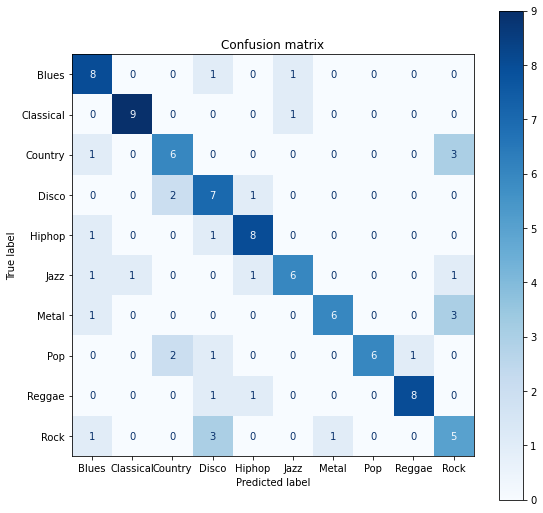

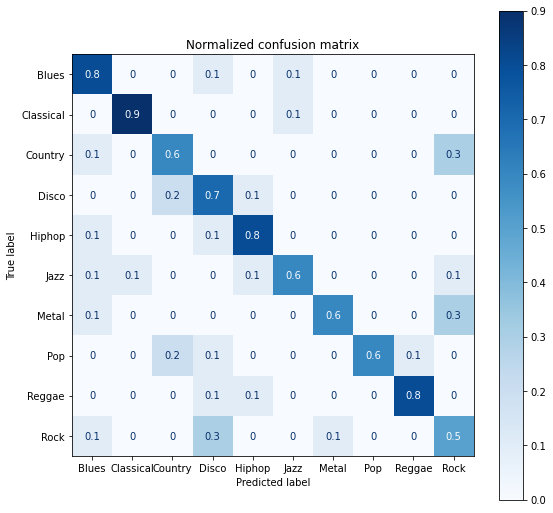

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.90      0.90      0.90        10
           2       0.60      0.60      0.60        10
           3       0.50      0.70      0.58        10
           4       0.73      0.80      0.76        10
           5       0.75      0.60      0.67        10
           6       0.86      0.60      0.71        10
           7       1.00      0.60      0.75        10
           8       0.89      0.80      0.84        10
           9       0.42      0.50      0.45        10

    accuracy                           0.69       100
   macro avg       0.73      0.69      0.70       100
weighted avg       0.73      0.69      0.70       100



In [ ]:
tree_method = ['auto', 'approx', 'exact', 'hist']
grid_parameters = [{'tree_method': tree_method}]

parameters = {'obective': 'multi:softmax', 'num_classes':10}

_xgb = GridSearchCV( XGBClassifier(use_label_encoder=False), grid_parameters)
_xgb.fit(x_train, y_train)

y_pred = _xgb.predict(x_test)

print_results(_xgb, x_test, y_test, y_pred)

In [ ]:
_xgb.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, tree_method='approx',
              use_label_encoder=False, verbosity=1)

### Without highly correlated features

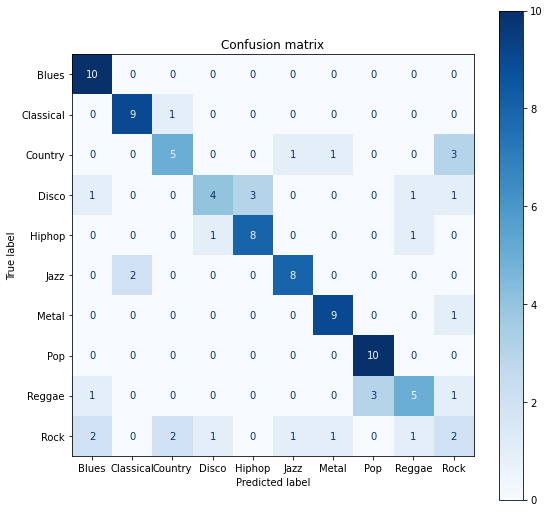

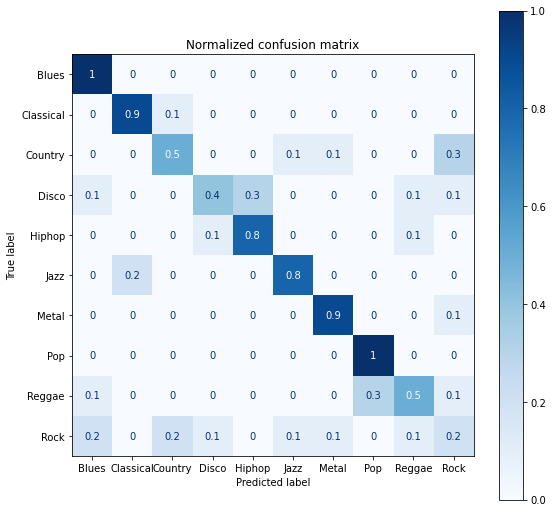

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        10
           1       0.82      0.90      0.86        10
           2       0.62      0.50      0.56        10
           3       0.67      0.40      0.50        10
           4       0.73      0.80      0.76        10
           5       0.80      0.80      0.80        10
           6       0.82      0.90      0.86        10
           7       0.77      1.00      0.87        10
           8       0.62      0.50      0.56        10
           9       0.25      0.20      0.22        10

    accuracy                           0.70       100
   macro avg       0.68      0.70      0.68       100
weighted avg       0.68      0.70      0.68       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_wcorr, y_train_wcorr)

y_pred = xgb.predict(x_test_wcorr)

print_results(xgb, x_test_wcorr, y_test_wcorr, y_pred)

### Without low - variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

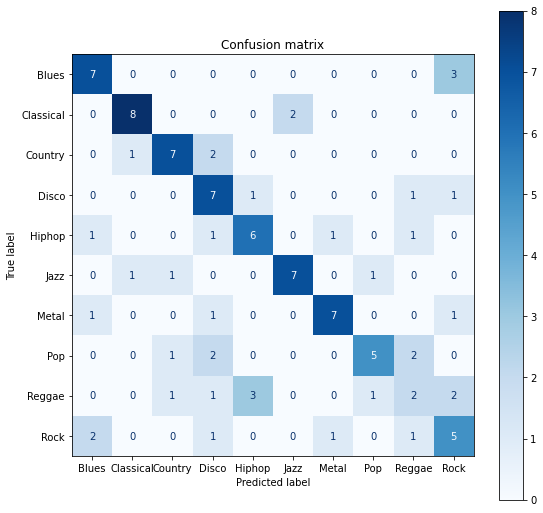

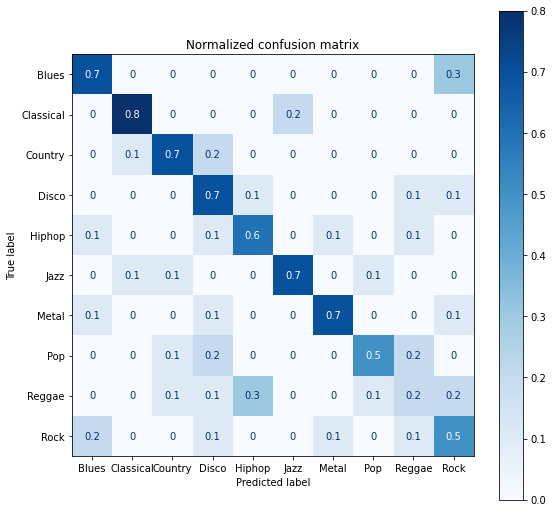

Accuracy score: 0.61 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.70      0.67        10
           1       0.80      0.80      0.80        10
           2       0.70      0.70      0.70        10
           3       0.47      0.70      0.56        10
           4       0.60      0.60      0.60        10
           5       0.78      0.70      0.74        10
           6       0.78      0.70      0.74        10
           7       0.71      0.50      0.59        10
           8       0.29      0.20      0.24        10
           9       0.42      0.50      0.45        10

    accuracy                           0.61       100
   macro avg       0.62      0.61      0.61       100
weighted avg       0.62      0.61      0.61       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_sel, y_train)

y_pred = xgb.predict(x_test_sel)

print_results(xgb, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

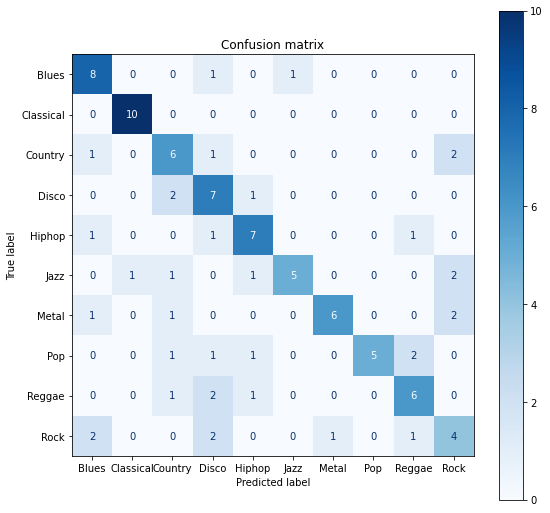

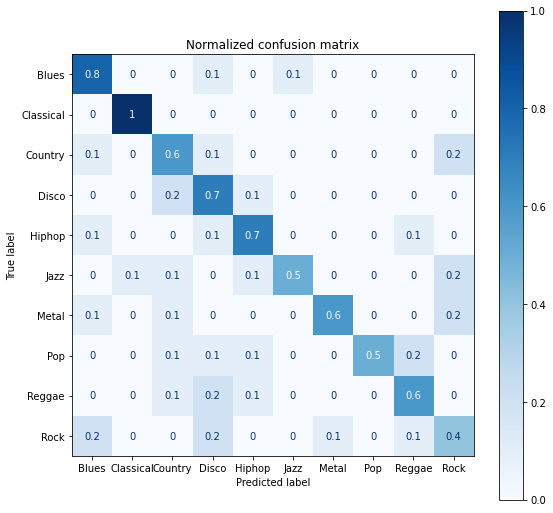

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.80      0.70        10
           1       0.91      1.00      0.95        10
           2       0.50      0.60      0.55        10
           3       0.47      0.70      0.56        10
           4       0.64      0.70      0.67        10
           5       0.83      0.50      0.62        10
           6       0.86      0.60      0.71        10
           7       1.00      0.50      0.67        10
           8       0.60      0.60      0.60        10
           9       0.40      0.40      0.40        10

    accuracy                           0.64       100
   macro avg       0.68      0.64      0.64       100
weighted avg       0.68      0.64      0.64       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

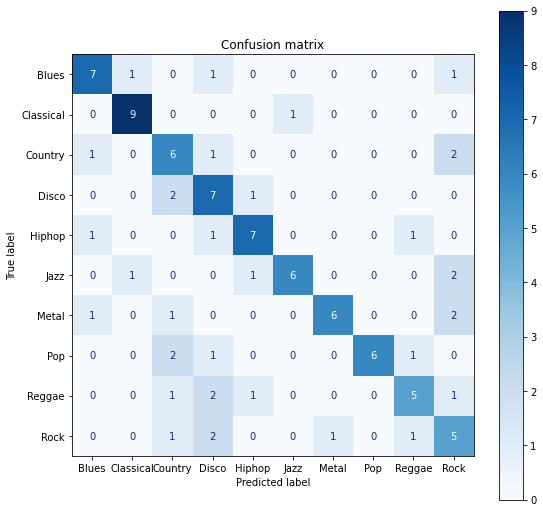

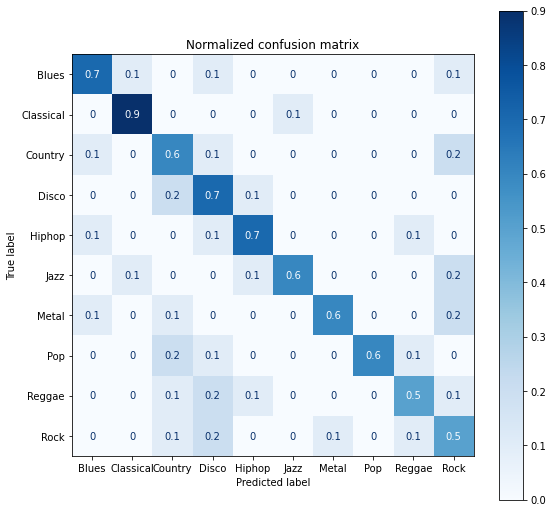

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.82      0.90      0.86        10
           2       0.46      0.60      0.52        10
           3       0.47      0.70      0.56        10
           4       0.70      0.70      0.70        10
           5       0.86      0.60      0.71        10
           6       0.86      0.60      0.71        10
           7       1.00      0.60      0.75        10
           8       0.62      0.50      0.56        10
           9       0.38      0.50      0.43        10

    accuracy                           0.64       100
   macro avg       0.69      0.64      0.65       100
weighted avg       0.69      0.64      0.65       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)


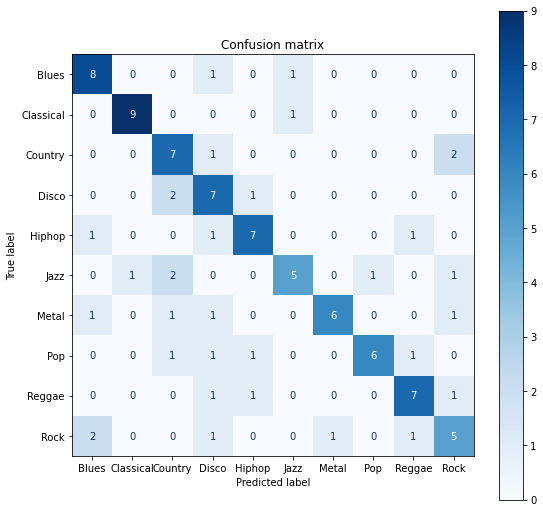

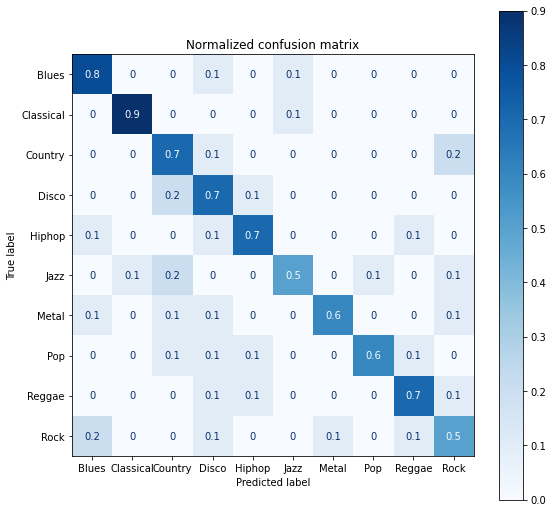

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.80      0.73        10
           1       0.90      0.90      0.90        10
           2       0.54      0.70      0.61        10
           3       0.50      0.70      0.58        10
           4       0.70      0.70      0.70        10
           5       0.71      0.50      0.59        10
           6       0.86      0.60      0.71        10
           7       0.86      0.60      0.71        10
           8       0.70      0.70      0.70        10
           9       0.50      0.50      0.50        10

    accuracy                           0.67       100
   macro avg       0.69      0.67      0.67       100
weighted avg       0.69      0.67      0.67       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

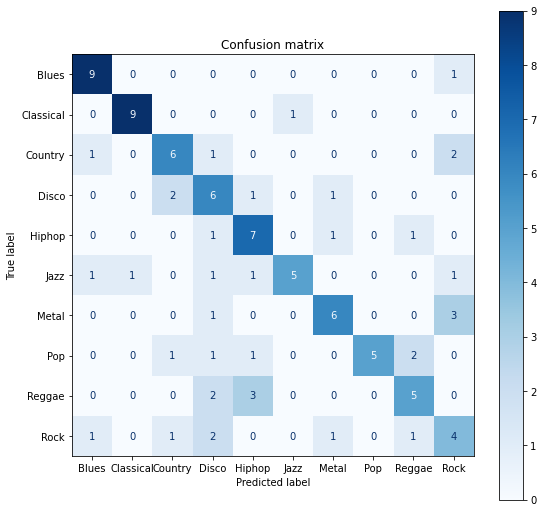

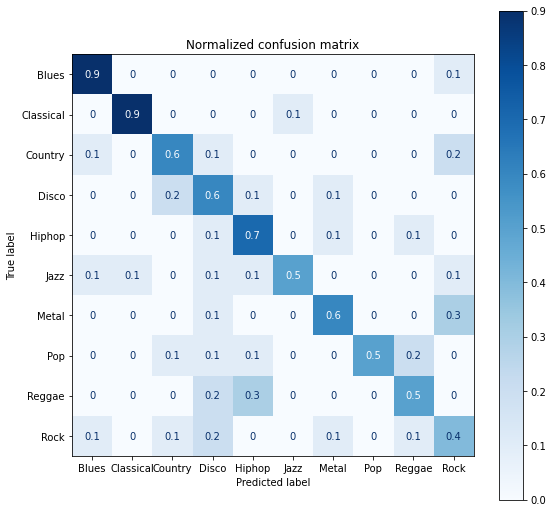

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       0.75      0.90      0.82        10
           1       0.90      0.90      0.90        10
           2       0.60      0.60      0.60        10
           3       0.40      0.60      0.48        10
           4       0.54      0.70      0.61        10
           5       0.83      0.50      0.62        10
           6       0.67      0.60      0.63        10
           7       1.00      0.50      0.67        10
           8       0.56      0.50      0.53        10
           9       0.36      0.40      0.38        10

    accuracy                           0.62       100
   macro avg       0.66      0.62      0.62       100
weighted avg       0.66      0.62      0.62       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

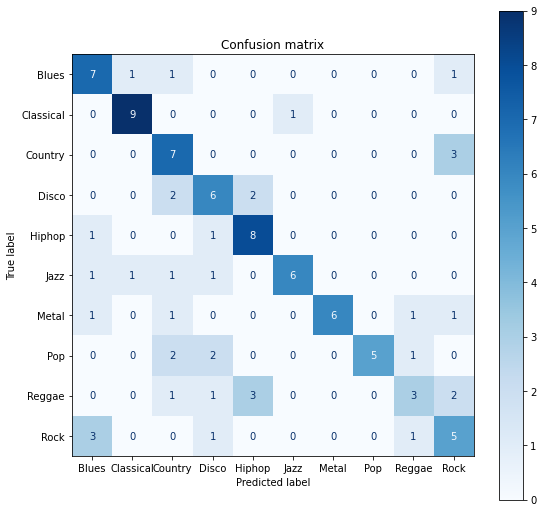

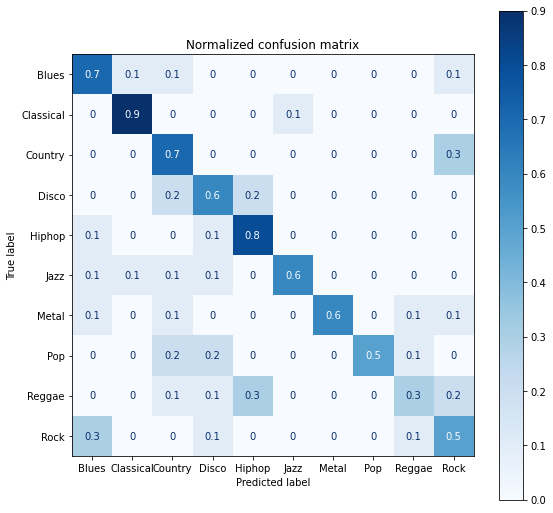

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       0.54      0.70      0.61        10
           1       0.82      0.90      0.86        10
           2       0.47      0.70      0.56        10
           3       0.50      0.60      0.55        10
           4       0.62      0.80      0.70        10
           5       0.86      0.60      0.71        10
           6       1.00      0.60      0.75        10
           7       1.00      0.50      0.67        10
           8       0.50      0.30      0.37        10
           9       0.42      0.50      0.45        10

    accuracy                           0.62       100
   macro avg       0.67      0.62      0.62       100
weighted avg       0.67      0.62      0.62       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

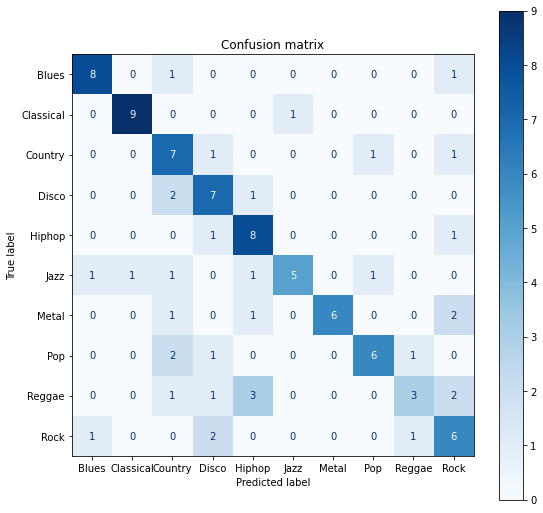

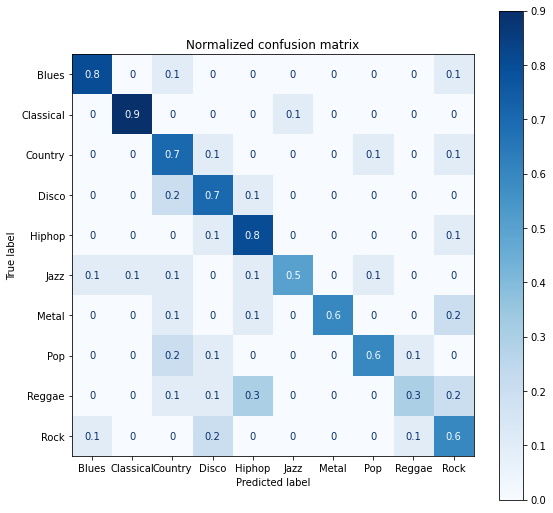

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.90      0.90      0.90        10
           2       0.47      0.70      0.56        10
           3       0.54      0.70      0.61        10
           4       0.57      0.80      0.67        10
           5       0.83      0.50      0.62        10
           6       1.00      0.60      0.75        10
           7       0.75      0.60      0.67        10
           8       0.60      0.30      0.40        10
           9       0.46      0.60      0.52        10

    accuracy                           0.65       100
   macro avg       0.69      0.65      0.65       100
weighted avg       0.69      0.65      0.65       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

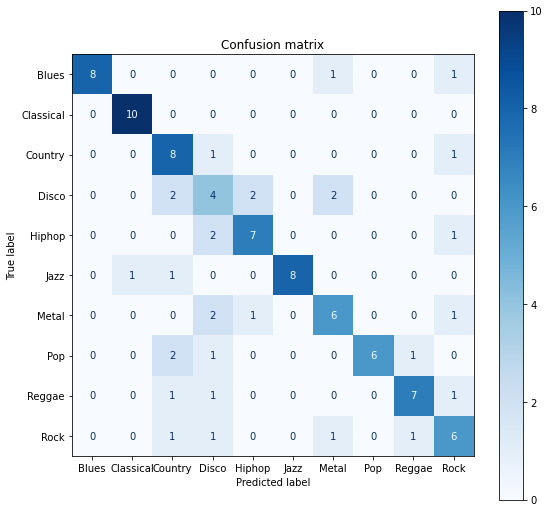

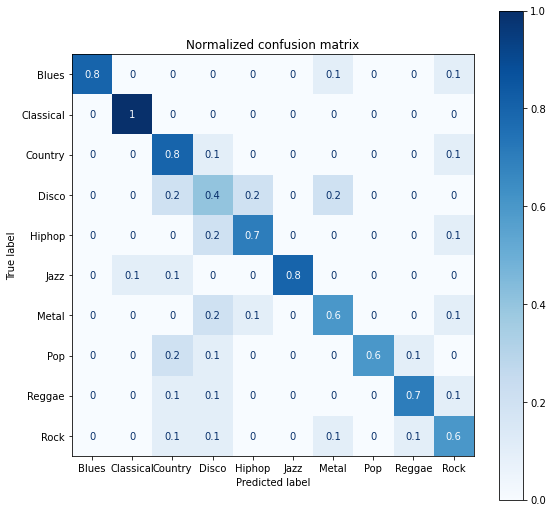

Accuracy score: 0.7 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.91      1.00      0.95        10
           2       0.53      0.80      0.64        10
           3       0.33      0.40      0.36        10
           4       0.70      0.70      0.70        10
           5       1.00      0.80      0.89        10
           6       0.60      0.60      0.60        10
           7       1.00      0.60      0.75        10
           8       0.78      0.70      0.74        10
           9       0.55      0.60      0.57        10

    accuracy                           0.70       100
   macro avg       0.74      0.70      0.71       100
weighted avg       0.74      0.70      0.71       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

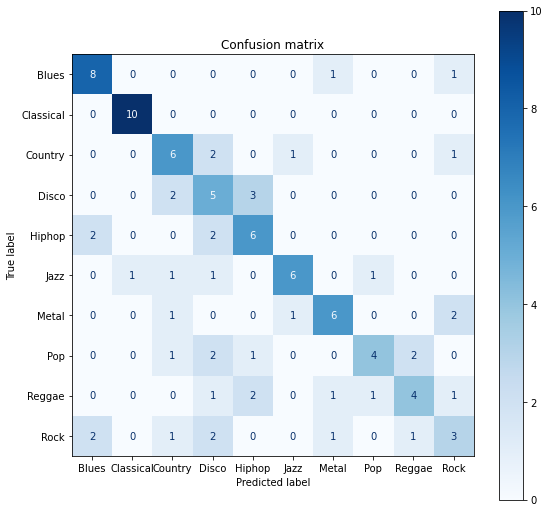

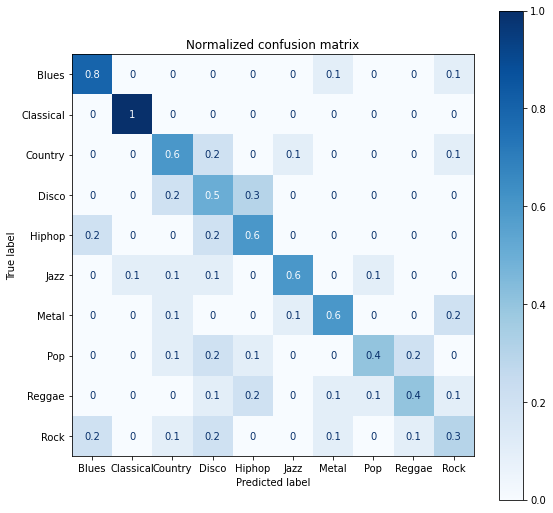

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.80      0.73        10
           1       0.91      1.00      0.95        10
           2       0.50      0.60      0.55        10
           3       0.33      0.50      0.40        10
           4       0.50      0.60      0.55        10
           5       0.75      0.60      0.67        10
           6       0.67      0.60      0.63        10
           7       0.67      0.40      0.50        10
           8       0.57      0.40      0.47        10
           9       0.38      0.30      0.33        10

    accuracy                           0.58       100
   macro avg       0.59      0.58      0.58       100
weighted avg       0.59      0.58      0.58       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

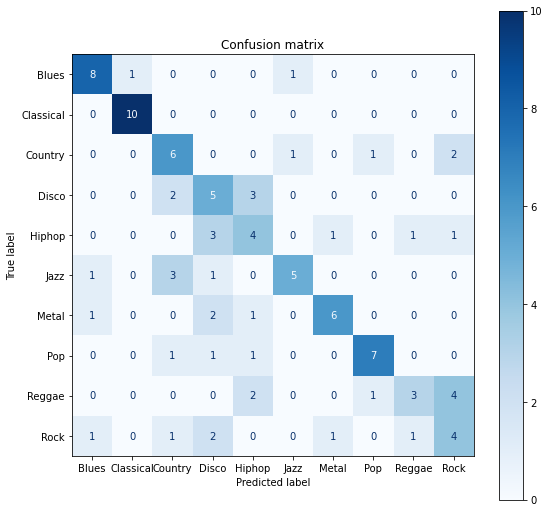

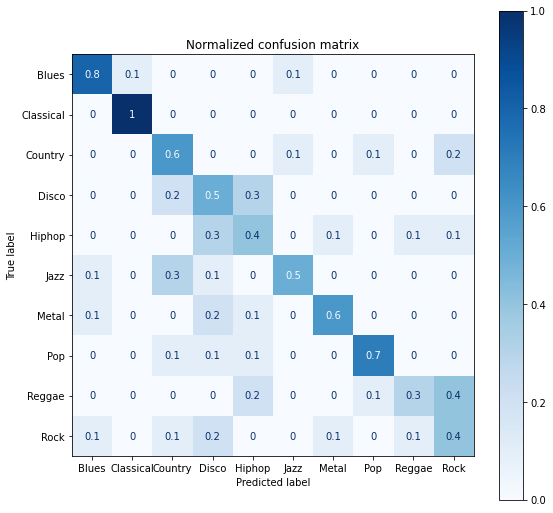

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.80      0.76        10
           1       0.91      1.00      0.95        10
           2       0.46      0.60      0.52        10
           3       0.36      0.50      0.42        10
           4       0.36      0.40      0.38        10
           5       0.71      0.50      0.59        10
           6       0.75      0.60      0.67        10
           7       0.78      0.70      0.74        10
           8       0.60      0.30      0.40        10
           9       0.36      0.40      0.38        10

    accuracy                           0.58       100
   macro avg       0.60      0.58      0.58       100
weighted avg       0.60      0.58      0.58       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

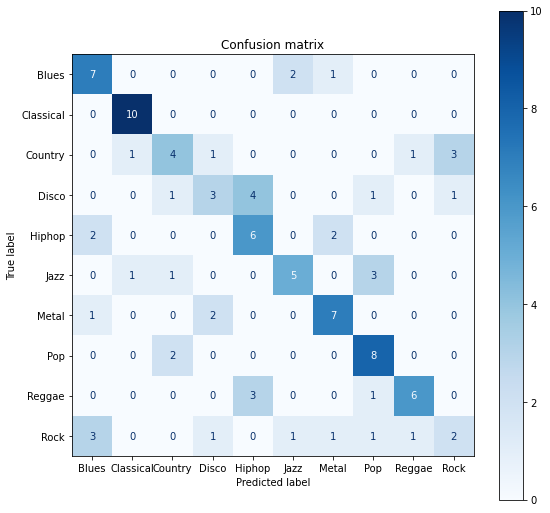

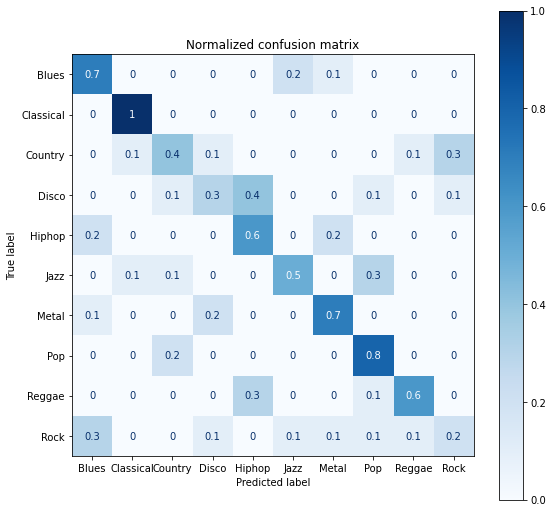

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.54      0.70      0.61        10
           1       0.83      1.00      0.91        10
           2       0.50      0.40      0.44        10
           3       0.43      0.30      0.35        10
           4       0.46      0.60      0.52        10
           5       0.62      0.50      0.56        10
           6       0.64      0.70      0.67        10
           7       0.57      0.80      0.67        10
           8       0.75      0.60      0.67        10
           9       0.33      0.20      0.25        10

    accuracy                           0.58       100
   macro avg       0.57      0.58      0.56       100
weighted avg       0.57      0.58      0.56       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_ksel, y_train)

y_pred = xgb.predict(x_test_ksel)

print_results(xgb, x_test_ksel, y_test, y_pred)

### Recursive Feature Elimination (RFE)
**n_features_to_select = 50**

In [ ]:
rfe = RFE(estimator = _xgb.best_estimator_, n_features_to_select = 50)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

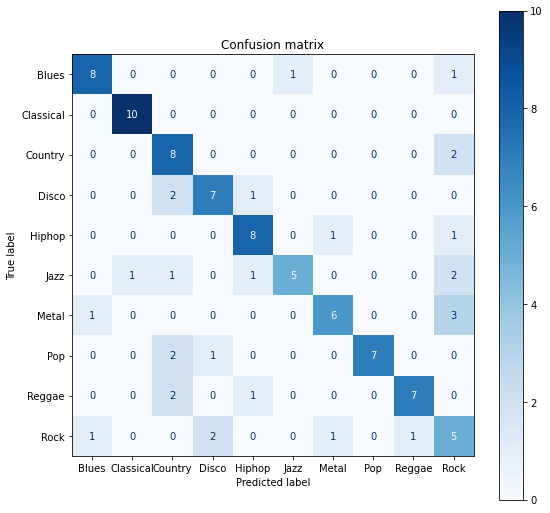

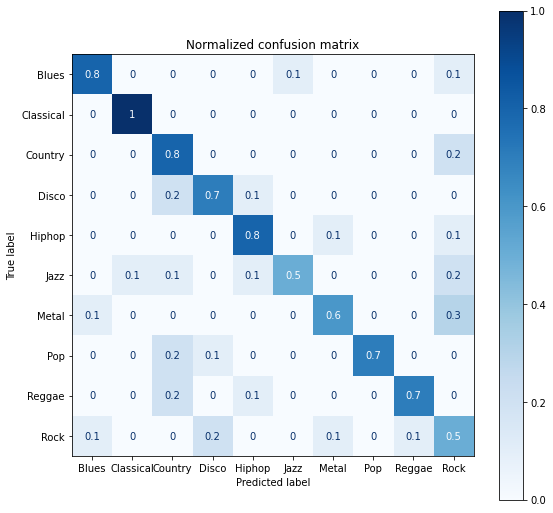

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.91      1.00      0.95        10
           2       0.53      0.80      0.64        10
           3       0.70      0.70      0.70        10
           4       0.73      0.80      0.76        10
           5       0.83      0.50      0.62        10
           6       0.75      0.60      0.67        10
           7       1.00      0.70      0.82        10
           8       0.88      0.70      0.78        10
           9       0.36      0.50      0.42        10

    accuracy                           0.71       100
   macro avg       0.75      0.71      0.72       100
weighted avg       0.75      0.71      0.72       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_rfe, y_train)

y_pred = xgb.predict(x_test_rfe)

print_results(xgb, x_test_rfe, y_test, y_pred)

**n_features_to_select = 40**

In [ ]:
rfe = RFE(estimator = _xgb.best_estimator_, n_features_to_select = 40)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)


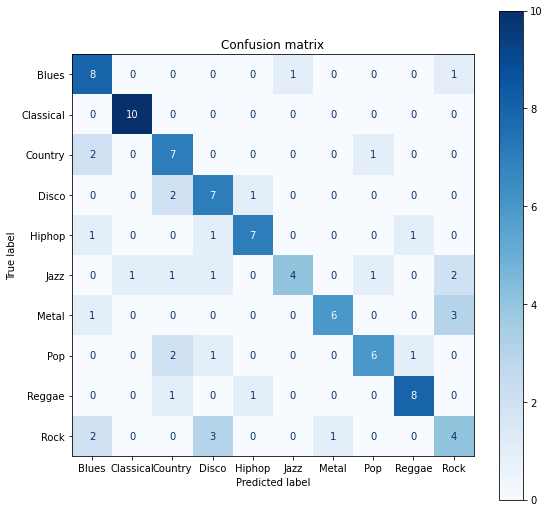

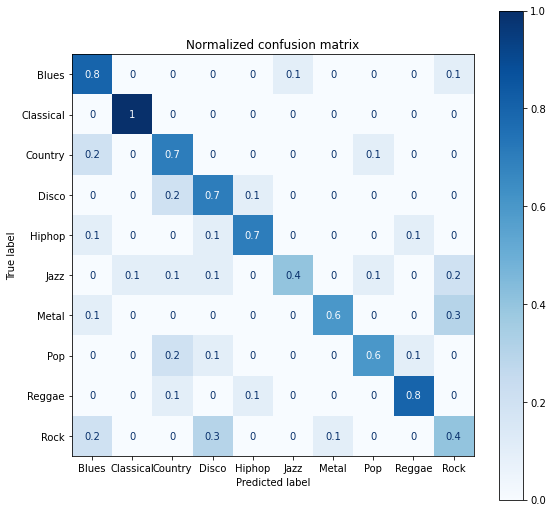

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.91      1.00      0.95        10
           2       0.54      0.70      0.61        10
           3       0.54      0.70      0.61        10
           4       0.78      0.70      0.74        10
           5       0.80      0.40      0.53        10
           6       0.86      0.60      0.71        10
           7       0.75      0.60      0.67        10
           8       0.80      0.80      0.80        10
           9       0.40      0.40      0.40        10

    accuracy                           0.67       100
   macro avg       0.69      0.67      0.67       100
weighted avg       0.69      0.67      0.67       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_rfe, y_train)

y_pred = xgb.predict(x_test_rfe)

print_results(xgb, x_test_rfe, y_test, y_pred)

**n_features_to_select = 30**

In [ ]:
rfe = RFE(estimator = _xgb.best_estimator_, n_features_to_select = 30)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

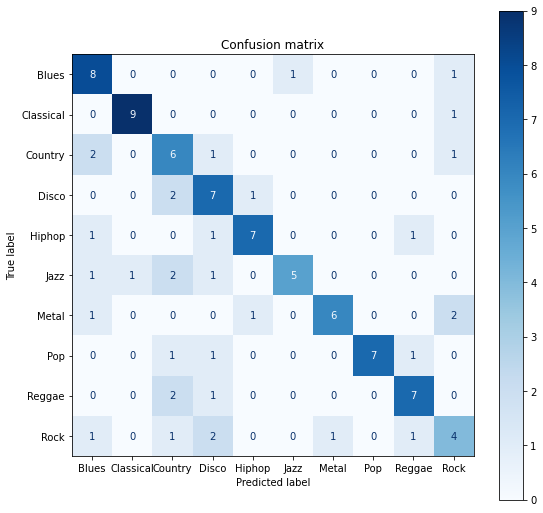

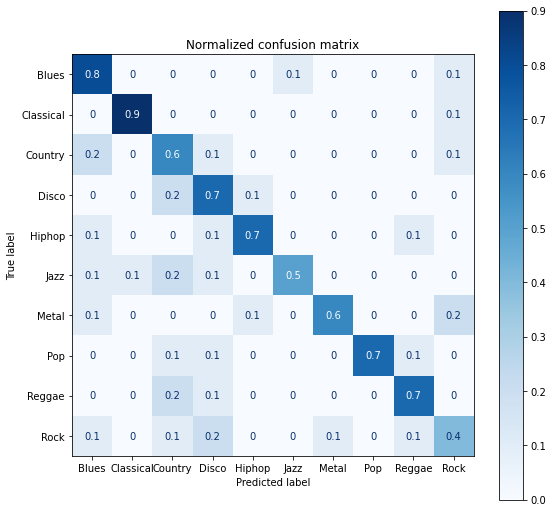

Accuracy score: 0.66 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.90      0.90      0.90        10
           2       0.43      0.60      0.50        10
           3       0.50      0.70      0.58        10
           4       0.78      0.70      0.74        10
           5       0.83      0.50      0.62        10
           6       0.86      0.60      0.71        10
           7       1.00      0.70      0.82        10
           8       0.70      0.70      0.70        10
           9       0.44      0.40      0.42        10

    accuracy                           0.66       100
   macro avg       0.70      0.66      0.67       100
weighted avg       0.70      0.66      0.67       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_rfe, y_train)

y_pred = xgb.predict(x_test_rfe)

print_results(xgb, x_test_rfe, y_test, y_pred)

**n_features_to_select = 20**

In [ ]:
rfe = RFE(estimator = _xgb.best_estimator_, n_features_to_select = 20)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

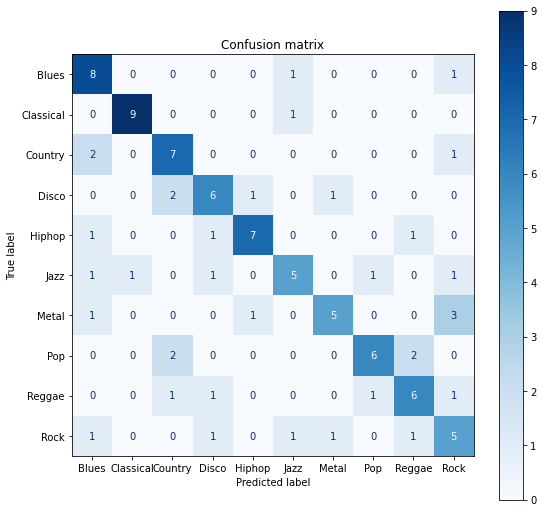

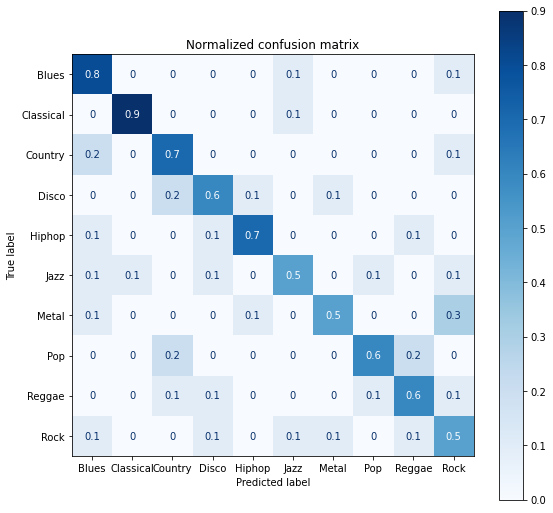

Accuracy score: 0.64 

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        10
           1       0.90      0.90      0.90        10
           2       0.58      0.70      0.64        10
           3       0.60      0.60      0.60        10
           4       0.78      0.70      0.74        10
           5       0.62      0.50      0.56        10
           6       0.71      0.50      0.59        10
           7       0.75      0.60      0.67        10
           8       0.60      0.60      0.60        10
           9       0.42      0.50      0.45        10

    accuracy                           0.64       100
   macro avg       0.65      0.64      0.64       100
weighted avg       0.65      0.64      0.64       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_rfe, y_train)

y_pred = xgb.predict(x_test_rfe)

print_results(xgb, x_test_rfe, y_test, y_pred)

**n_features_to_select = 10**

In [ ]:
rfe = RFE(estimator = _xgb.best_estimator_, n_features_to_select = 10)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

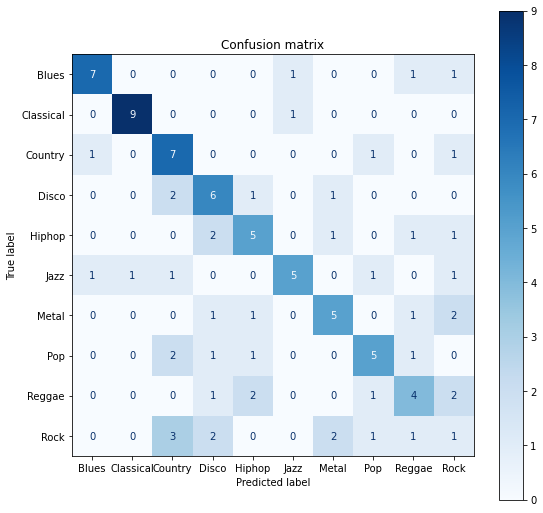

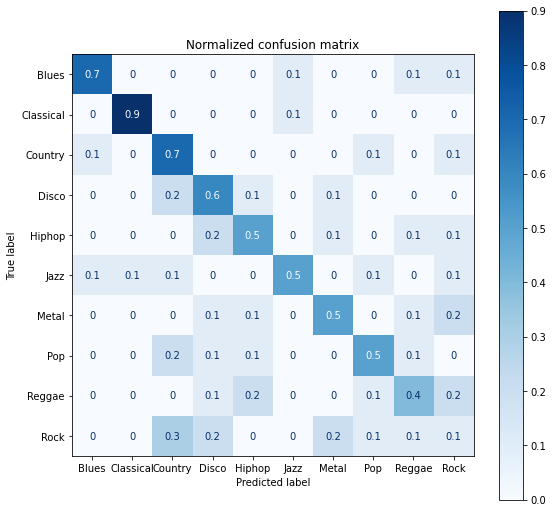

Accuracy score: 0.54 

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.70      0.74        10
           1       0.90      0.90      0.90        10
           2       0.47      0.70      0.56        10
           3       0.46      0.60      0.52        10
           4       0.50      0.50      0.50        10
           5       0.71      0.50      0.59        10
           6       0.56      0.50      0.53        10
           7       0.56      0.50      0.53        10
           8       0.44      0.40      0.42        10
           9       0.11      0.10      0.11        10

    accuracy                           0.54       100
   macro avg       0.55      0.54      0.54       100
weighted avg       0.55      0.54      0.54       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_rfe, y_train)

y_pred = xgb.predict(x_test_rfe)

print_results(xgb, x_test_rfe, y_test, y_pred)

### Select features based on importance weights

In [ ]:
selector = SelectFromModel(estimator = _xgb.best_estimator_)
selector.fit(x_train, y_train)
selector.fit(x_test, y_test)

x_train_sfm = selector.transform(x_train)
x_test_sfm = selector.transform(x_test)

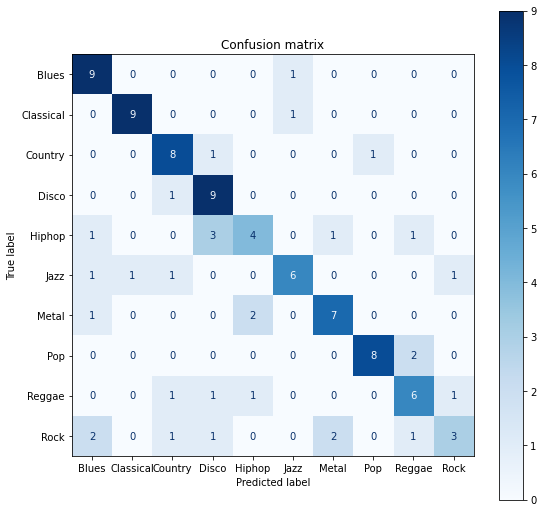

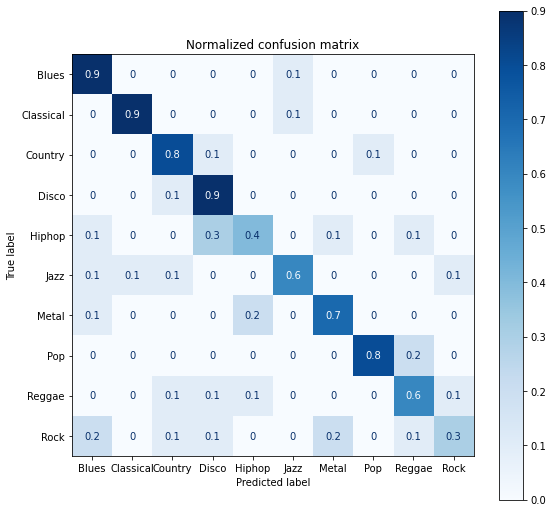

Accuracy score: 0.69 

Classification Report
              precision    recall  f1-score   support

           0       0.64      0.90      0.75        10
           1       0.90      0.90      0.90        10
           2       0.67      0.80      0.73        10
           3       0.60      0.90      0.72        10
           4       0.57      0.40      0.47        10
           5       0.75      0.60      0.67        10
           6       0.70      0.70      0.70        10
           7       0.89      0.80      0.84        10
           8       0.60      0.60      0.60        10
           9       0.60      0.30      0.40        10

    accuracy                           0.69       100
   macro avg       0.69      0.69      0.68       100
weighted avg       0.69      0.69      0.68       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_sfm, y_train)

y_pred = xgb.predict(x_test_sfm)

print_results(xgb, x_test_sfm, y_test, y_pred)

### PCA

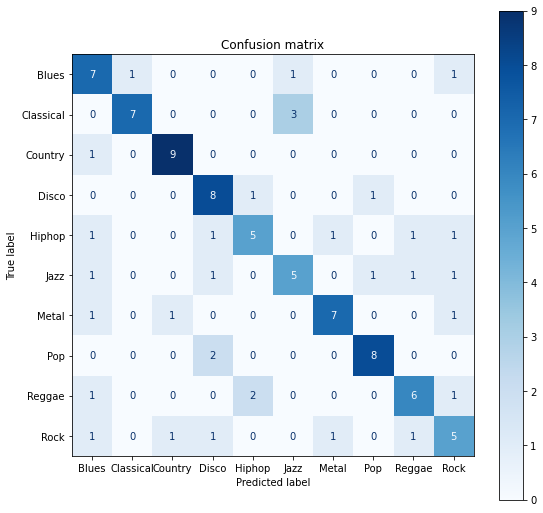

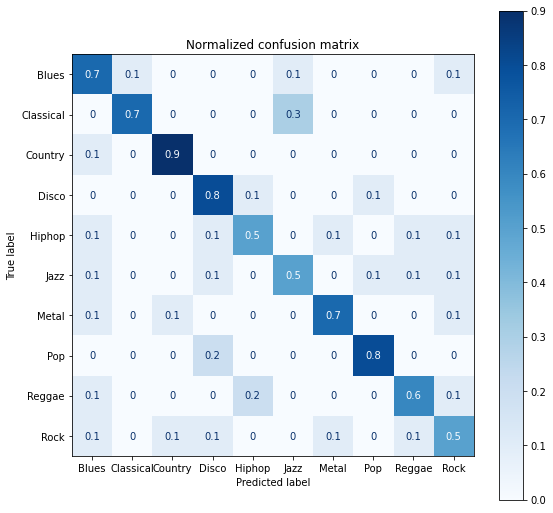

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.54      0.70      0.61        10
           1       0.88      0.70      0.78        10
           2       0.82      0.90      0.86        10
           3       0.62      0.80      0.70        10
           4       0.62      0.50      0.56        10
           5       0.56      0.50      0.53        10
           6       0.78      0.70      0.74        10
           7       0.80      0.80      0.80        10
           8       0.67      0.60      0.63        10
           9       0.50      0.50      0.50        10

    accuracy                           0.67       100
   macro avg       0.68      0.67      0.67       100
weighted avg       0.68      0.67      0.67       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_pca, y_train)

y_pred = xgb.predict(x_test_pca)

print_results(xgb, x_test_pca, y_test, y_pred)

### LDA

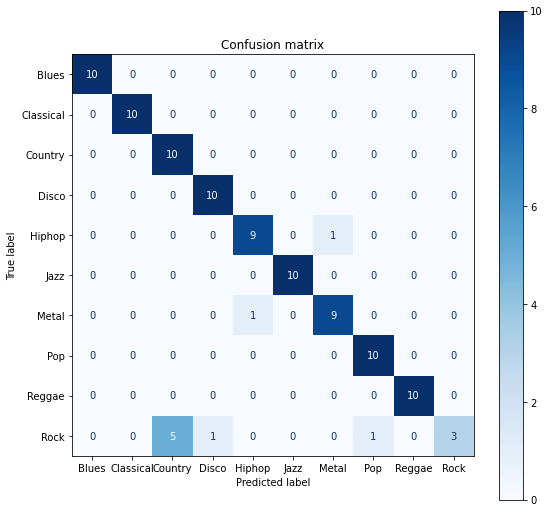

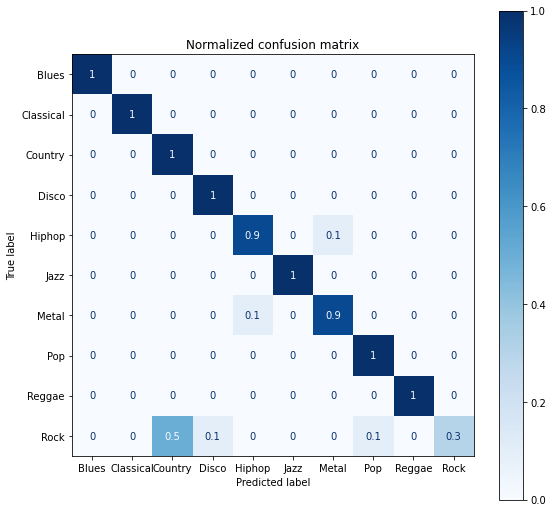

Accuracy score: 0.91 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       0.67      1.00      0.80        10
           3       0.91      1.00      0.95        10
           4       0.90      0.90      0.90        10
           5       1.00      1.00      1.00        10
           6       0.90      0.90      0.90        10
           7       0.91      1.00      0.95        10
           8       1.00      1.00      1.00        10
           9       1.00      0.30      0.46        10

    accuracy                           0.91       100
   macro avg       0.93      0.91      0.90       100
weighted avg       0.93      0.91      0.90       100



In [ ]:
xgb = _xgb.best_estimator_
xgb.fit(x_train_lda, y_train)

y_pred = xgb.predict(x_test_lda)

print_results(xgb, x_test_lda, y_test, y_pred)

## Linear Discriminant Analysis (LDA)
### All features

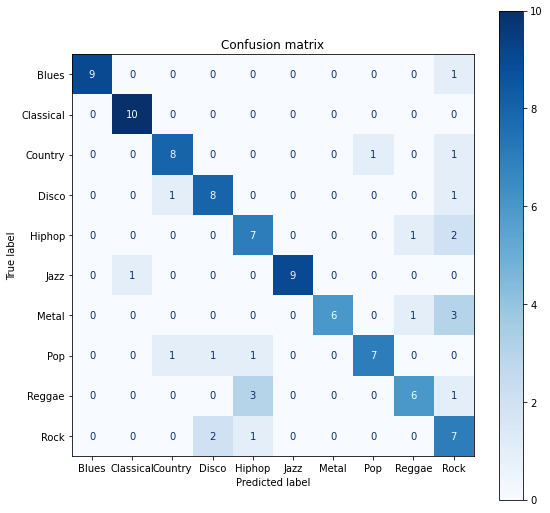

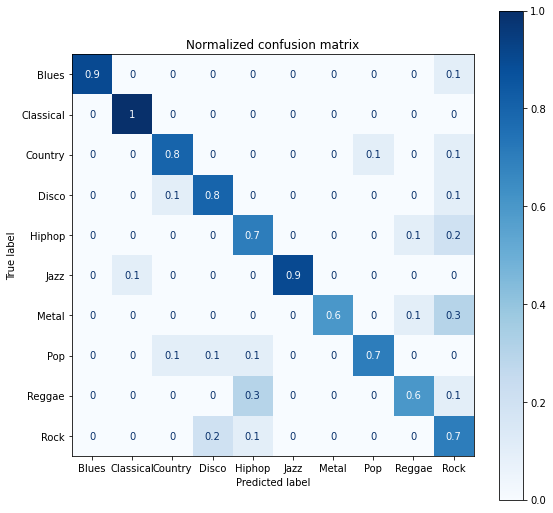

Accuracy score: 0.77 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.73      0.80      0.76        10
           4       0.58      0.70      0.64        10
           5       1.00      0.90      0.95        10
           6       1.00      0.60      0.75        10
           7       0.88      0.70      0.78        10
           8       0.75      0.60      0.67        10
           9       0.44      0.70      0.54        10

    accuracy                           0.77       100
   macro avg       0.81      0.77      0.78       100
weighted avg       0.81      0.77      0.78       100



In [ ]:
solver = ['svd', 'lsqr', 'eigen']
parameters = {'solver': solver}

_lda = GridSearchCV(LinearDiscriminantAnalysis(), parameters)
_lda.fit(x_train, y_train)

y_pred = _lda.predict(x_test)

print_results(_lda, x_test, y_test, y_pred)

In [ ]:
_lda.best_estimator_

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

### Without highly correlated features

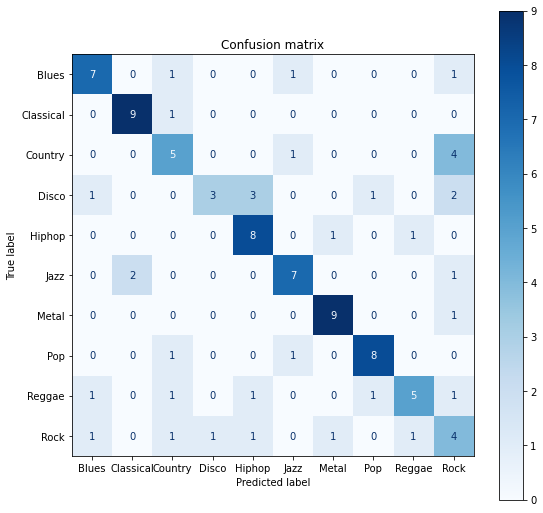

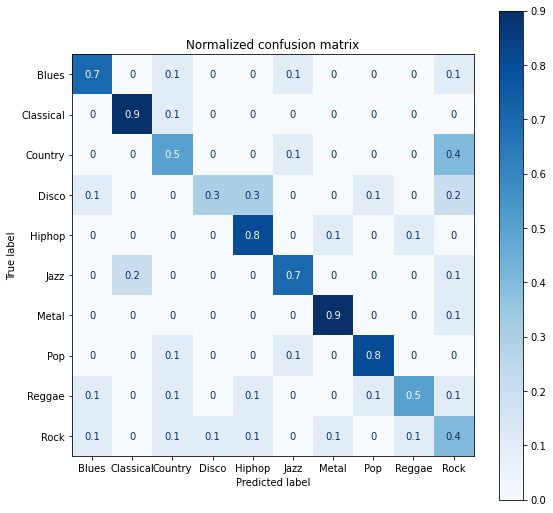

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.70      0.70        10
           1       0.82      0.90      0.86        10
           2       0.50      0.50      0.50        10
           3       0.75      0.30      0.43        10
           4       0.62      0.80      0.70        10
           5       0.70      0.70      0.70        10
           6       0.82      0.90      0.86        10
           7       0.80      0.80      0.80        10
           8       0.71      0.50      0.59        10
           9       0.29      0.40      0.33        10

    accuracy                           0.65       100
   macro avg       0.67      0.65      0.65       100
weighted avg       0.67      0.65      0.65       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_wcorr, y_train_wcorr)

y_pred = lda.predict(x_test_wcorr)

print_results(lda, x_test_wcorr, y_test_wcorr, y_pred)

### Without low-variance features

In [ ]:
feat_sel = VarianceThreshold(threshold = 1)
feat_sel.fit(x_train)
feat_sel.fit(x_test)

x_train_sel = feat_sel.transform(x_train)
x_test_sel = feat_sel.transform(x_test)

In [ ]:
x_train.shape

(899, 65)

In [ ]:
x_train_sel.shape

(899, 21)

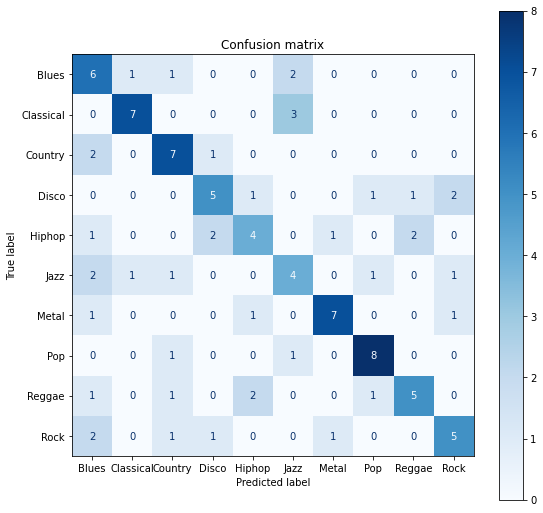

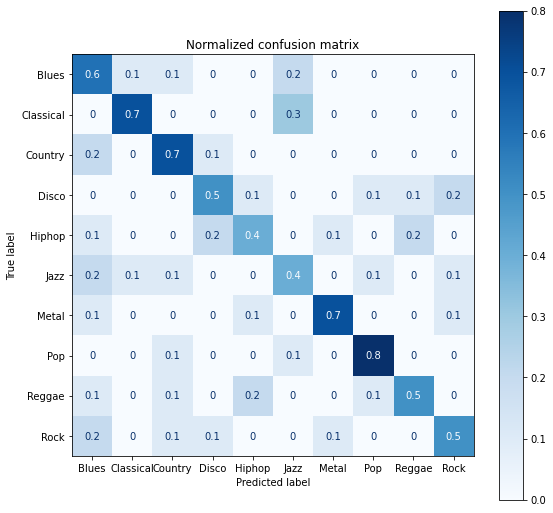

Accuracy score: 0.58 

Classification Report
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        10
           1       0.78      0.70      0.74        10
           2       0.58      0.70      0.64        10
           3       0.56      0.50      0.53        10
           4       0.50      0.40      0.44        10
           5       0.40      0.40      0.40        10
           6       0.78      0.70      0.74        10
           7       0.73      0.80      0.76        10
           8       0.62      0.50      0.56        10
           9       0.56      0.50      0.53        10

    accuracy                           0.58       100
   macro avg       0.59      0.58      0.58       100
weighted avg       0.59      0.58      0.58       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_sel, y_train)

y_pred = lda.predict(x_test_sel)

print_results(lda, x_test_sel, y_test, y_pred)

### K features with highest scores
**k = 50**

In [ ]:
k_sel = SelectKBest(k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

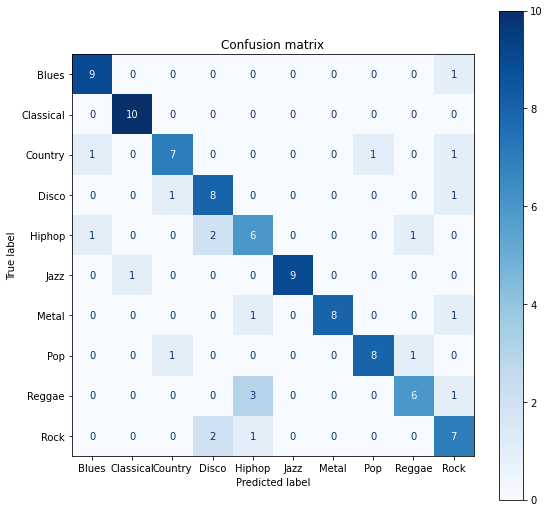

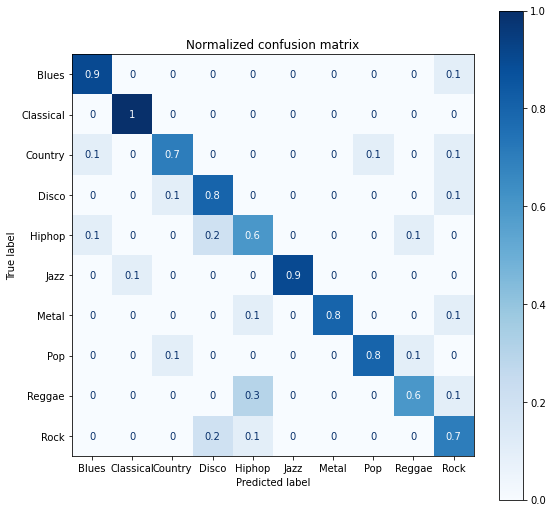

Accuracy score: 0.78 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.78      0.70      0.74        10
           3       0.67      0.80      0.73        10
           4       0.55      0.60      0.57        10
           5       1.00      0.90      0.95        10
           6       1.00      0.80      0.89        10
           7       0.89      0.80      0.84        10
           8       0.75      0.60      0.67        10
           9       0.58      0.70      0.64        10

    accuracy                           0.78       100
   macro avg       0.79      0.78      0.78       100
weighted avg       0.79      0.78      0.78       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 50)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

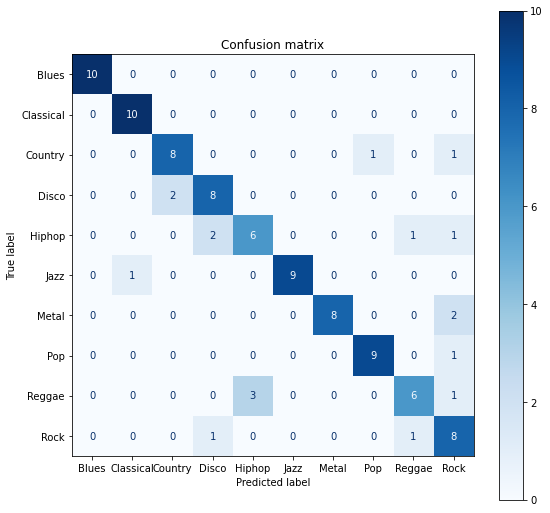

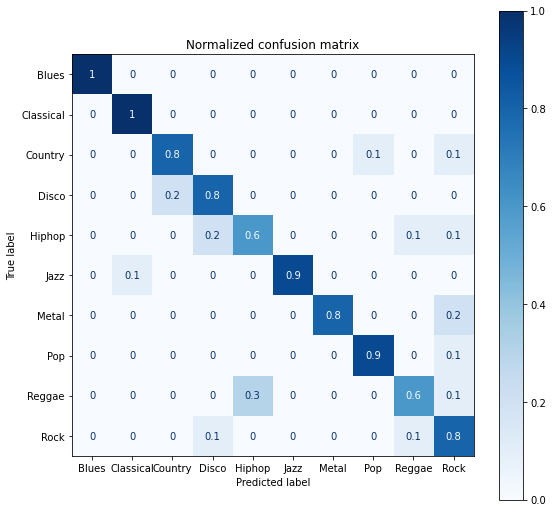

Accuracy score: 0.82 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.73      0.80      0.76        10
           4       0.67      0.60      0.63        10
           5       1.00      0.90      0.95        10
           6       1.00      0.80      0.89        10
           7       0.90      0.90      0.90        10
           8       0.75      0.60      0.67        10
           9       0.57      0.80      0.67        10

    accuracy                           0.82       100
   macro avg       0.83      0.82      0.82       100
weighted avg       0.83      0.82      0.82       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

**k = 40**

In [ ]:
k_sel = SelectKBest(k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

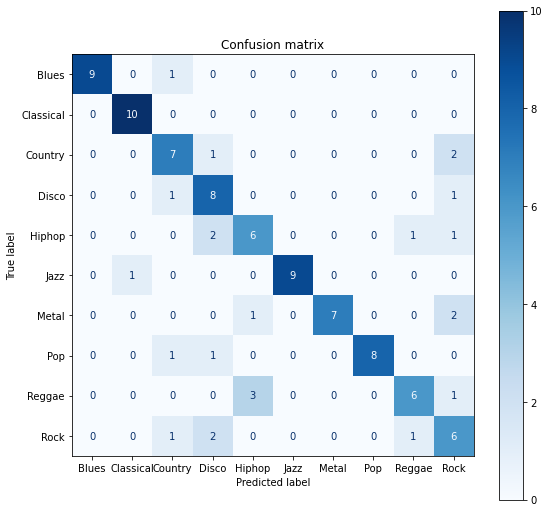

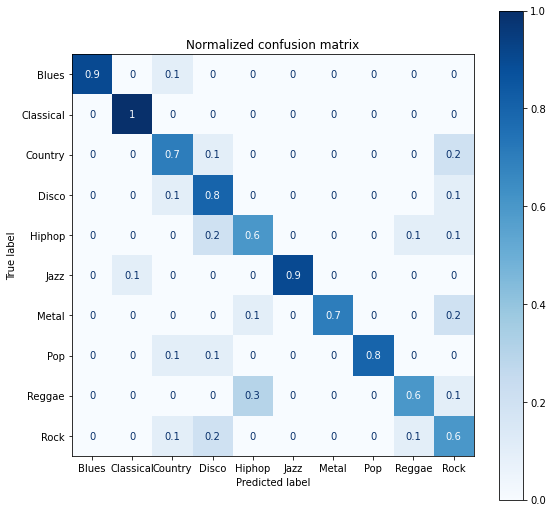

Accuracy score: 0.76 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       0.91      1.00      0.95        10
           2       0.64      0.70      0.67        10
           3       0.57      0.80      0.67        10
           4       0.60      0.60      0.60        10
           5       1.00      0.90      0.95        10
           6       1.00      0.70      0.82        10
           7       1.00      0.80      0.89        10
           8       0.75      0.60      0.67        10
           9       0.46      0.60      0.52        10

    accuracy                           0.76       100
   macro avg       0.79      0.76      0.77       100
weighted avg       0.79      0.76      0.77       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 40)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

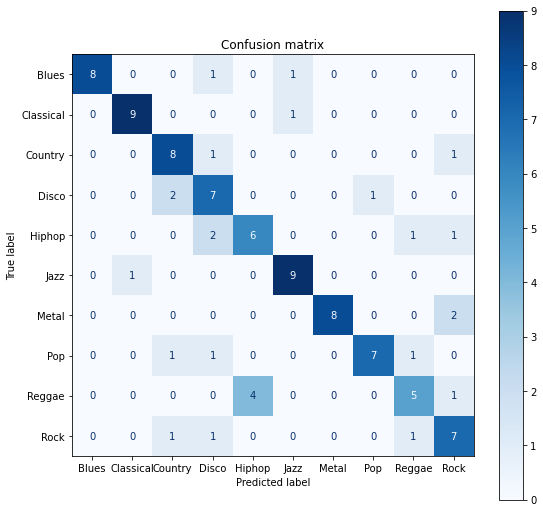

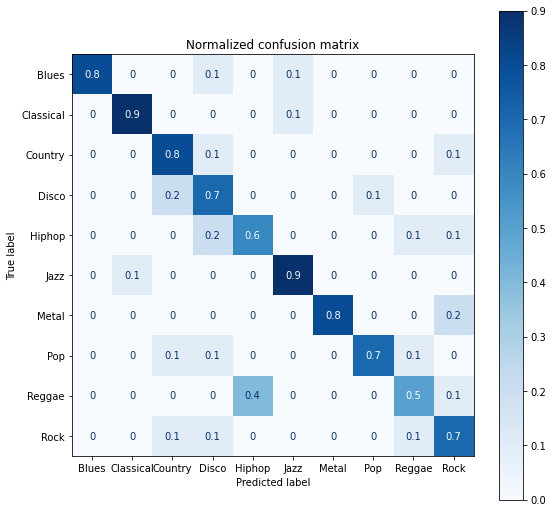

Accuracy score: 0.74 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.90      0.90      0.90        10
           2       0.67      0.80      0.73        10
           3       0.54      0.70      0.61        10
           4       0.60      0.60      0.60        10
           5       0.82      0.90      0.86        10
           6       1.00      0.80      0.89        10
           7       0.88      0.70      0.78        10
           8       0.62      0.50      0.56        10
           9       0.58      0.70      0.64        10

    accuracy                           0.74       100
   macro avg       0.76      0.74      0.74       100
weighted avg       0.76      0.74      0.74       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

**k = 30**

In [ ]:
k_sel = SelectKBest(k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)


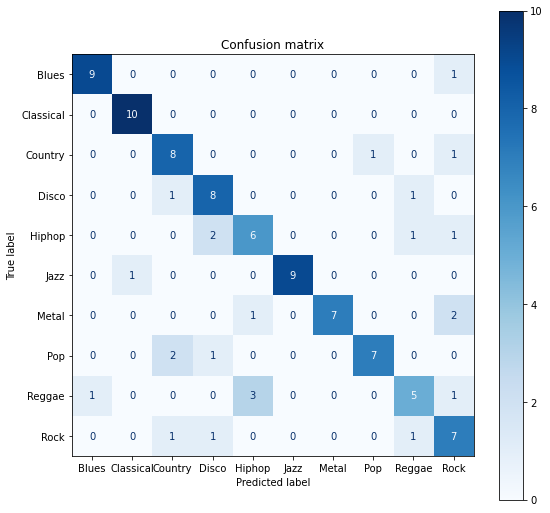

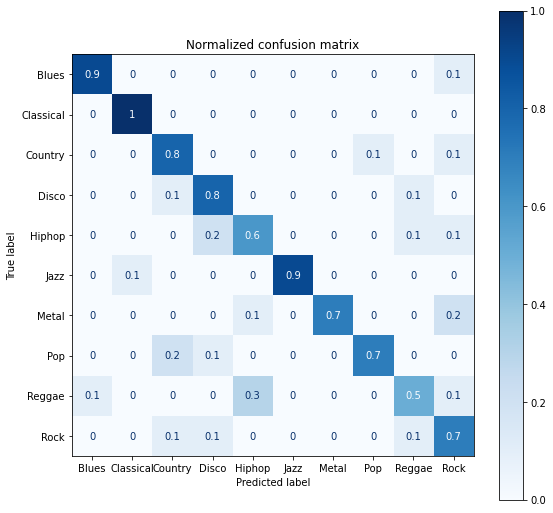

Accuracy score: 0.76 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.91      1.00      0.95        10
           2       0.67      0.80      0.73        10
           3       0.67      0.80      0.73        10
           4       0.60      0.60      0.60        10
           5       1.00      0.90      0.95        10
           6       1.00      0.70      0.82        10
           7       0.88      0.70      0.78        10
           8       0.62      0.50      0.56        10
           9       0.54      0.70      0.61        10

    accuracy                           0.76       100
   macro avg       0.78      0.76      0.76       100
weighted avg       0.78      0.76      0.76       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 30)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

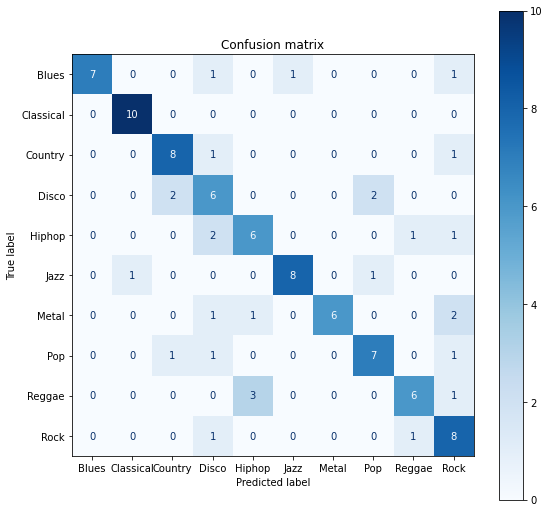

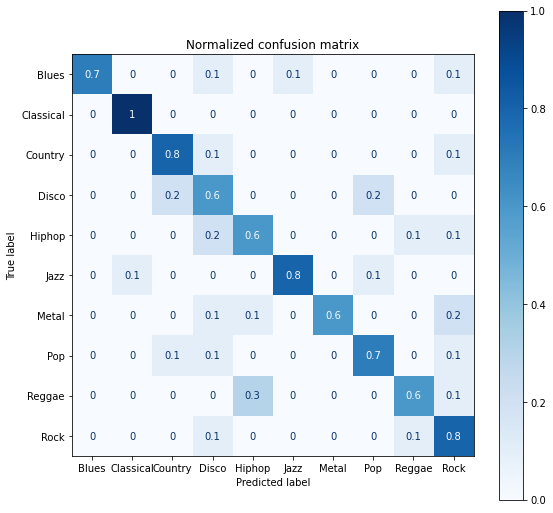

Accuracy score: 0.72 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.70      0.82        10
           1       0.91      1.00      0.95        10
           2       0.73      0.80      0.76        10
           3       0.46      0.60      0.52        10
           4       0.60      0.60      0.60        10
           5       0.89      0.80      0.84        10
           6       1.00      0.60      0.75        10
           7       0.70      0.70      0.70        10
           8       0.75      0.60      0.67        10
           9       0.53      0.80      0.64        10

    accuracy                           0.72       100
   macro avg       0.76      0.72      0.73       100
weighted avg       0.76      0.72      0.73       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

**k = 20**

In [ ]:
k_sel = SelectKBest(k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

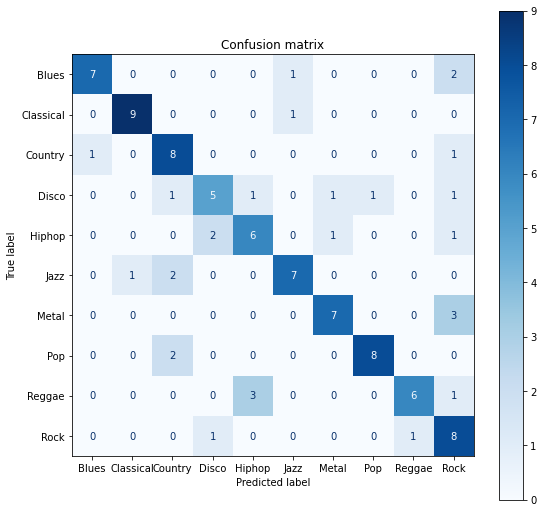

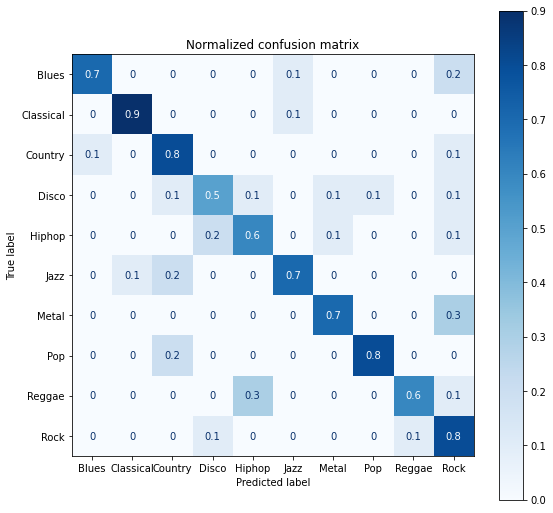

Accuracy score: 0.71 

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        10
           1       0.90      0.90      0.90        10
           2       0.62      0.80      0.70        10
           3       0.62      0.50      0.56        10
           4       0.60      0.60      0.60        10
           5       0.78      0.70      0.74        10
           6       0.78      0.70      0.74        10
           7       0.89      0.80      0.84        10
           8       0.86      0.60      0.71        10
           9       0.47      0.80      0.59        10

    accuracy                           0.71       100
   macro avg       0.74      0.71      0.71       100
weighted avg       0.74      0.71      0.71       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 20)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

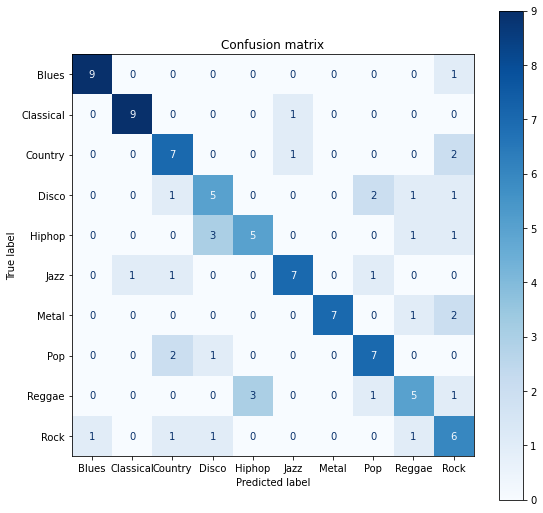

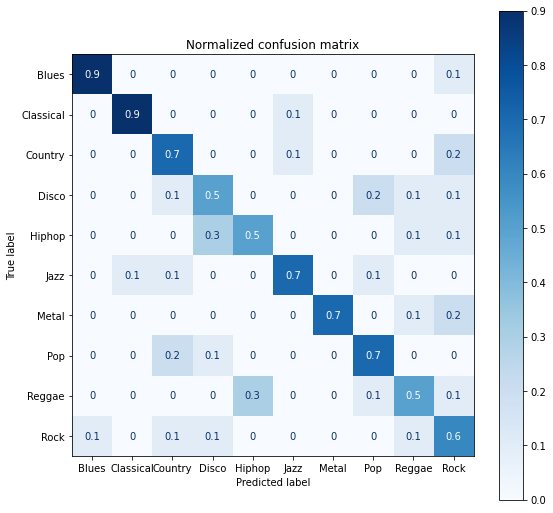

Accuracy score: 0.67 

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.90      0.90      0.90        10
           2       0.58      0.70      0.64        10
           3       0.50      0.50      0.50        10
           4       0.62      0.50      0.56        10
           5       0.78      0.70      0.74        10
           6       1.00      0.70      0.82        10
           7       0.64      0.70      0.67        10
           8       0.56      0.50      0.53        10
           9       0.43      0.60      0.50        10

    accuracy                           0.67       100
   macro avg       0.69      0.67      0.67       100
weighted avg       0.69      0.67      0.67       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

**k = 10**

In [ ]:
k_sel = SelectKBest(k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

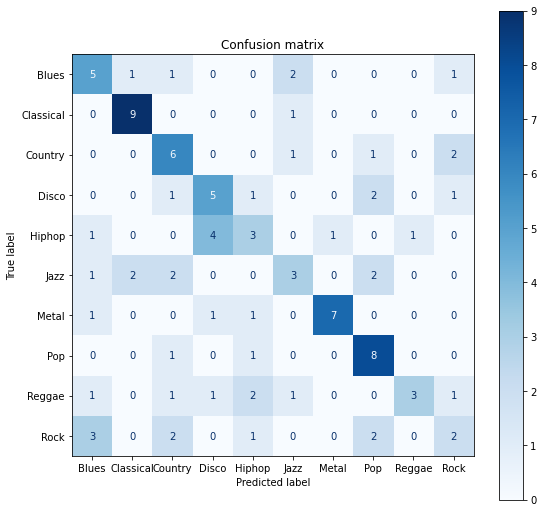

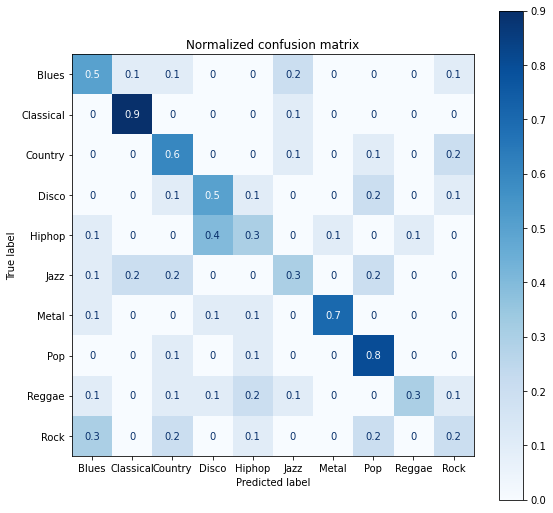

Accuracy score: 0.51 

Classification Report
              precision    recall  f1-score   support

           0       0.42      0.50      0.45        10
           1       0.75      0.90      0.82        10
           2       0.43      0.60      0.50        10
           3       0.45      0.50      0.48        10
           4       0.33      0.30      0.32        10
           5       0.38      0.30      0.33        10
           6       0.88      0.70      0.78        10
           7       0.53      0.80      0.64        10
           8       0.75      0.30      0.43        10
           9       0.29      0.20      0.24        10

    accuracy                           0.51       100
   macro avg       0.52      0.51      0.50       100
weighted avg       0.52      0.51      0.50       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

In [ ]:
k_sel = SelectKBest(mutual_info_classif, k = 10)

k_sel.fit(x_train, y_train)
k_sel.fit(x_test, y_test)

x_train_ksel = k_sel.transform(x_train)
x_test_ksel = k_sel.transform(x_test)

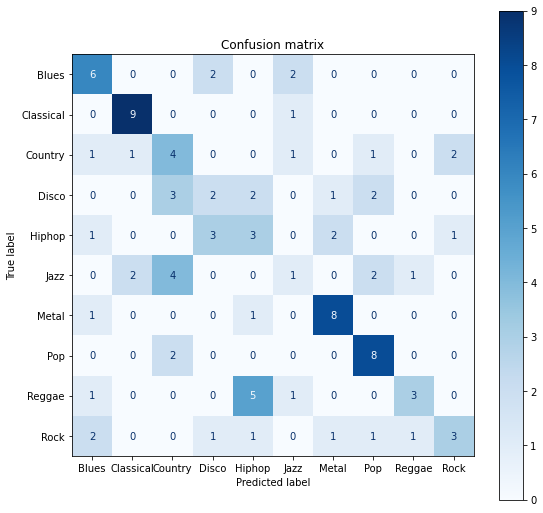

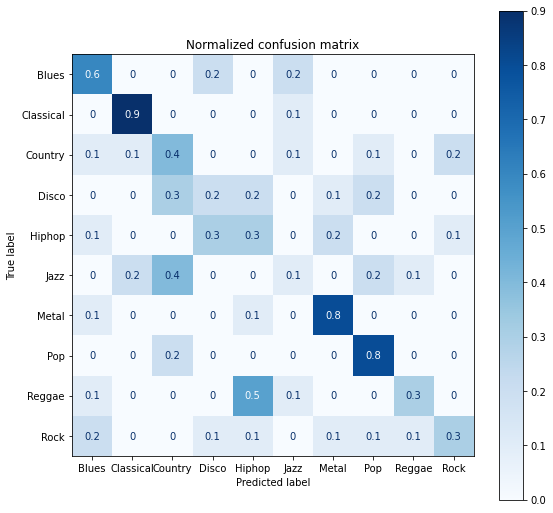

Accuracy score: 0.47 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.60      0.55        10
           1       0.75      0.90      0.82        10
           2       0.31      0.40      0.35        10
           3       0.25      0.20      0.22        10
           4       0.25      0.30      0.27        10
           5       0.17      0.10      0.12        10
           6       0.67      0.80      0.73        10
           7       0.57      0.80      0.67        10
           8       0.60      0.30      0.40        10
           9       0.50      0.30      0.37        10

    accuracy                           0.47       100
   macro avg       0.46      0.47      0.45       100
weighted avg       0.46      0.47      0.45       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_ksel, y_train)

y_pred = lda.predict(x_test_ksel)

print_results(lda, x_test_ksel, y_test, y_pred)

### Recursive Feature Elimination (RFE)
**n_features_to_select = 50**

In [ ]:
rfe = RFE(estimator = _lda.best_estimator_, n_features_to_select = 50)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

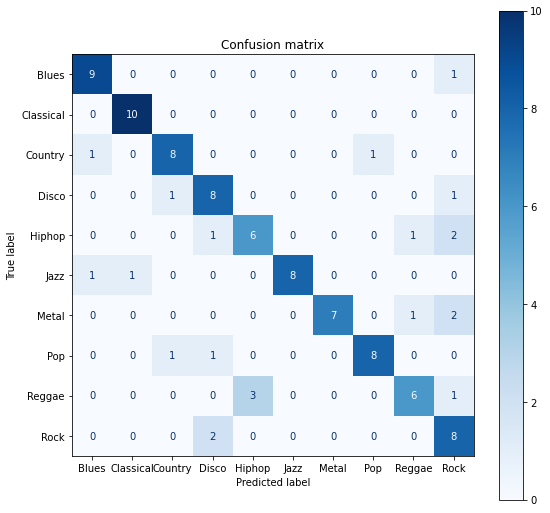

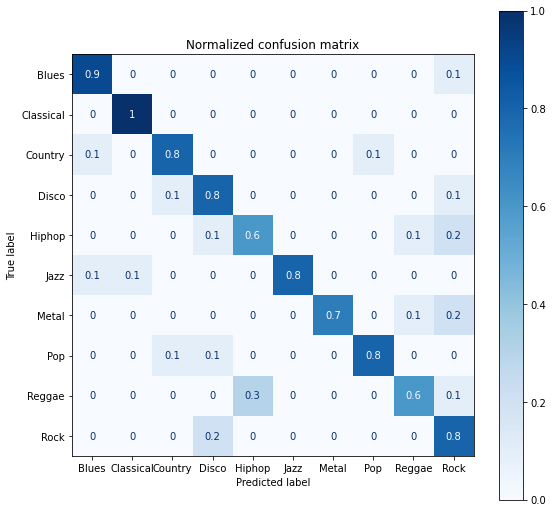

Accuracy score: 0.78 

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.67      0.80      0.73        10
           4       0.67      0.60      0.63        10
           5       1.00      0.80      0.89        10
           6       1.00      0.70      0.82        10
           7       0.89      0.80      0.84        10
           8       0.75      0.60      0.67        10
           9       0.53      0.80      0.64        10

    accuracy                           0.78       100
   macro avg       0.80      0.78      0.78       100
weighted avg       0.80      0.78      0.78       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_rfe, y_train)

y_pred = lda.predict(x_test_rfe)

print_results(lda, x_test_rfe, y_test, y_pred)

**n_features_to_select = 40**

In [ ]:
rfe = RFE(estimator = _lda.best_estimator_, n_features_to_select = 40)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

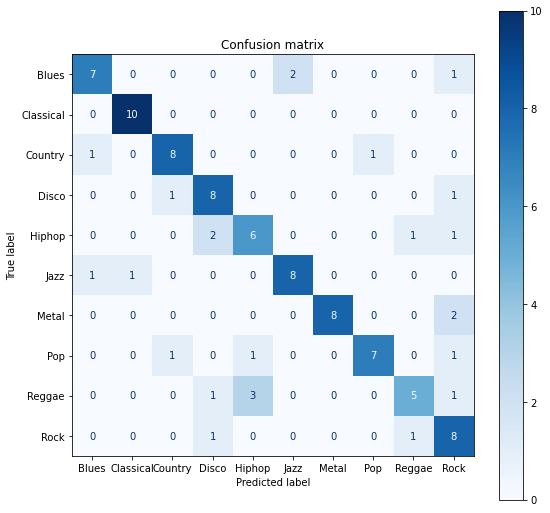

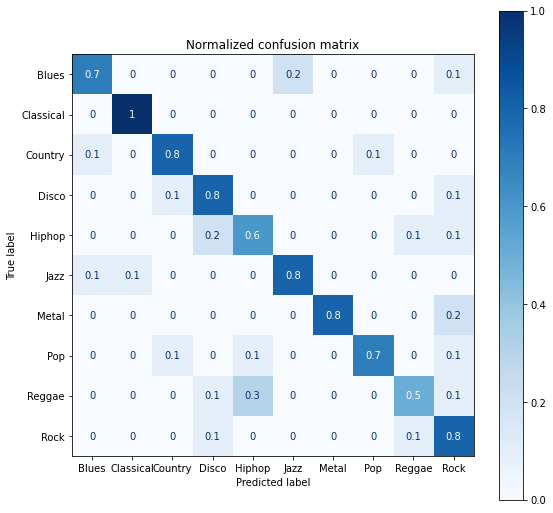

Accuracy score: 0.75 

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.70      0.74        10
           1       0.91      1.00      0.95        10
           2       0.80      0.80      0.80        10
           3       0.67      0.80      0.73        10
           4       0.60      0.60      0.60        10
           5       0.80      0.80      0.80        10
           6       1.00      0.80      0.89        10
           7       0.88      0.70      0.78        10
           8       0.71      0.50      0.59        10
           9       0.53      0.80      0.64        10

    accuracy                           0.75       100
   macro avg       0.77      0.75      0.75       100
weighted avg       0.77      0.75      0.75       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_rfe, y_train)

y_pred = lda.predict(x_test_rfe)

print_results(lda, x_test_rfe, y_test, y_pred)

**n_features_to_select = 30**


In [ ]:
rfe = RFE(estimator = _lda.best_estimator_, n_features_to_select = 30)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

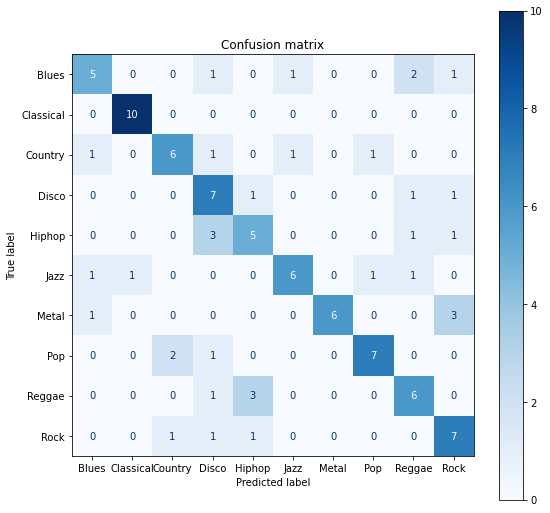

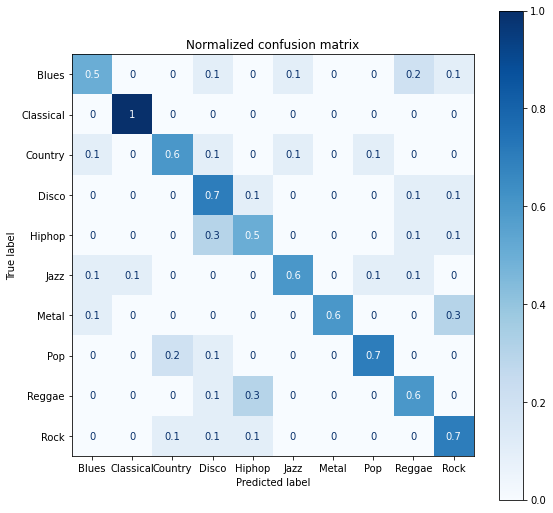

Accuracy score: 0.65 

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.50      0.56        10
           1       0.91      1.00      0.95        10
           2       0.67      0.60      0.63        10
           3       0.47      0.70      0.56        10
           4       0.50      0.50      0.50        10
           5       0.75      0.60      0.67        10
           6       1.00      0.60      0.75        10
           7       0.78      0.70      0.74        10
           8       0.55      0.60      0.57        10
           9       0.54      0.70      0.61        10

    accuracy                           0.65       100
   macro avg       0.68      0.65      0.65       100
weighted avg       0.68      0.65      0.65       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_rfe, y_train)

y_pred = lda.predict(x_test_rfe)

print_results(lda, x_test_rfe, y_test, y_pred)

**n_features_to_select = 20**

In [ ]:
rfe = RFE(estimator = _lda.best_estimator_, n_features_to_select = 20)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

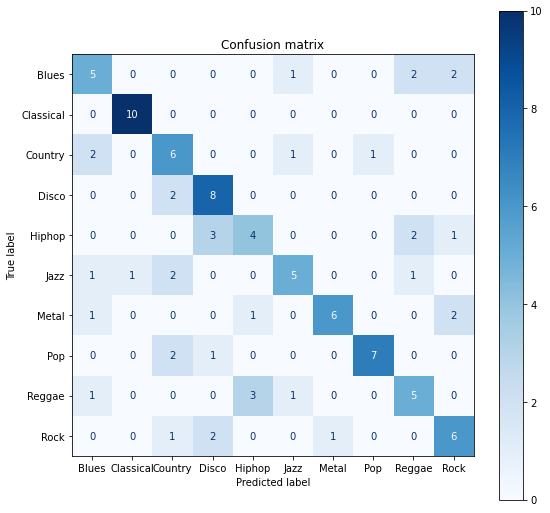

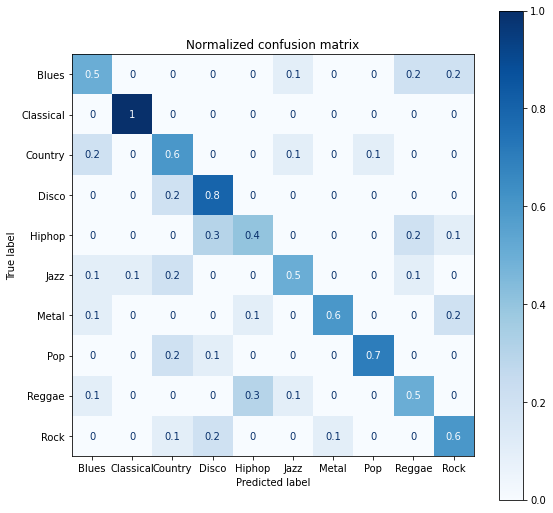

Accuracy score: 0.62 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.50      0.50        10
           1       0.91      1.00      0.95        10
           2       0.46      0.60      0.52        10
           3       0.57      0.80      0.67        10
           4       0.50      0.40      0.44        10
           5       0.62      0.50      0.56        10
           6       0.86      0.60      0.71        10
           7       0.88      0.70      0.78        10
           8       0.50      0.50      0.50        10
           9       0.55      0.60      0.57        10

    accuracy                           0.62       100
   macro avg       0.63      0.62      0.62       100
weighted avg       0.63      0.62      0.62       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_rfe, y_train)

y_pred = lda.predict(x_test_rfe)

print_results(lda, x_test_rfe, y_test, y_pred)

**n_features_to_select = 10**

In [ ]:
rfe = RFE(estimator = _lda.best_estimator_, n_features_to_select = 10)
rfe.fit(x_train, y_train)
rfe.fit(x_test, y_test)

x_train_rfe = rfe.transform(x_train)
x_test_rfe = rfe.transform(x_test)

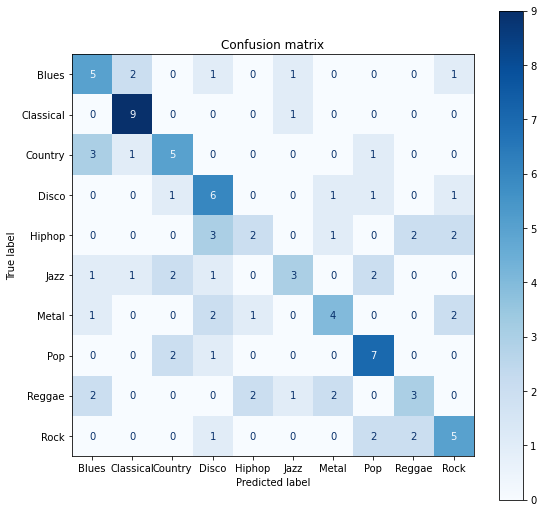

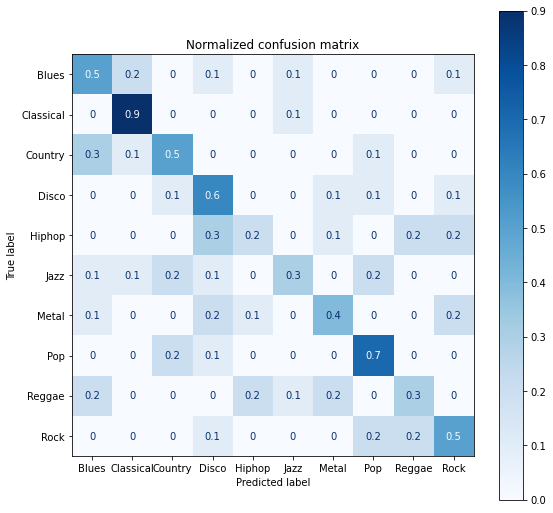

Accuracy score: 0.49 

Classification Report
              precision    recall  f1-score   support

           0       0.42      0.50      0.45        10
           1       0.69      0.90      0.78        10
           2       0.50      0.50      0.50        10
           3       0.40      0.60      0.48        10
           4       0.40      0.20      0.27        10
           5       0.50      0.30      0.37        10
           6       0.50      0.40      0.44        10
           7       0.54      0.70      0.61        10
           8       0.43      0.30      0.35        10
           9       0.45      0.50      0.48        10

    accuracy                           0.49       100
   macro avg       0.48      0.49      0.47       100
weighted avg       0.48      0.49      0.47       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_rfe, y_train)

y_pred = lda.predict(x_test_rfe)

print_results(lda, x_test_rfe, y_test, y_pred)

### Select features based on importance weights

In [ ]:
selector = SelectFromModel(estimator = _lda.best_estimator_)
selector.fit(x_train, y_train)
selector.fit(x_test, y_test)

x_train_sfm = selector.transform(x_train)
x_test_sfm = selector.transform(x_test)

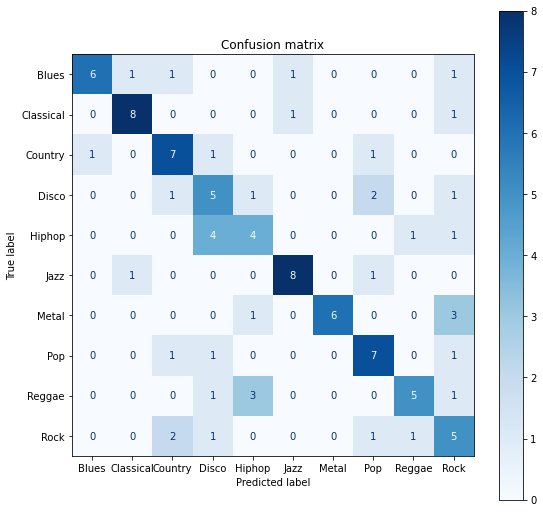

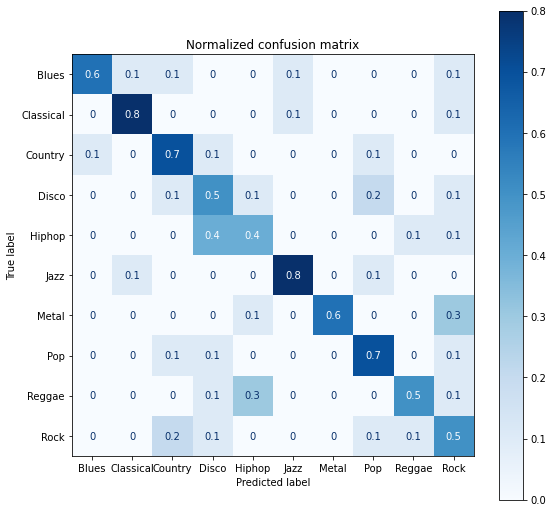

Accuracy score: 0.61 

Classification Report
              precision    recall  f1-score   support

           0       0.86      0.60      0.71        10
           1       0.80      0.80      0.80        10
           2       0.58      0.70      0.64        10
           3       0.38      0.50      0.43        10
           4       0.44      0.40      0.42        10
           5       0.80      0.80      0.80        10
           6       1.00      0.60      0.75        10
           7       0.58      0.70      0.64        10
           8       0.71      0.50      0.59        10
           9       0.36      0.50      0.42        10

    accuracy                           0.61       100
   macro avg       0.65      0.61      0.62       100
weighted avg       0.65      0.61      0.62       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_sfm, y_train)

y_pred = lda.predict(x_test_sfm)

print_results(lda, x_test_sfm, y_test, y_pred)

### PCA

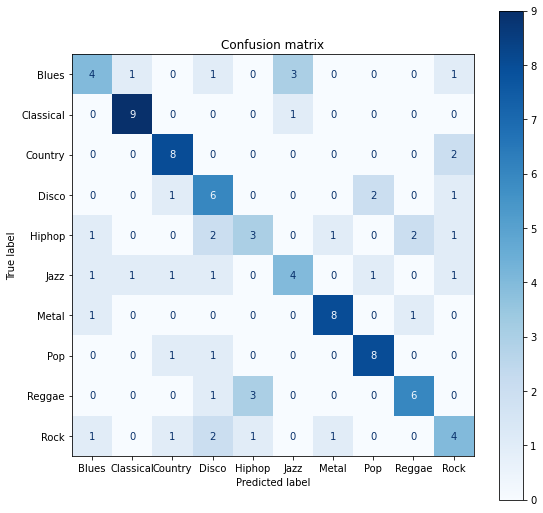

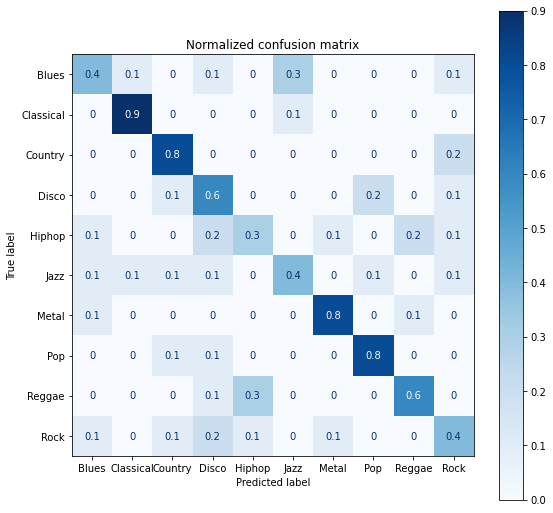

Accuracy score: 0.6 

Classification Report
              precision    recall  f1-score   support

           0       0.50      0.40      0.44        10
           1       0.82      0.90      0.86        10
           2       0.67      0.80      0.73        10
           3       0.43      0.60      0.50        10
           4       0.43      0.30      0.35        10
           5       0.50      0.40      0.44        10
           6       0.80      0.80      0.80        10
           7       0.73      0.80      0.76        10
           8       0.67      0.60      0.63        10
           9       0.40      0.40      0.40        10

    accuracy                           0.60       100
   macro avg       0.59      0.60      0.59       100
weighted avg       0.59      0.60      0.59       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_pca, y_train)

y_pred = lda.predict(x_test_pca)

print_results(lda, x_test_pca, y_test, y_pred)

### LDA

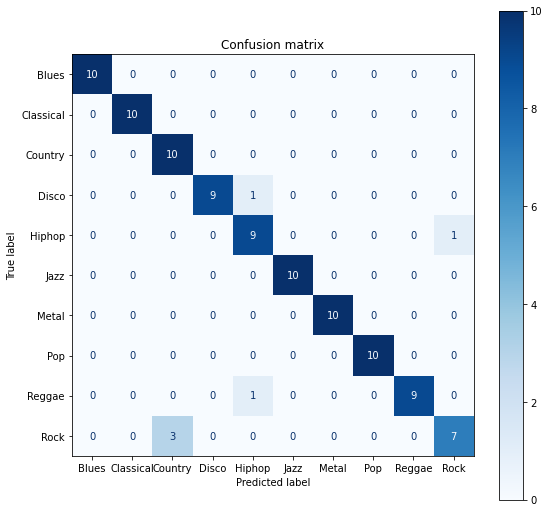

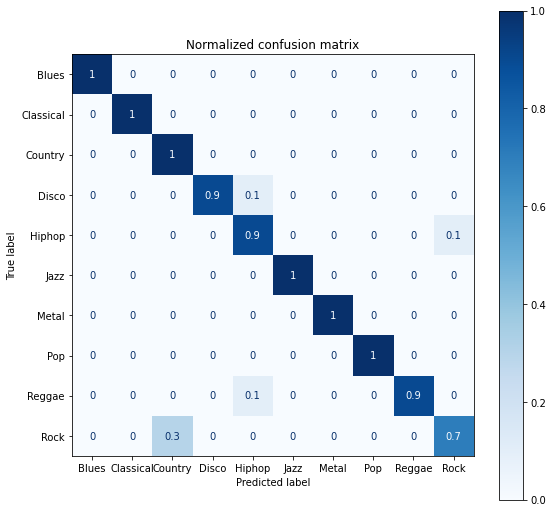

Accuracy score: 0.94 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       0.77      1.00      0.87        10
           3       1.00      0.90      0.95        10
           4       0.82      0.90      0.86        10
           5       1.00      1.00      1.00        10
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        10
           8       1.00      0.90      0.95        10
           9       0.88      0.70      0.78        10

    accuracy                           0.94       100
   macro avg       0.95      0.94      0.94       100
weighted avg       0.95      0.94      0.94       100



In [ ]:
lda = _lda.best_estimator_
lda.fit(x_train_lda, y_train)

y_pred = lda.predict(x_test_lda)

print_results(lda, x_test_lda, y_test, y_pred)